# # Wikimedia Statistics: 

## * Wikimedia Statistics `--all-metrics`:

**<u>1. Reading Metrics**:</u>
  - Total page views. 
  - Legacy page views.
  - Page views by country.
  - Unique devices. 
  - Top viewed articles.
  
  
**<u>2. Content Metrics**:</u>
  - Absolute bytes differences. 
  - **Edited pages**.
  - Network bytes difference. 
  - **Pages to date**.
  - Total media requests. 
  - Top files by media requests. 
    
    
**<u>3. Contributing Metrics**:</u>
  - **Editors**.
  - **Active editors**.
  - **Edits**.
  - **User edits**.
  - **New pages**.
  - **New registered users**.
  - **Top editors**.
  - **Top edited pages**.
  - **Active editors by country**.
  
<html> &emsp; &emsp; &emsp; <i> *<u>P.S:</u> only <b>bold bullets</b> are covered here!</i> </html> 

## * Settings & Installations:

In [1]:
%matplotlib inline

import sys , time
start_time = time.time()

! rm -f *.log
! rm -rf *-PNGs
! rm -rf *-CSVs

! mkdir -p Wikimedia-Stats-PNGs
! mkdir -p Wikimedia-Stats-CSVs

! {sys.executable} -m pip install -q matplotlib pandas 
! {sys.executable} -m pip install -q selenium==3.141.0

## A. Content Metrics:

### i. Pages to Date:

In [2]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Pages to Date `--no-filters`:

## English -- Raw Fetched Screenshot --uncropped:


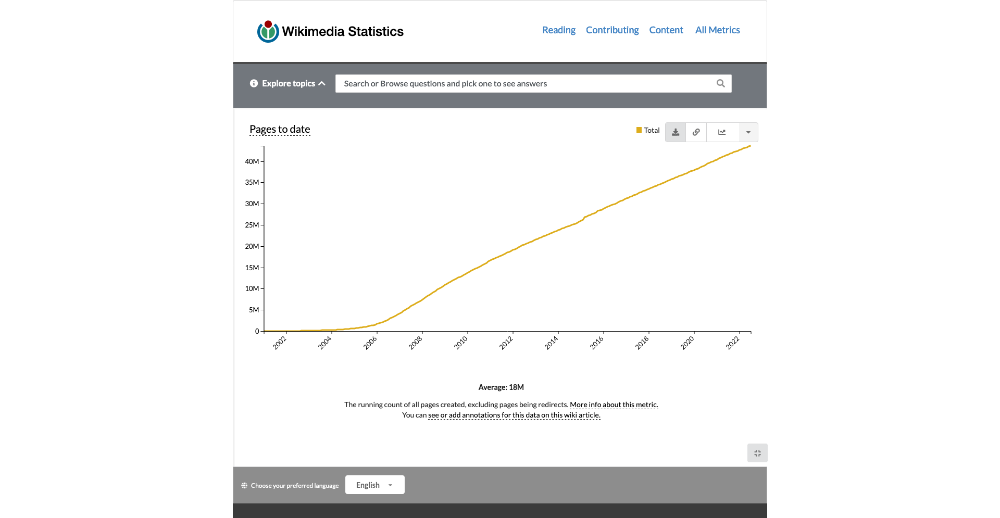

## English -- Pages to Date --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           65  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          226  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z     43463789  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z     43622411  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


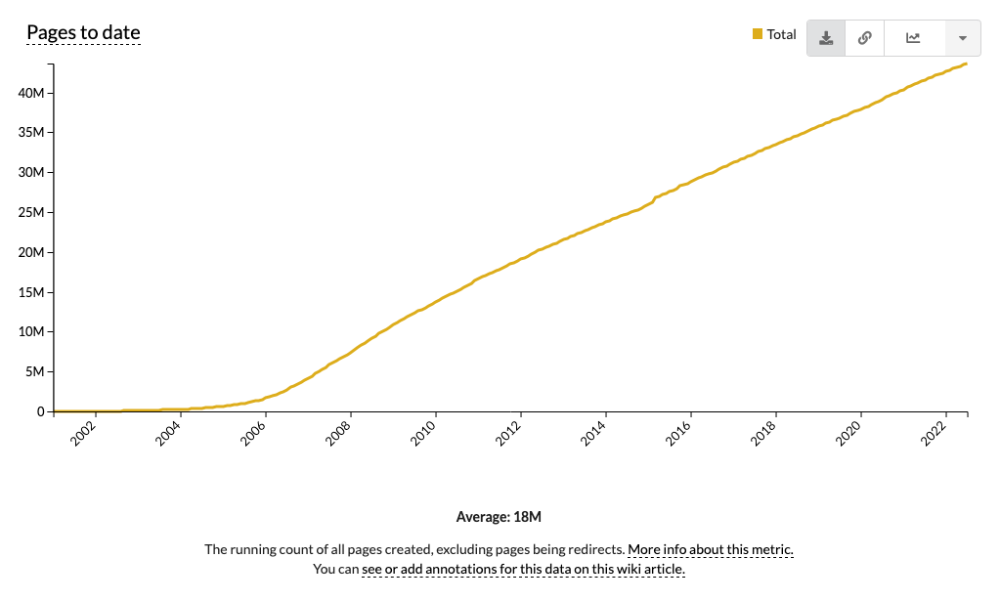

## Arabic -- Pages to Date --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          591  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          591  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      6681482  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      6718522  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


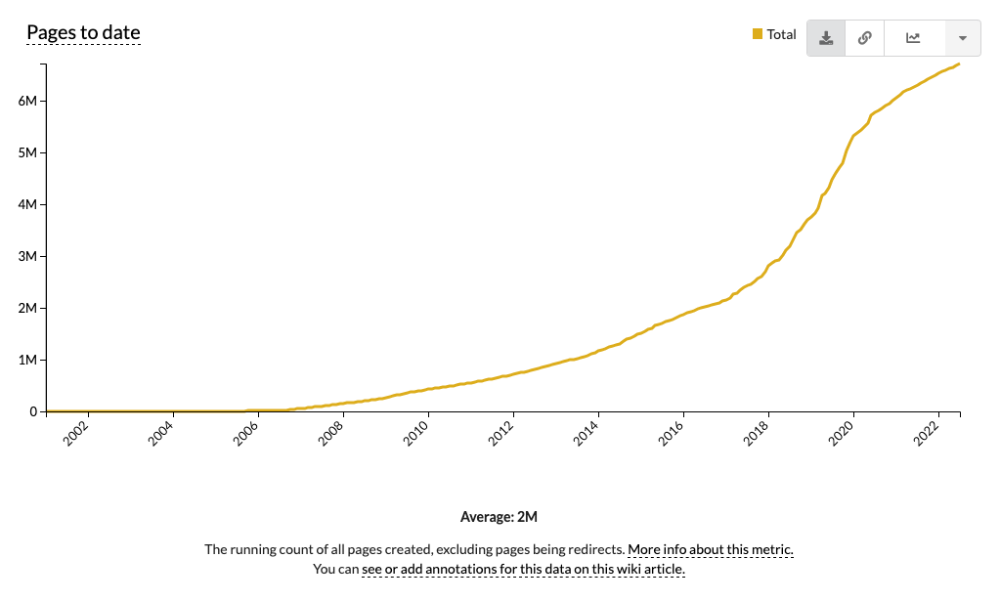

## Egyptian Arabic -- Pages to Date --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      1959214  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      1984025  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


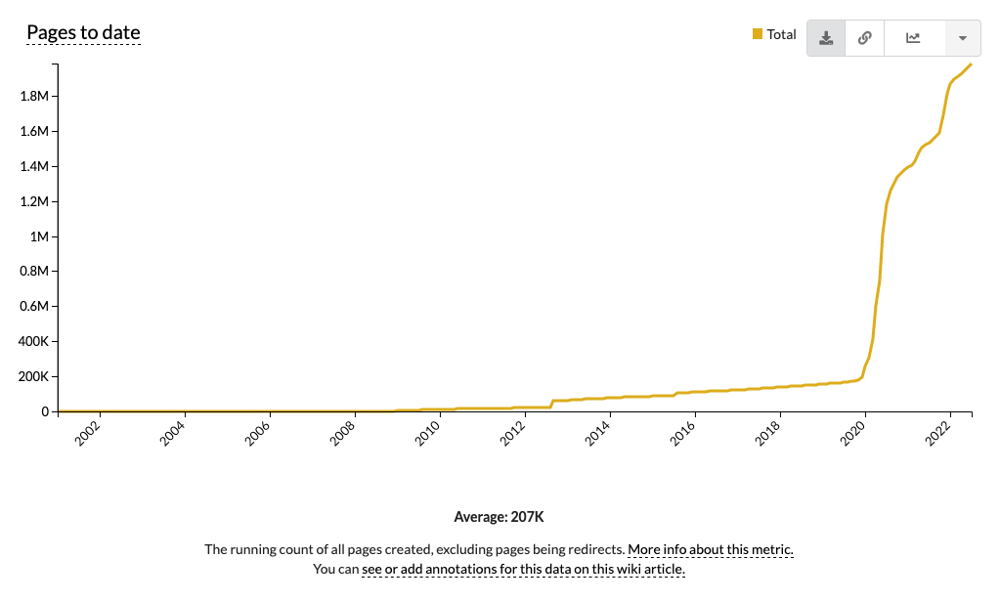

## Moroccan Arabic -- Pages to Date --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        26157  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        26626  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


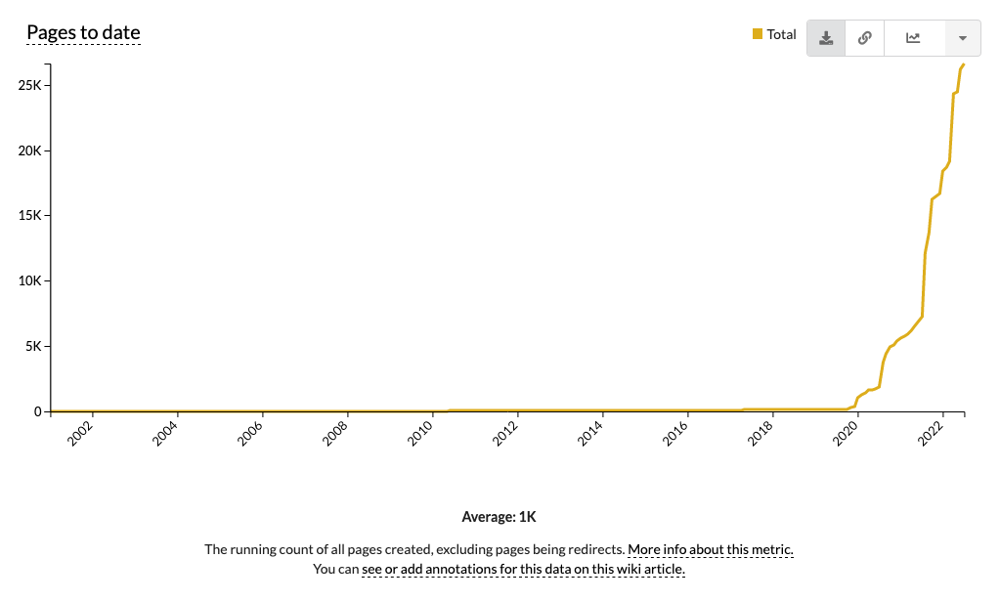

In [3]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/pages-to-date/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/pages-to-date--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/pages-to-date--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)
    
    if wiki=='en':
        print("\033[1m## English -- Raw Fetched Screenshot --uncropped:")
        display(pyImage(filename="Wikimedia-Stats-PNGs/pages-to-date--no-filters--en.png"))
    
    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Pages to Date --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName)) 

#### 2. Pages to Date `--page-type`:

## English -- Pages to Date --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                 28             37  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                 51            175  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z           36945305        6518484  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z           37088260        6534151  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


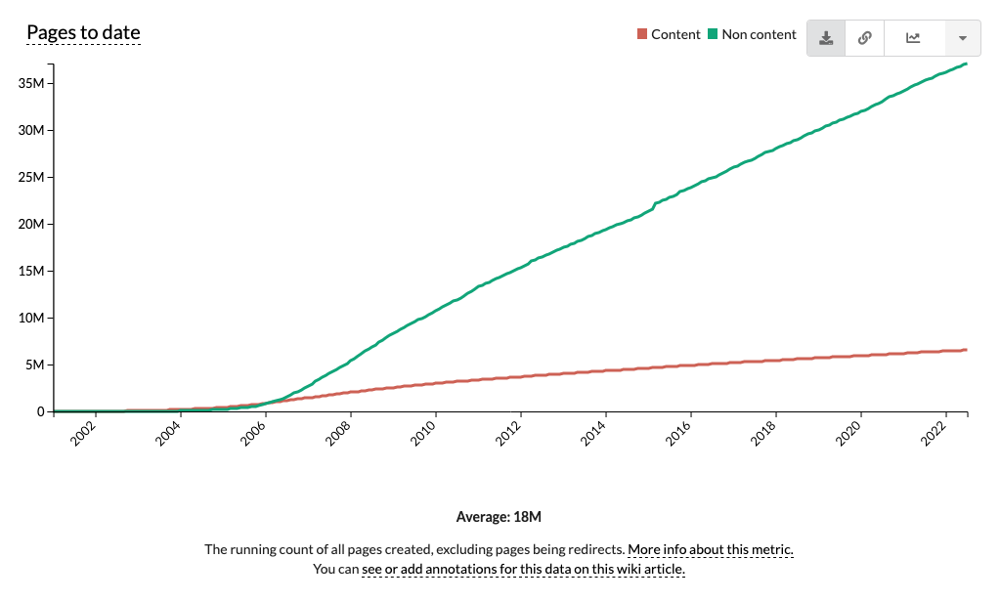

## Arabic -- Pages to Date --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0            591  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0            591  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            5508072        1173410  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z            5538121        1180401  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


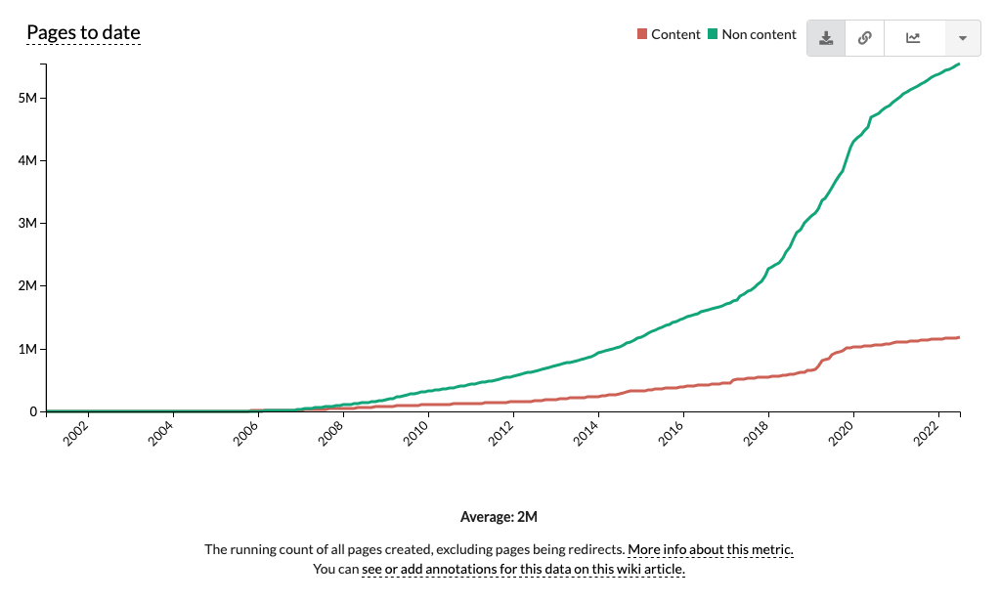

## Egyptian Arabic -- Pages to Date --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z             372686        1586528  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z             388496        1595529  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


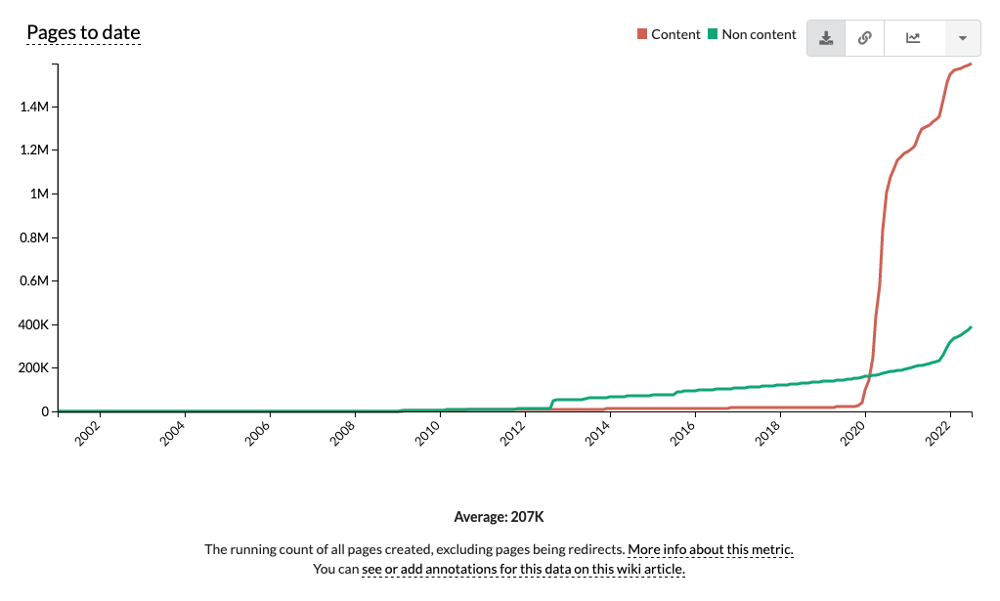

## Moroccan Arabic -- Pages to Date --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              20594           5563  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              20933           5693  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


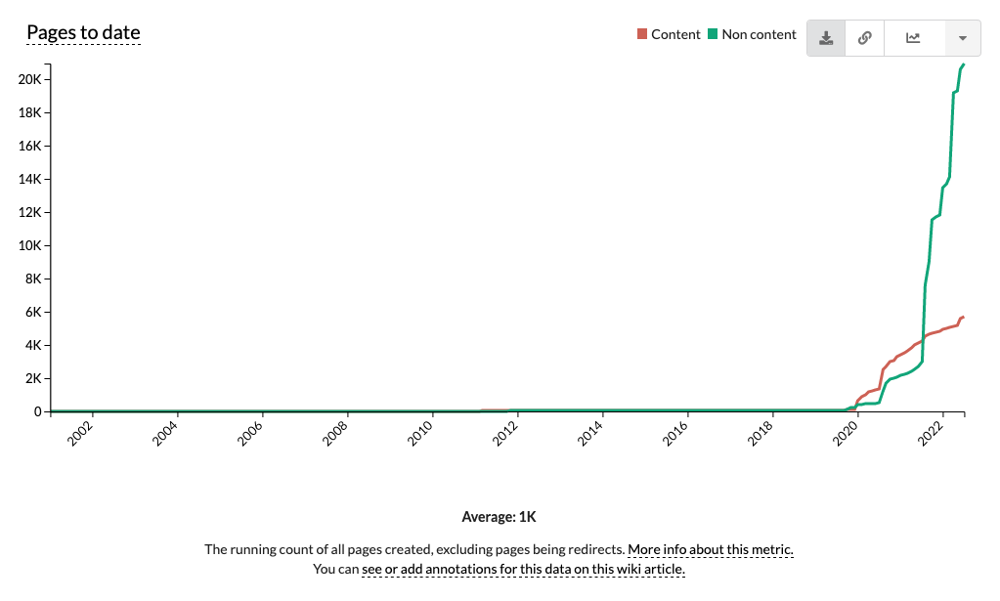

In [4]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/pages-to-date/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/pages-to-date--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/pages-to-date--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)
 
    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Pages to Date --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName)) 

#### 3. Pages to Date `--editor-type`:

## English -- Pages to Date --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          51                0               14               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z         195                0               31               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z    36619439          4175184           679758         1989408  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z    36768780          4181372           682294         1989965  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


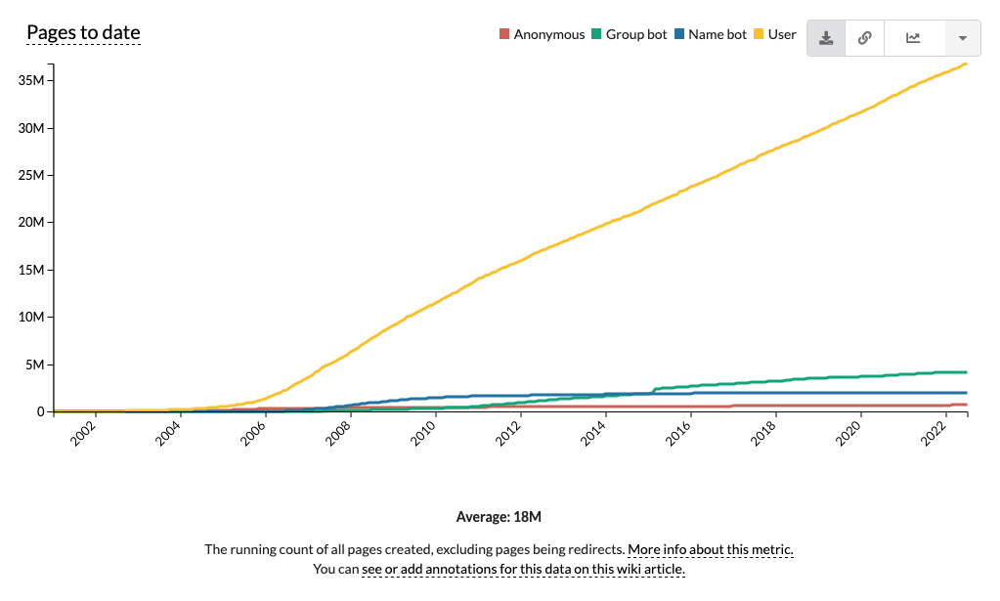

## Arabic -- Pages to Date --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           4                0              587               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           4                0              587               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z     1440933          5017198            38445          184906  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z     1448887          5046211            38514          184910  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


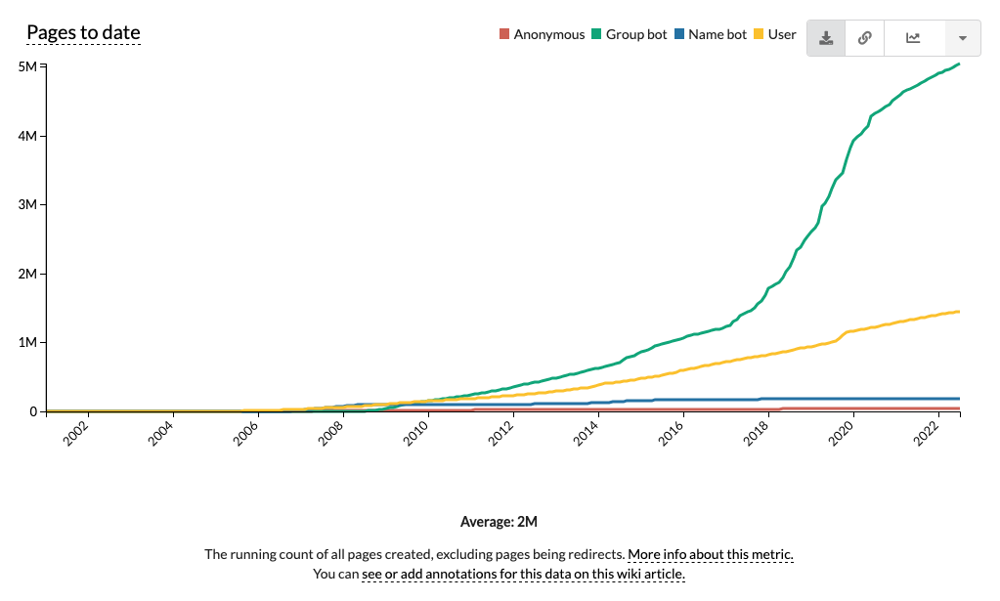

## Egyptian Arabic -- Pages to Date --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z     1828804           125490             4608             312  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z     1853486           125613             4614             312  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


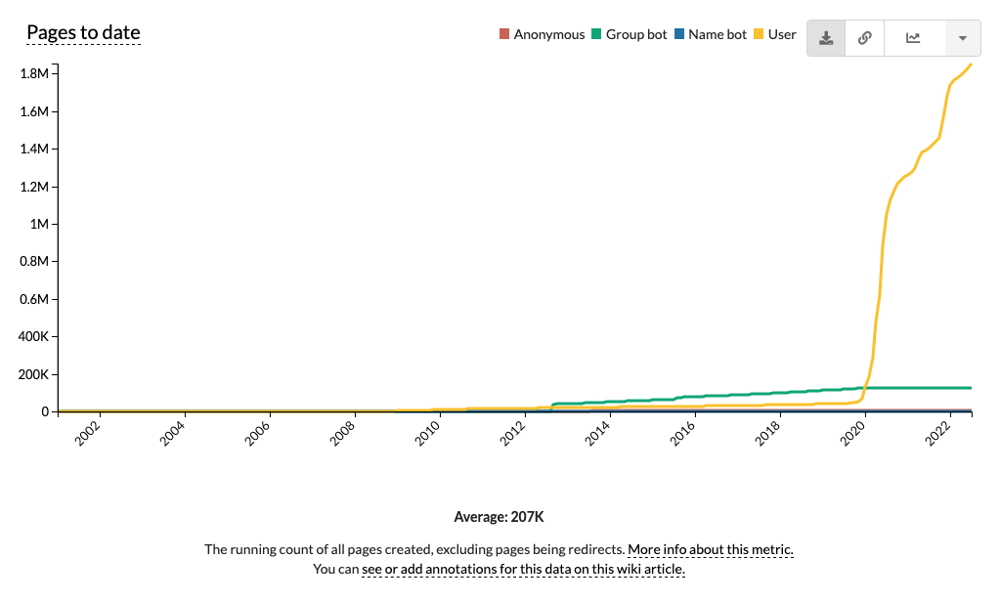

## Moroccan Arabic -- Pages to Date --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        9660            16341              156               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        9882            16586              158               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


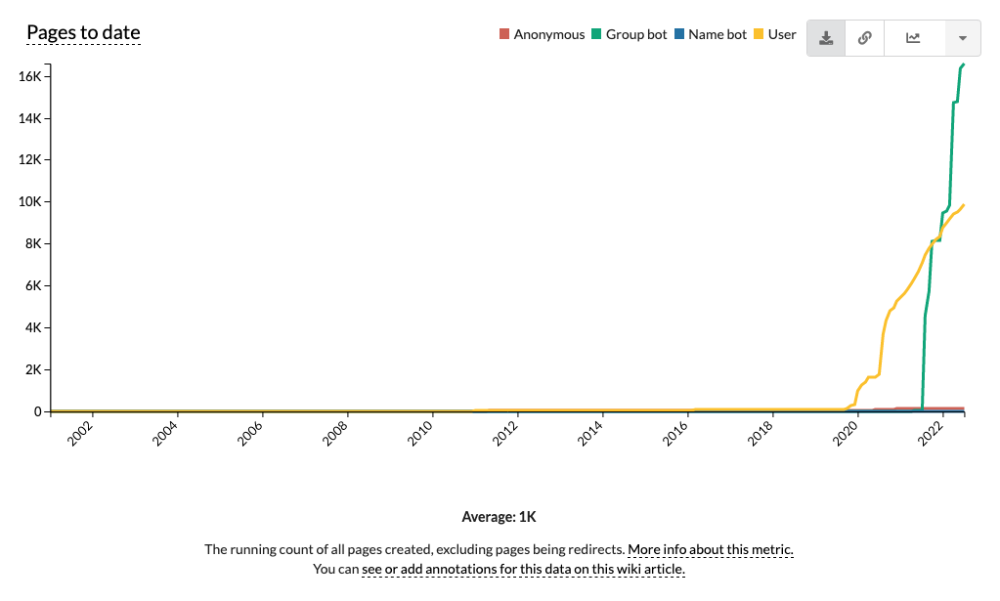

In [5]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/pages-to-date/full|line|all|editor_type~anonymous*group-bot*name-bot*user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/pages-to-date--editor-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/pages-to-date--editor-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)
    
    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Pages to Date --editor-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### ii. Edited Pages:

In [6]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Edited Pages `--no-filters`:

## English -- Edited Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           65  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          175  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      1720008  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      2406030  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


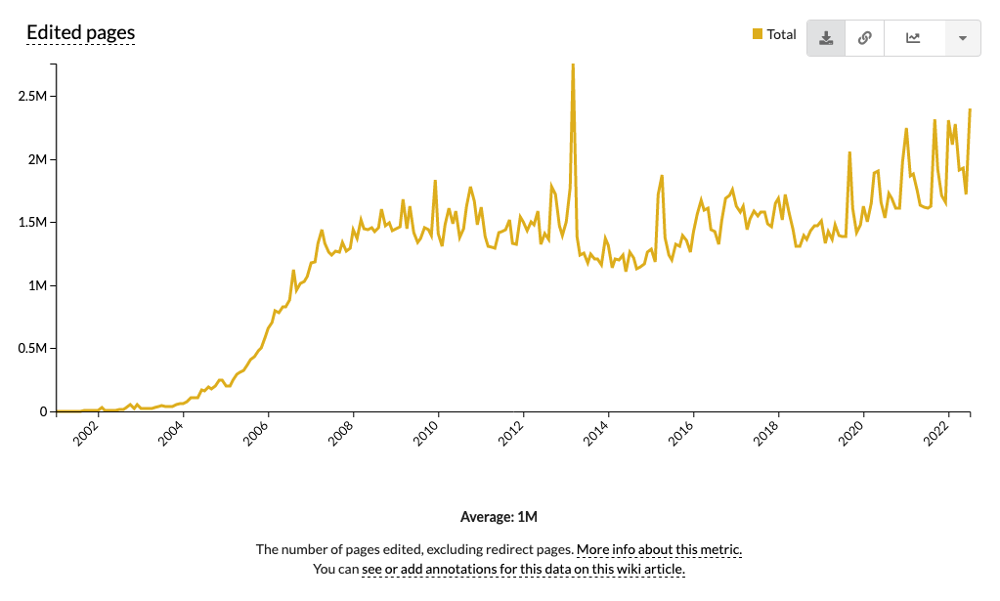

## Arabic -- Edited Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       136919  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       192448  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


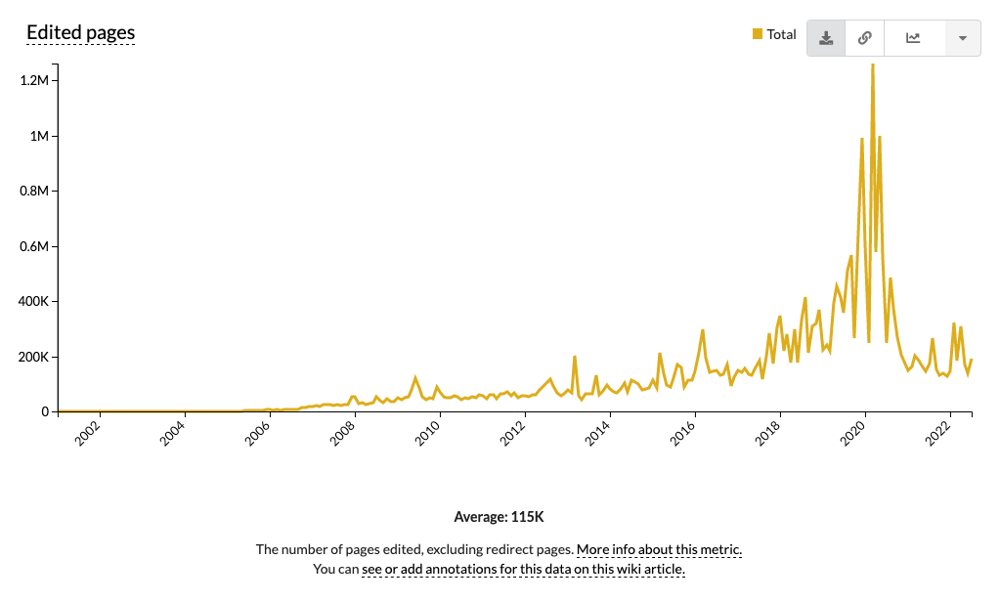

## Egyptian Arabic -- Edited Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        53283  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        37857  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


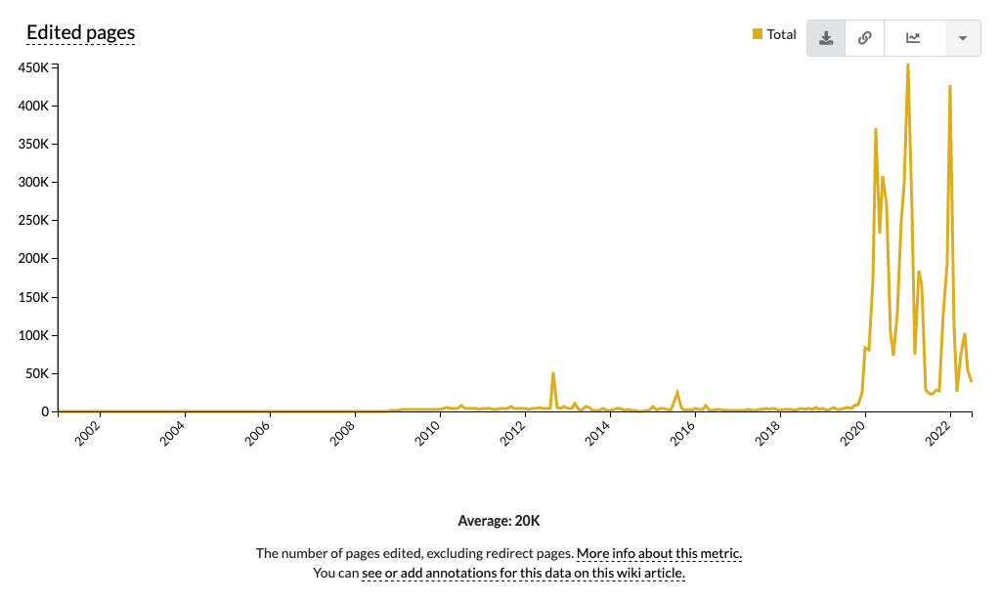

## Moroccan Arabic -- Edited Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         2012  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         2353  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


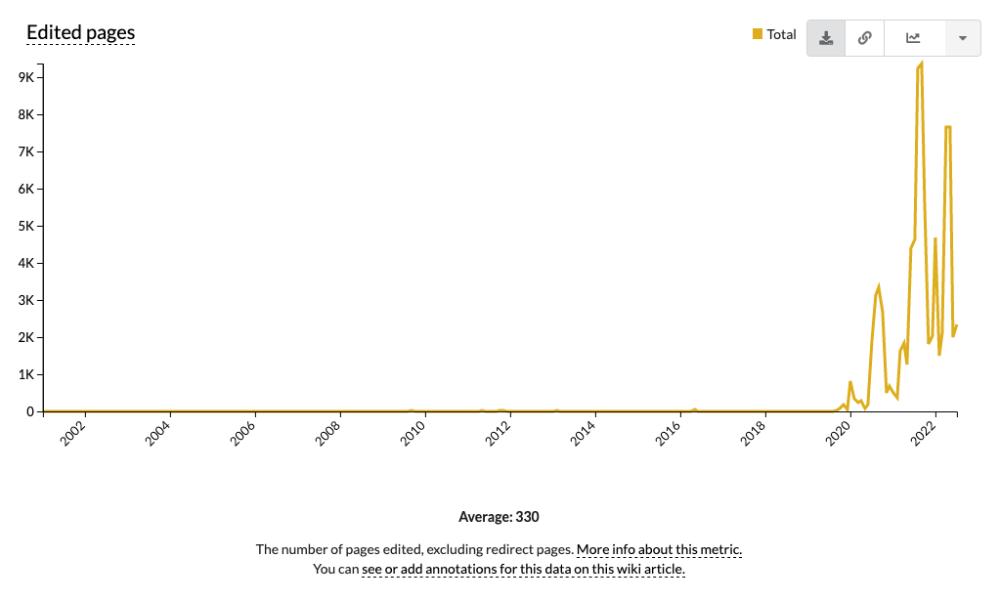

In [7]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/edited-pages/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edited-pages--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/edited-pages--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)
    
    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Edited Pages --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Edited Pages `--page-type`:

## English -- Edited Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                 28             37  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                 29            146  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z             573311        1146697  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z            1301428        1104602  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


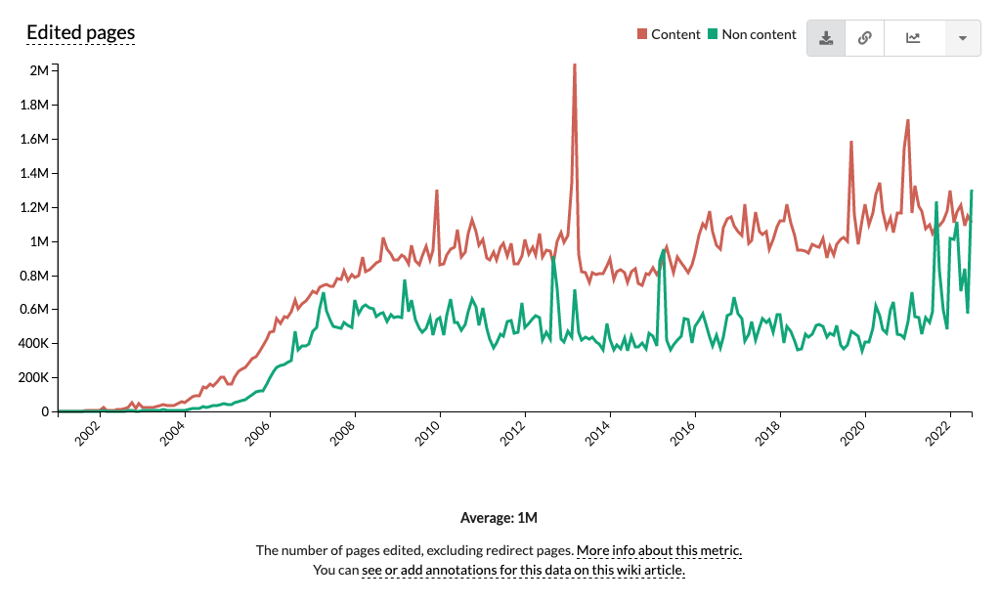

## Arabic -- Edited Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              47540          89379  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              51395         141053  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


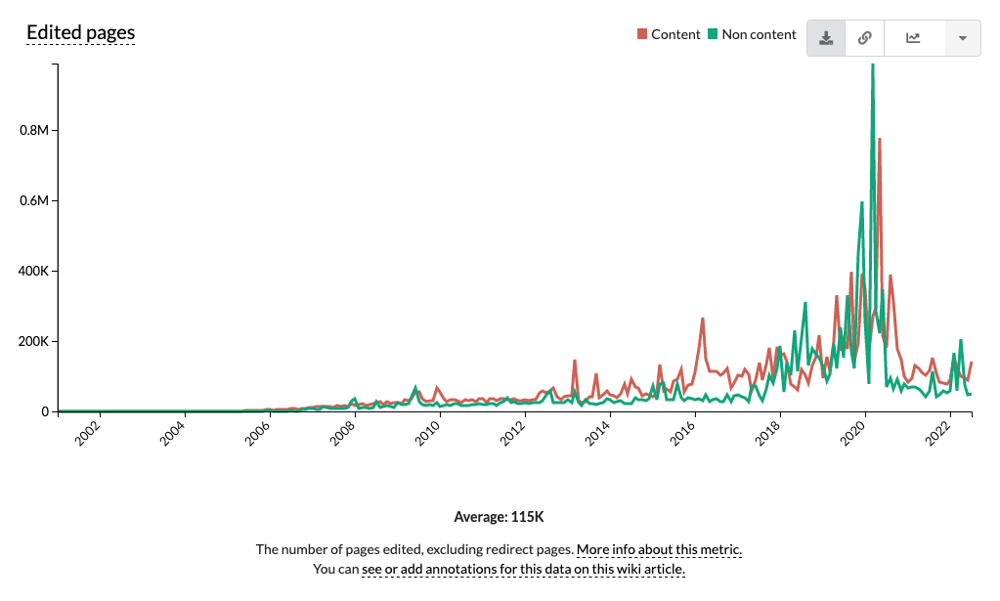

## Egyptian Arabic -- Edited Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              11905          41378  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              15966          21891  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


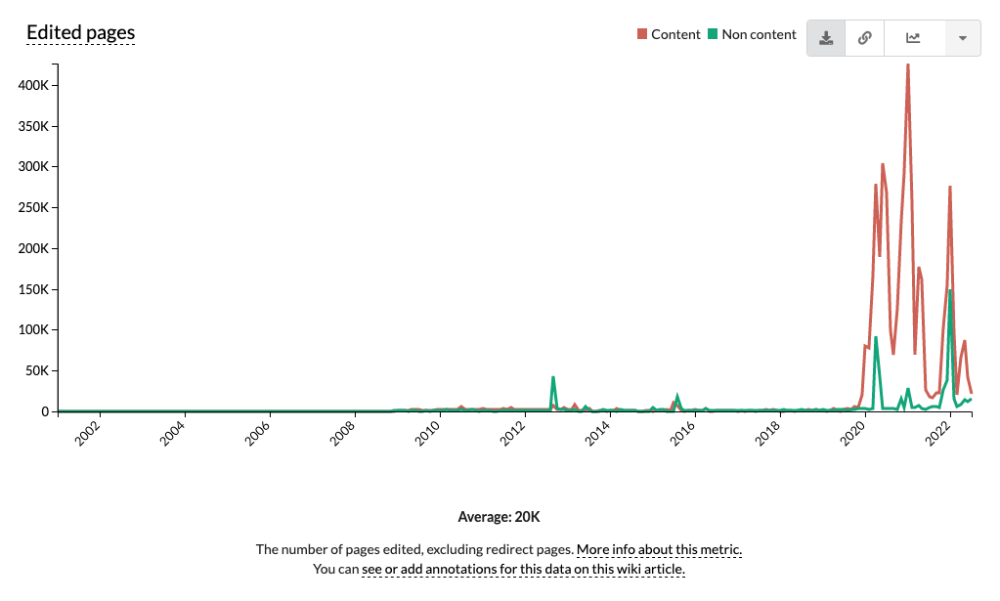

## Moroccan Arabic -- Edited Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               1418            594  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                907           1446  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


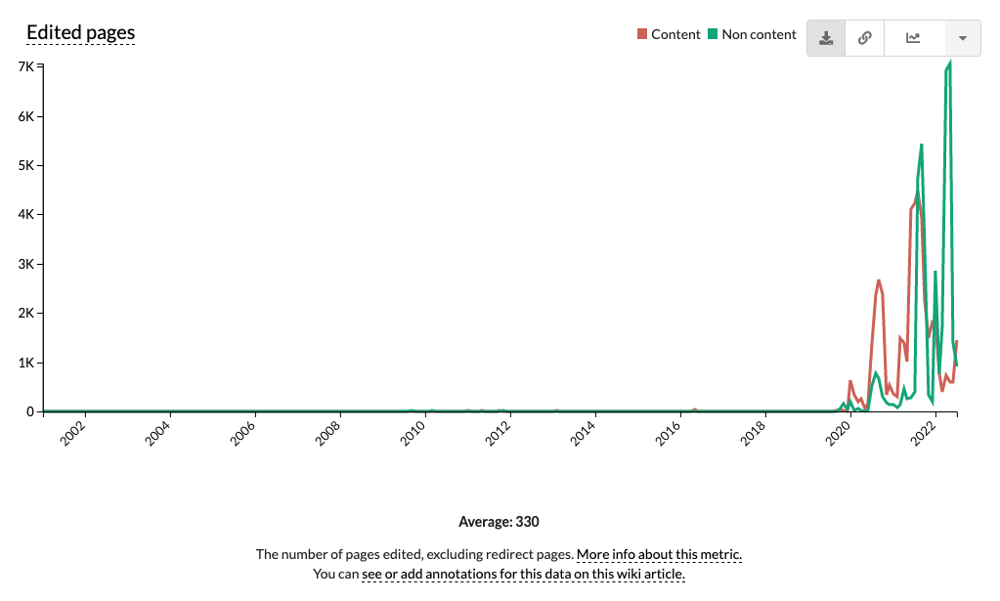

In [8]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/edited-pages/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edited-pages--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/edited-pages--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Edited Pages --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Edited Pages `--editor-type`:

## English -- Edited Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          52                0               18               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z         159                0               26               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z     1292405           469450           263471            1825  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z     1298285          1113447           268590            1451  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


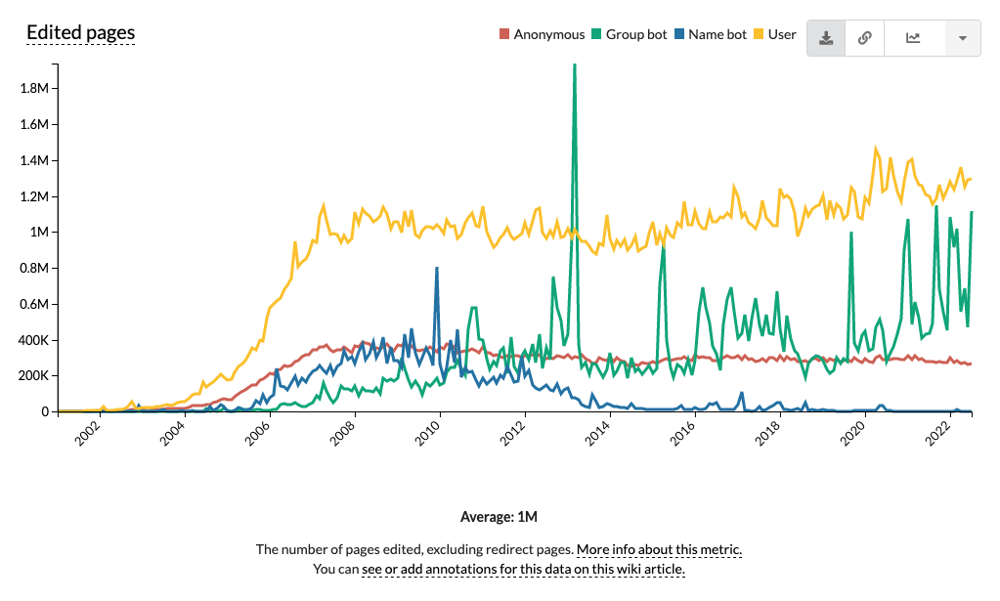

## Arabic -- Edited Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       34107           113467             6646               3  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       35897           170423             6509              24  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


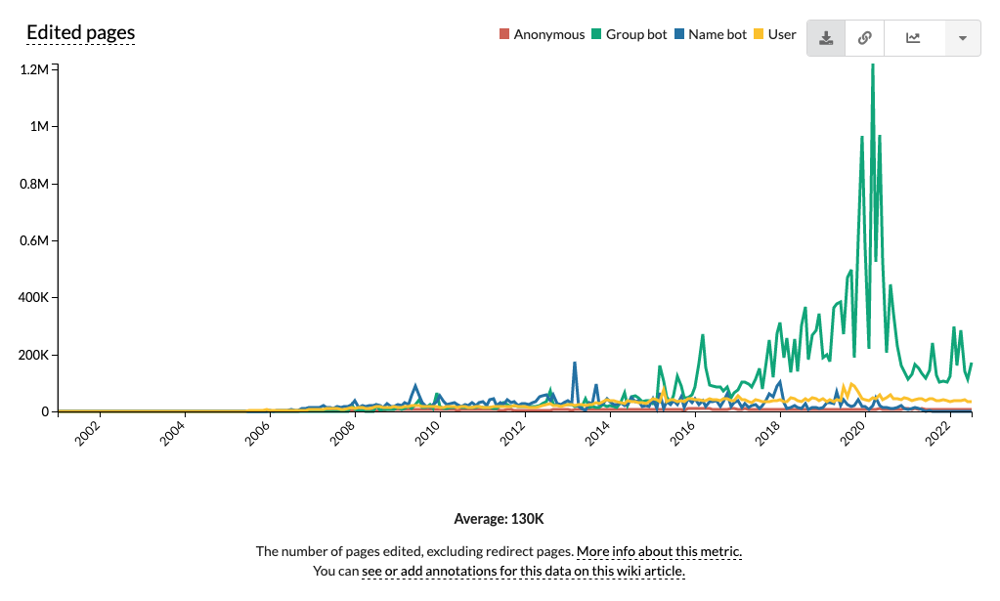

## Egyptian Arabic -- Edited Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       19145            34759              274               5  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       26221            11776              264               5  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


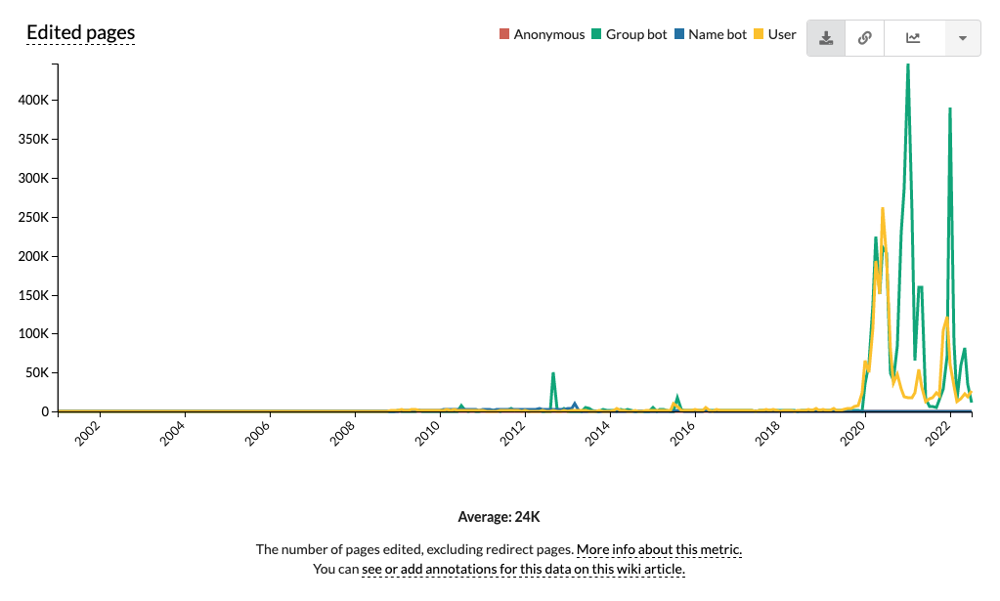

## Moroccan Arabic -- Edited Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         339             1767               36               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         494             2068               19               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


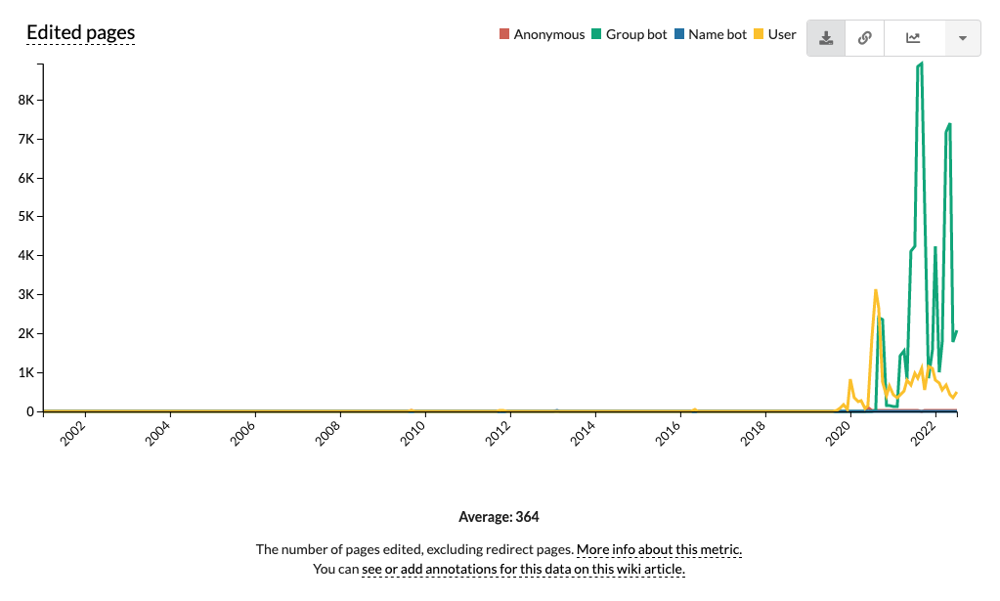

In [9]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/edited-pages/full|line|all|editor_type~anonymous*group-bot*name-bot*user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edited-pages--editor-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/edited-pages--editor-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Edited Pages --editor-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 4. Edited Pages `--activity-level`:

## English -- Edited Pages --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  8                57                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                 10               165                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               1825             157704           1542935               17544  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z               1914             158951           2226819               18346  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


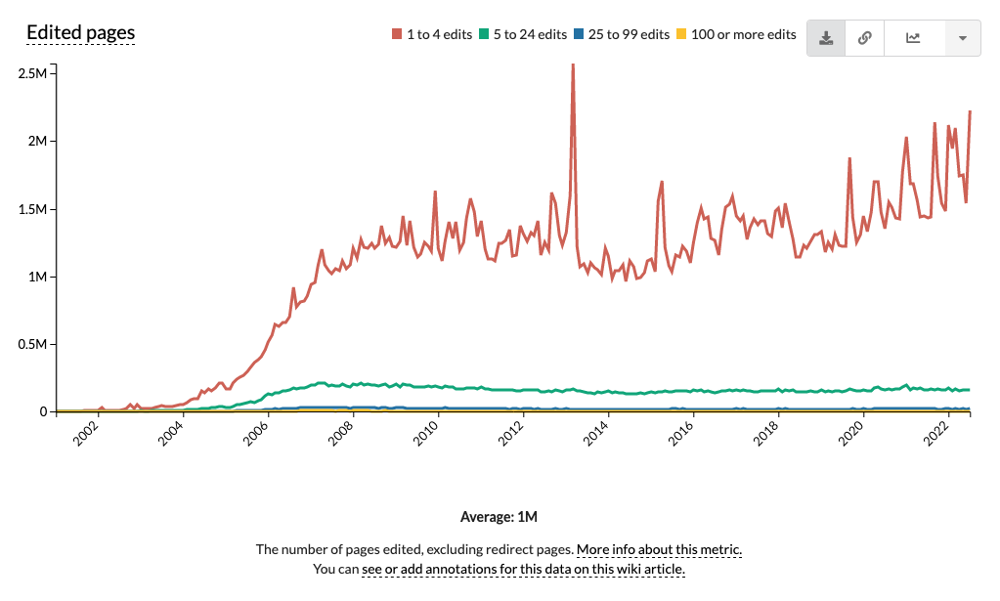

## Arabic -- Edited Pages --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                 37               7140            129414                 328  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                 48               8452            183543                 405  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


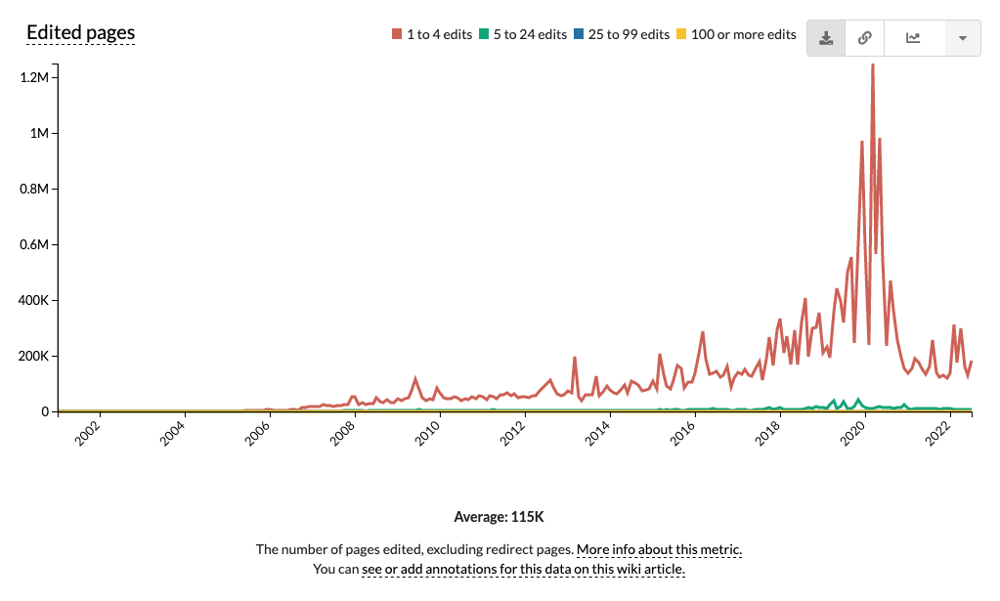

## Egyptian Arabic -- Edited Pages --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                  0                235             53041                   7  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                  0                 68             37784                   5  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000

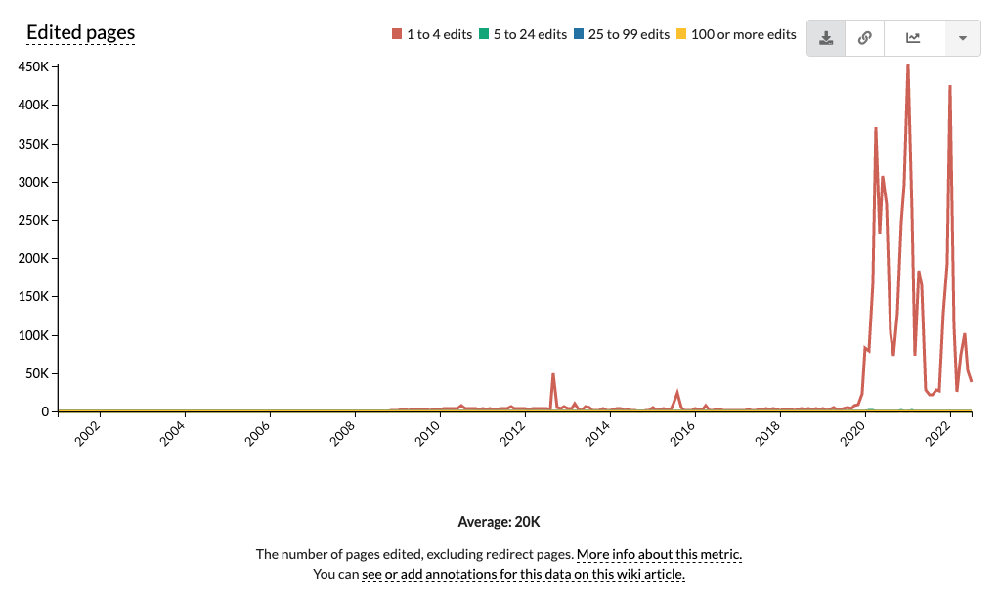

## Moroccan Arabic -- Edited Pages --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                  0                 57              1951                   4  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                  1                201              2148                   3  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000

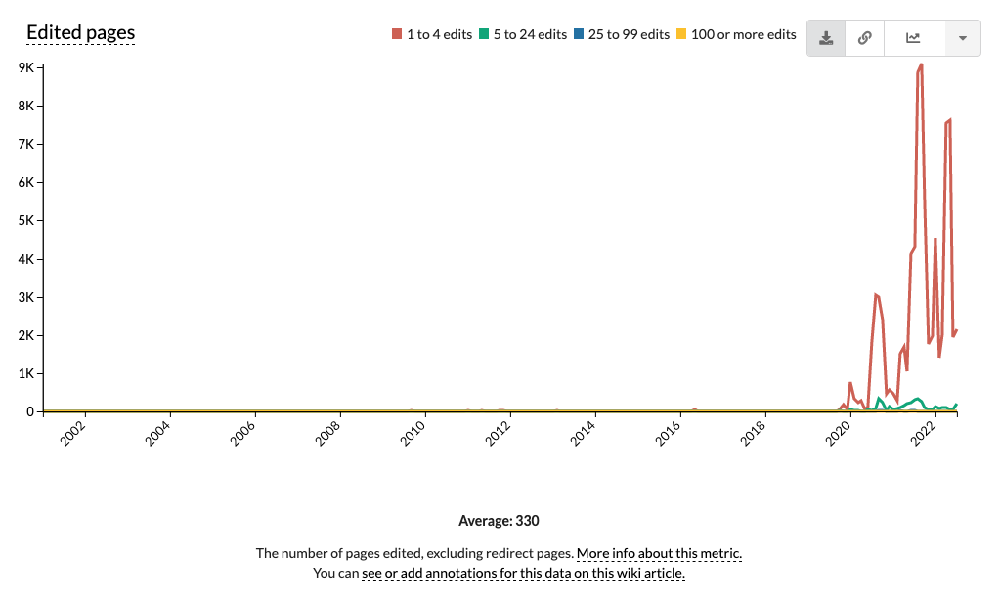

In [10]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/content/edited-pages/full|line|all|activity_level~1..4-edits*5..24-edits*25..99-edits*100..-edits|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edited-pages--activity-level--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/edited-pages--activity-level--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)

    print(f"\033[1m## {wikis[wiki]} -- Edited Pages --activity-level:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

## B. Contributing Metrics:

### i. New Pages:

In [11]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. New Pages `--no-filters`:

## English -- New Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           65  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          161  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       202206  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       158622  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


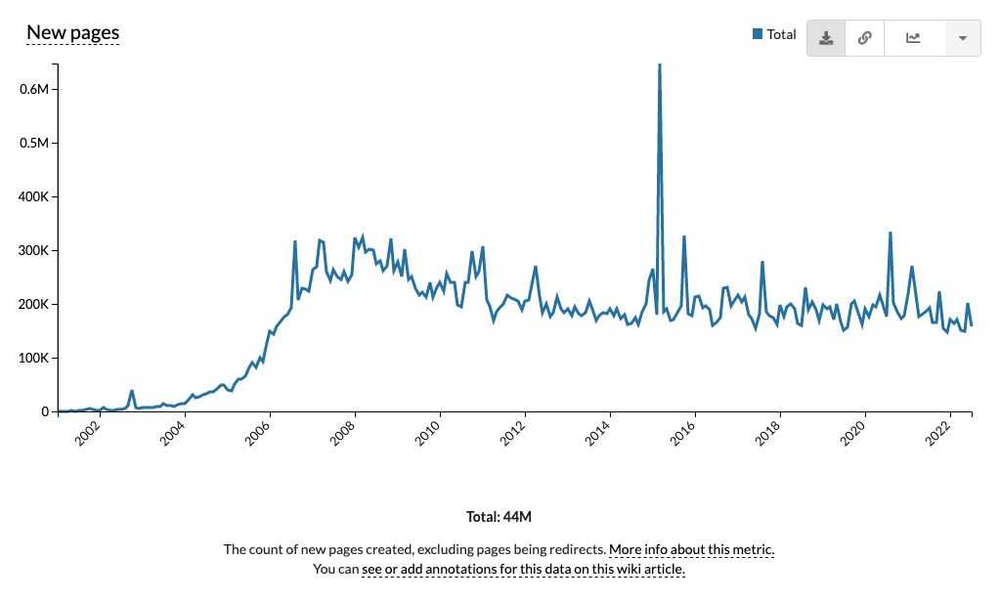

## Arabic -- New Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          591  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        32092  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        37040  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


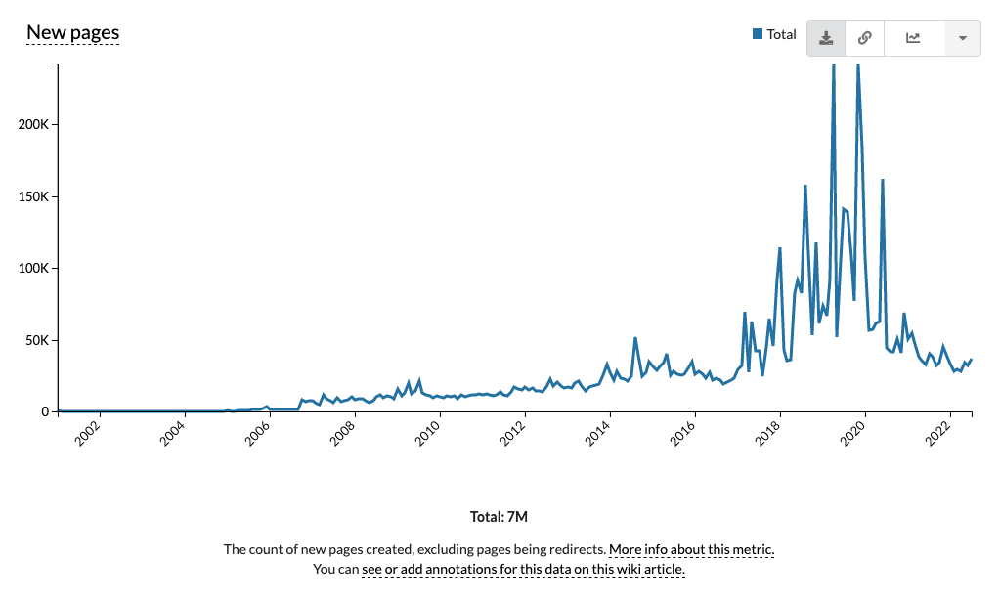

## Egyptian Arabic -- New Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        16942  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        24811  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


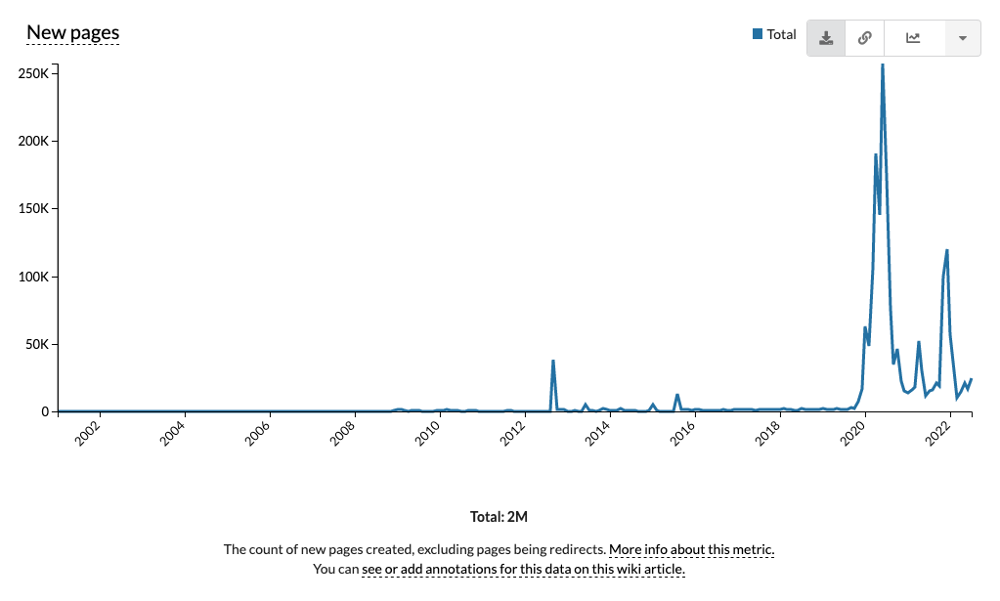

## Moroccan Arabic -- New Pages --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         1727  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z          469  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


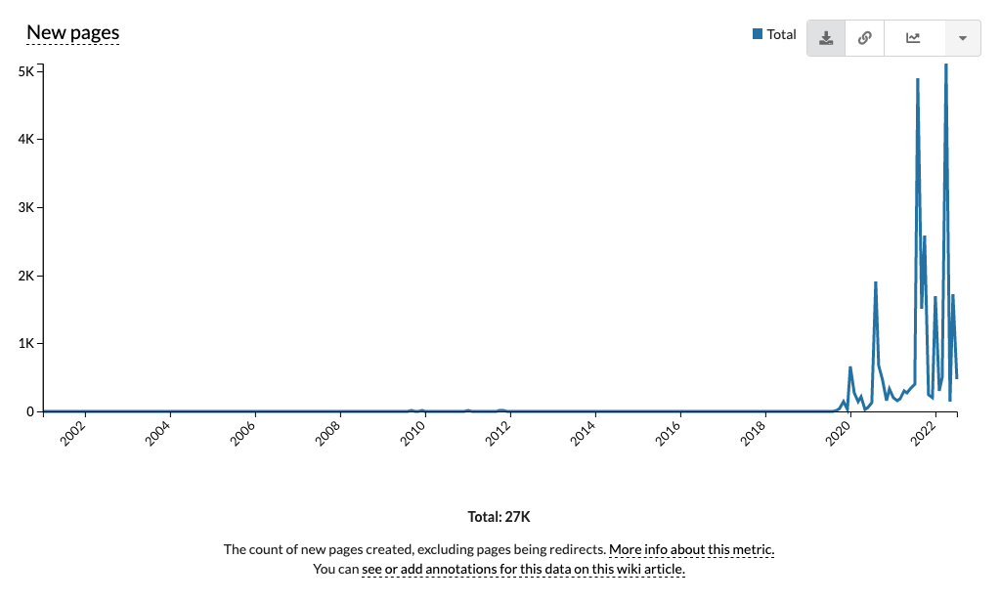

In [12]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/new-pages/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/new-pages--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/new-pages--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- New Pages --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. New Pages `--page-type`:

## English -- New Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                 28             37  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                 23            138  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z             186924          15282  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z             142955          15667  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


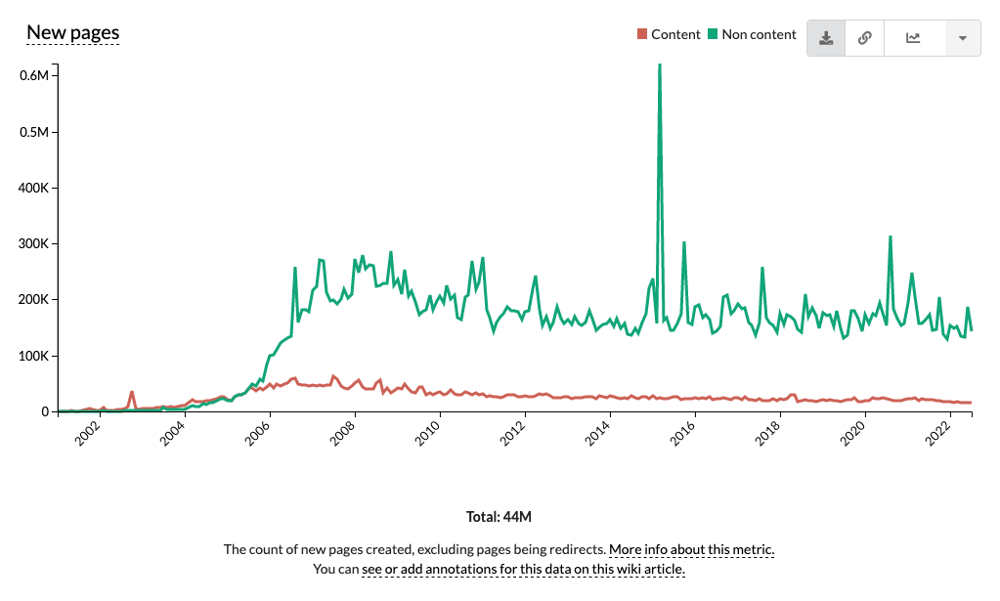

## Arabic -- New Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0            591  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              28457           3635  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              30049           6991  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


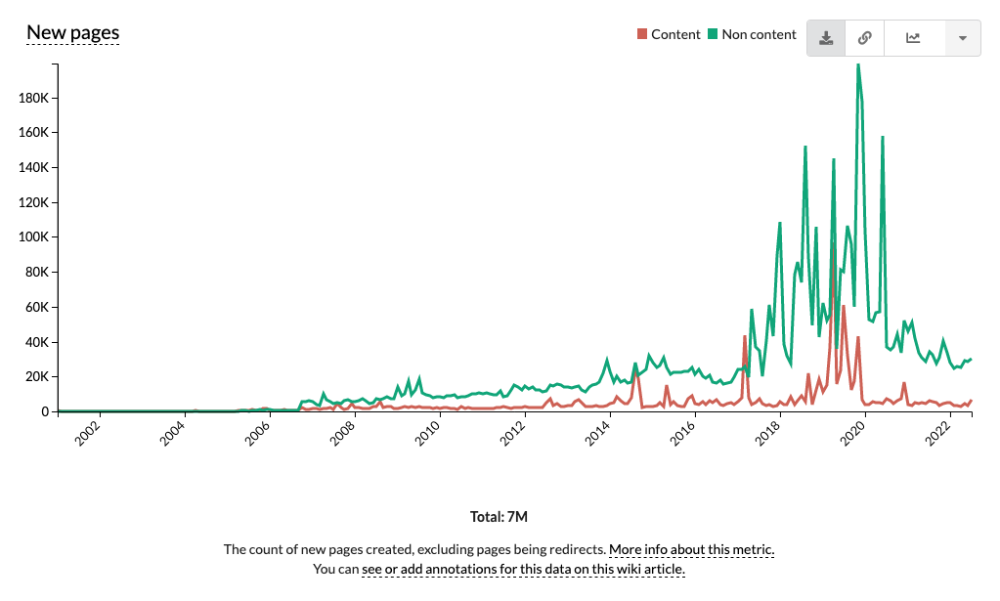

## Egyptian Arabic -- New Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              11414           5528  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              15810           9001  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


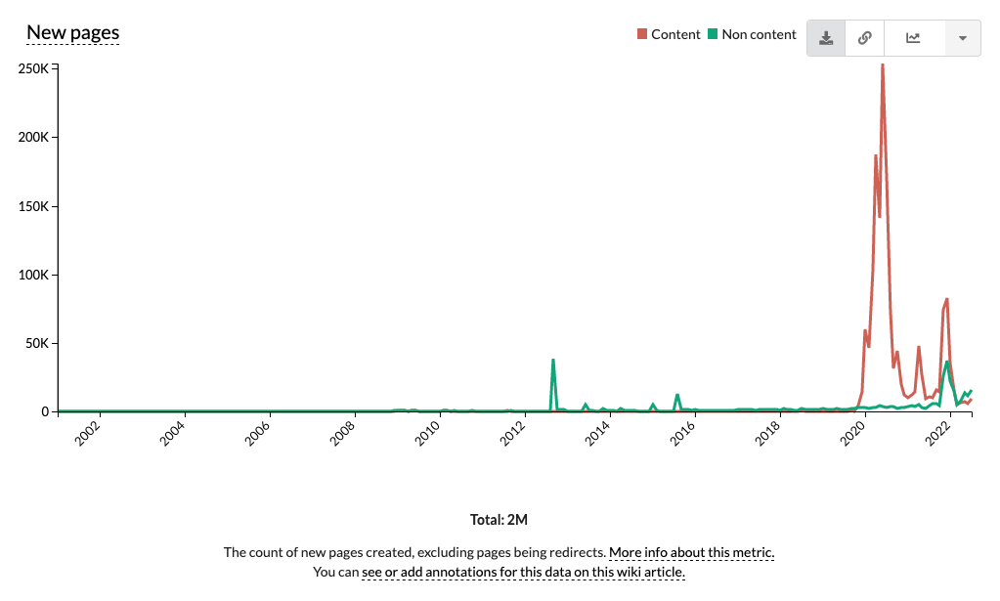

## Moroccan Arabic -- New Pages --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               1326            401  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                339            130  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


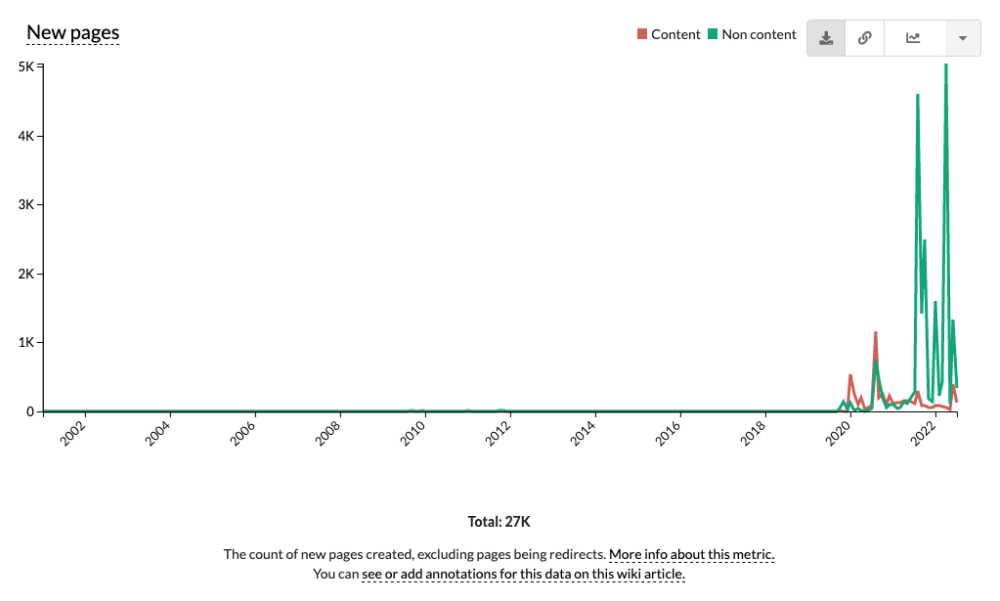

In [13]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/new-pages/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/new-pages--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/new-pages--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- New Pages --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. New Pages `--editor-type`:

## English -- New Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          51                0               14               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z         144                0               17               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      192733             5976             2917             580  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      149341             6188             2536             557  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


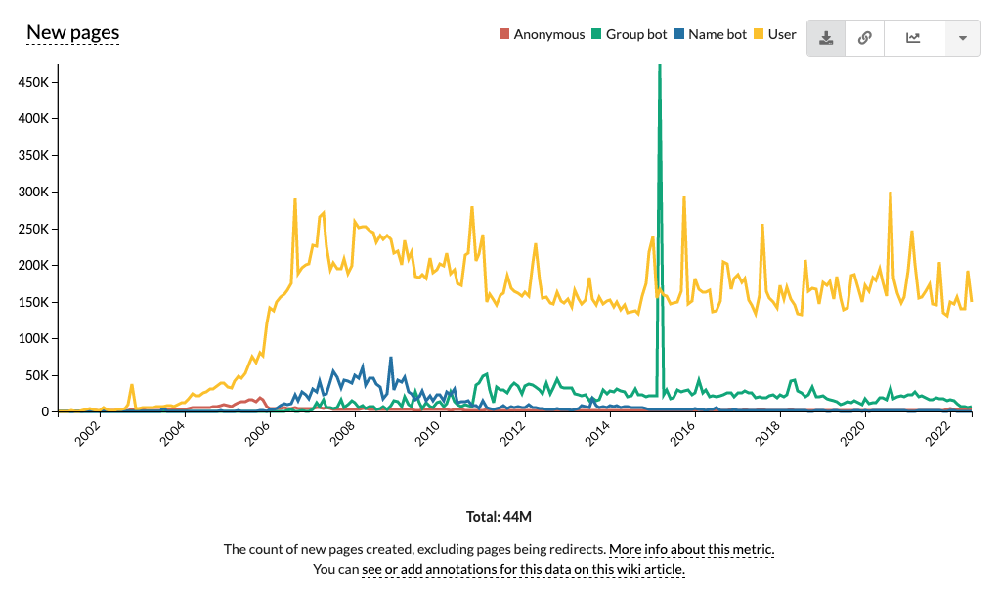

## Arabic -- New Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           4                0              587               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        7134            24930               28               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        7954            29013               69               4  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


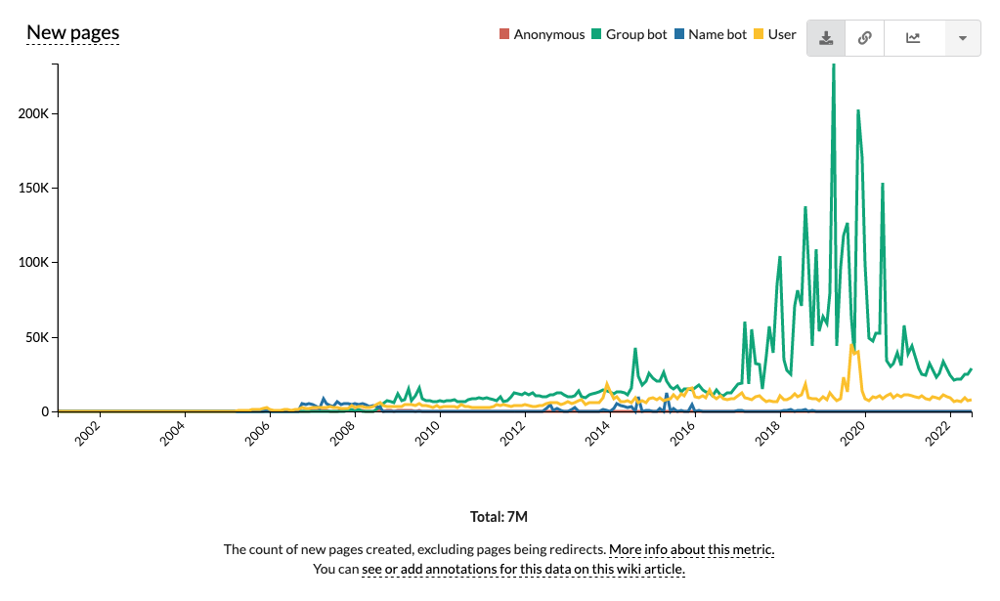

## Egyptian Arabic -- New Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       16887               49                6               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       24682              123                6               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


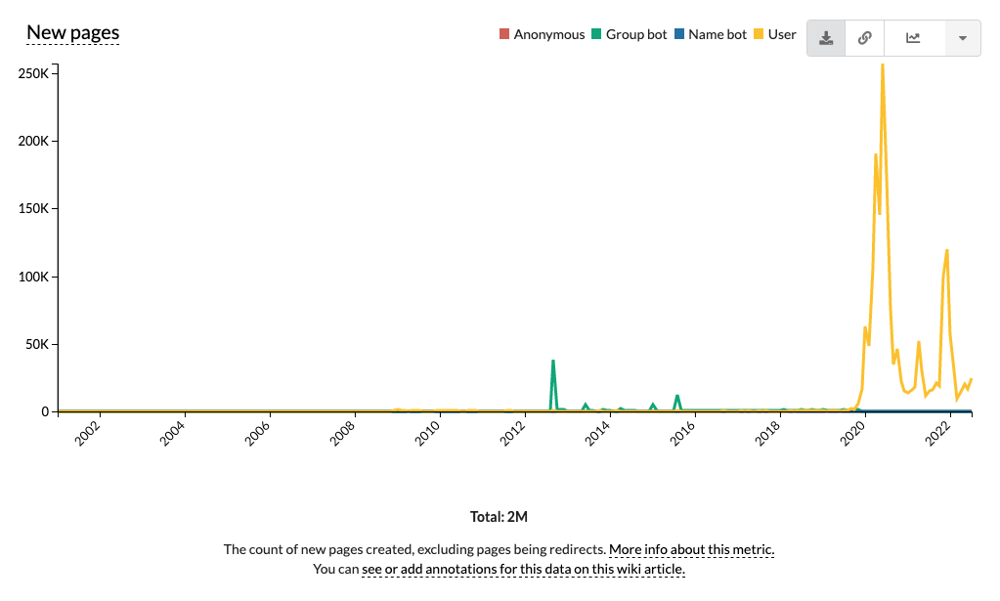

## Moroccan Arabic -- New Pages --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         134             1591                2               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         222              245                2               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


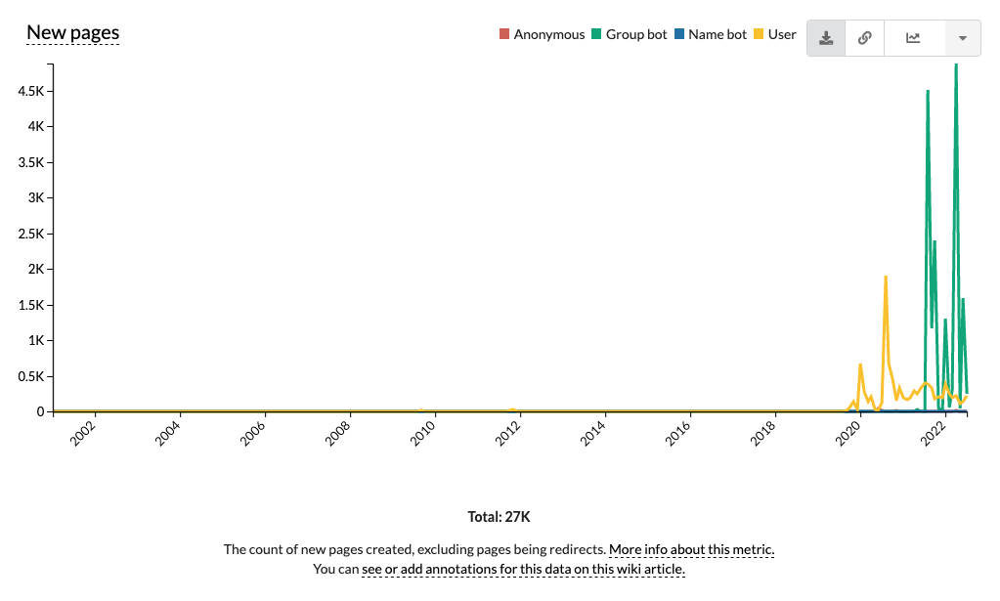

In [14]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/new-pages/full|line|all|editor_type~anonymous*group-bot*name-bot*user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/new-pages--editor-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/new-pages--editor-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- New Pages --editor-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### ii. New Registered Users:

In [15]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. New Registered Users `--no-filters`:

## English -- New Registered Users --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            5  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            2  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       112103  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        85373  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


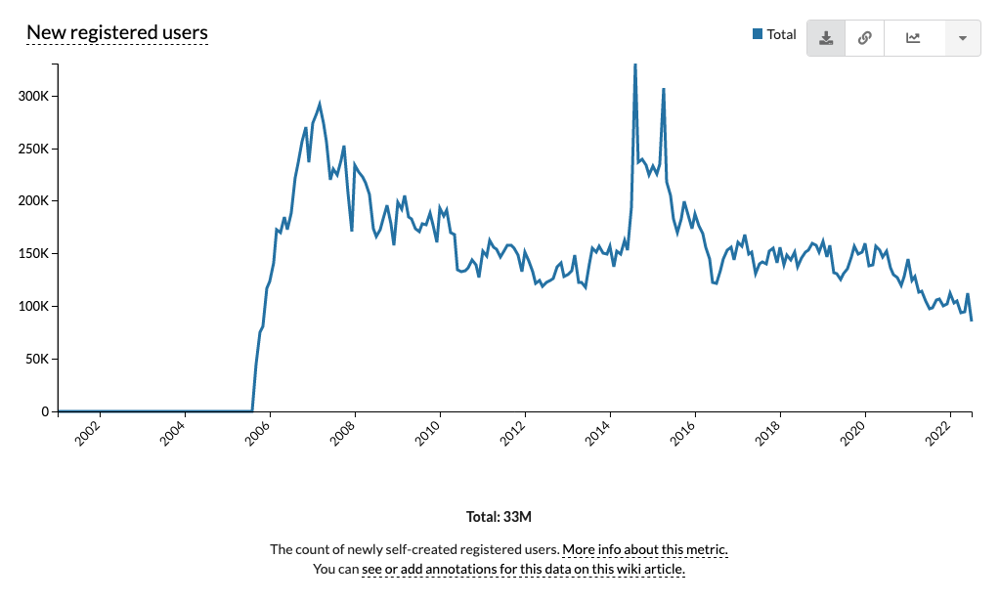

## Arabic -- New Registered Users --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         7847  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         7339  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


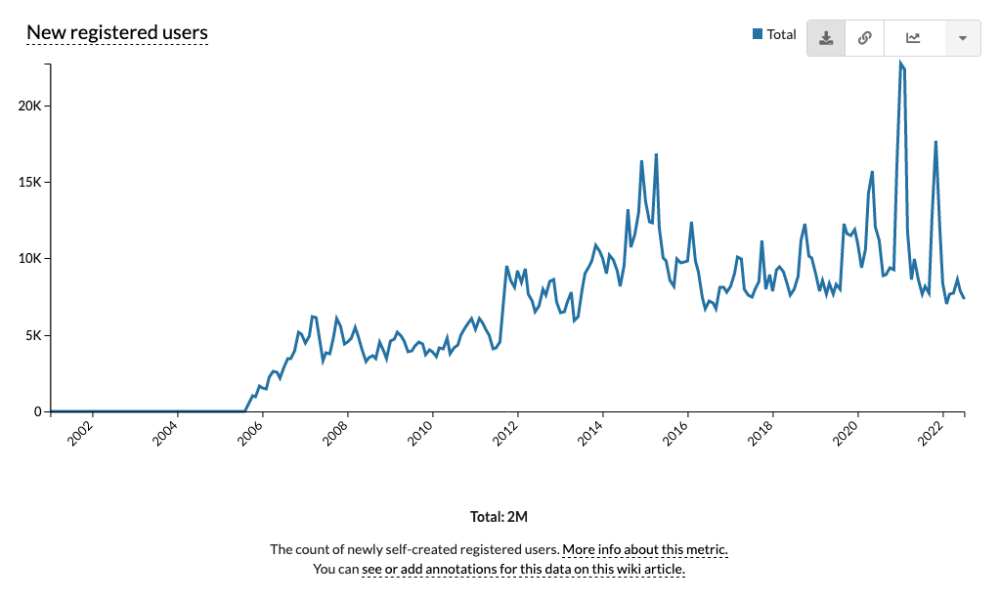

## Egyptian Arabic -- New Registered Users --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z           85  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z           84  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


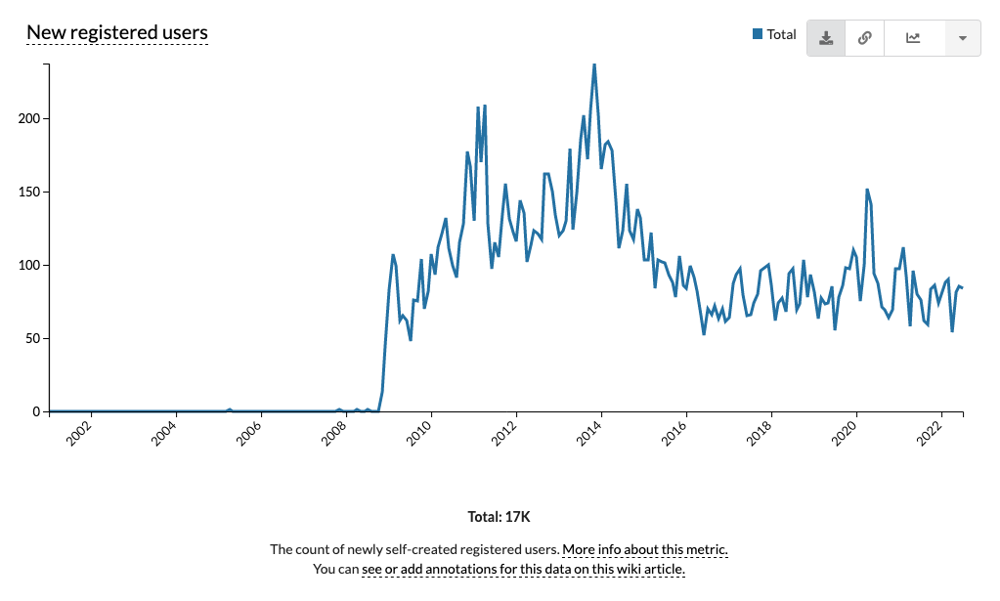

## Moroccan Arabic -- New Registered Users --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            5  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z            8  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


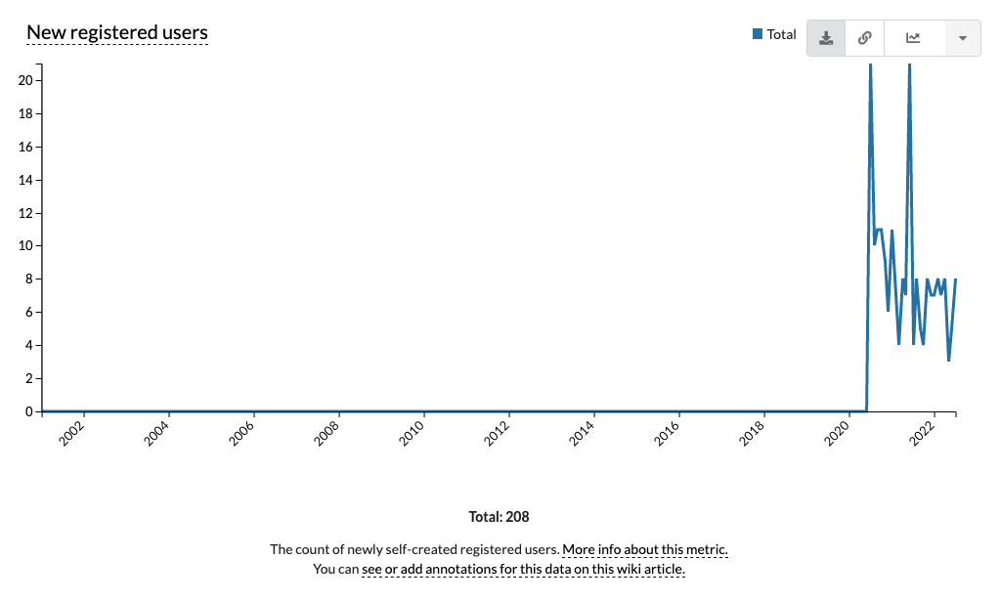

In [16]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/new-registered-users/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/new-registered-users--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/new-registered-users--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- New Registered Users --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### iii. Edits:

In [17]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Edits `--no-filters`:

## English -- Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          524  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          938  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      4908949  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      5667194  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


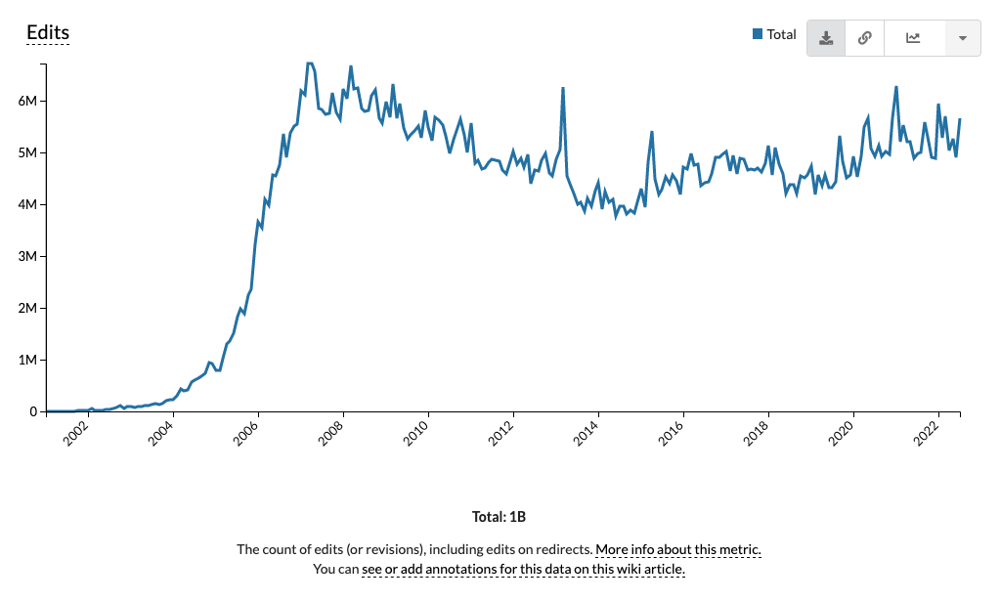

## Arabic -- Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       253526  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       347065  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


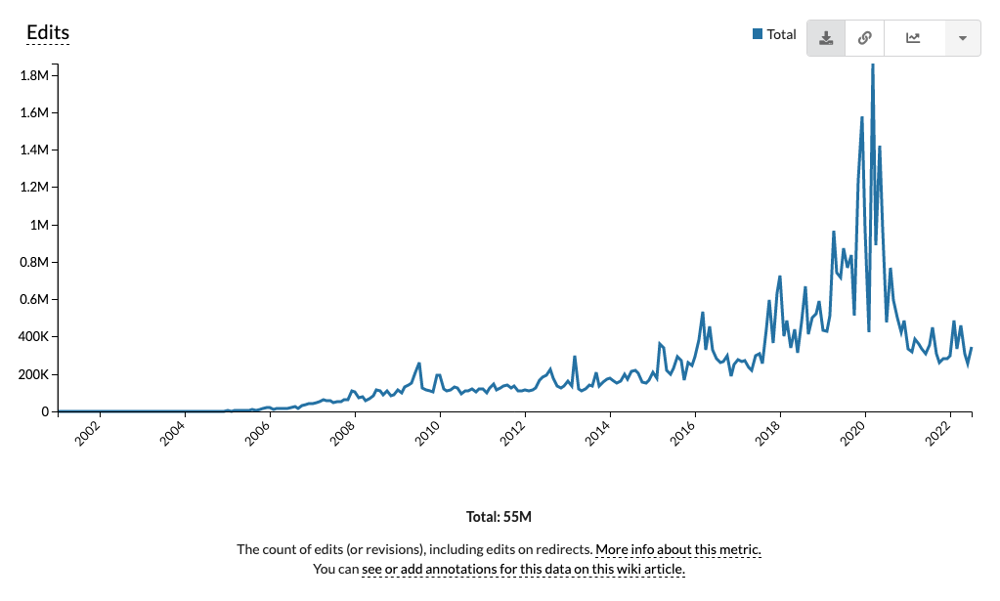

## Egyptian Arabic -- Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        57787  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        39496  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


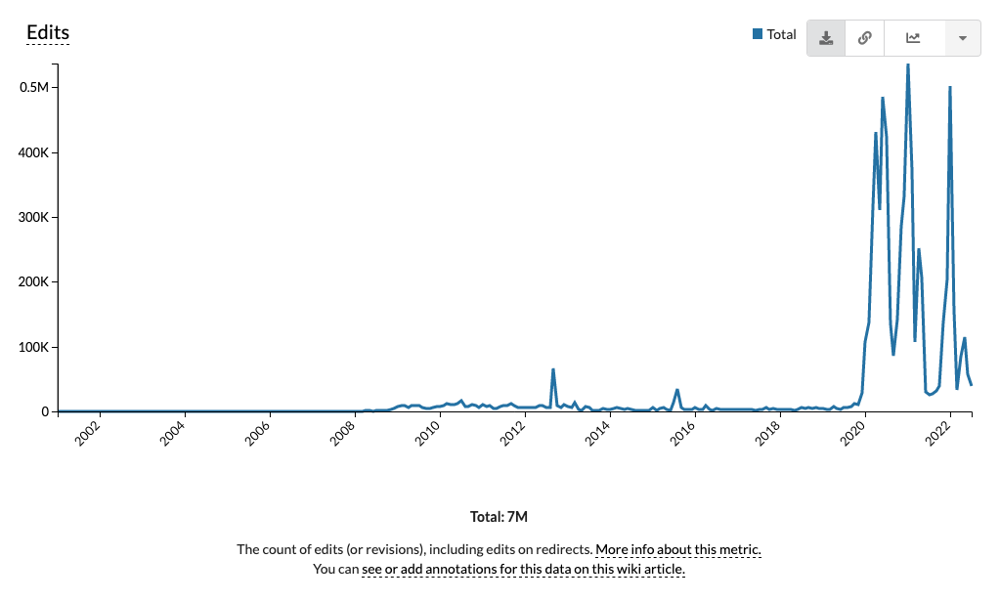

## Moroccan Arabic -- Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         3735  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         5600  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


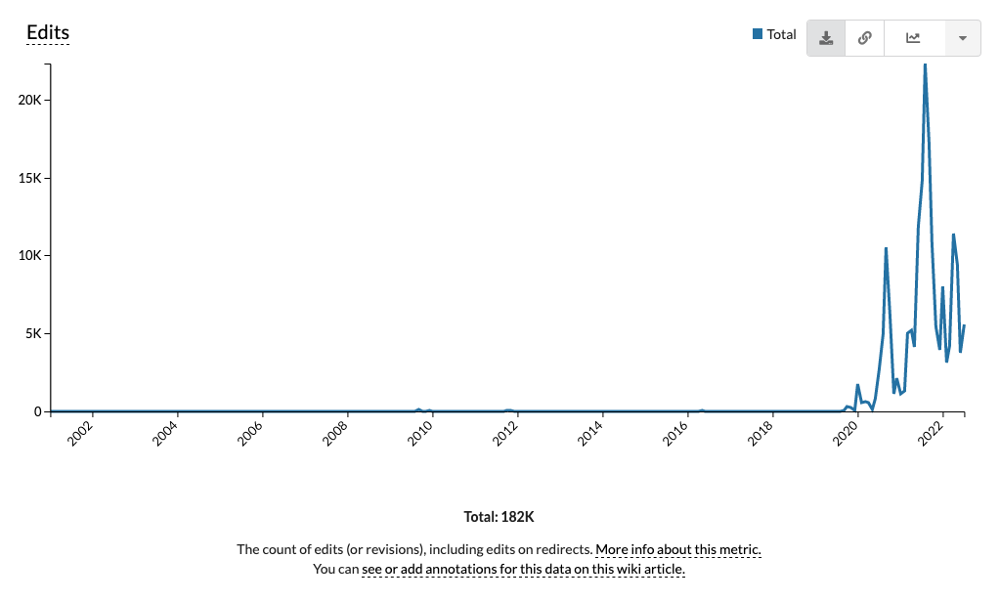

In [18]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/edits/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edits--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/edits--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Edits --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Edits `--page-type`:

## English -- Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                134            390  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                118            820  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            1512389        3396560  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z            2242120        3425074  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


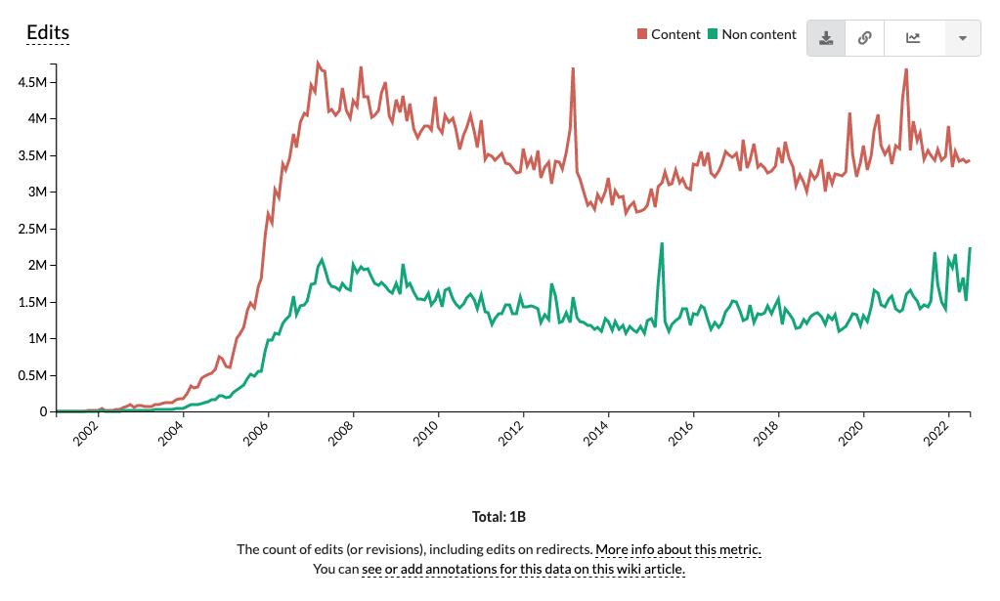

## Arabic -- Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              83337         170189  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              84969         262096  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


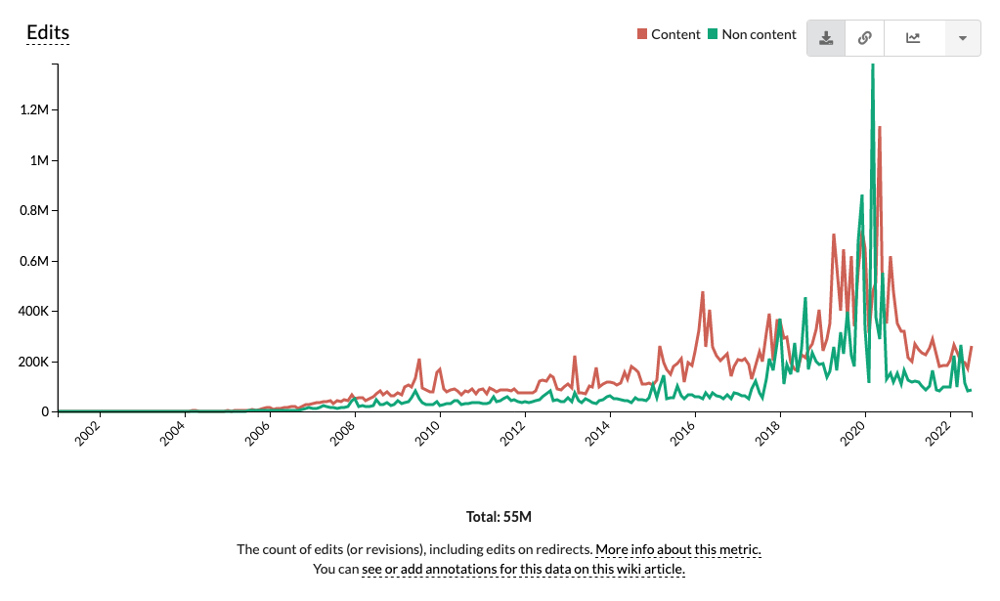

## Egyptian Arabic -- Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              12638          45149  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              16332          23164  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


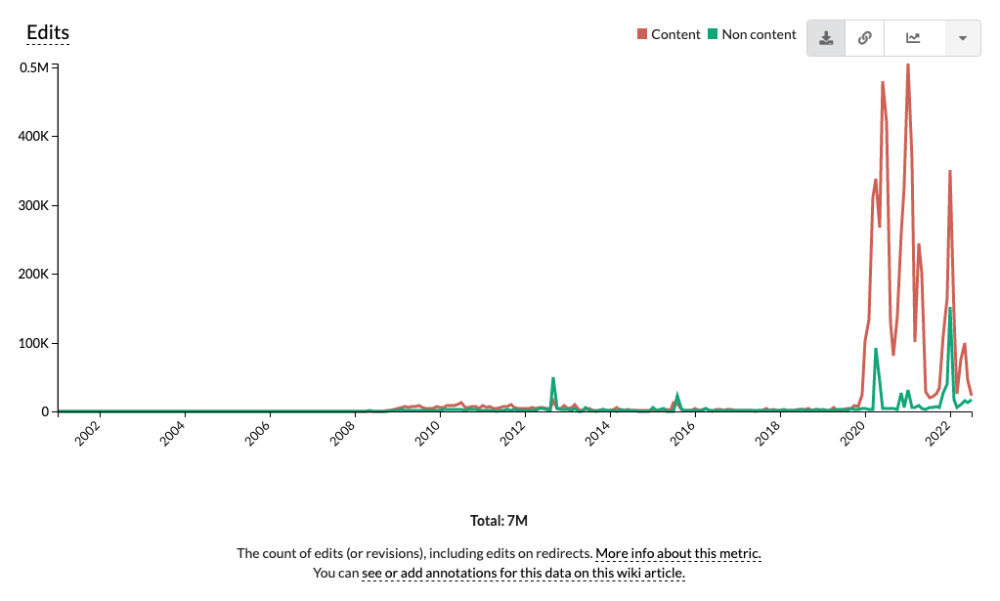

## Moroccan Arabic -- Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               2238           1497  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z               1340           4260  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


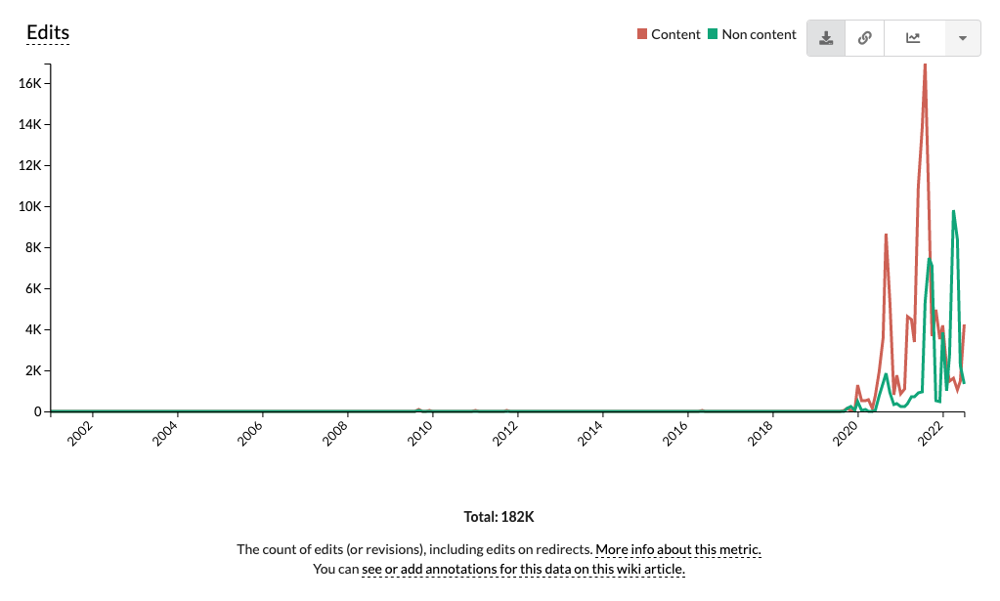

In [19]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/edits/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edits--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/edits--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Edits --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Edits `--editor-type`:

## English -- Edits --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z         429                0               95               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z         793                0              145               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z     3438462           804305           659344            6838  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z     3571247          1415839           672367            7741  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


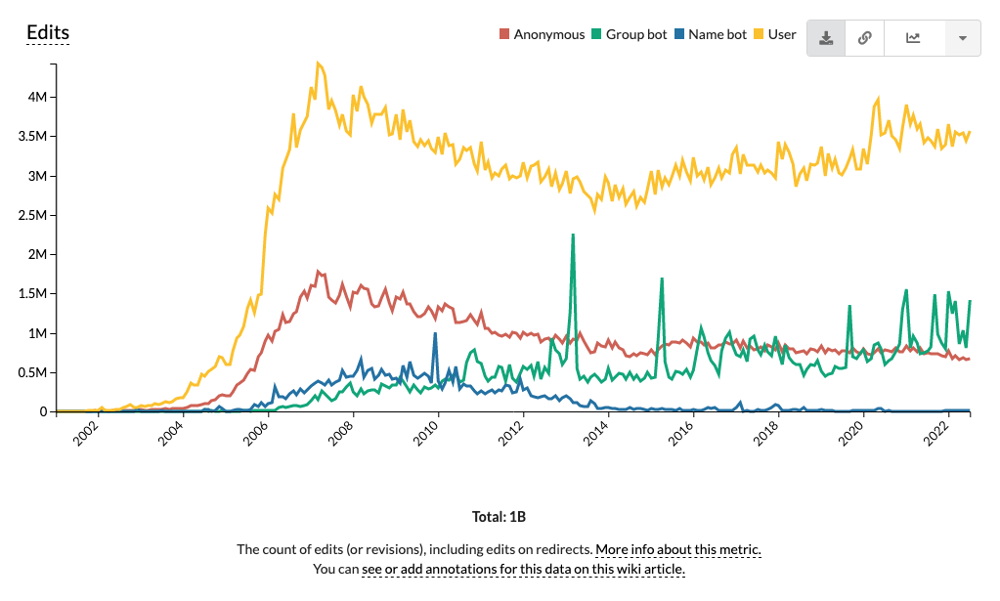

## Arabic -- Edits --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       80854           162754             9912               6  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       84939           251934            10145              47  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


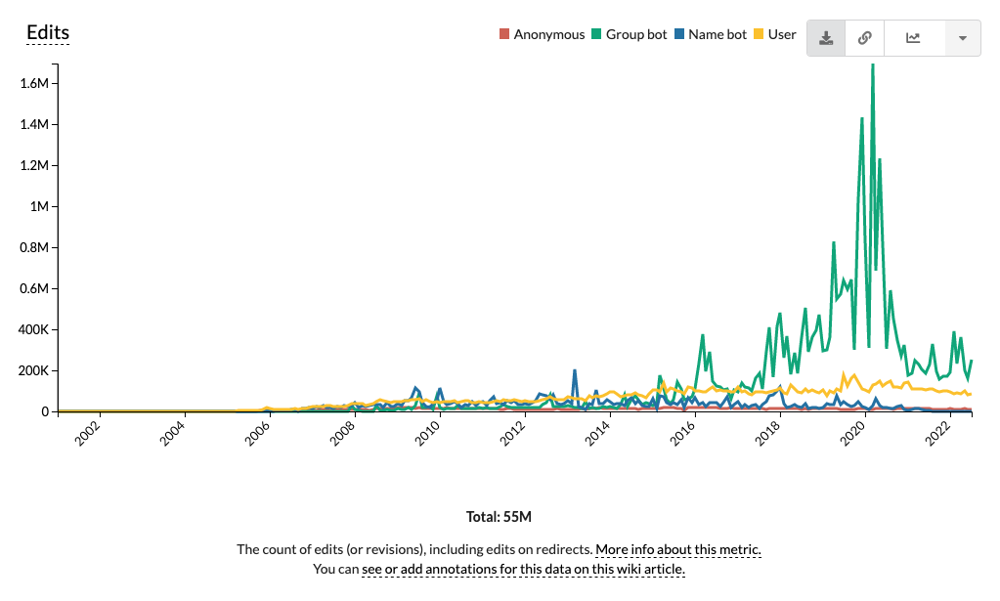

## Egyptian Arabic -- Edits --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       21035            36302              415              35  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       27232            11801              443              20  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


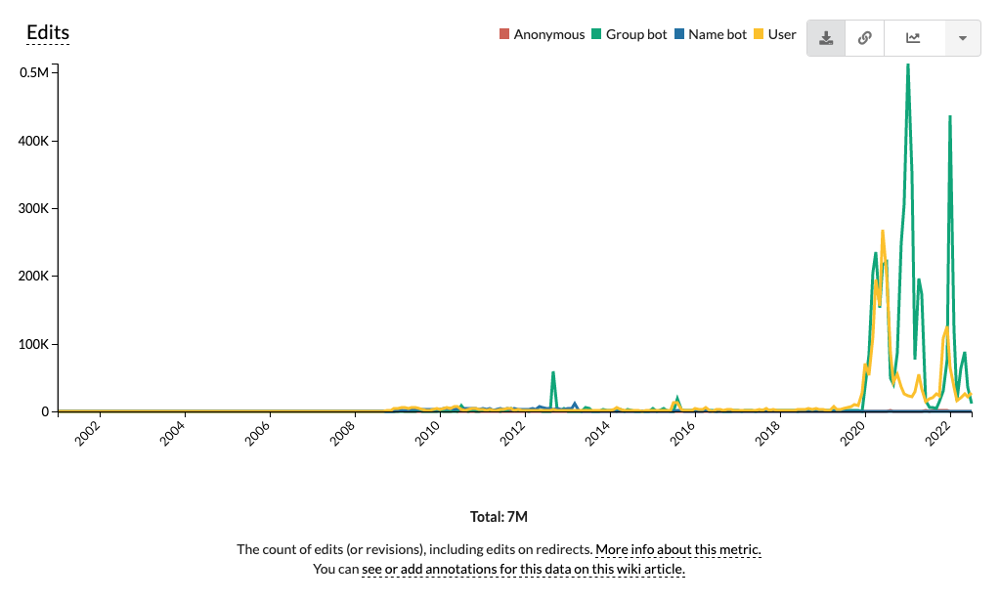

## Moroccan Arabic -- Edits --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         878             2776               81               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        1374             4190               36               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


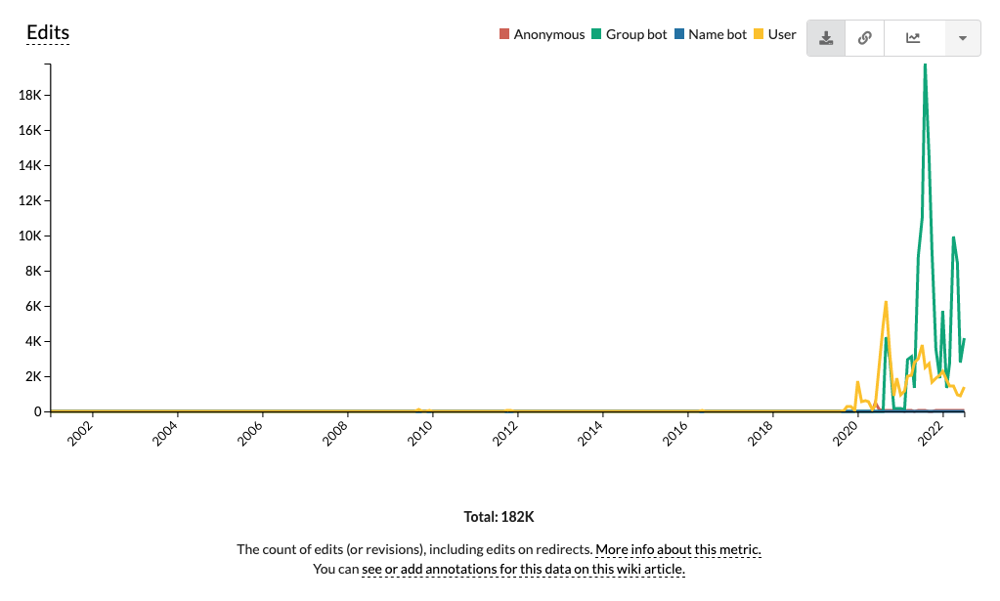

In [20]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/edits/full|line|all|editor_type~anonymous*group-bot*name-bot*user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/edits--editor-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/edits--editor-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Edits --editor-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### iv. User Edits:

In [21]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. User Edits `--no-filters`:

## English -- User Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          429  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          793  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      3438462  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      3571247  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


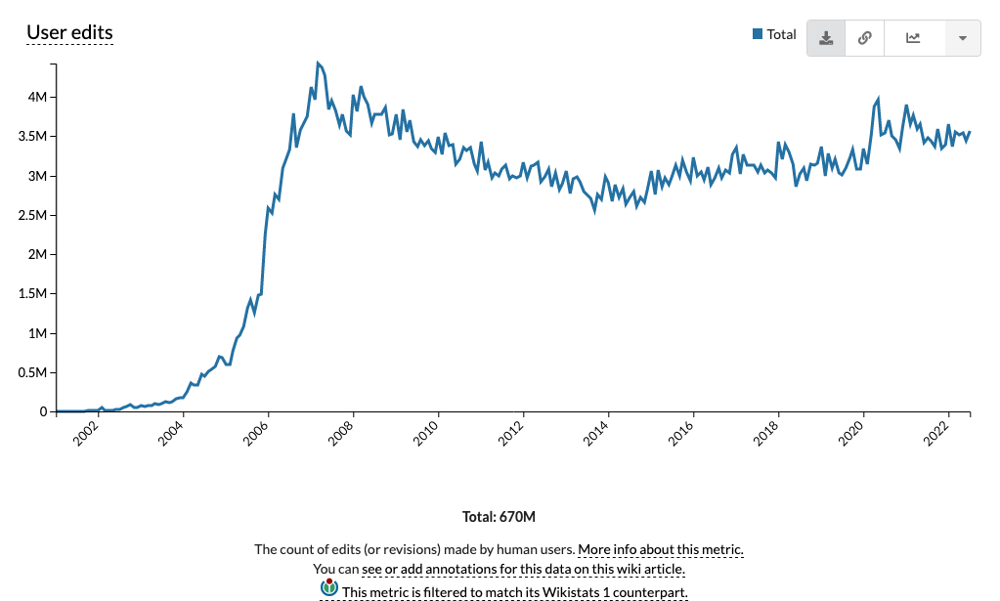

## Arabic -- User Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        80854  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        84939  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


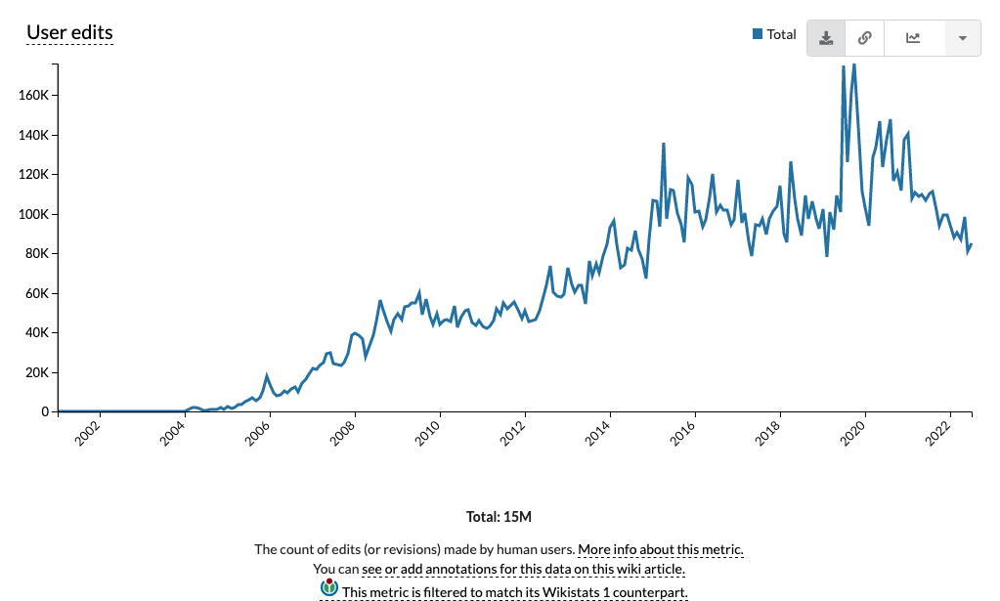

## Egyptian Arabic -- User Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        21035  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        27232  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


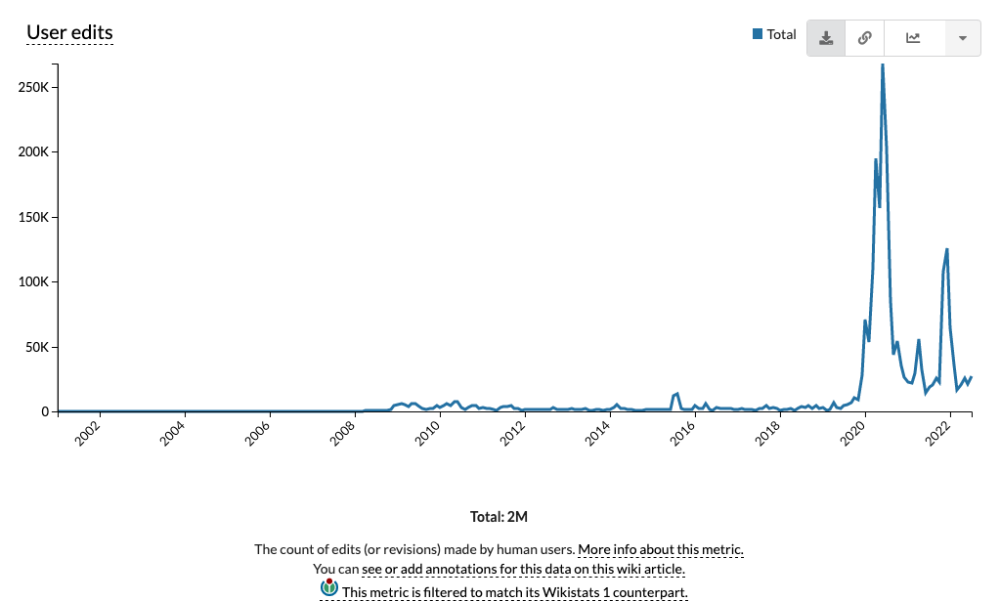

## Moroccan Arabic -- User Edits --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z          878  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         1374  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


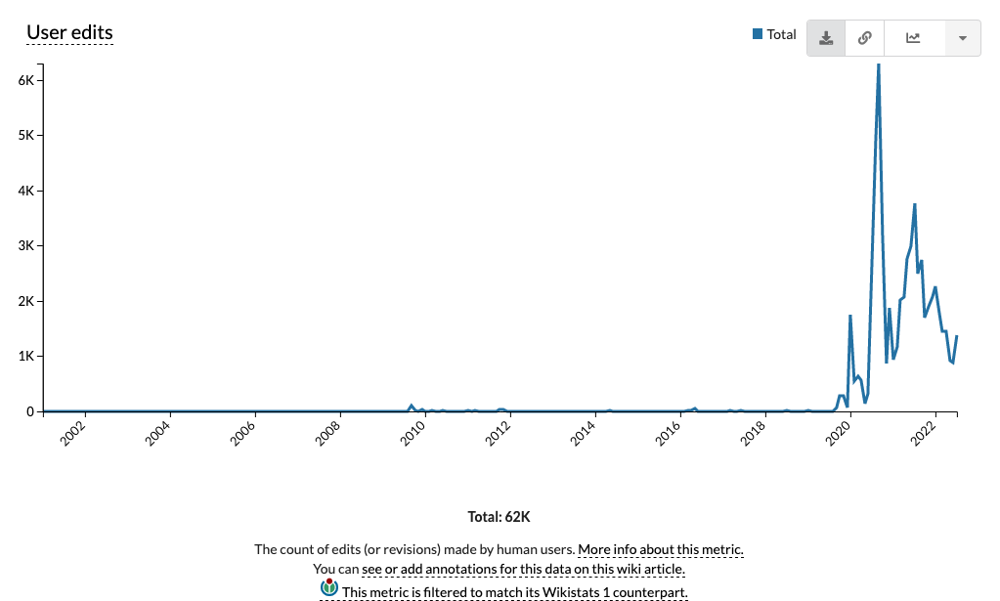

In [22]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/user-edits/full|line|all|(page_type)~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/user-edits--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/user-edits--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- User Edits --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. User Edits `--page-type`:

## English -- User Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                113            316  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                106            687  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            1025115        2413347  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z             993540        2577707  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


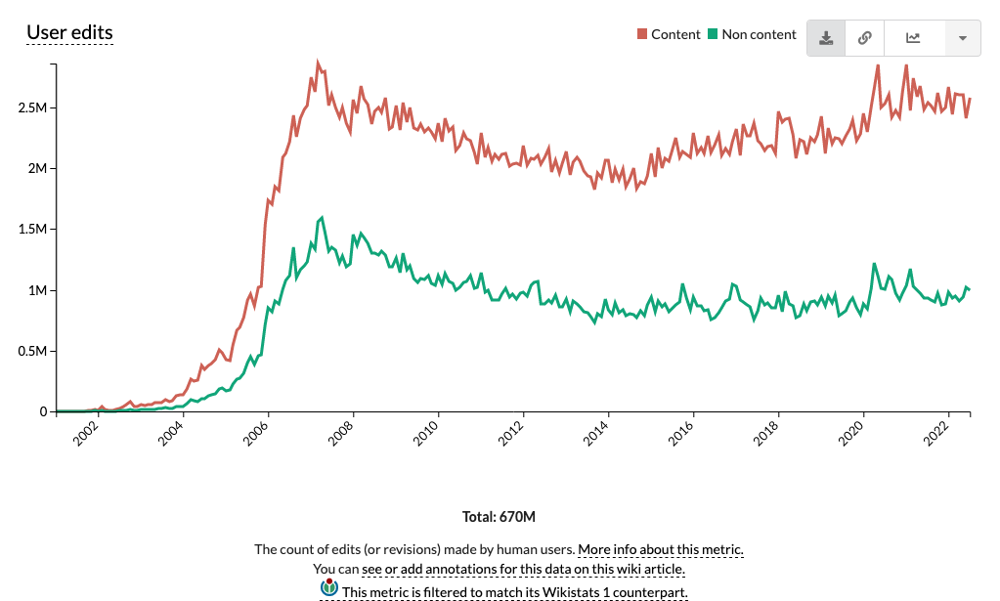

## Arabic -- User Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              24938          55916  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              24256          60683  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


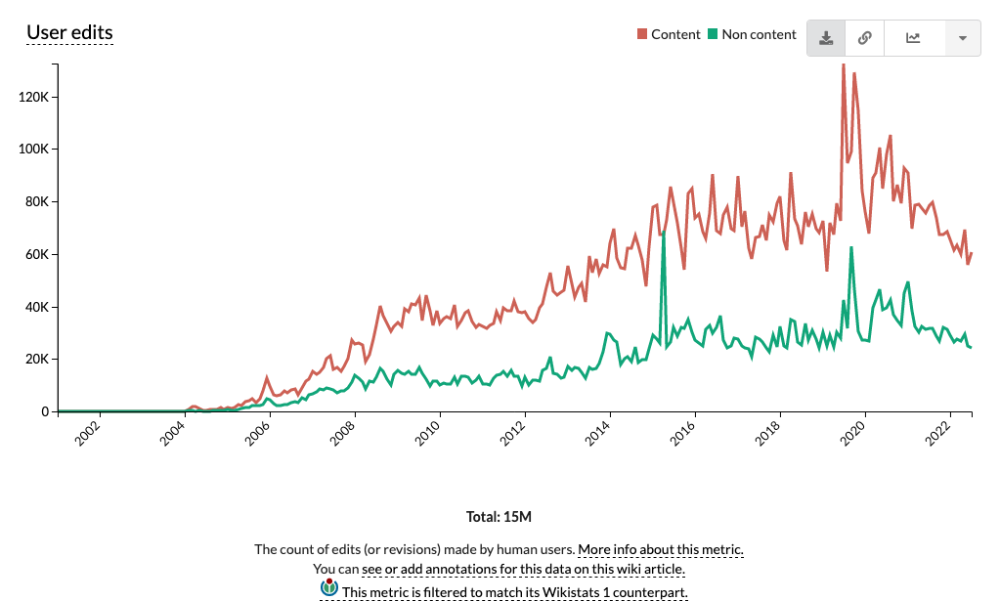

## Egyptian Arabic -- User Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              12265           8770  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              16166          11066  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


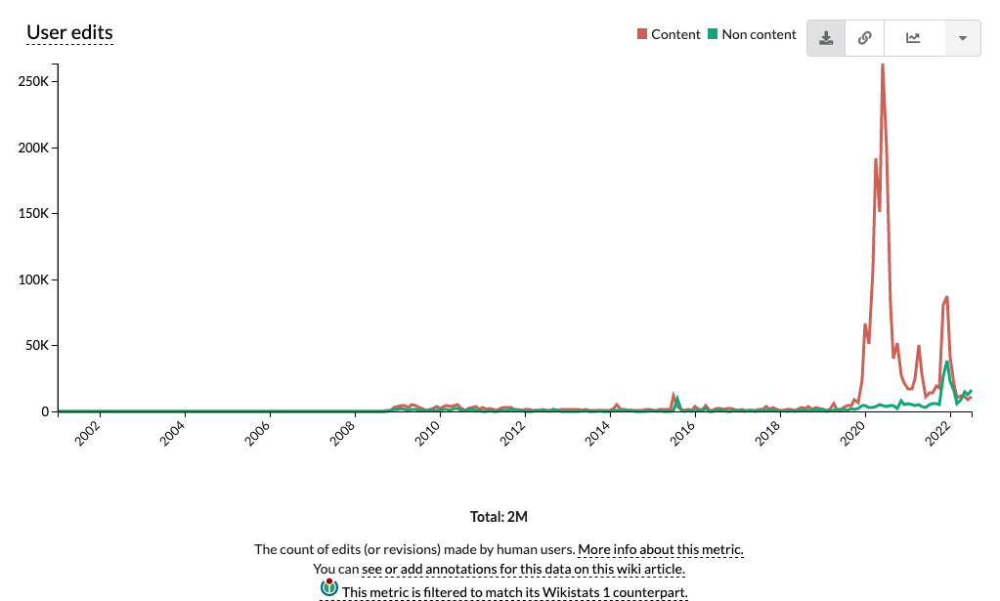

## Moroccan Arabic -- User Edits --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                312            566  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                417            957  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


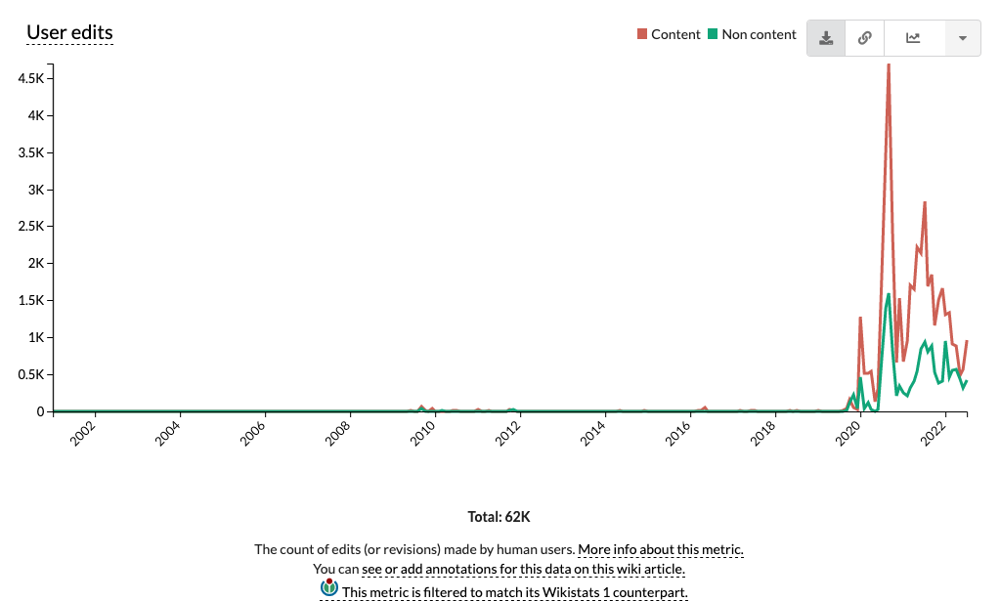

In [23]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/user-edits/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/user-edits--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/user-edits--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- User Edits --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### v. Editors:

In [24]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Editors `--no-filters`:

## English -- Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          110  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           68  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z       345252  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z       347161  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


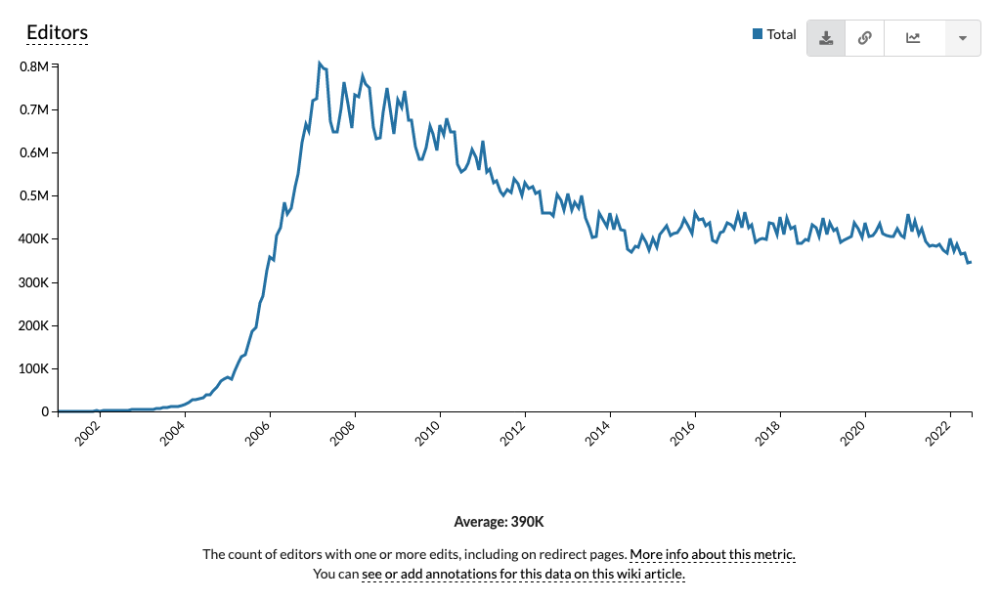

## Arabic -- Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        11916  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        11289  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


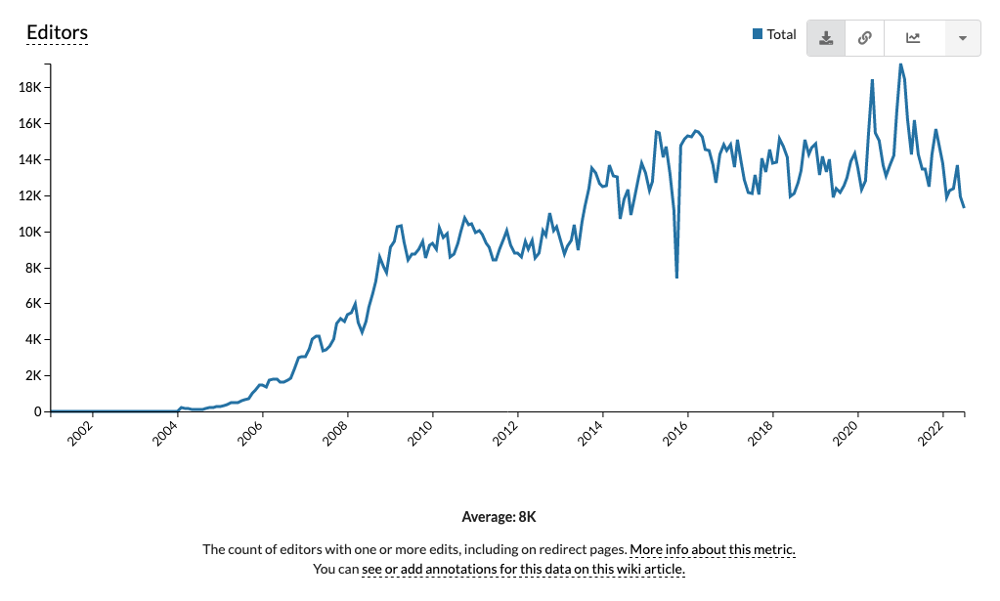

## Egyptian Arabic -- Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z          461  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z          489  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


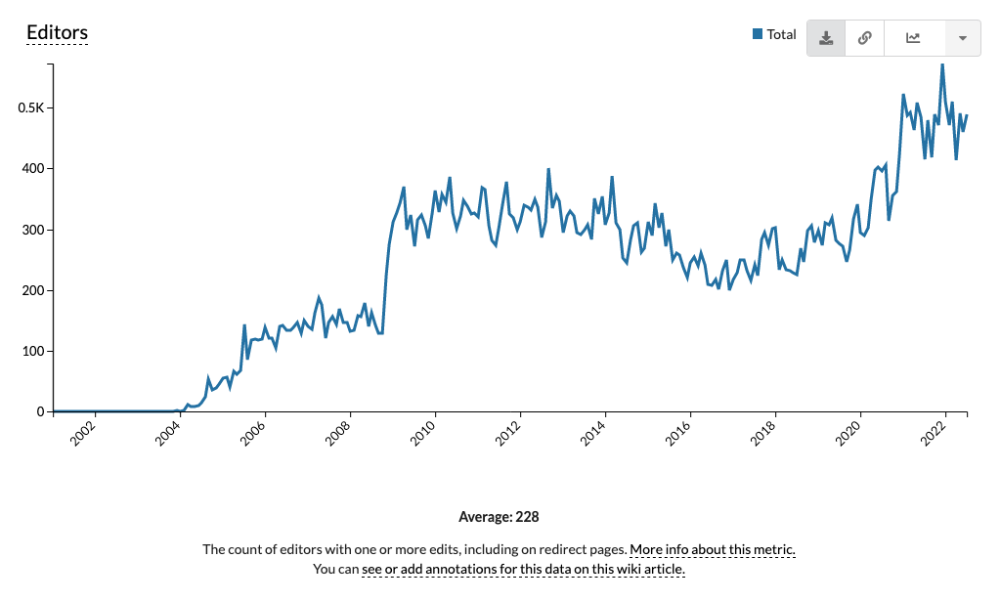

## Moroccan Arabic -- Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z           75  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z           55  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


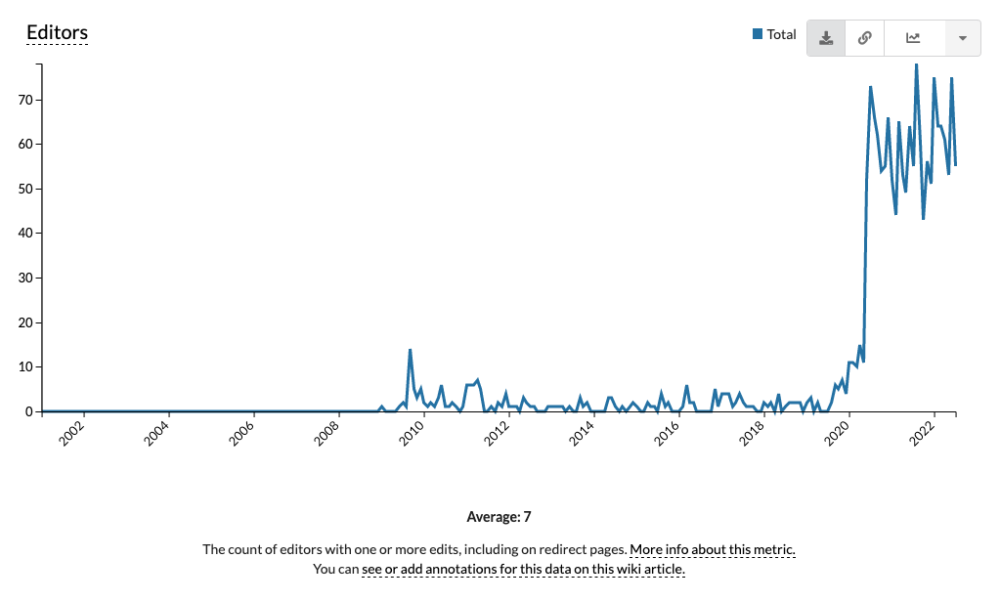

In [25]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/editors/full|line|all|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/editors--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/editors--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Editors --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Editors `--page-type`:

## English -- Editors --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                 49             81  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                 29             57  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              63312         311425  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              64219         313036  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


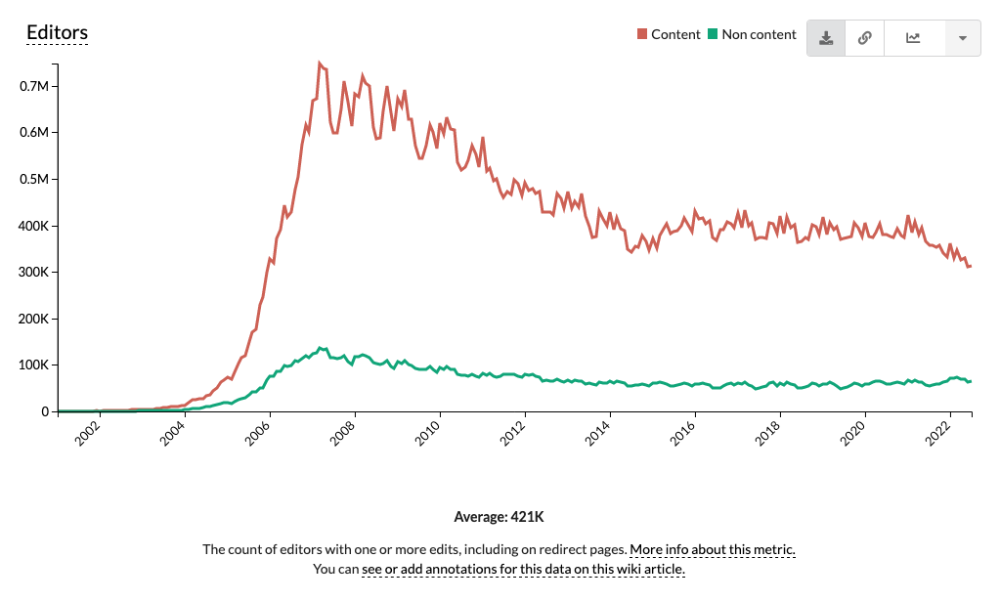

## Arabic -- Editors --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               3149           9608  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z               3013           9019  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


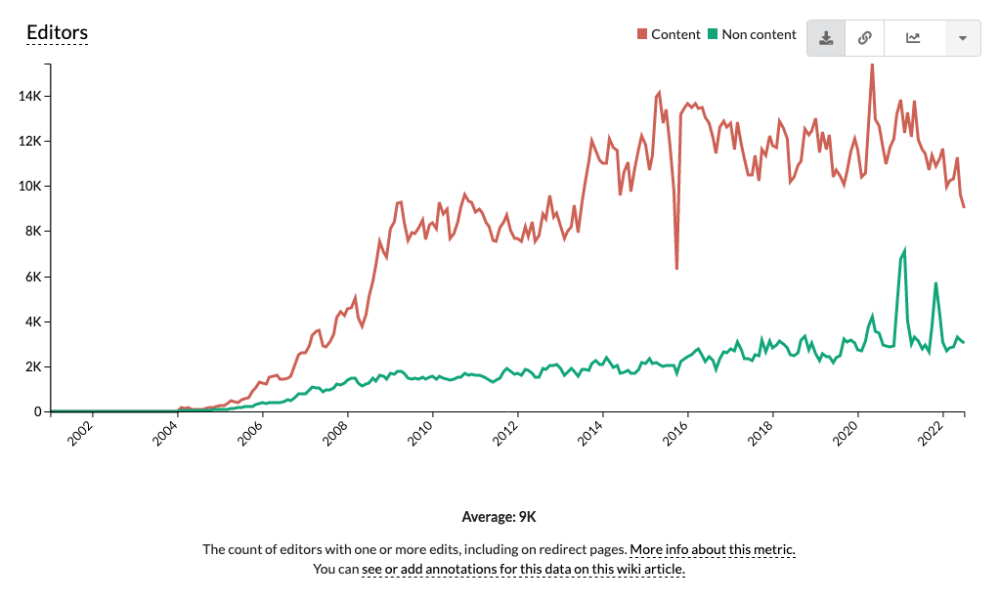

## Egyptian Arabic -- Editors --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                107            377  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                119            400  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


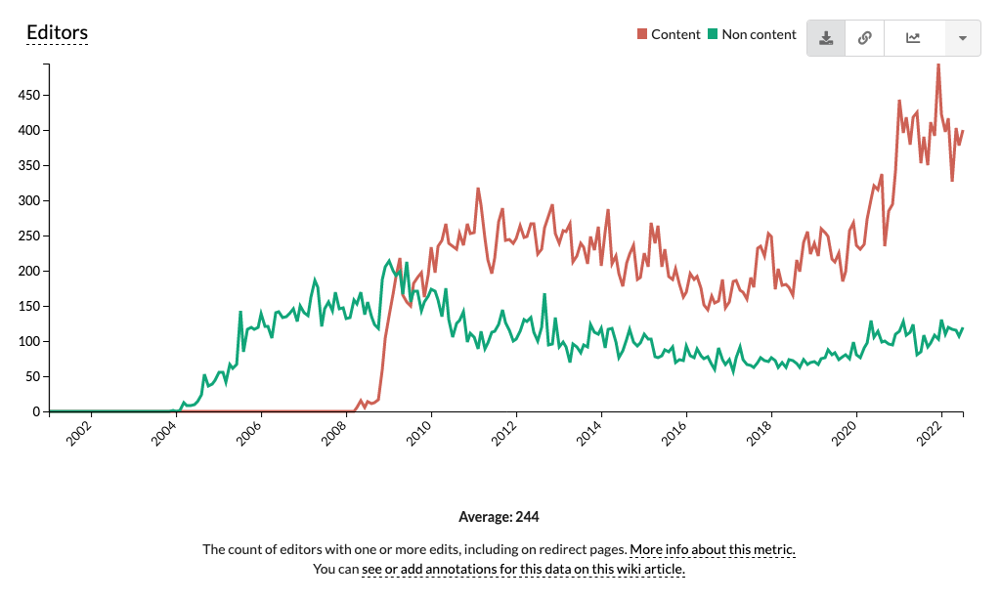

## Moroccan Arabic -- Editors --page-type:

                        month  total.non-content  total.content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0              0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0              0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...            ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                 24             62  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                 20             47  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


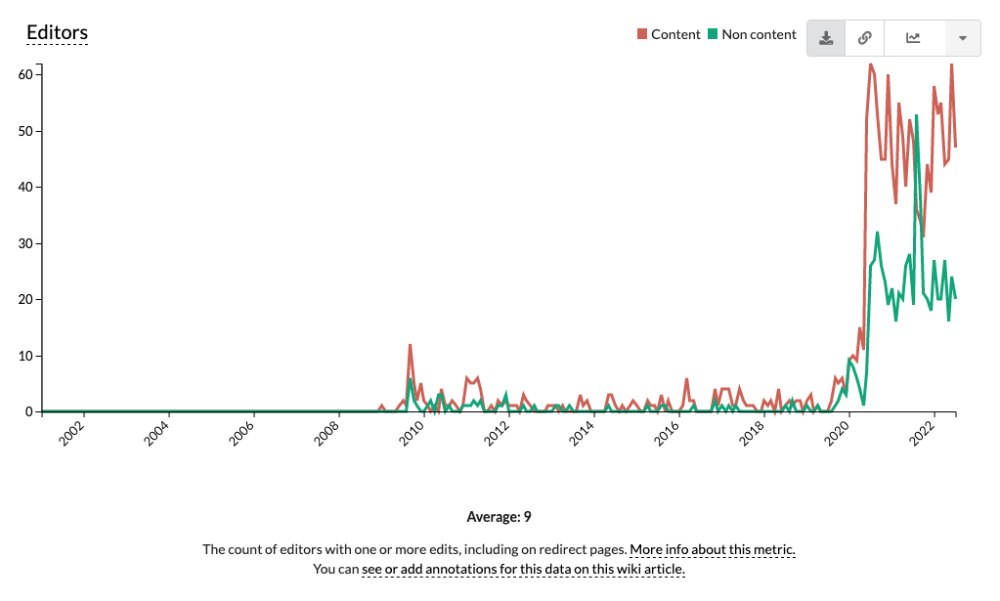

In [26]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/editors/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/editors--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/editors--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Editors --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Editors `--editor-type`:

## English -- Editors --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z          66                0               44               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z          44                0               24               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z      116679              109           228403              61  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z      115863              109           231116              73  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


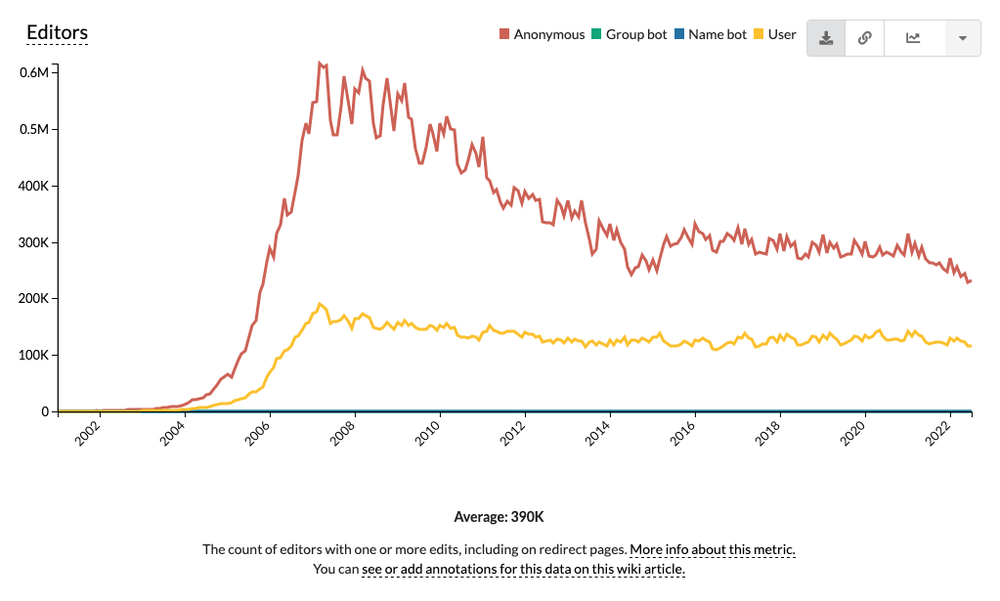

## Arabic -- Editors --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        5007               17             6889               3  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        4754               18             6514               3  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


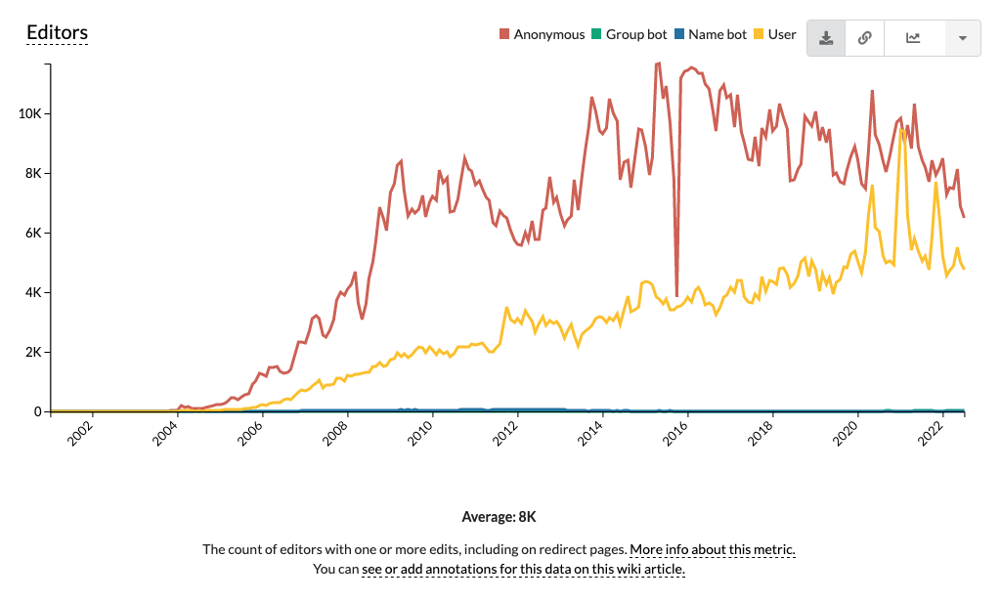

## Egyptian Arabic -- Editors --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         178                3              278               2  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z         220                4              262               3  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


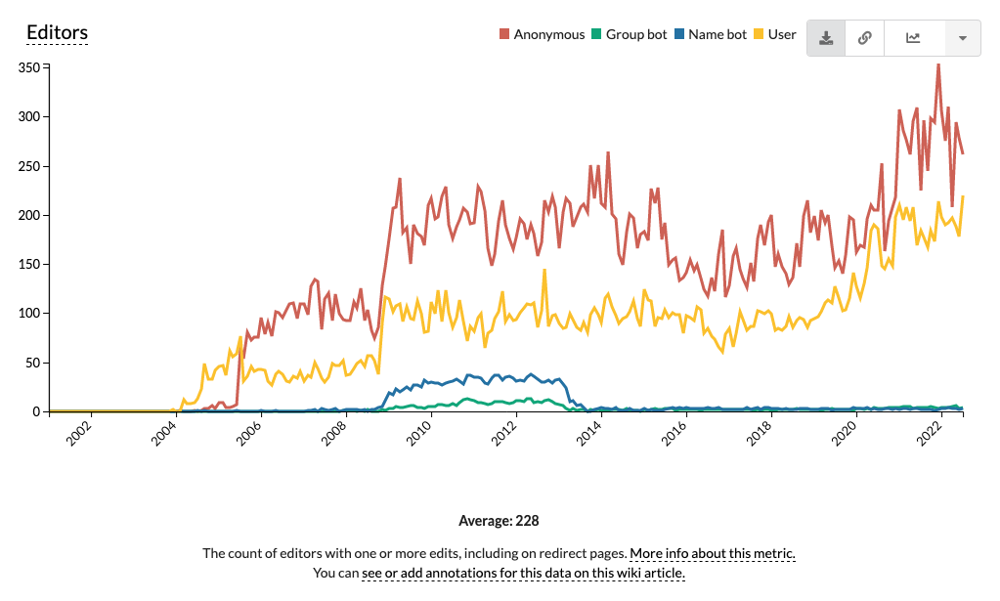

## Moroccan Arabic -- Editors --editor-type:

                        month  total.user  total.group-bot  total.anonymous  total.name-bot           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           0                0                0               0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           0                0                0               0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...         ...              ...              ...             ...                       ...                       ...
257  2022-06-01T00:00:00.000Z          36                2               37               0  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z          30                3               22               0  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


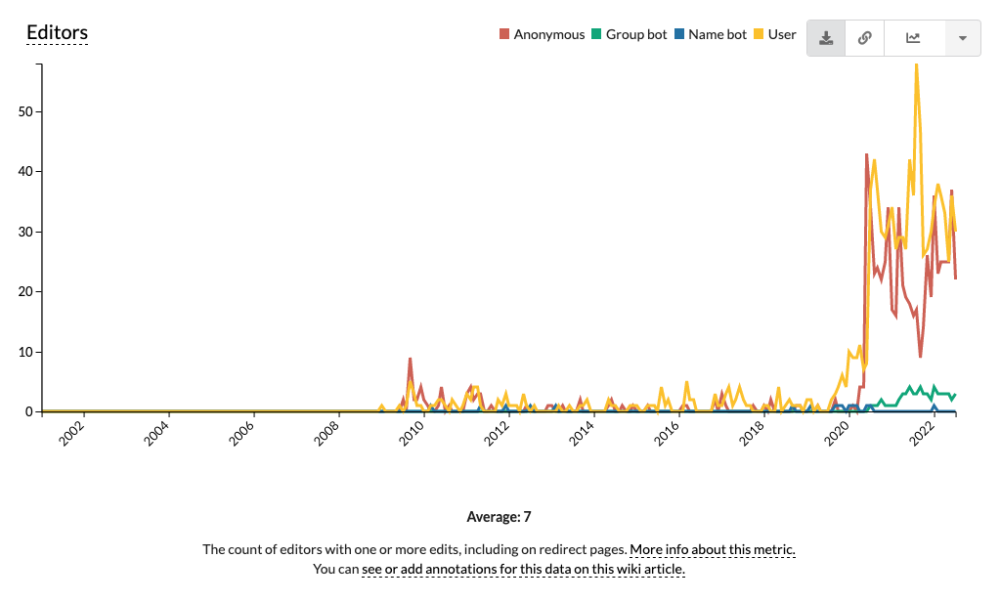

In [27]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/editors/full|line|all|editor_type~anonymous*group-bot*name-bot*user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/editors--editor-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/editors--editor-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Editors --editor-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 4. Editors `--activity-level`:

## English -- Editors --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                 14                92                   4  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  2                 17                41                   8  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z               5369              45482            284546                9855  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z               5512              46762            284742               10145  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


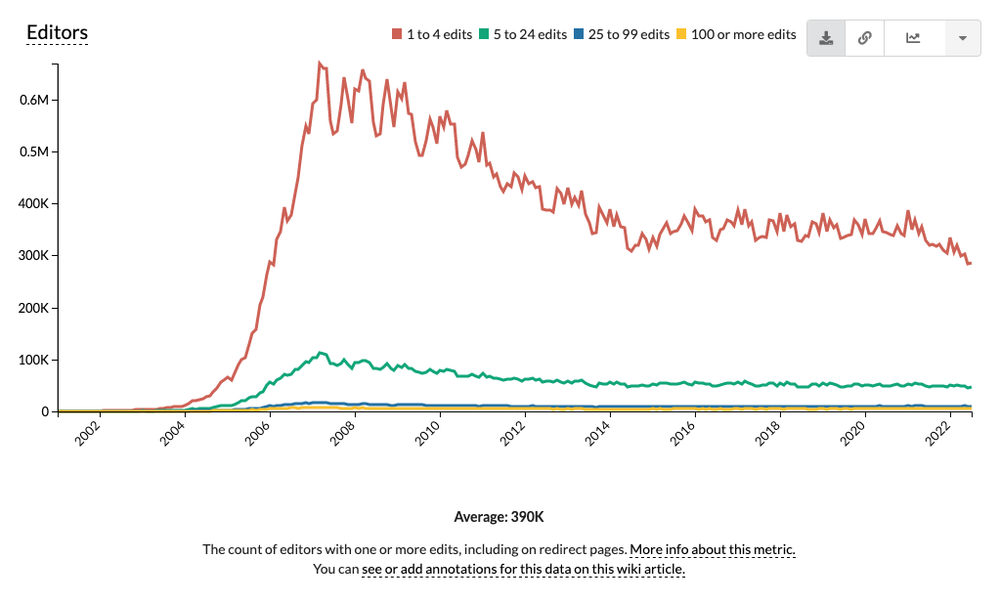

## Arabic -- Editors --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                136                898             10701                 181  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                138                883             10110                 158  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


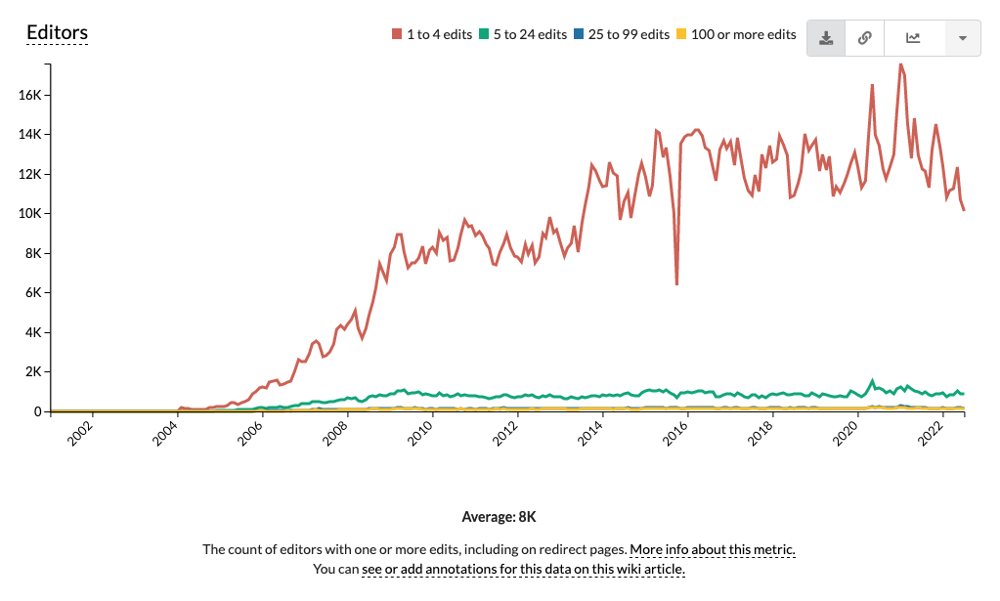

## Egyptian Arabic -- Editors --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                  8                 26               424                   3  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                  7                 22               454                   6  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


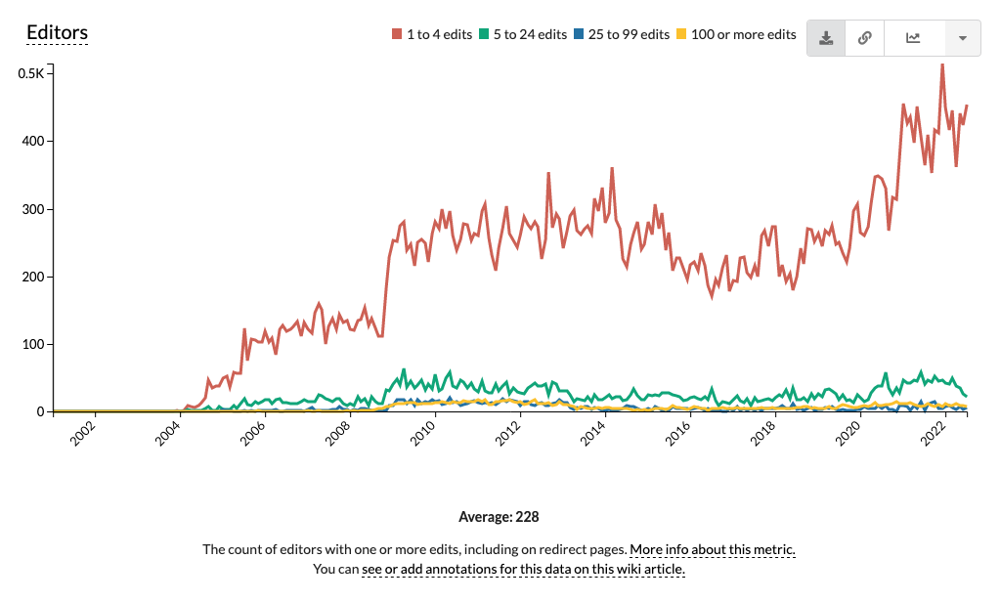

## Moroccan Arabic -- Editors --activity-level:

                        month  total.100..-edits  total.5..24-edits  total.1..4-edits  total.25..99-edits           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z                  0                  0                 0                   0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z                  0                  0                 0                   0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...                ...                ...               ...                 ...                       ...                       ...
257  2022-06-01T00:00:00.000Z                  4                 10                60                   1  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z                  3                  7                41                   4  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


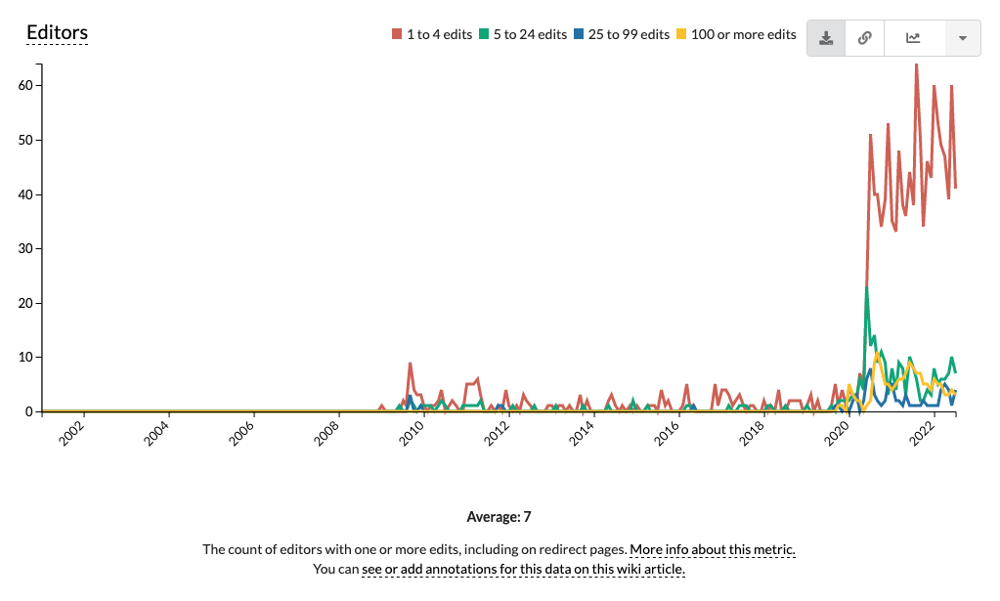

In [28]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/editors/full|line|all|activity_level~1..4-edits*5..24-edits*25..99-edits*100..-edits|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/editors--activity-level--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/editors--activity-level--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Editors --activity-level:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### vi. Active Editors:

In [29]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Active Editors `--no-filters`:

## English -- Active Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z           15  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z           20  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z        37092  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z        38080  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


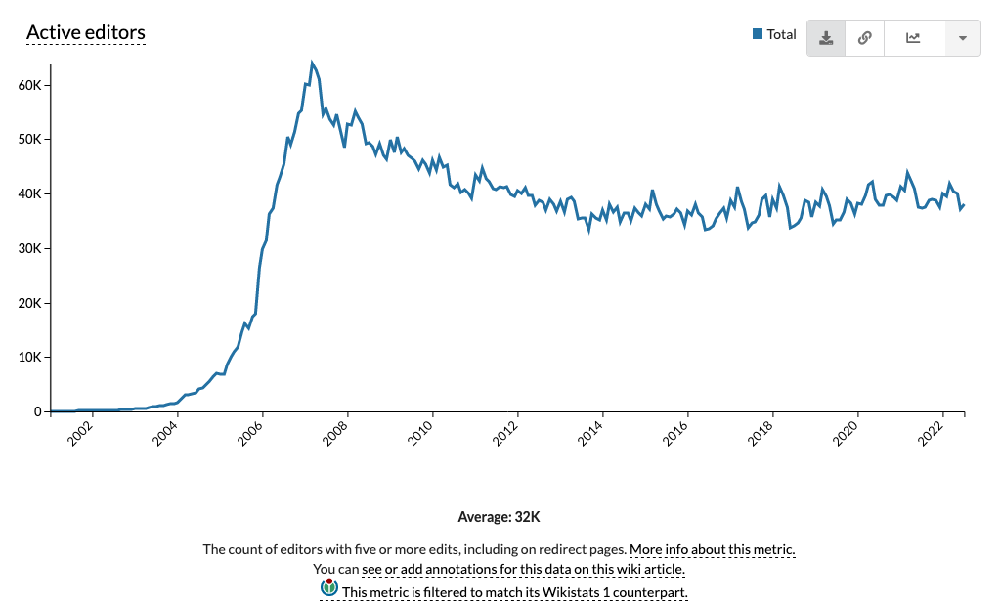

## Arabic -- Active Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z         1044  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z          968  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


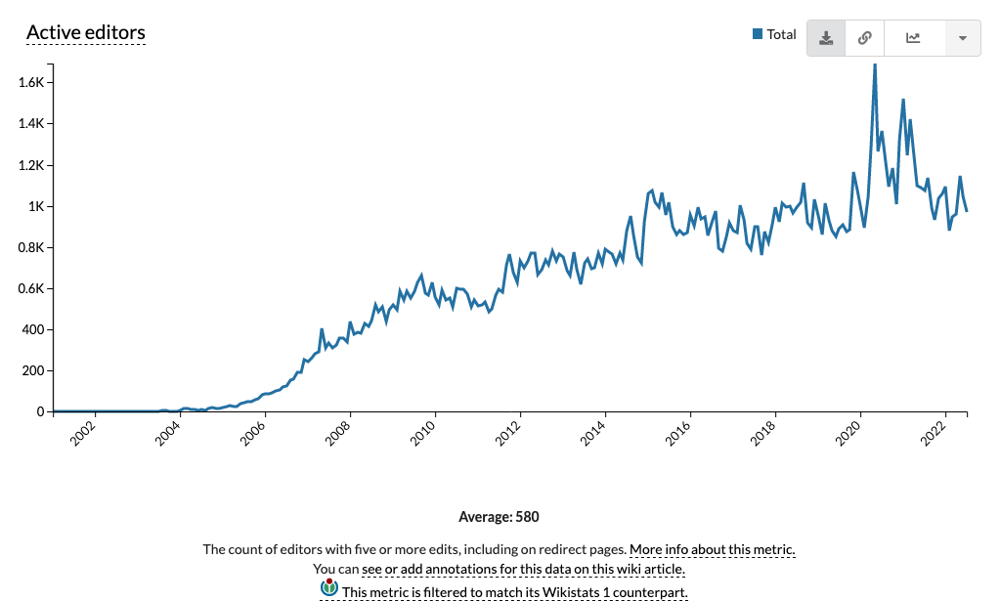

## Egyptian Arabic -- Active Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z           26  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z           23  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


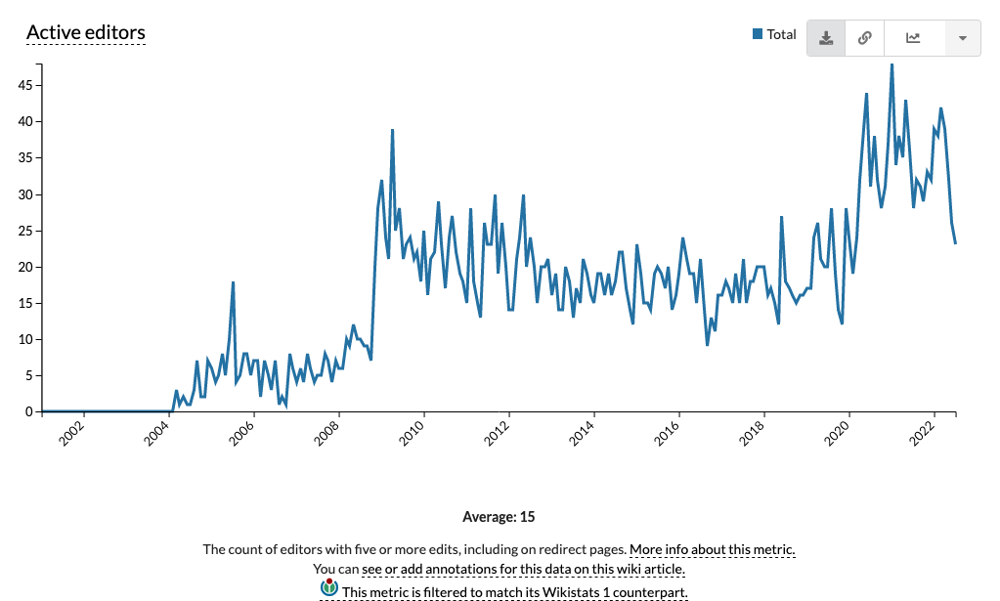

## Moroccan Arabic -- Active Editors --no-filters:

                        month  total.total           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z            0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z            0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...          ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            9  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z           10  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


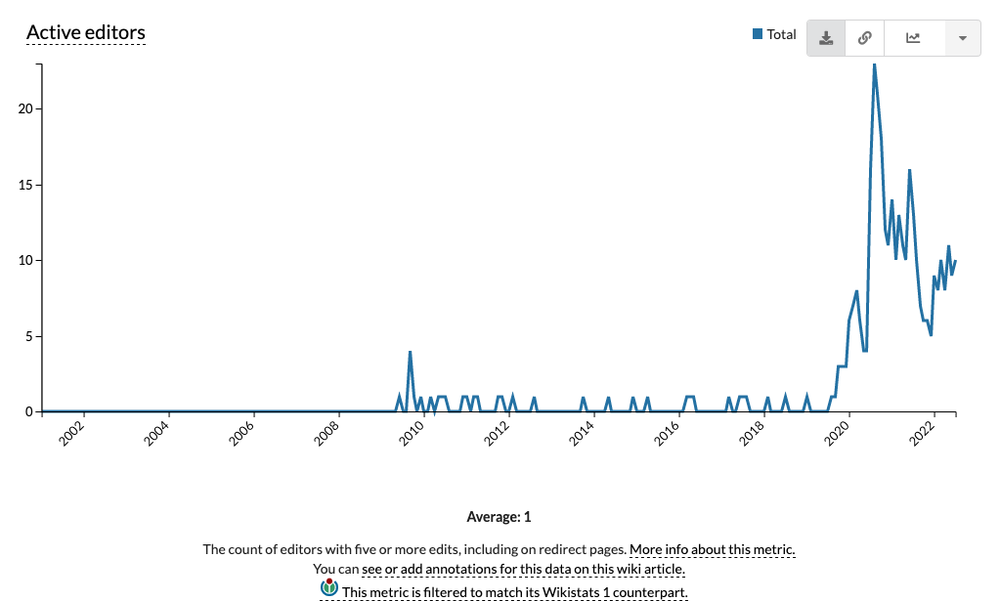

In [30]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/active-editors/full|line|all|(page_type)~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/active-editors--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/active-editors--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Active Editors --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Active Editors `--page-type`:

## English -- Active Editors --page-type:

                        month  total.content  total.non-content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z             12                  3  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z             19                  4  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...            ...                ...                       ...                       ...
257  2022-06-01T00:00:00.000Z          30571              13173  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z          31360              13711  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


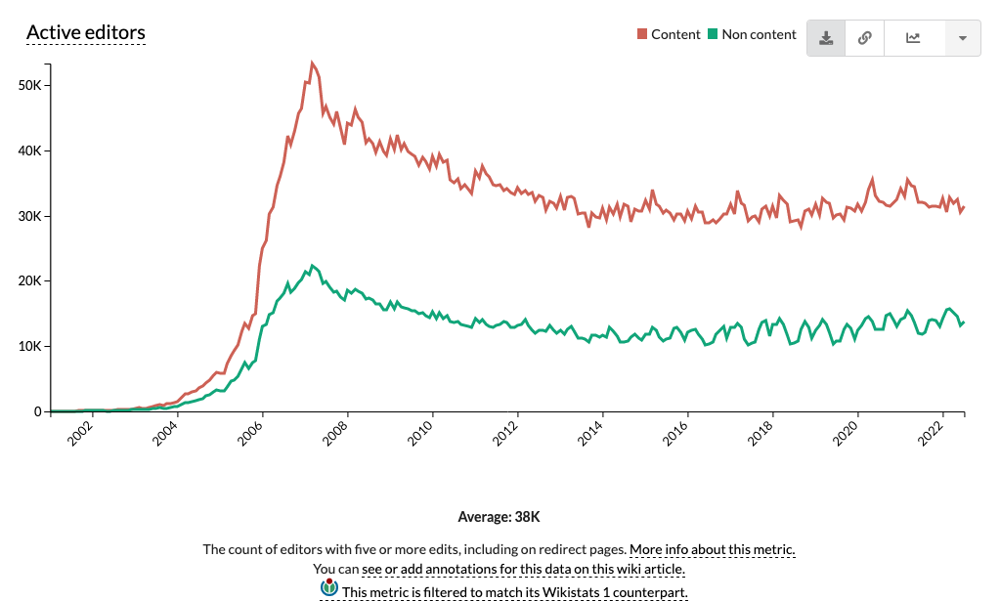

## Arabic -- Active Editors --page-type:

                        month  total.content  total.non-content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z              0                  0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z              0                  0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...            ...                ...                       ...                       ...
257  2022-06-01T00:00:00.000Z            699                469  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z            658                449  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


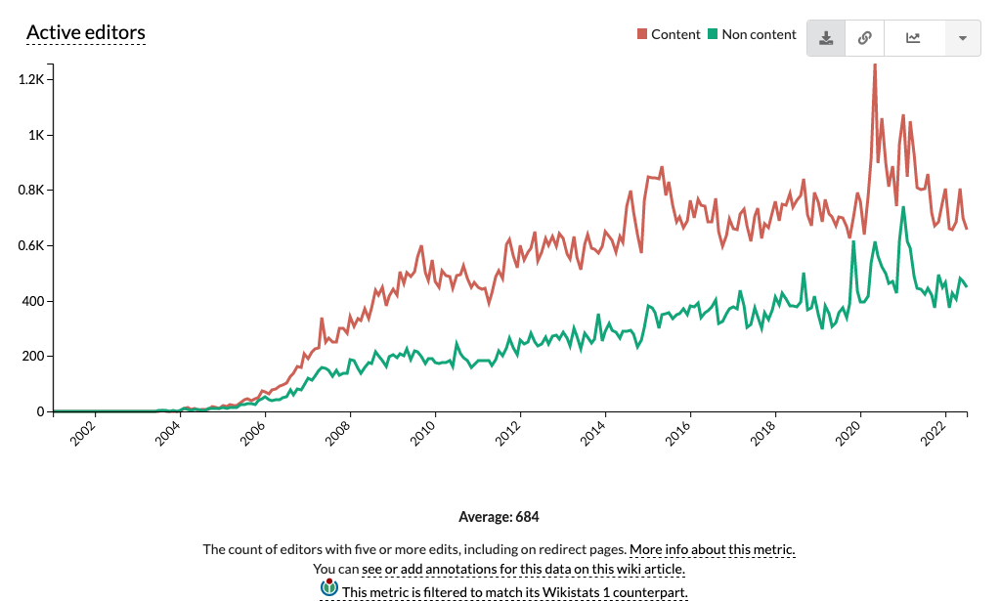

## Egyptian Arabic -- Active Editors --page-type:

                        month  total.content  total.non-content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z              0                  0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z              0                  0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...            ...                ...                       ...                       ...
257  2022-06-01T00:00:00.000Z             19                 11  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z             16                 15  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


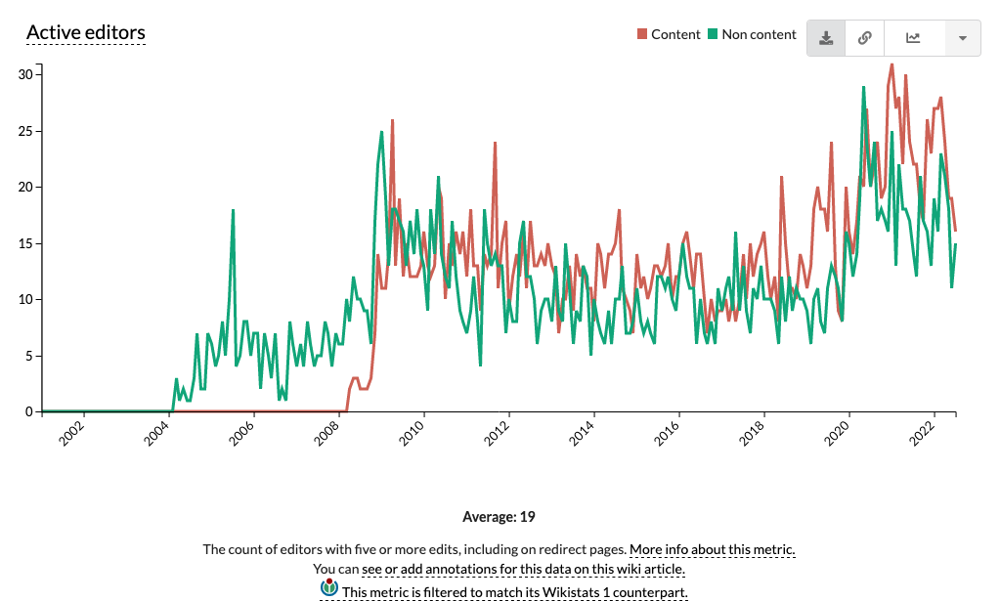

## Moroccan Arabic -- Active Editors --page-type:

                        month  total.content  total.non-content           timeRange.start             timeRange.end
0    2001-01-01T00:00:00.000Z              0                  0  2001-01-01T00:00:00.000Z  2001-02-01T00:00:00.000Z
1    2001-02-01T00:00:00.000Z              0                  0  2001-02-01T00:00:00.000Z  2001-03-01T00:00:00.000Z
..                        ...            ...                ...                       ...                       ...
257  2022-06-01T00:00:00.000Z              8                  5  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
258  2022-07-01T00:00:00.000Z              7                  6  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


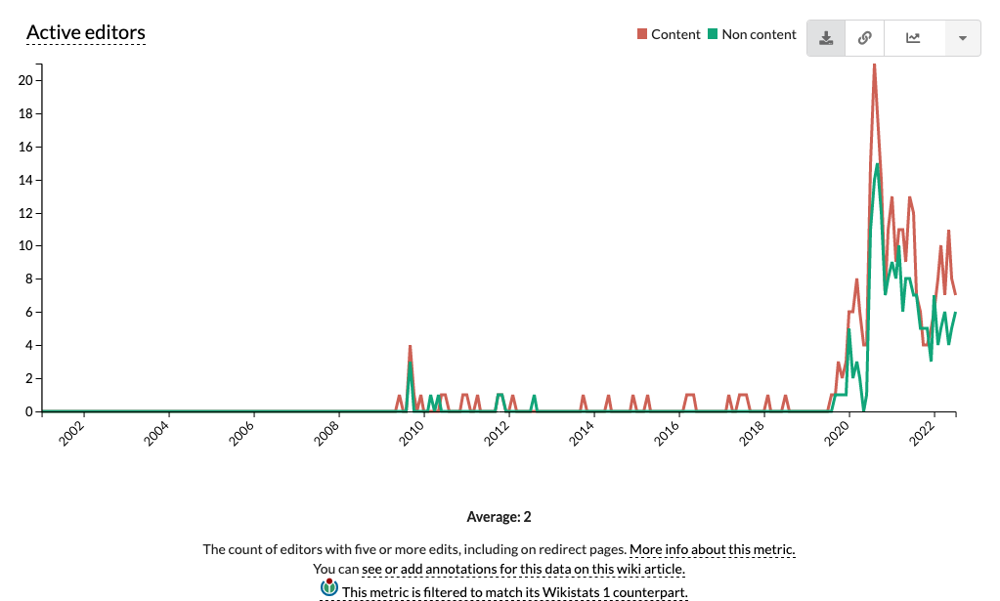

In [31]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/active-editors/full|line|all|page_type~content*non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/active-editors--page-type--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/active-editors--page-type--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Active Editors --page-type:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Active Editors `--by-country`:

##### 3.1 Active Editors `--by-country-5-to-99-edits`:

## English -- Active Editors --by-country-5-to-99-edits:

    country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0        US     1  1656633600000        19200  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1        GB     2  1656633600000         6660  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..      ...   ...            ...          ...                       ...                       ...                       ...
161      BJ   162  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
162      BM   163  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


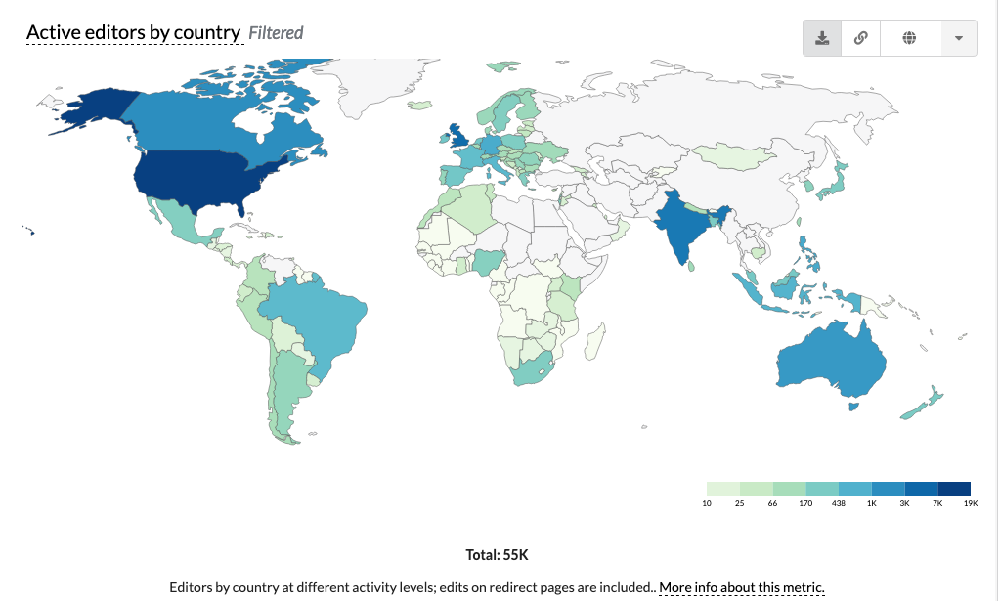

## Arabic -- Active Editors --by-country-5-to-99-edits:

   country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0       DZ     1  1656633600000           80  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1       JO     2  1656633600000           60  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..     ...   ...            ...          ...                       ...                       ...                       ...
38      TD    39  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
39      IL    40  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


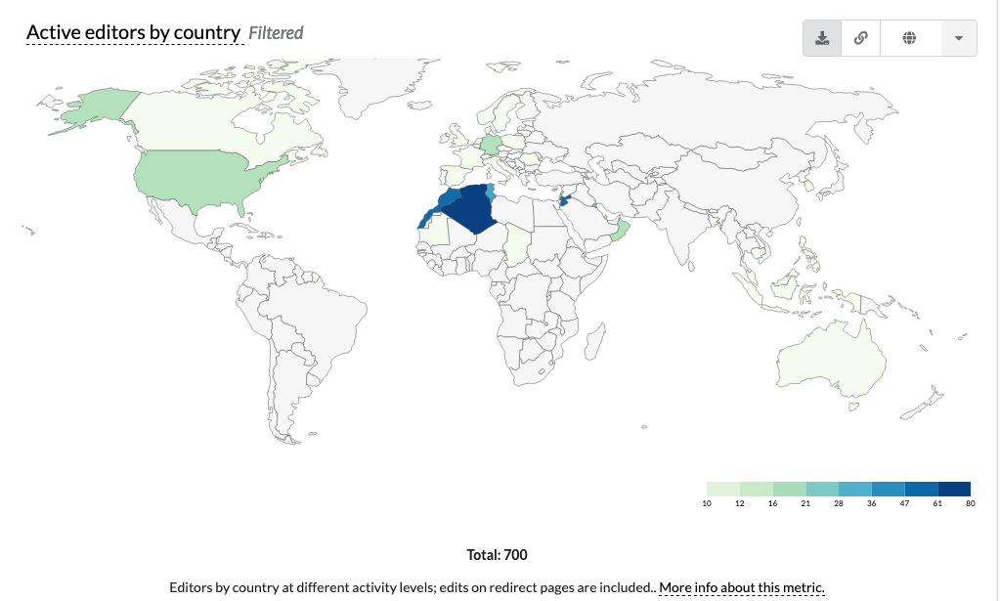

## Egyptian Arabic -- Active Editors --by-country-5-to-99-edits:

   country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0       --     1  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1       DE     2  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..     ...   ...            ...          ...                       ...                       ...                       ...
8       OM     9  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
9       PS    10  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


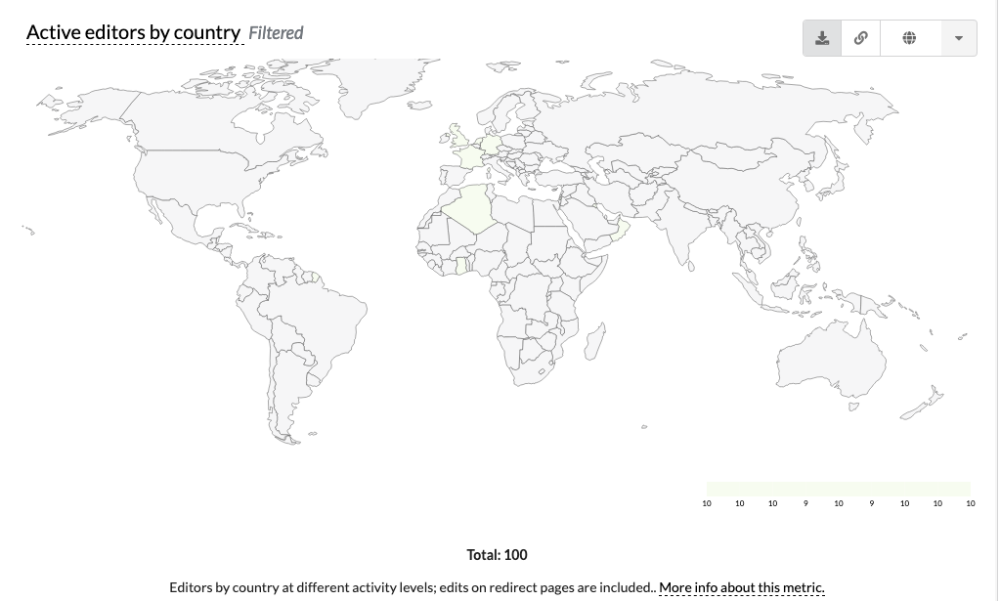

## Moroccan Arabic -- Active Editors --by-country-5-to-99-edits:

  country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0      DZ     1  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      MA     2  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2      SE     3  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
3      US     4  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
4      ZA     5  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


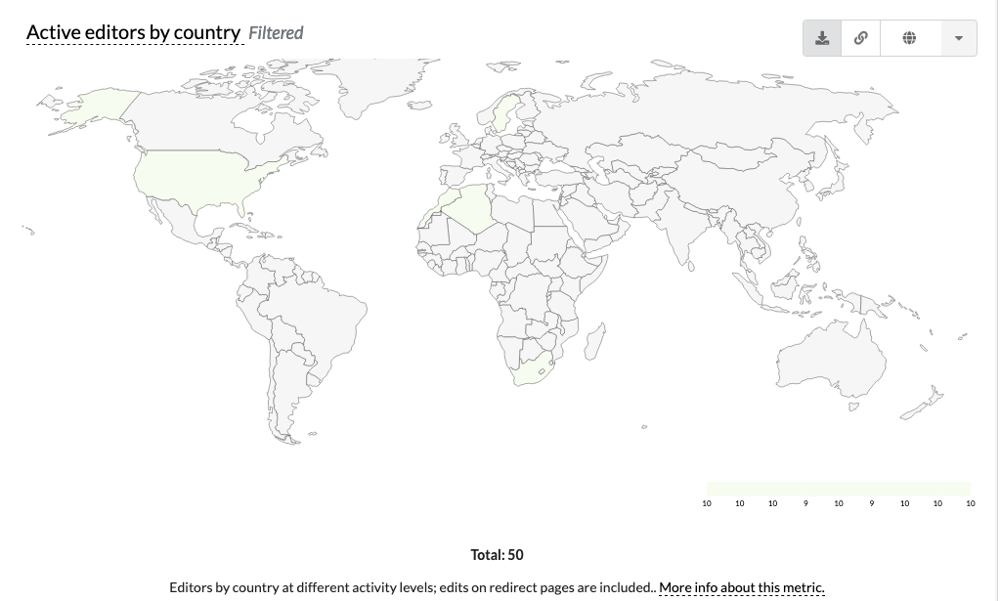

In [32]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/active-editors-by-country/full|map|last-month|(activity-level)~5..99-edits|monthly')

    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/active-editors--by-country-5-to-99-edits--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/active-editors--by-country-5-to-99-edits--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Active Editors --by-country-5-to-99-edits:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

##### 3.2 Active Editors `--by-country-100-to-more-edits`:

## English -- Active Editors --by-country-100-to-more-edits:

    country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0        US     1  1656633600000        19200  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1        GB     2  1656633600000         6660  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..      ...   ...            ...          ...                       ...                       ...                       ...
161      BJ   162  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
162      BM   163  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


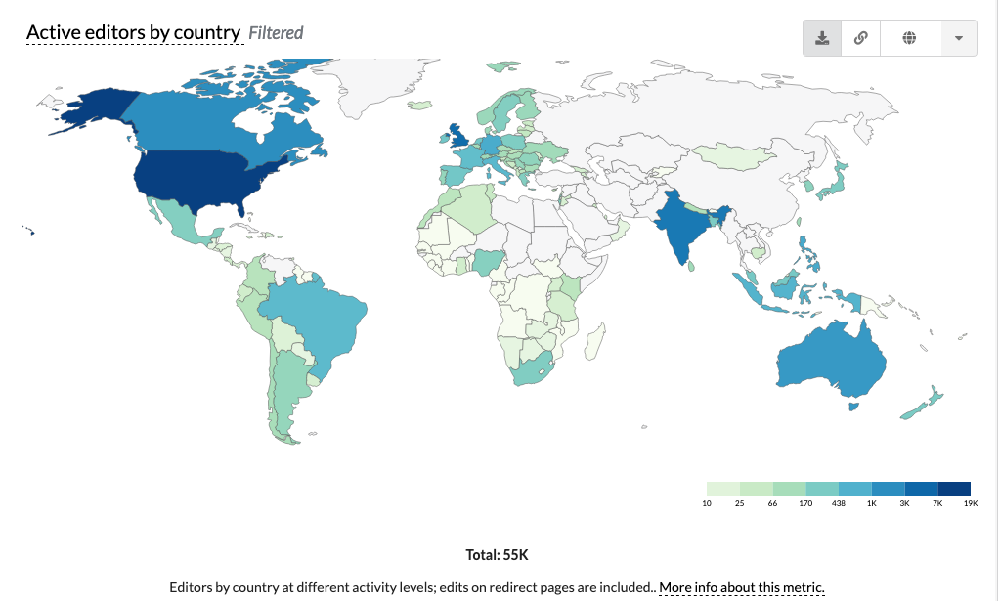

## Arabic -- Active Editors --by-country-100-to-more-edits:

   country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0       DZ     1  1656633600000           80  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1       JO     2  1656633600000           60  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..     ...   ...            ...          ...                       ...                       ...                       ...
38      TD    39  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
39      IL    40  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


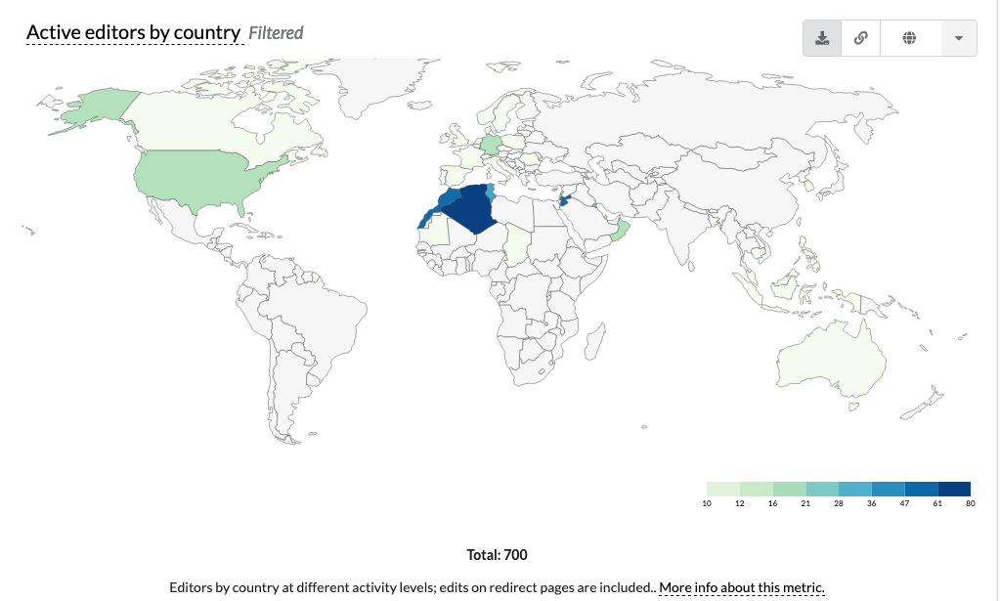

## Egyptian Arabic -- Active Editors --by-country-100-to-more-edits:

   country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0       --     1  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1       DE     2  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..     ...   ...            ...          ...                       ...                       ...                       ...
8       OM     9  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
9       PS    10  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


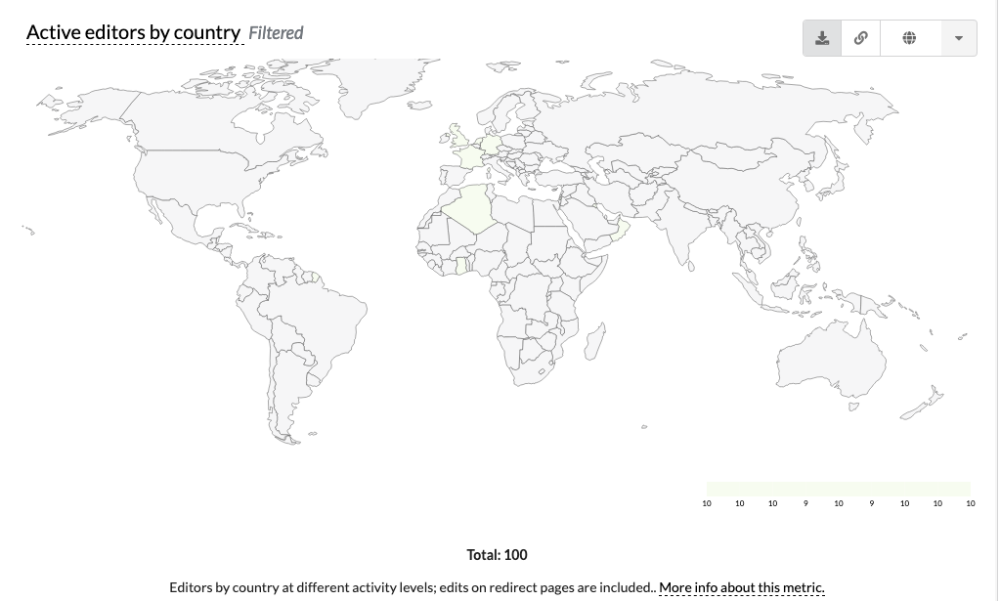

## Moroccan Arabic -- Active Editors --by-country-100-to-more-edits:

  country  rank      timestamp  total.total                     month           timeRange.start             timeRange.end
0      DZ     1  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      MA     2  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2      SE     3  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
3      US     4  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
4      ZA     5  1656633600000           10  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


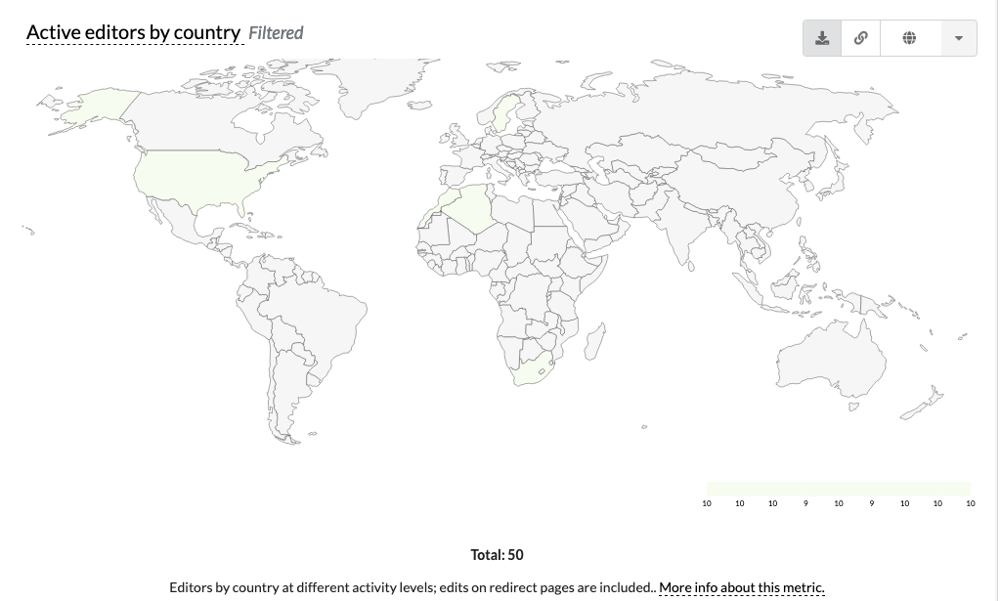

In [33]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/active-editors-by-country/full|map|last-month|(activity-level)~100..-edits|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/active-editors--by-country-100-to-more-edits--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/active-editors--by-country-100-to-more-edits--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Active Editors --by-country-100-to-more-edits:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

### vii. Top Editors:

In [34]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Top Editors `--no-filters`:

## English -- Top Editors --no-filters:

                 user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0             MalnadachBot     1  2022-07-01T00:00:00.000Z       816835  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Ser Amantio di Nicolao     2  2022-07-01T00:00:00.000Z       149726  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                     ...   ...                       ...          ...                       ...                       ...                       ...
98        Another Believer    99  2022-07-01T00:00:00.000Z         3760  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                  Dl2000   100  2022-07-01T00:00:00.000Z         3757  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


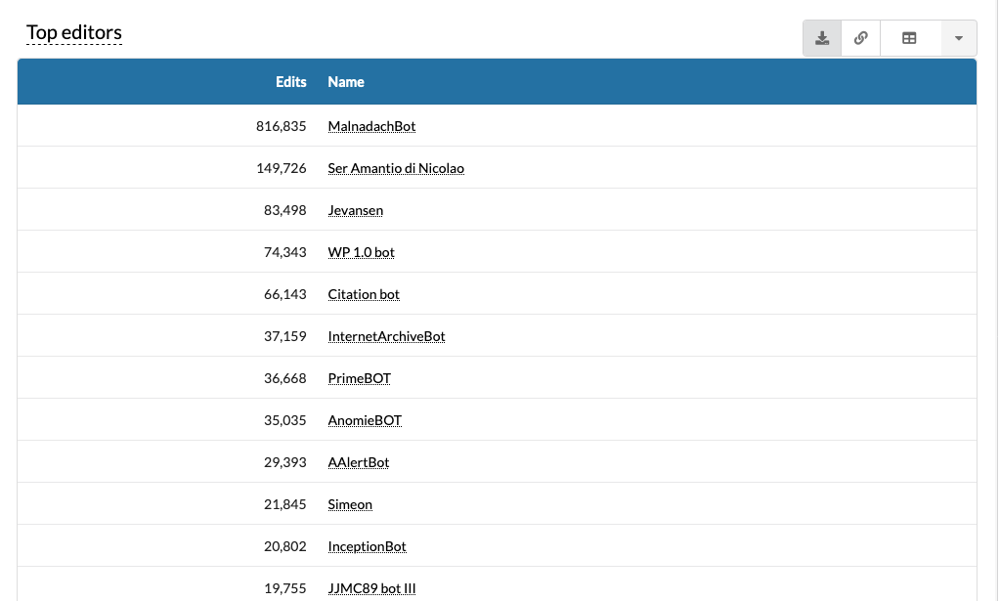

## Arabic -- Top Editors --no-filters:

         user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           JarBot     1  2022-07-01T00:00:00.000Z       170417  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        51308  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..             ...   ...                       ...          ...                       ...                       ...                       ...
98         "Yahia"    99  2022-07-01T00:00:00.000Z          202  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Superstrongboy   100  2022-07-01T00:00:00.000Z          201  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


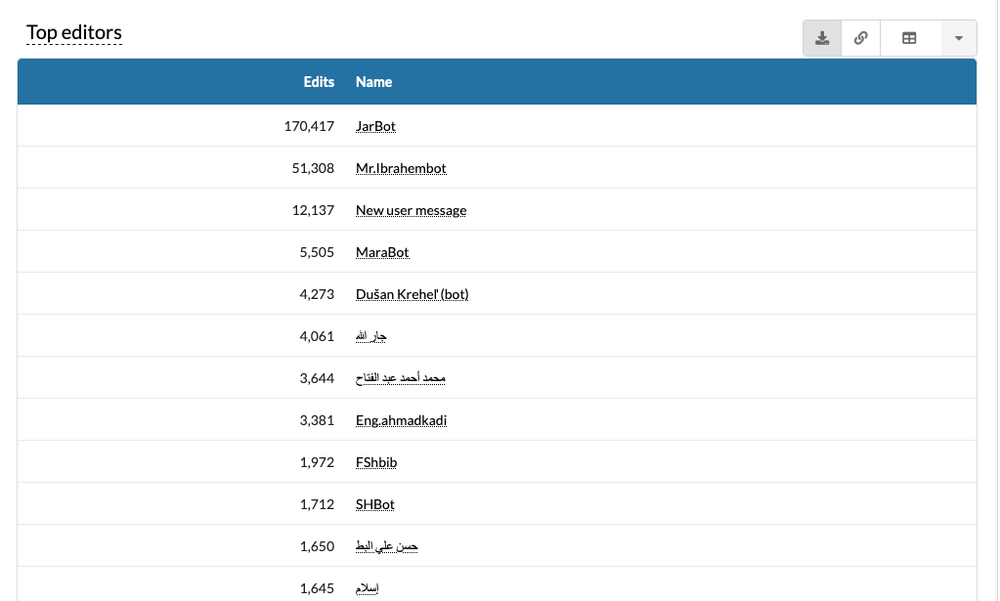

## Egyptian Arabic -- Top Editors --no-filters:

                user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0             HitomiAkane     1  2022-07-01T00:00:00.000Z        25055  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                GhalyBot     2  2022-07-01T00:00:00.000Z        10955  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                    ...   ...                       ...          ...                       ...                       ...                       ...
60  Ꭿ Ꮋ Ꮇ Ꭼ Ꭰ Ꮇ Ꮻ Ꮋ Ꮪ Ꭼ Ꮑ    61  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
61                    源義信    62  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


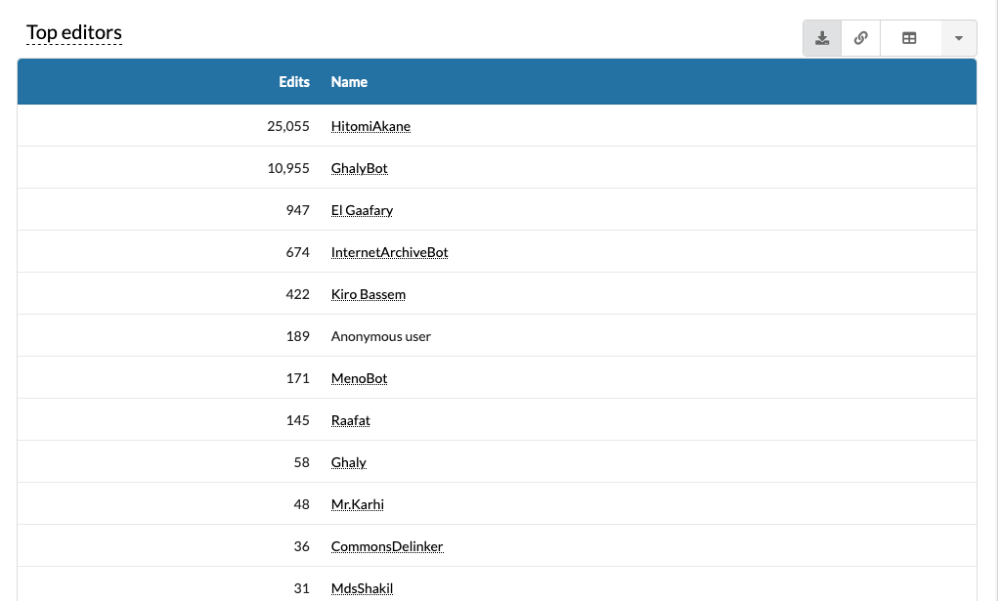

## Moroccan Arabic -- Top Editors --no-filters:

       user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0      DarijaBot     1  2022-07-01T00:00:00.000Z         3562  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    Ideophagous     2  2022-07-01T00:00:00.000Z         1043  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..           ...   ...                       ...          ...                       ...                       ...                       ...
32    Praxidicae    33  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
33  Rachidourkia    34  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


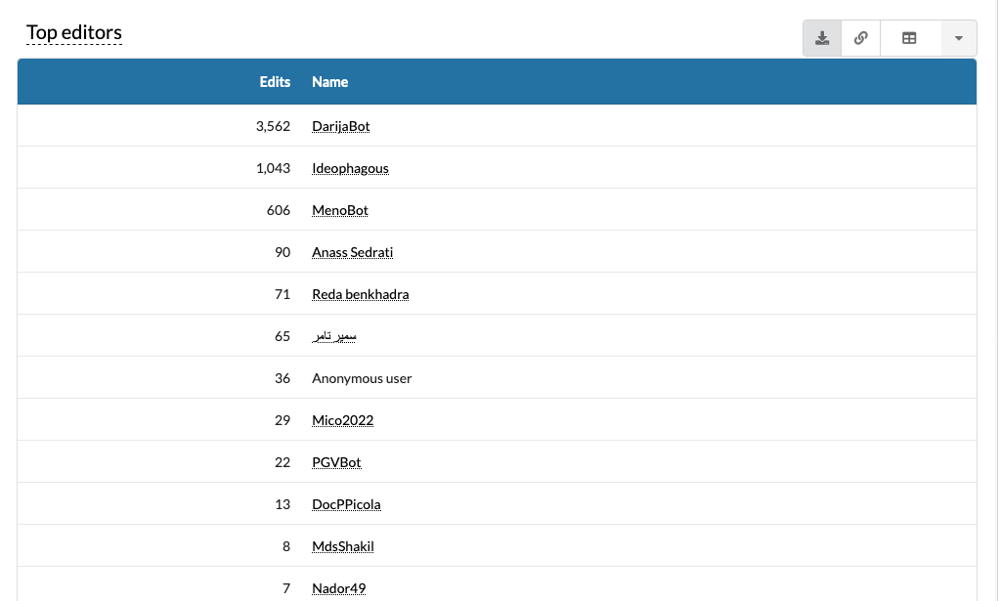

In [35]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
    
    csvName = f"Wikimedia-Stats-CSVs/top-editors--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Top Editors `--page-type`:

##### 2.1. Top Editors `--page-type-content`:

## English -- Top Editors --page-type-content:

                 user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Ser Amantio di Nicolao     1  2022-07-01T00:00:00.000Z       146347  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1             Citation bot     2  2022-07-01T00:00:00.000Z        65566  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                     ...   ...                       ...          ...                       ...                       ...                       ...
98                Ridzaina    99  2022-07-01T00:00:00.000Z         2327  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                Th78blue   100  2022-07-01T00:00:00.000Z         2302  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


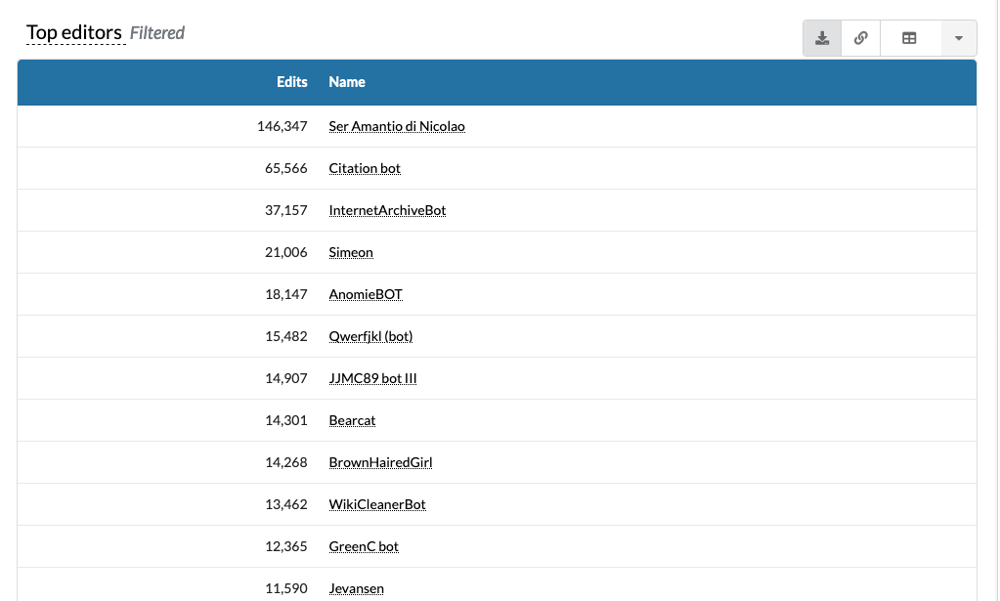

## Arabic -- Top Editors --page-type-content:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          JarBot     1  2022-07-01T00:00:00.000Z       145027  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        32010  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98         Ala Ef    99  2022-07-01T00:00:00.000Z          138  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99        بن خليف   100  2022-07-01T00:00:00.000Z          137  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


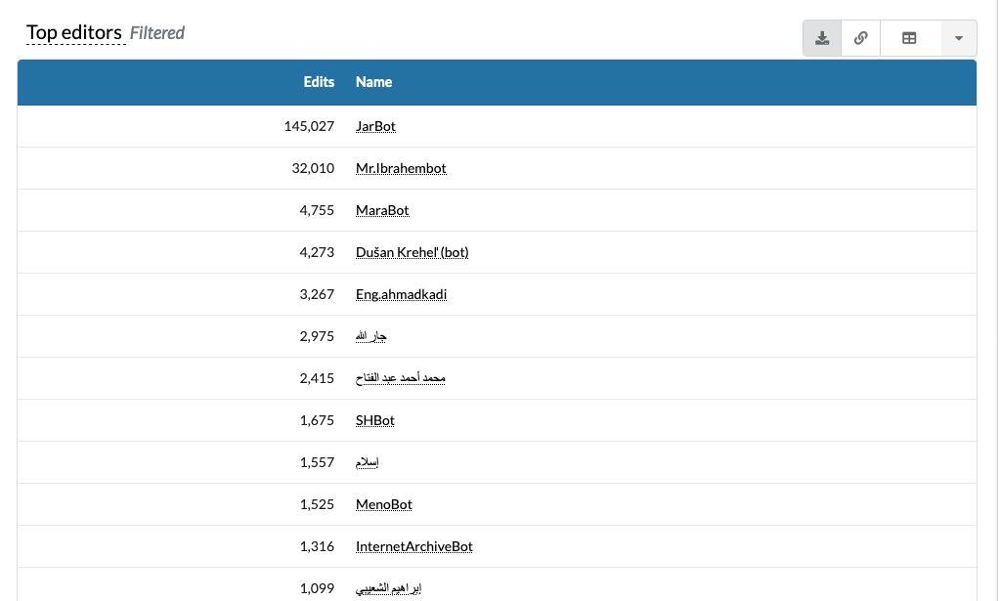

## Egyptian Arabic -- Top Editors --page-type-content:

                user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                GhalyBot     1  2022-07-01T00:00:00.000Z        10943  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1             HitomiAkane     2  2022-07-01T00:00:00.000Z         9258  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                    ...   ...                       ...          ...                       ...                       ...                       ...
33  Ꭿ Ꮋ Ꮇ Ꭼ Ꭰ Ꮇ Ꮻ Ꮋ Ꮪ Ꭼ Ꮑ    34  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
34                    源義信    35  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


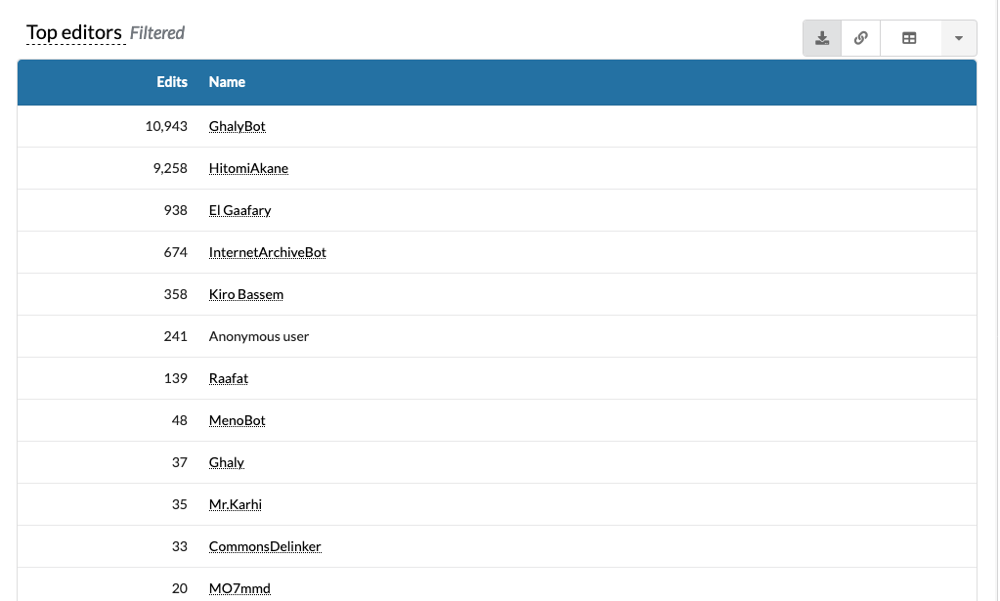

## Moroccan Arabic -- Top Editors --page-type-content:

      user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     DarijaBot     1  2022-07-01T00:00:00.000Z         2644  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Ideophagous     2  2022-07-01T00:00:00.000Z          712  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..          ...   ...                       ...          ...                       ...                       ...                       ...
24       Ruwaym    25  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
25         باسم    26  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


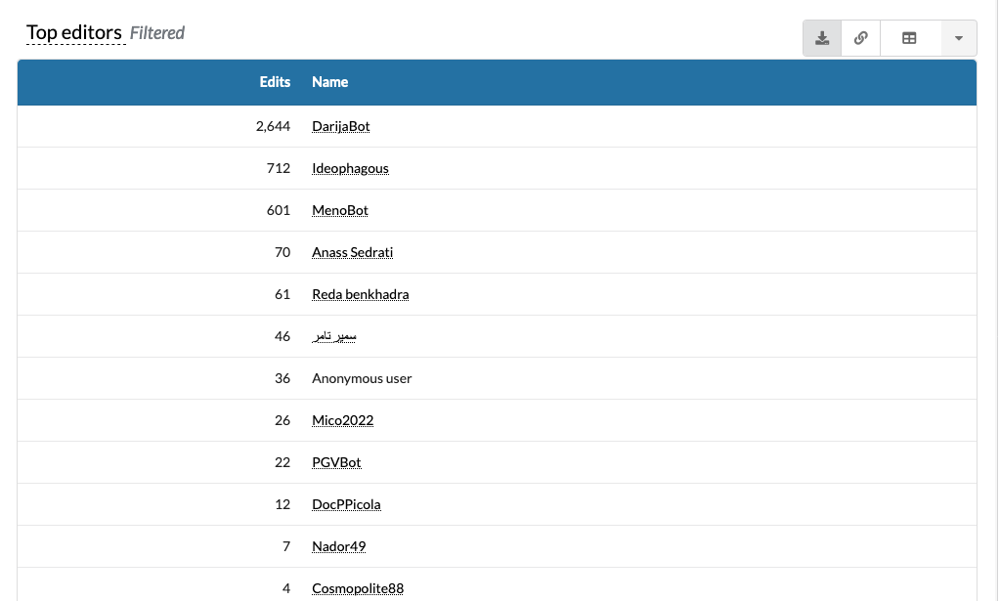

In [36]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-content--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-content--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-content:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

##### 2.2. Top Editors `--page-type-non-content`:

## English -- Top Editors --page-type-non-content:

       user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   MalnadachBot     1  2022-07-01T00:00:00.000Z       814953  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1     WP 1.0 bot     2  2022-07-01T00:00:00.000Z        74343  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..           ...   ...                       ...          ...                       ...                       ...                       ...
98         Aoidh    99  2022-07-01T00:00:00.000Z         1543  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99       Hugo999   100  2022-07-01T00:00:00.000Z         1540  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


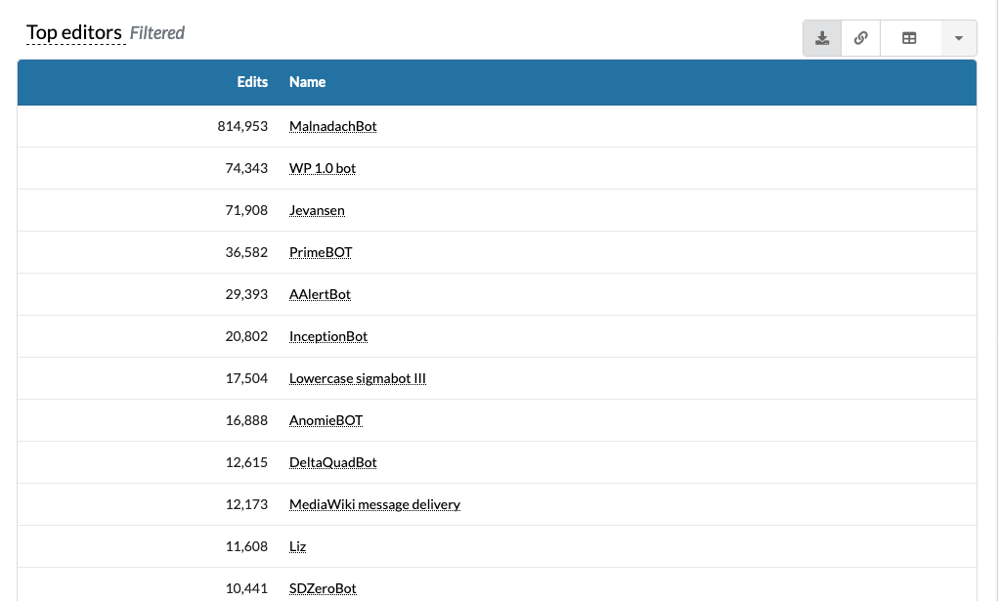

## Arabic -- Top Editors --page-type-non-content:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          JarBot     1  2022-07-01T00:00:00.000Z        25390  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        19298  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98  Abdeldjalil09    99  2022-07-01T00:00:00.000Z           36  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99            عمر   100  2022-07-01T00:00:00.000Z           36  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


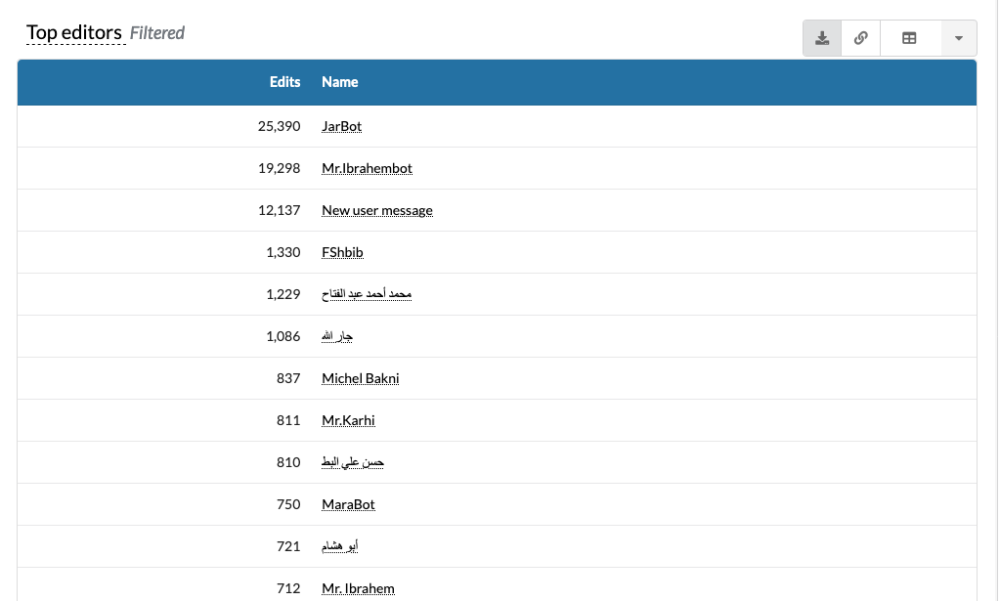

## Egyptian Arabic -- Top Editors --page-type-non-content:

          user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0       HitomiAkane     1  2022-07-01T00:00:00.000Z        15797  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1           MenoBot     2  2022-07-01T00:00:00.000Z          123  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..              ...   ...                       ...          ...                       ...                       ...                       ...
88  Samiralhubaishi    89  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
89           AIEDMW    90  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


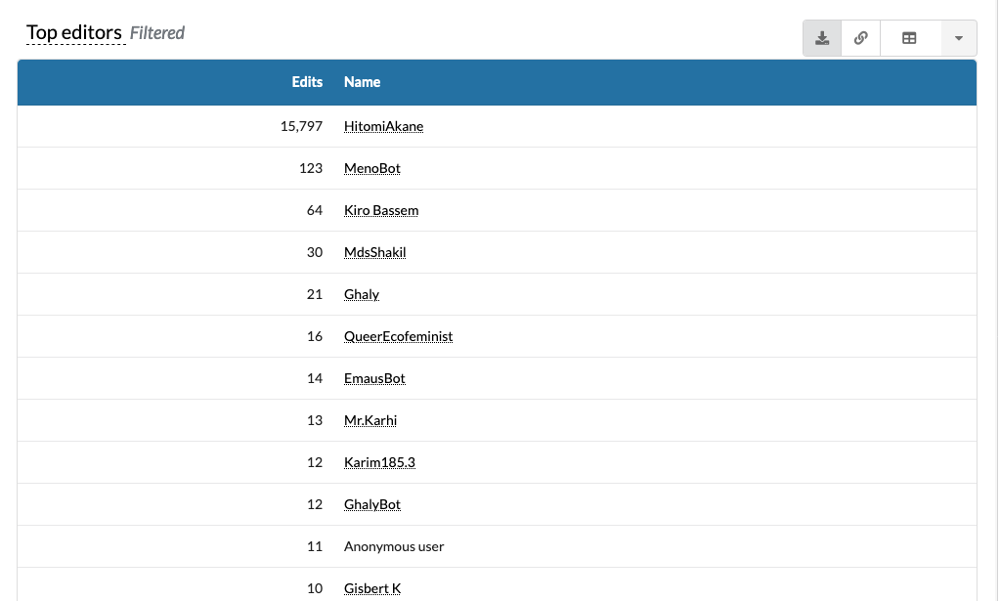

## Moroccan Arabic -- Top Editors --page-type-non-content:

       user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0      DarijaBot     1  2022-07-01T00:00:00.000Z          918  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    Ideophagous     2  2022-07-01T00:00:00.000Z          331  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..           ...   ...                       ...          ...                       ...                       ...                       ...
18  Rachidourkia    19  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
19        Ruwaym    20  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


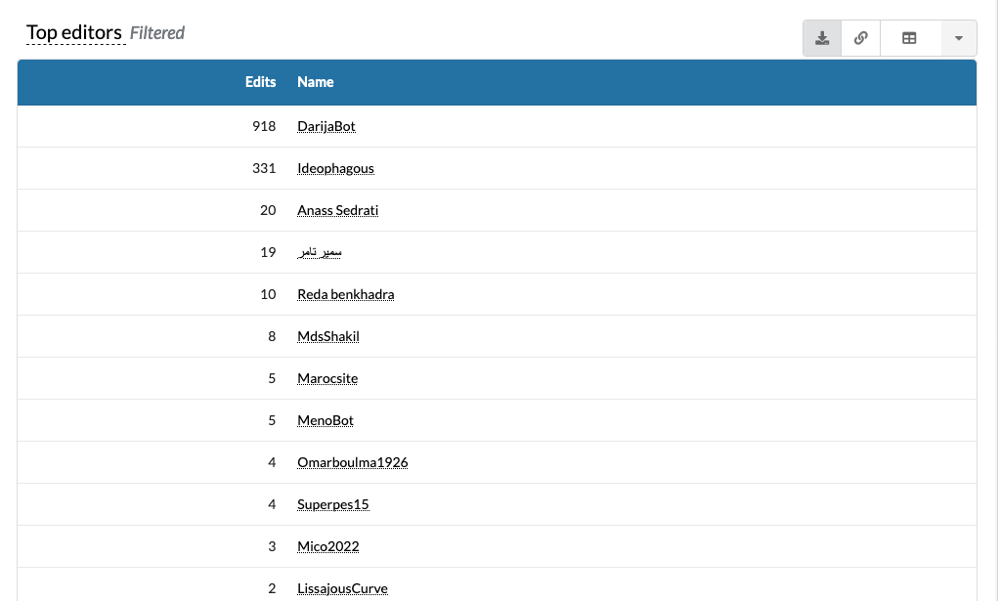

In [37]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-non-content--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-non-content--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-non-content:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Top Editors `--editor-type`:

##### 3.1. Top Editors `--editor-type-anonymous`:

## English -- Top Editors --editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z        39806  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


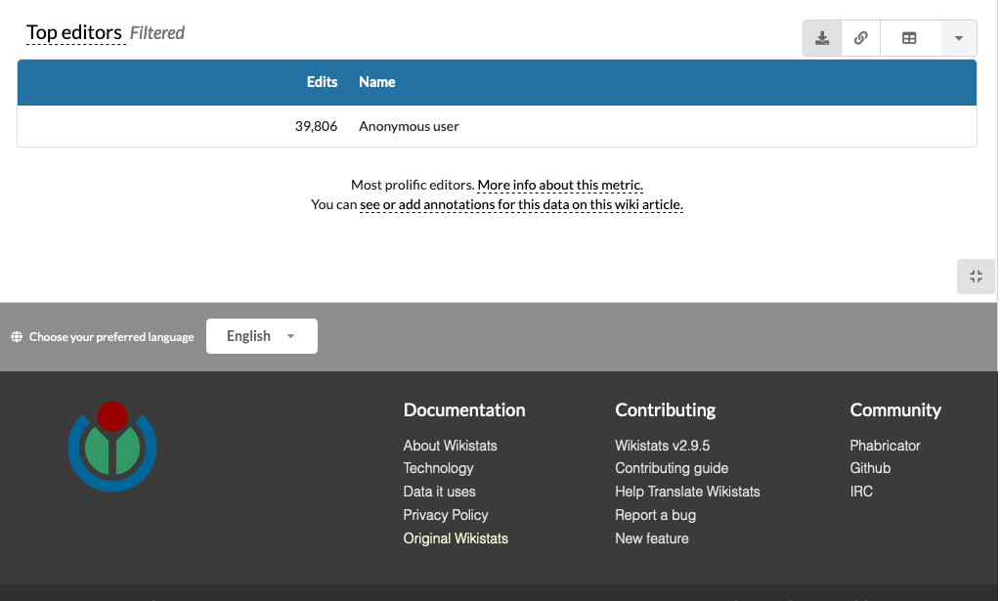

## Arabic -- Top Editors --editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z         1533  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


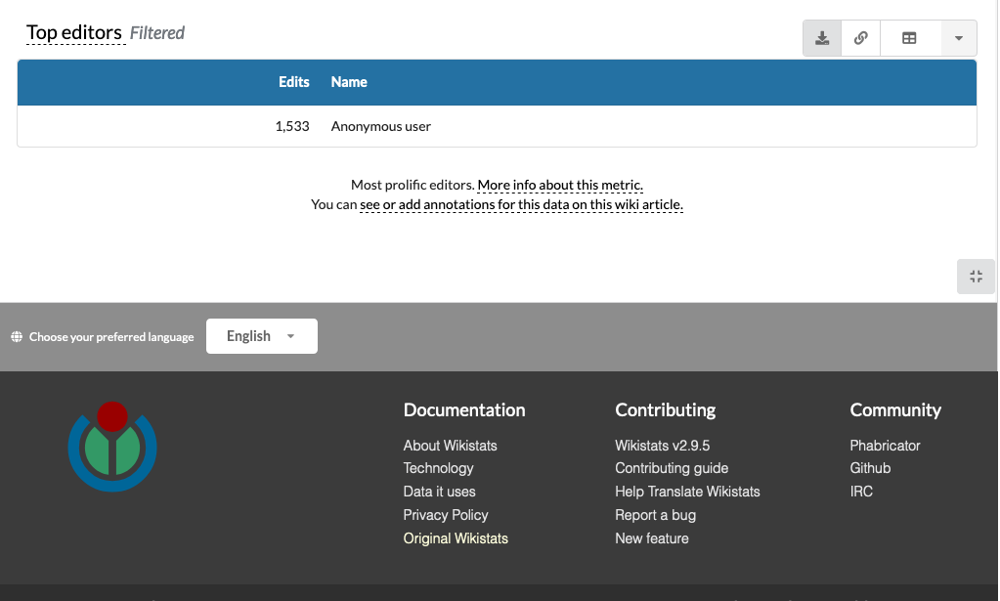

## Egyptian Arabic -- Top Editors --editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z          281  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


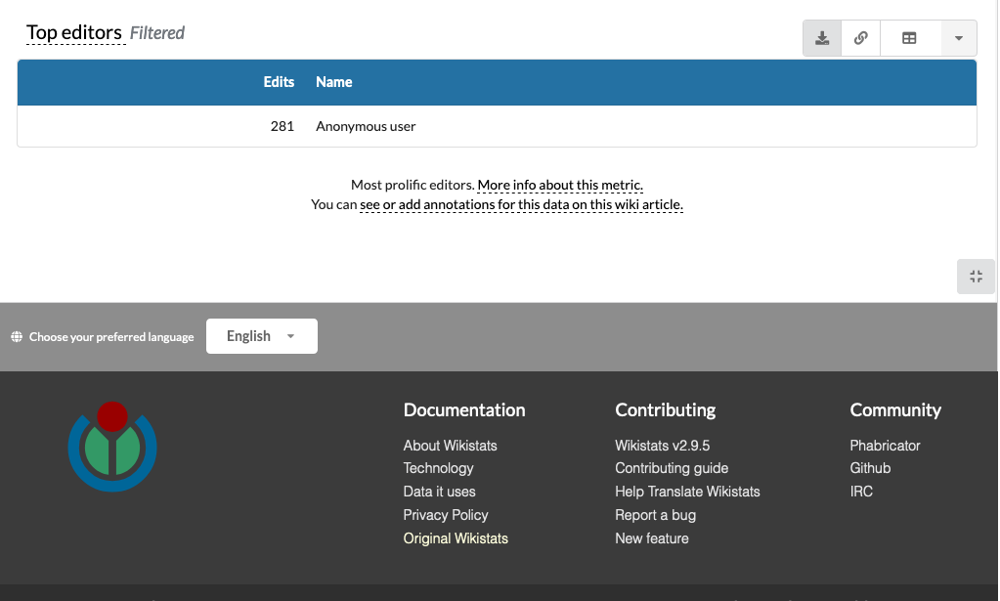

## Moroccan Arabic -- Top Editors --editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z           36  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


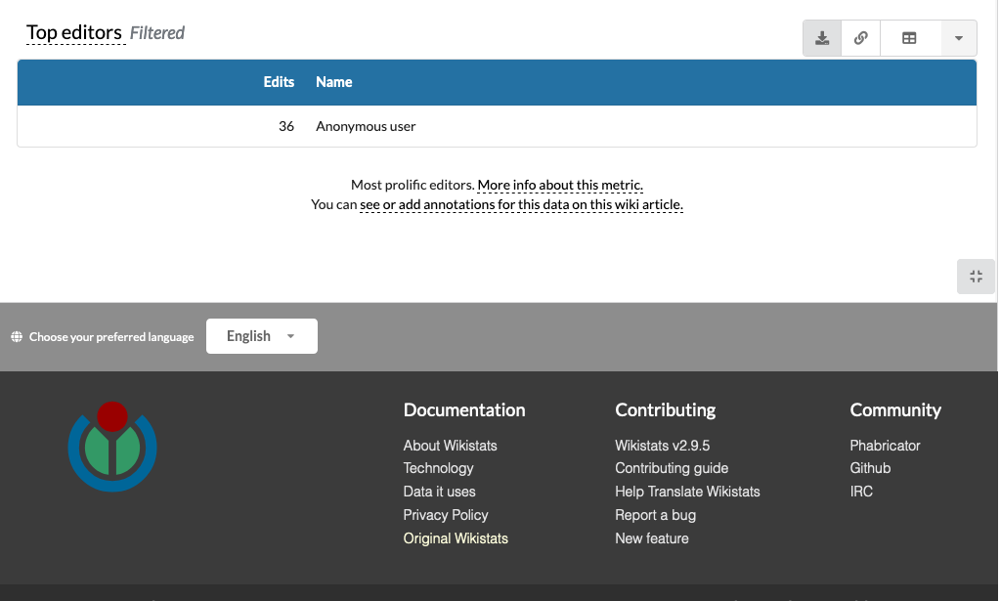

In [38]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~anonymous|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--editor-type-anonymous--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --editor-type-anonymous:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

##### 3.2. Top Editors `--editor-type-group-bot`:

## English -- Top Editors --editor-type-group-bot:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0    MalnadachBot     1  2022-07-01T00:00:00.000Z       816835  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      WP 1.0 bot     2  2022-07-01T00:00:00.000Z        74343  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98       NovemBot    99  2022-07-01T00:00:00.000Z           31  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  SpaceFactsBot   100  2022-07-01T00:00:00.000Z           31  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


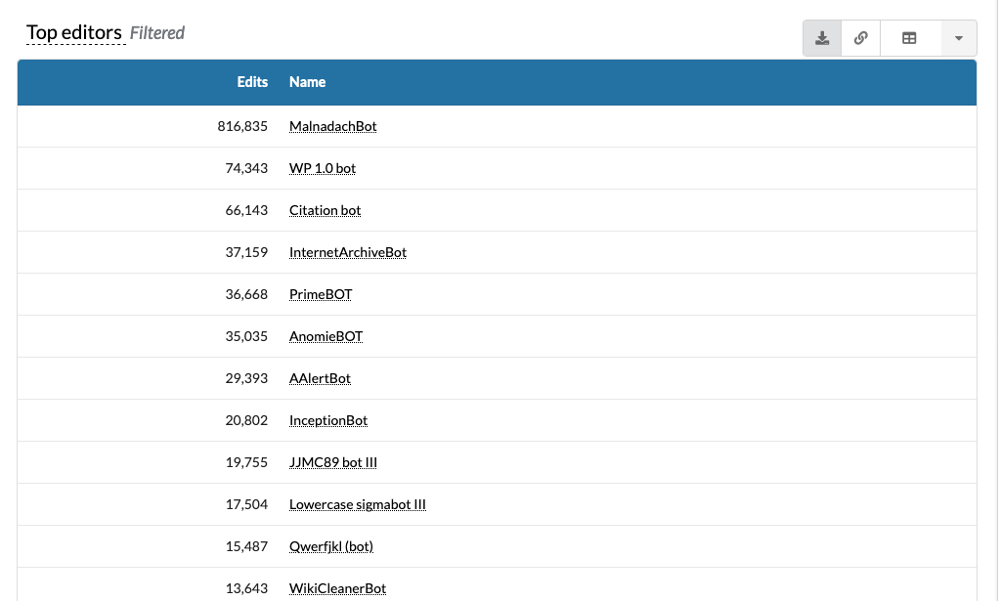

## Arabic -- Top Editors --editor-type-group-bot:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          JarBot     1  2022-07-01T00:00:00.000Z       170417  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        51308  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
16       YiFeiBot    17  2022-07-01T00:00:00.000Z           16  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
17     ErfgoedBot    18  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


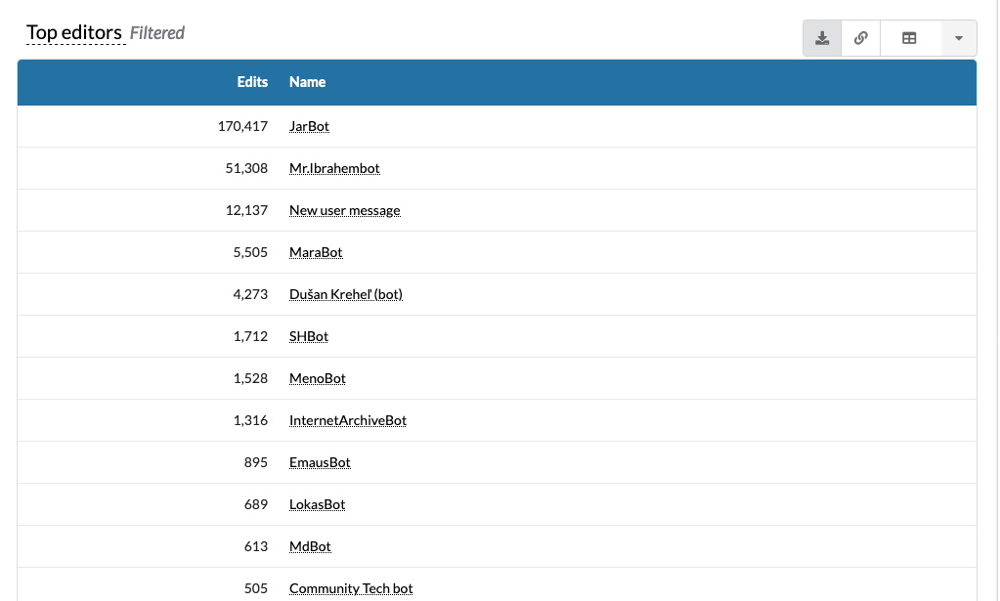

## Egyptian Arabic -- Top Editors --editor-type-group-bot:

                    user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                    GhalyBot     1  2022-07-01T00:00:00.000Z        10955  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1          InternetArchiveBot     2  2022-07-01T00:00:00.000Z          674  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2                     MenoBot     3  2022-07-01T00:00:00.000Z          171  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
3  MediaWiki message delivery     4  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


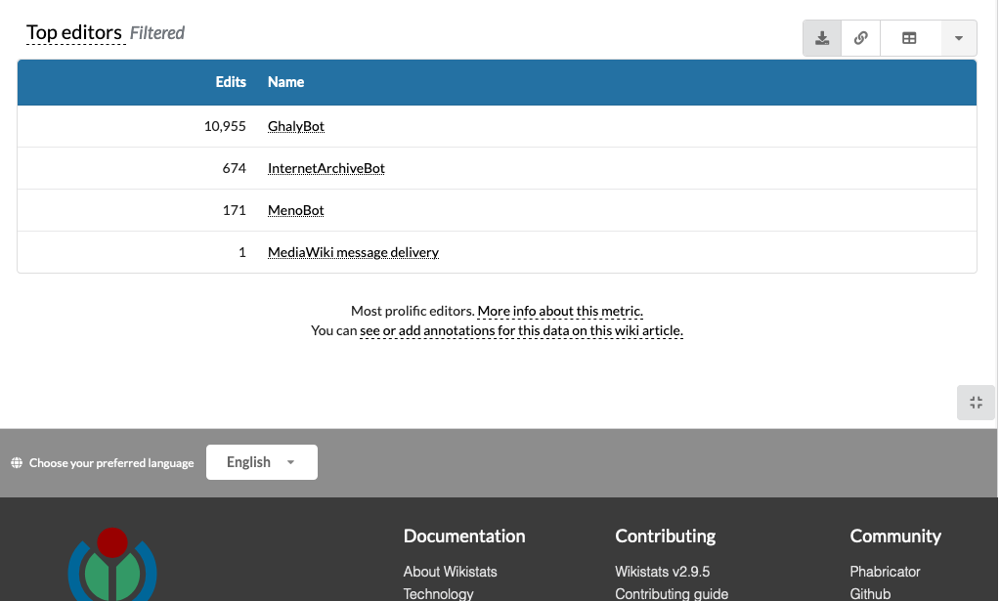

## Moroccan Arabic -- Top Editors --editor-type-group-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  DarijaBot     1  2022-07-01T00:00:00.000Z         3562  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    MenoBot     2  2022-07-01T00:00:00.000Z          606  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2     PGVBot     3  2022-07-01T00:00:00.000Z           22  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


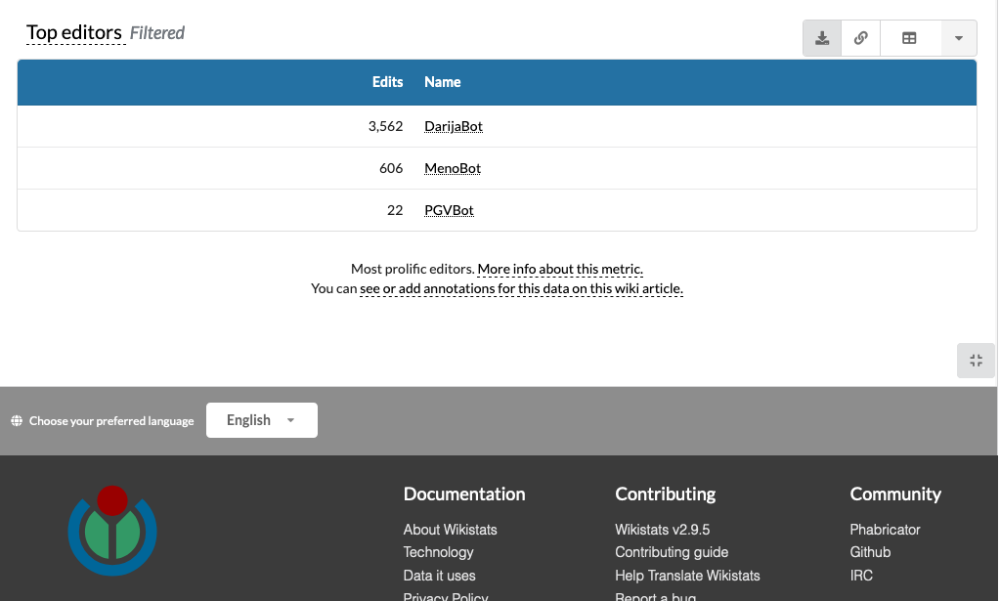

In [39]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~group-bot|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--editor-type-group-bot--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --editor-type-group-bot:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

##### 3.3. Top Editors `--editor-type-name-bot`:

## English -- Top Editors --editor-type-name-bot:

      user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     HooptyBot     1  2022-07-01T00:00:00.000Z         6061  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      XLinkBot     2  2022-07-01T00:00:00.000Z         1343  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..          ...   ...                       ...          ...                       ...                       ...                       ...
71  AlexBot2004    72  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
72    Brandybot    73  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


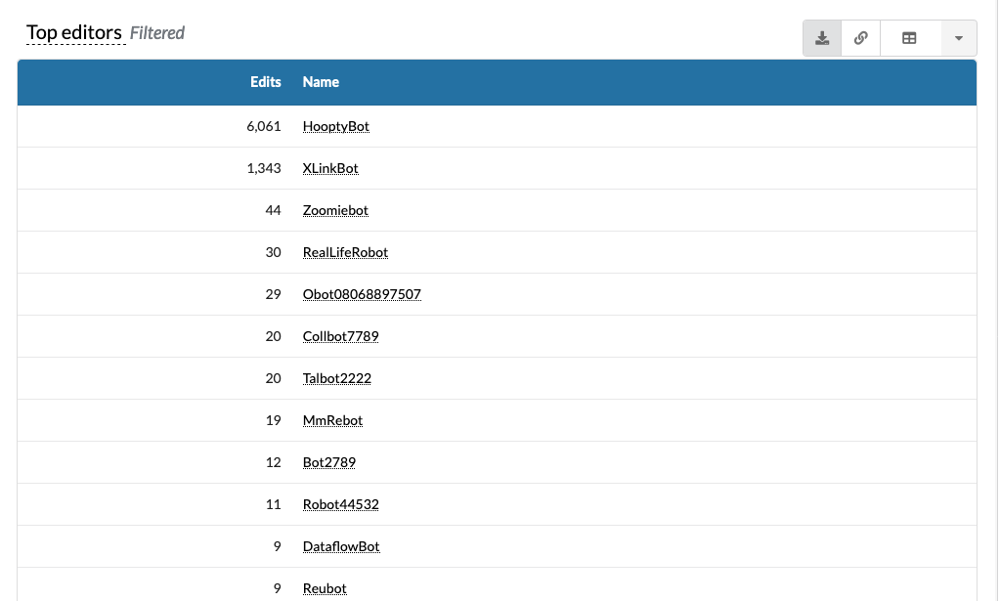

## Arabic -- Top Editors --editor-type-name-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0      HqBot     1  2022-07-01T00:00:00.000Z           32  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1  Spbot2020     2  2022-07-01T00:00:00.000Z           13  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2  Washerbot     3  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


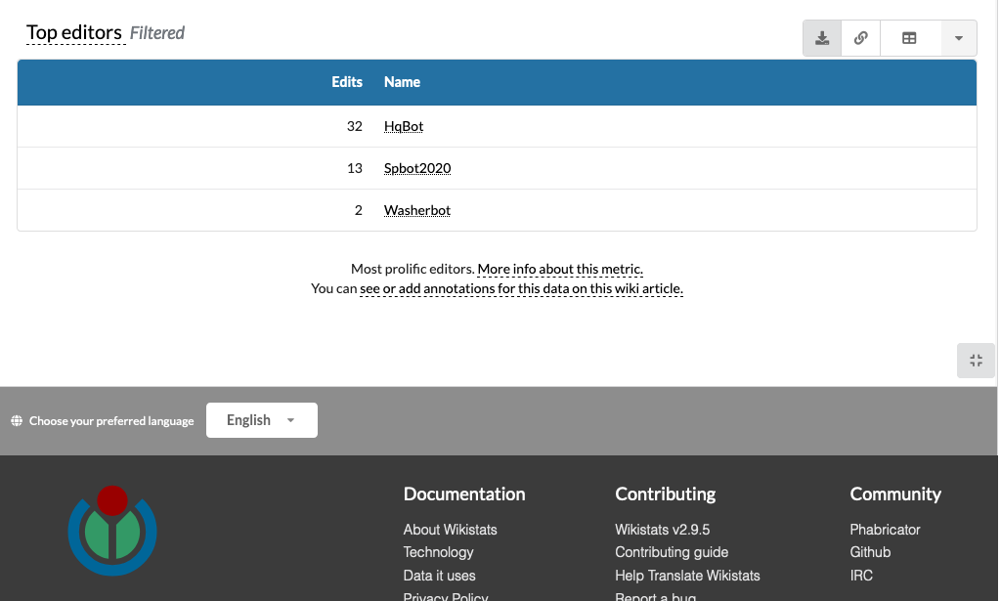

## Egyptian Arabic -- Top Editors --editor-type-name-bot:

  user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  EmausBot     1  2022-07-01T00:00:00.000Z           14  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1     Xqbot     2  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2  YiFeiBot     3  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


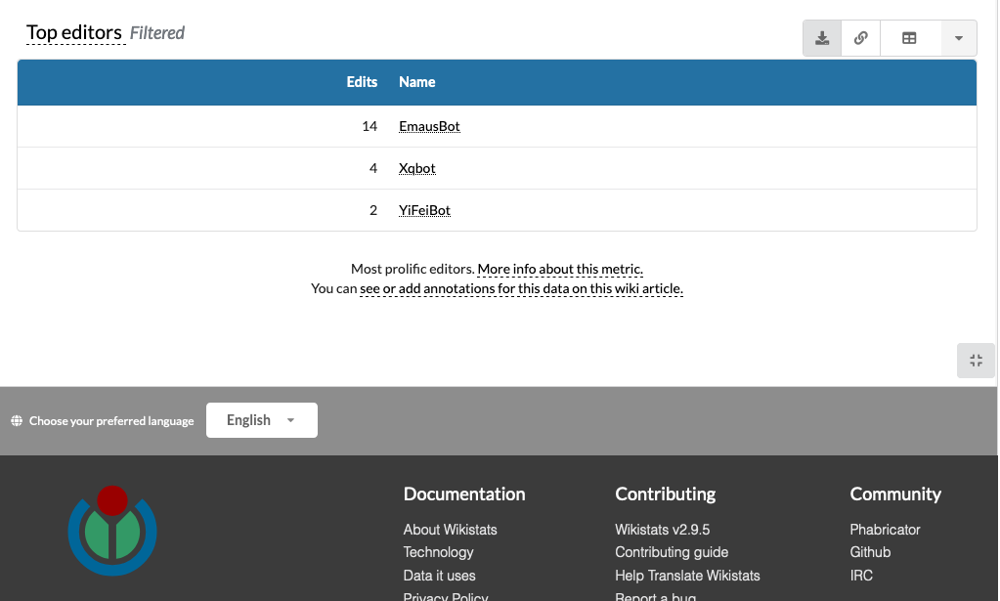

## Moroccan Arabic -- Top Editors --editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [40]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~name-bot|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
        
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'user_text':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 3.4. Top Editors `--editor-type-user`:

## English -- Top Editors --editor-type-user:

                 user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Ser Amantio di Nicolao     1  2022-07-01T00:00:00.000Z       149726  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                 Jevansen     2  2022-07-01T00:00:00.000Z        83498  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                     ...   ...                       ...          ...                       ...                       ...                       ...
98               DanCherek    99  2022-07-01T00:00:00.000Z         2905  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                Frietjes   100  2022-07-01T00:00:00.000Z         2883  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


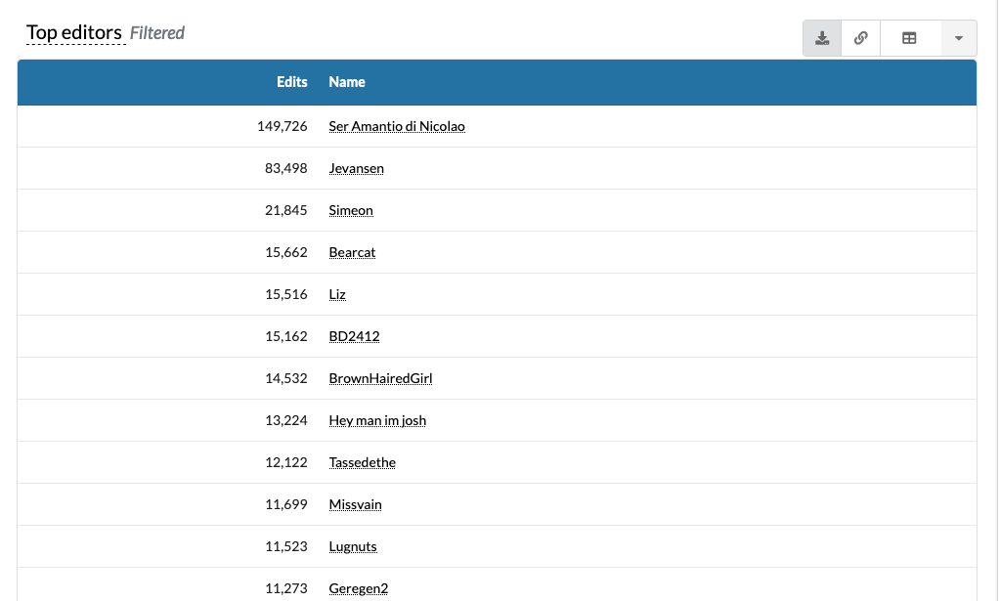

## Arabic -- Top Editors --editor-type-user:

               user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0               جار الله     1  2022-07-01T00:00:00.000Z         4061  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   محمد أحمد عبد الفتاح     2  2022-07-01T00:00:00.000Z         3644  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                   ...   ...                       ...          ...                       ...                       ...                       ...
98             Aziz911q8    99  2022-07-01T00:00:00.000Z          144  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99     Mohammad Abdullah   100  2022-07-01T00:00:00.000Z          142  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


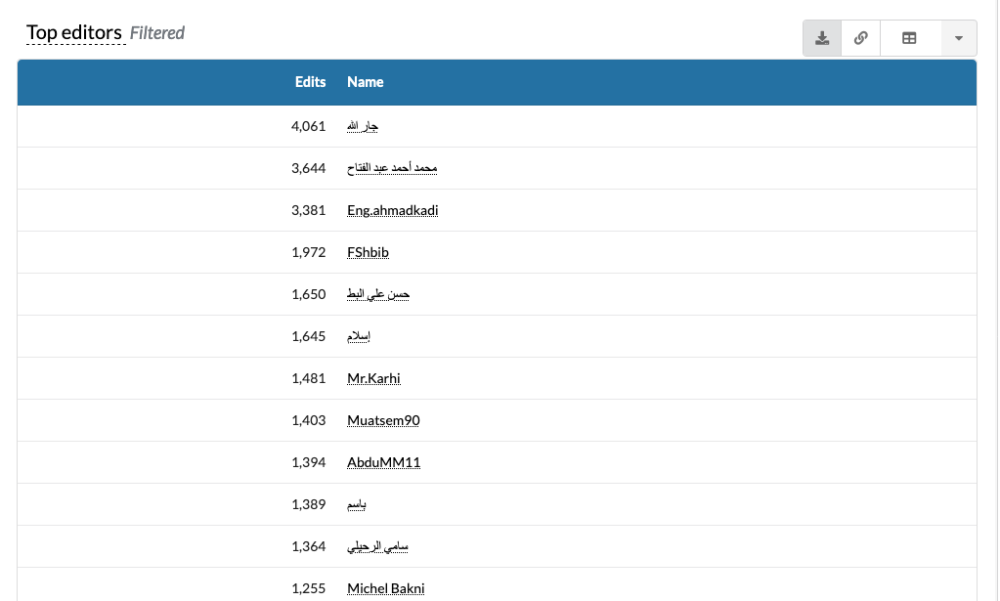

## Egyptian Arabic -- Top Editors --editor-type-user:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     HitomiAkane     1  2022-07-01T00:00:00.000Z        25055  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      El Gaafary     2  2022-07-01T00:00:00.000Z          947  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98   Aatto Sirviö    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Abdalmabod333   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


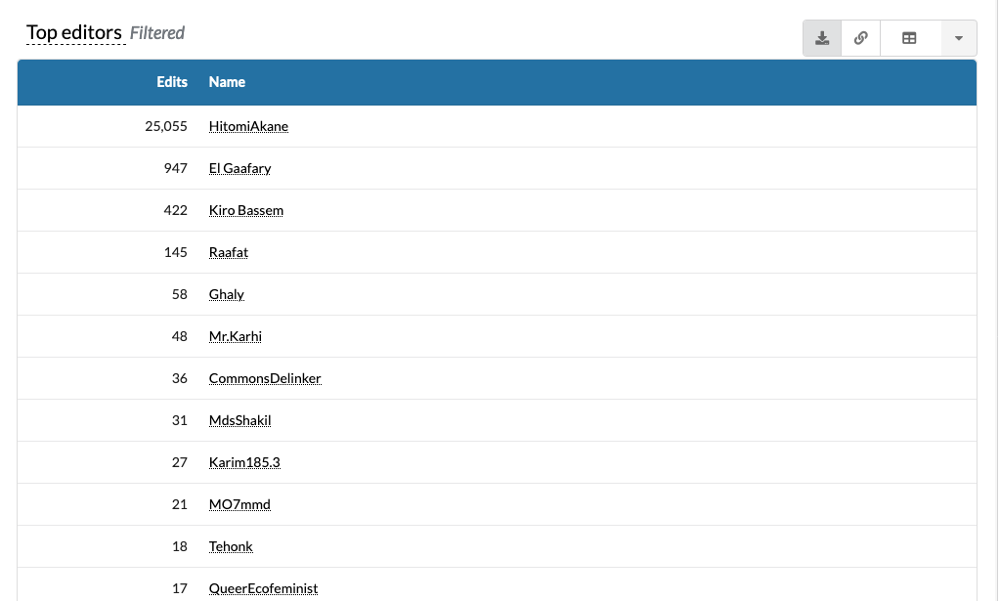

## Moroccan Arabic -- Top Editors --editor-type-user:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     Ideophagous     1  2022-07-01T00:00:00.000Z         1043  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Anass Sedrati     2  2022-07-01T00:00:00.000Z           90  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
28   Rachidourkia    29  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
29           باسم    30  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


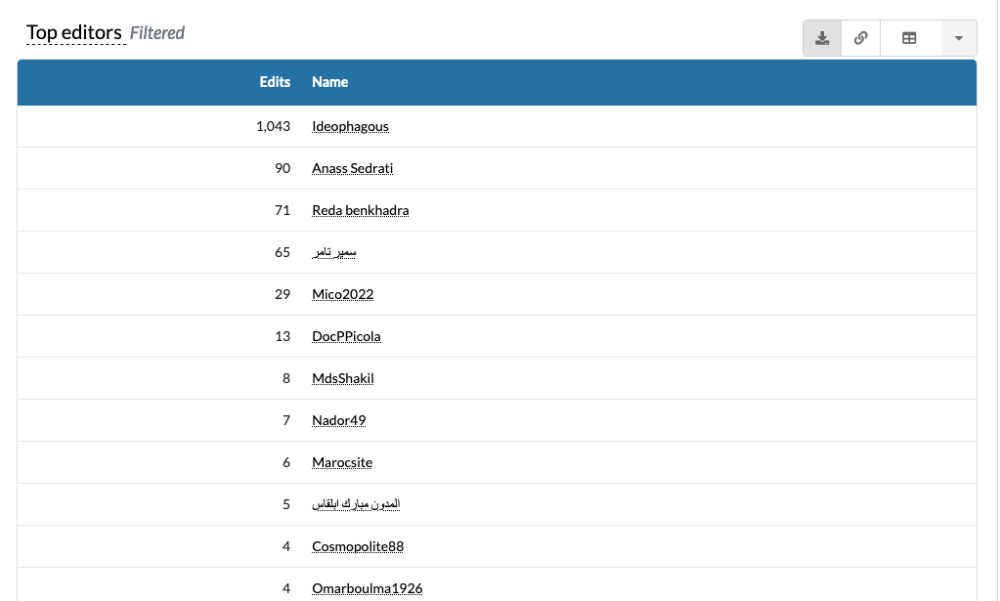

In [41]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

#### 4. Top Editors `--page-type--editor-type`:

##### 4.1. Top Editors `--page-type-content--editor-type-anonymous`:

## English -- Top Editors --page-type-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z        35824  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


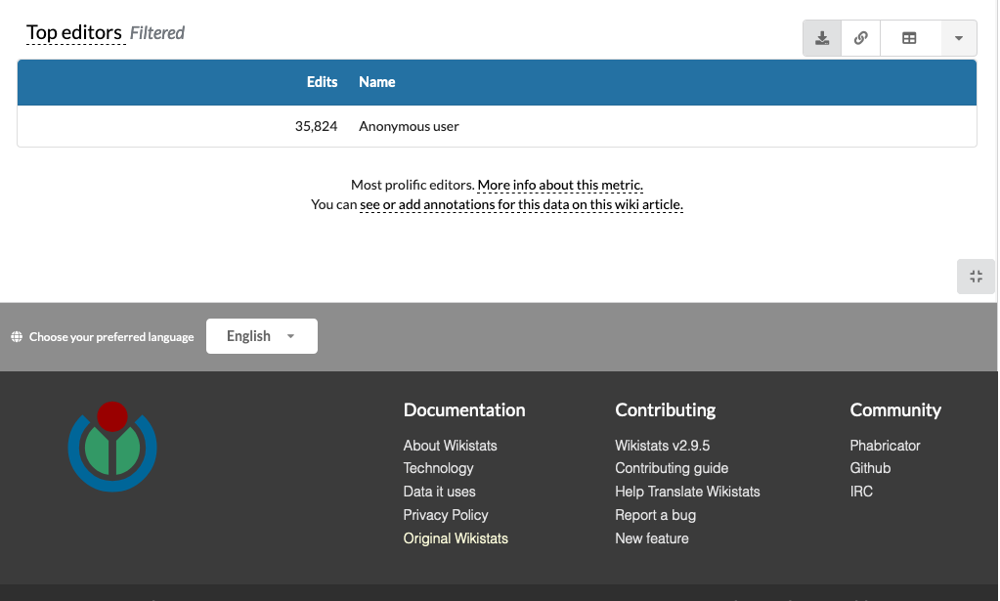

## Arabic -- Top Editors --page-type-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z         1506  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


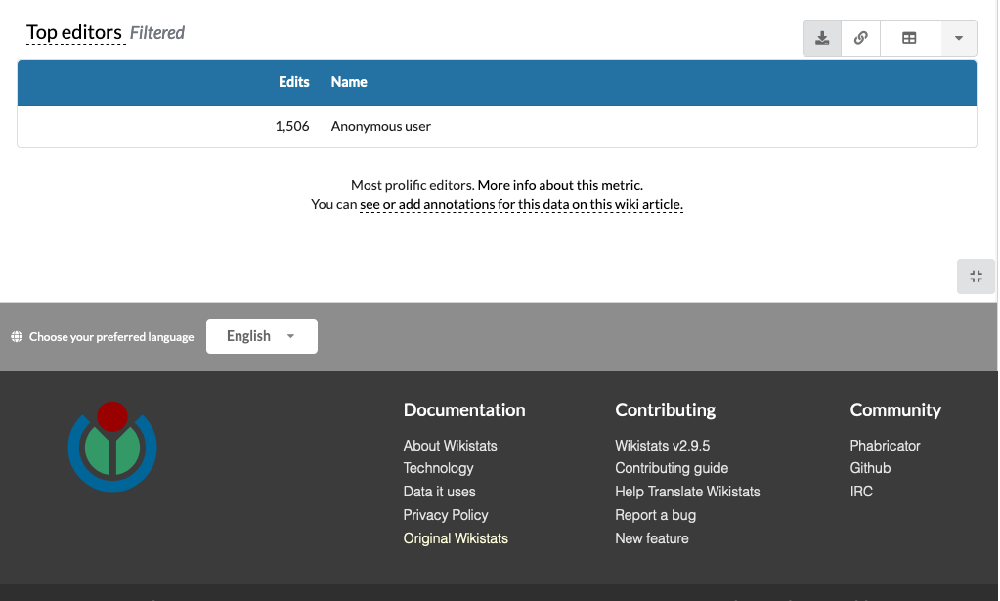

## Egyptian Arabic -- Top Editors --page-type-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z          279  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


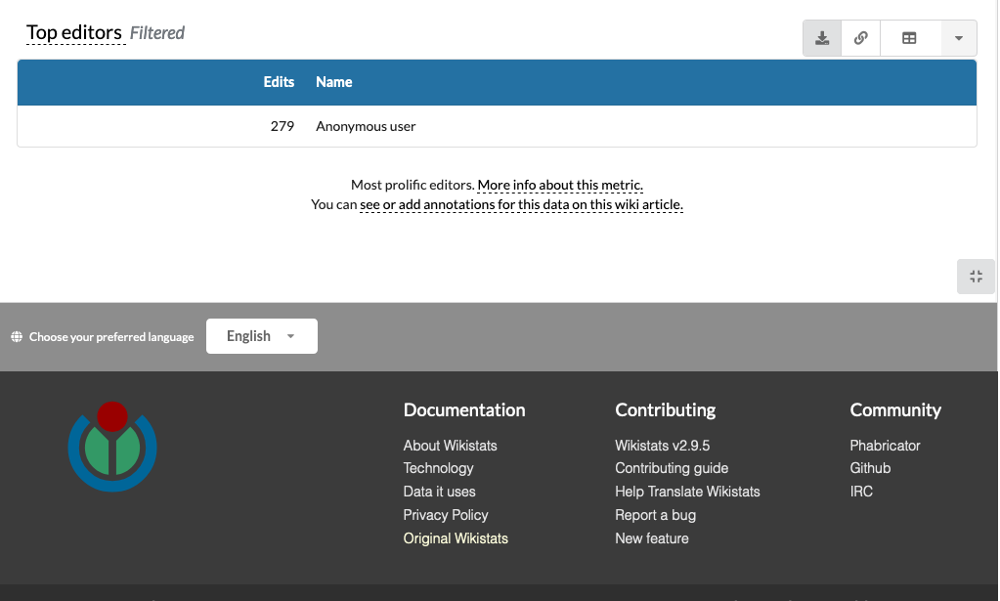

## Moroccan Arabic -- Top Editors --page-type-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z           36  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


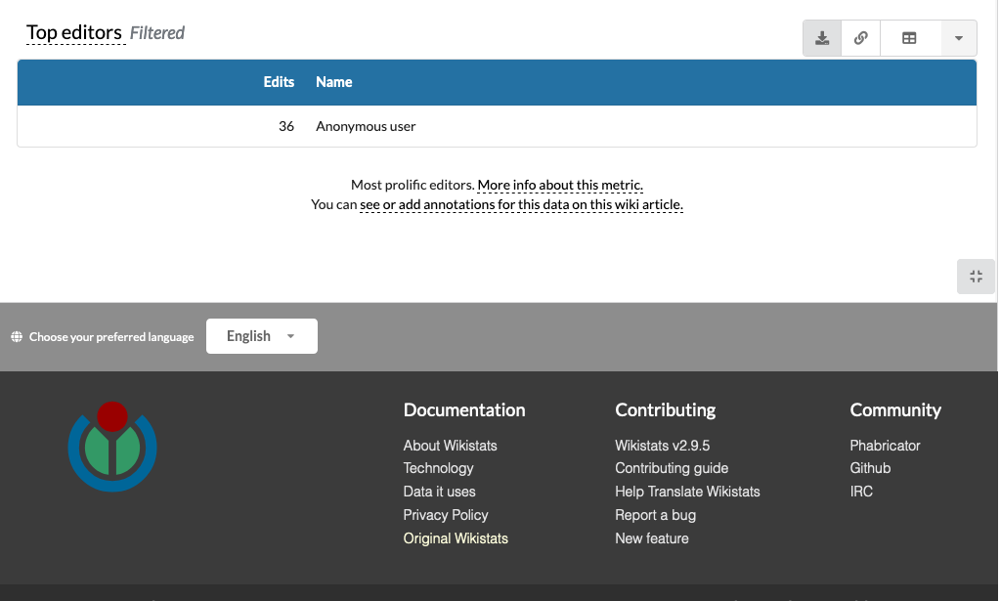

In [42]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~anonymous+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-content--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-content--editor-type-anonymous--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-content--editor-type-anonymous:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.2. Top Editors `--page-type-content--editor-type-group-bot`:

## English -- Top Editors --page-type-content--editor-type-group-bot:

             user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0         Citation bot     1  2022-07-01T00:00:00.000Z        65566  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   InternetArchiveBot     2  2022-07-01T00:00:00.000Z        37157  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                 ...   ...                       ...          ...                       ...                       ...                       ...
52           EarwigBot    53  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
53             MenoBot    54  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


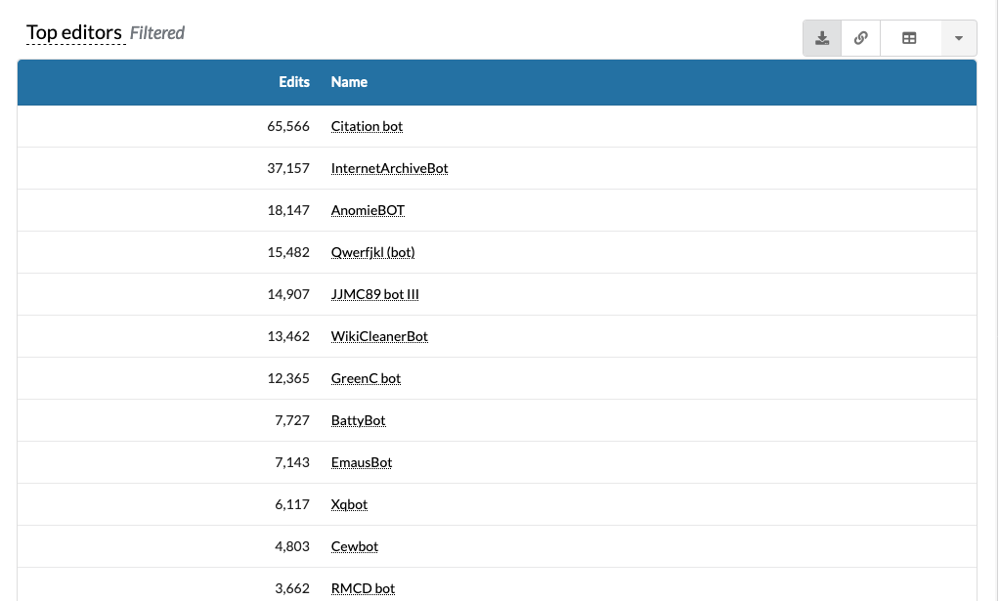

## Arabic -- Top Editors --page-type-content--editor-type-group-bot:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          JarBot     1  2022-07-01T00:00:00.000Z       145027  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        32010  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
9           Xqbot    10  2022-07-01T00:00:00.000Z           40  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
10       YiFeiBot    11  2022-07-01T00:00:00.000Z            7  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


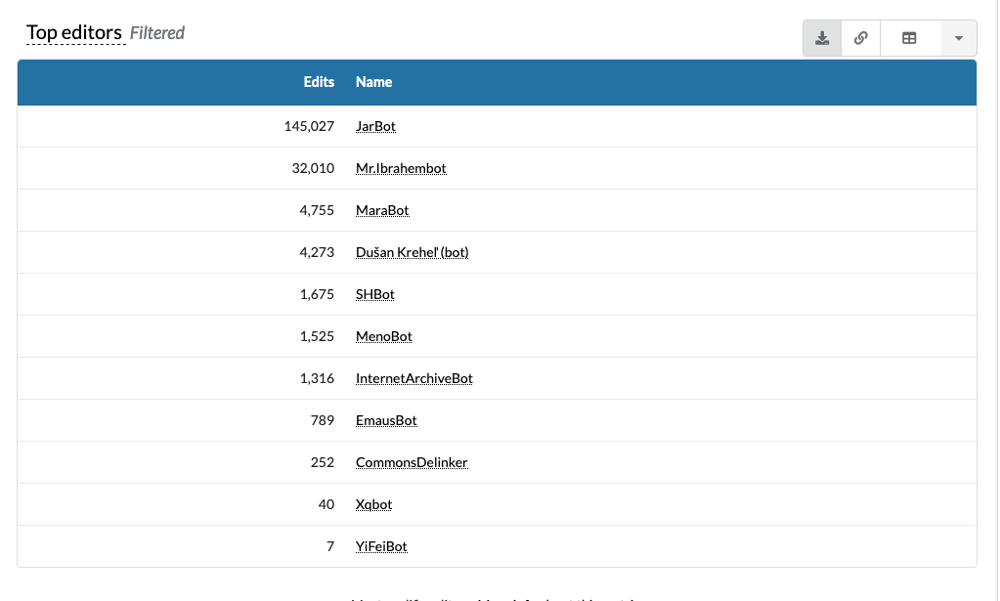

## Egyptian Arabic -- Top Editors --page-type-content--editor-type-group-bot:

            user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0            GhalyBot     1  2022-07-01T00:00:00.000Z        10943  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1  InternetArchiveBot     2  2022-07-01T00:00:00.000Z          674  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2             MenoBot     3  2022-07-01T00:00:00.000Z           48  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


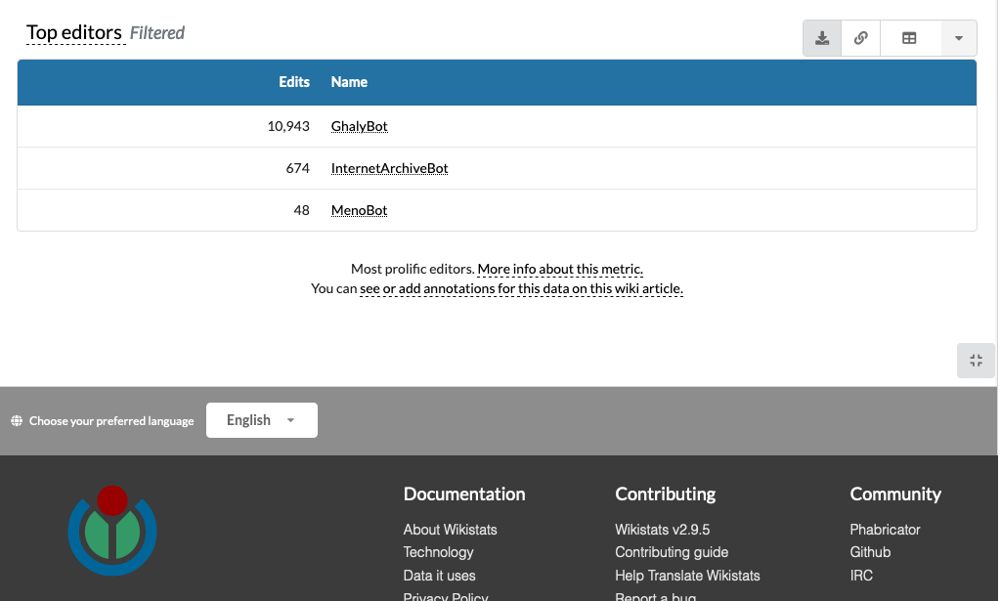

## Moroccan Arabic -- Top Editors --page-type-content--editor-type-group-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  DarijaBot     1  2022-07-01T00:00:00.000Z         2644  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    MenoBot     2  2022-07-01T00:00:00.000Z          601  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2     PGVBot     3  2022-07-01T00:00:00.000Z           22  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


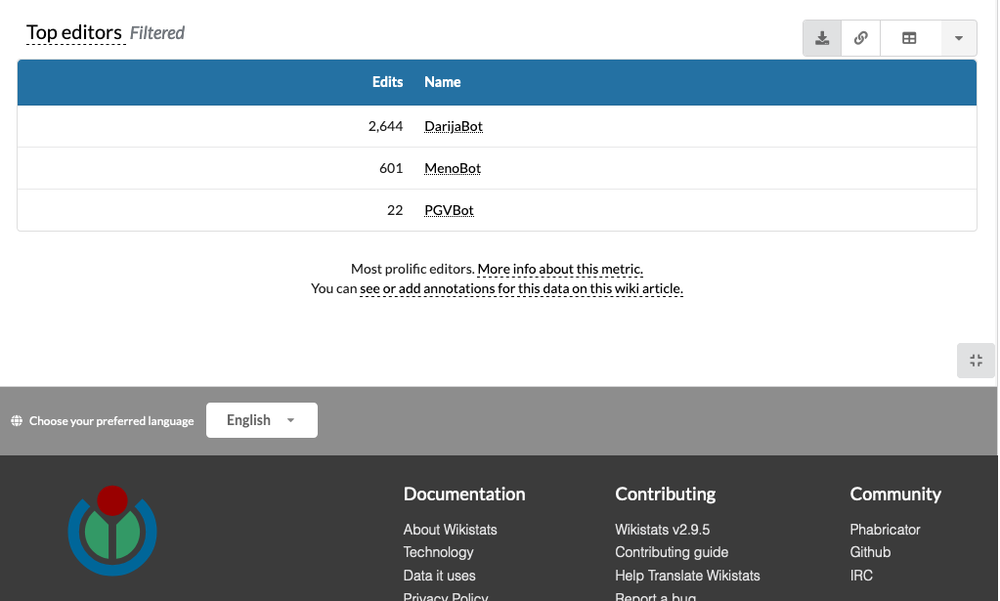

In [43]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~group-bot+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-content--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-content--editor-type-group-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-content--editor-type-group-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.3. Top Editors `--page-type-content--editor-type-name-bot`:

## English -- Top Editors --page-type-content--editor-type-name-bot:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0        XLinkBot     1  2022-07-01T00:00:00.000Z          670  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   RealLifeRobot     2  2022-07-01T00:00:00.000Z           16  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
55        WizzBot    56  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
56       GizmoBot    57  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


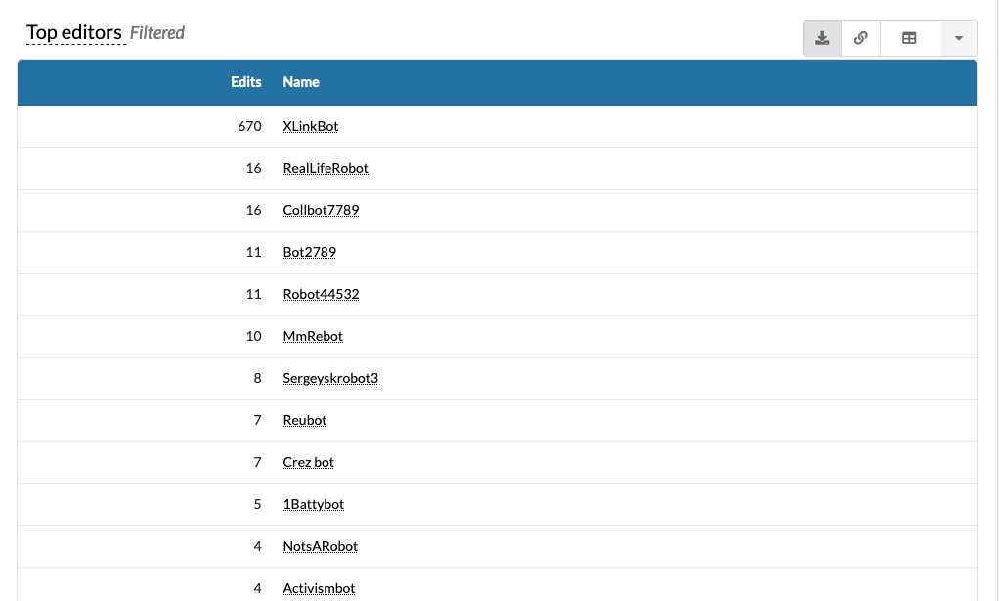

## Arabic -- Top Editors --page-type-content--editor-type-name-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0      HqBot     1  2022-07-01T00:00:00.000Z           30  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1  Spbot2020     2  2022-07-01T00:00:00.000Z            7  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2  Washerbot     3  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


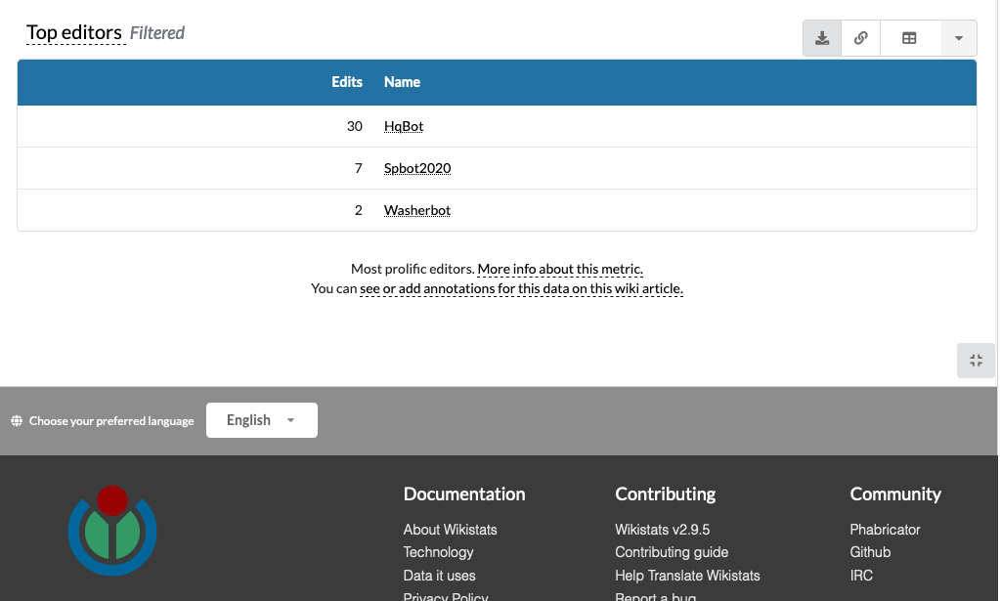

## Egyptian Arabic -- Top Editors --page-type-content--editor-type-name-bot:

  user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     Xqbot     1  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1  YiFeiBot     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


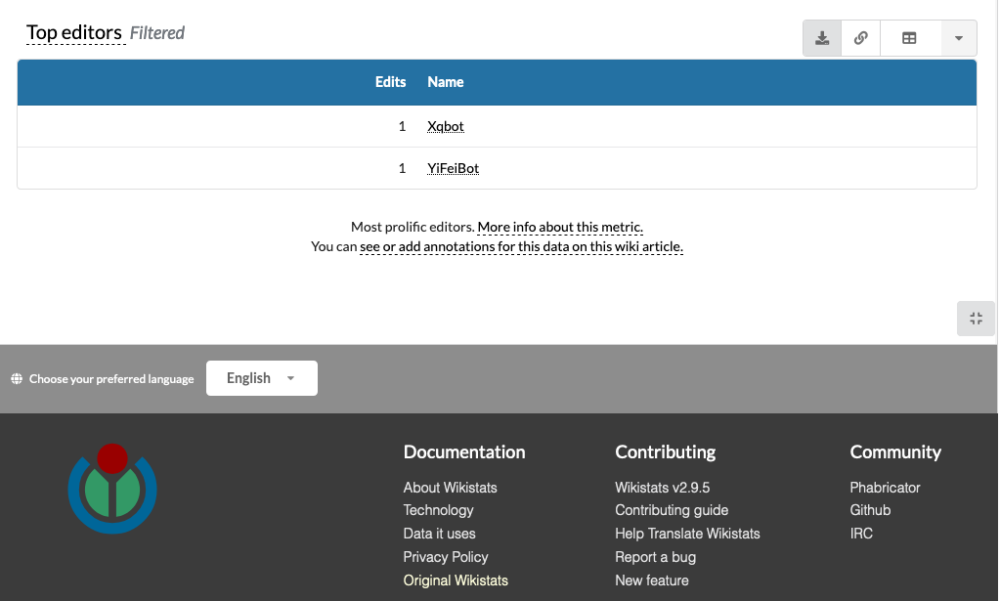

## Moroccan Arabic -- Top Editors --page-type-content--editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [44]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~name-bot+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-content--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-content--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-content--editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'user_text':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 4.4. Top Editors `--page-type-content--editor-type-user`:

## English -- Top Editors --page-type-content--editor-type-user:

                 user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Ser Amantio di Nicolao     1  2022-07-01T00:00:00.000Z       146347  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                   Simeon     2  2022-07-01T00:00:00.000Z        21006  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                     ...   ...                       ...          ...                       ...                       ...                       ...
98         Achmad Rachmani    99  2022-07-01T00:00:00.000Z         2014  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99       Trappist the monk   100  2022-07-01T00:00:00.000Z         2014  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


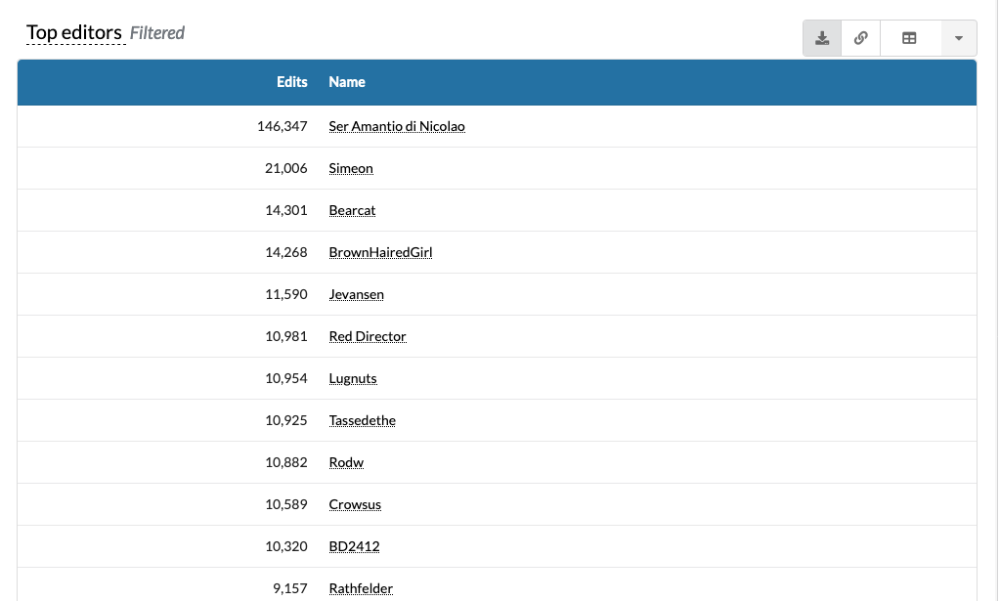

## Arabic -- Top Editors --page-type-content--editor-type-user:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Eng.ahmadkadi     1  2022-07-01T00:00:00.000Z         3267  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1        جار الله     2  2022-07-01T00:00:00.000Z         2975  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98        Hala lo    99  2022-07-01T00:00:00.000Z          120  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99      وليدالصكر   100  2022-07-01T00:00:00.000Z          117  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


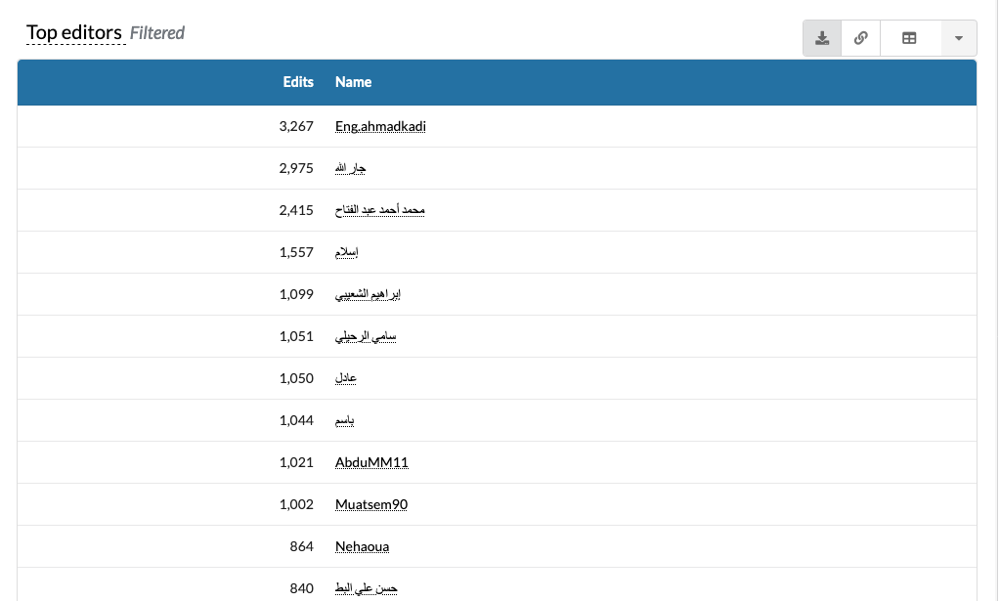

## Egyptian Arabic -- Top Editors --page-type-content--editor-type-user:

      user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   HitomiAkane     1  2022-07-01T00:00:00.000Z         9258  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    El Gaafary     2  2022-07-01T00:00:00.000Z          938  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..          ...   ...                       ...          ...                       ...                       ...                       ...
98         Máté    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99     Aristeas   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


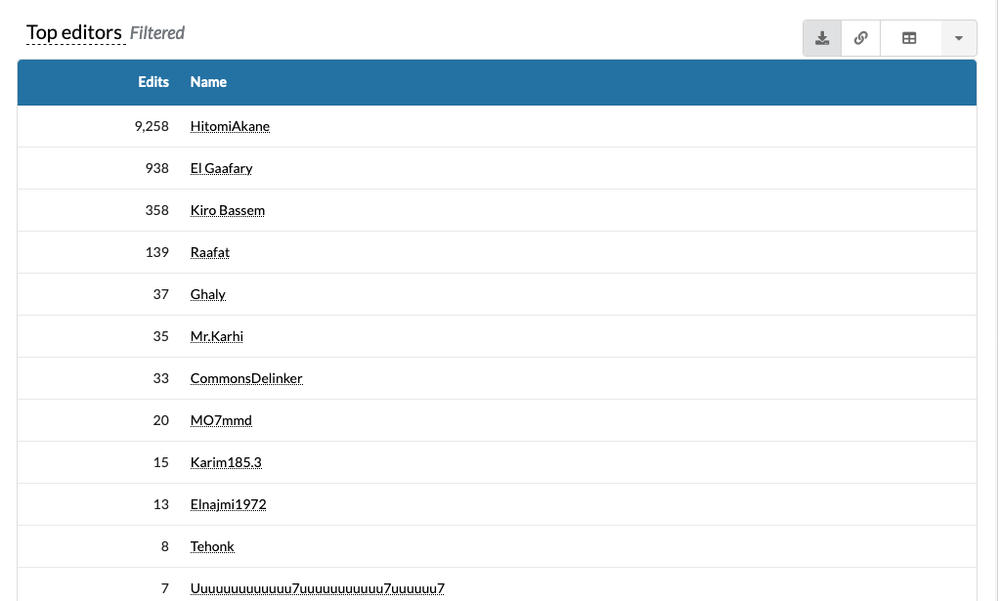

## Moroccan Arabic -- Top Editors --page-type-content--editor-type-user:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     Ideophagous     1  2022-07-01T00:00:00.000Z          712  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Anass Sedrati     2  2022-07-01T00:00:00.000Z           70  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
20         Ruwaym    21  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
21           باسم    22  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


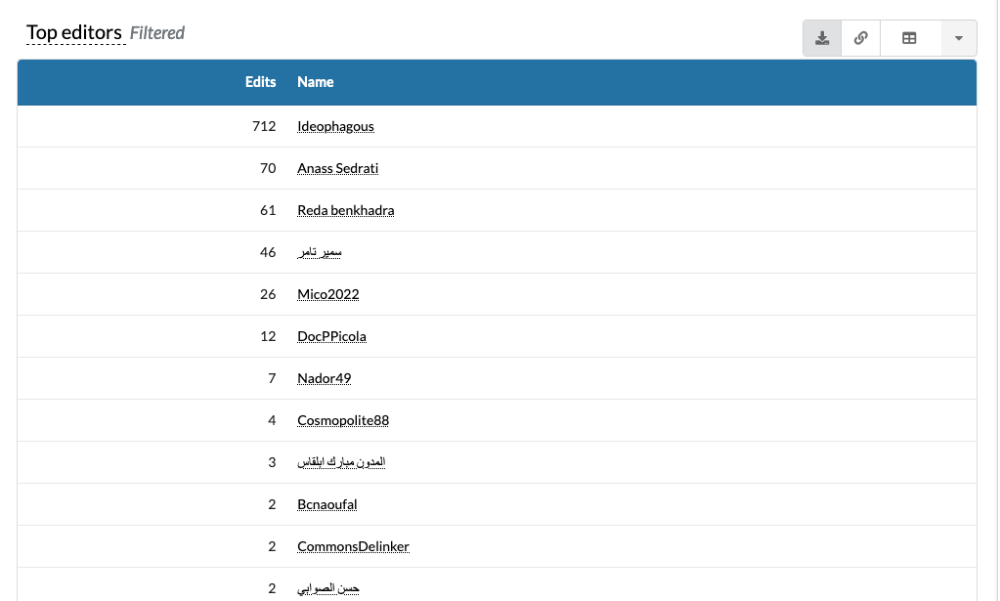

In [45]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~user+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-content--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-content--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-content--editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.5. Top Editors `--page-type-non-content--editor-type-anonymous`:

## English -- Top Editors --page-type-non-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z         9743  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


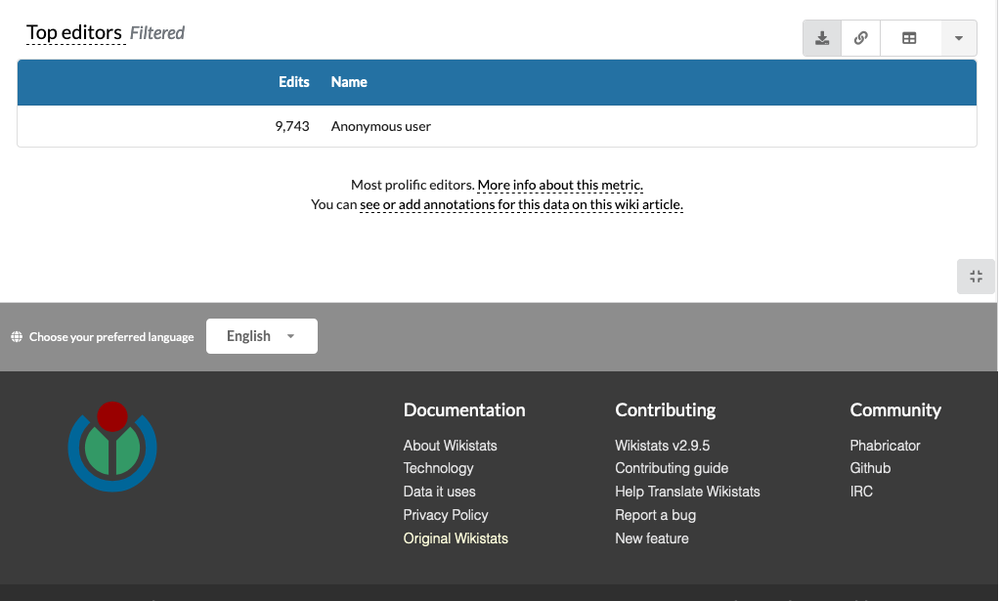

## Arabic -- Top Editors --page-type-non-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-07-01T00:00:00.000Z          203  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


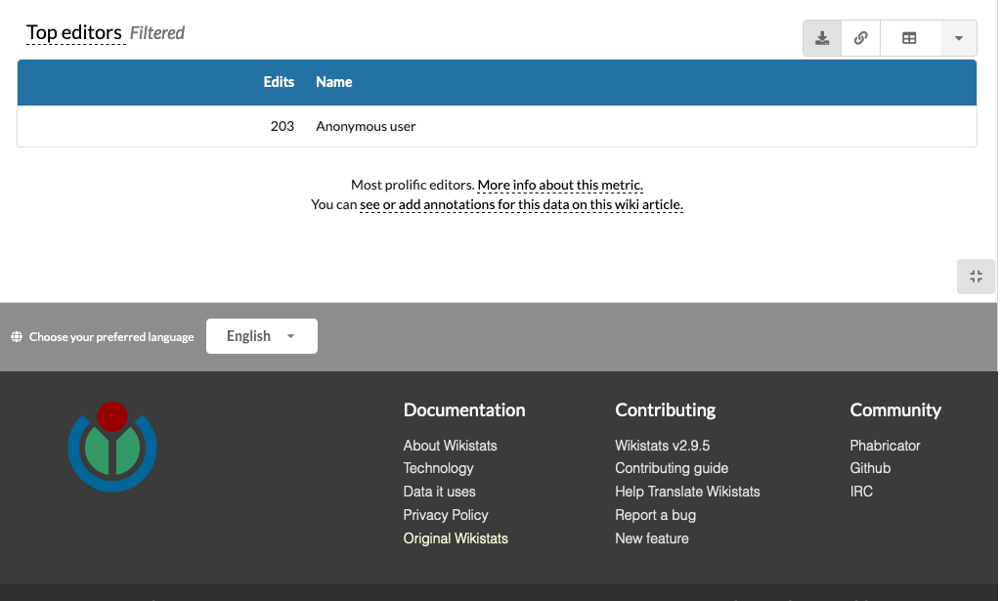

## Egyptian Arabic -- Top Editors --page-type-non-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end  user_text
0     1  2022-07-01T00:00:00.000Z           11  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z        NaN
1     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z  en>SWinxy


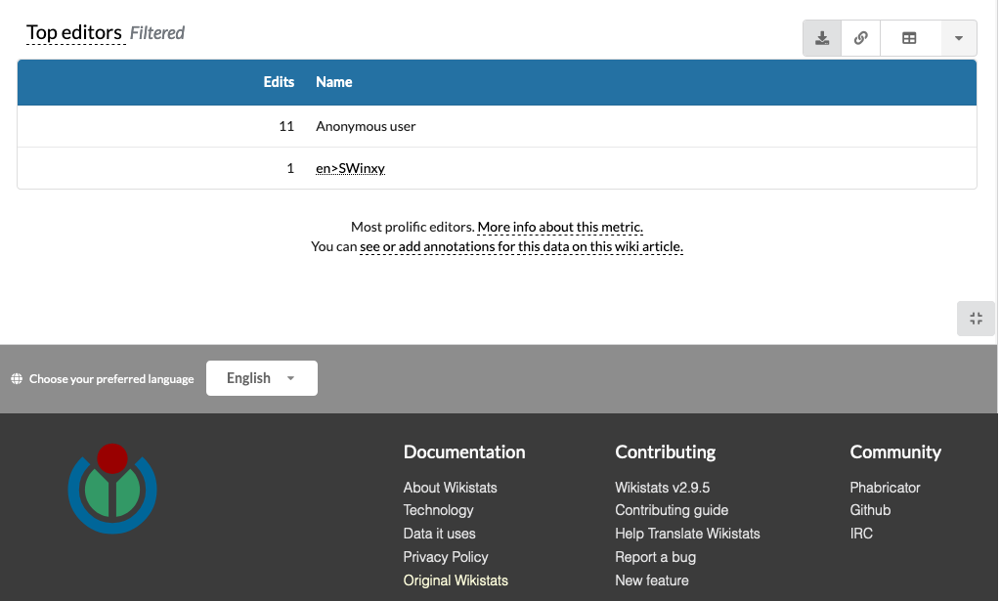

## Moroccan Arabic -- Top Editors --page-type-non-content--editor-type-anonymous:

   rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     1  2022-06-01T00:00:00.000Z            2  2022-06-01T00:00:00.000Z  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z


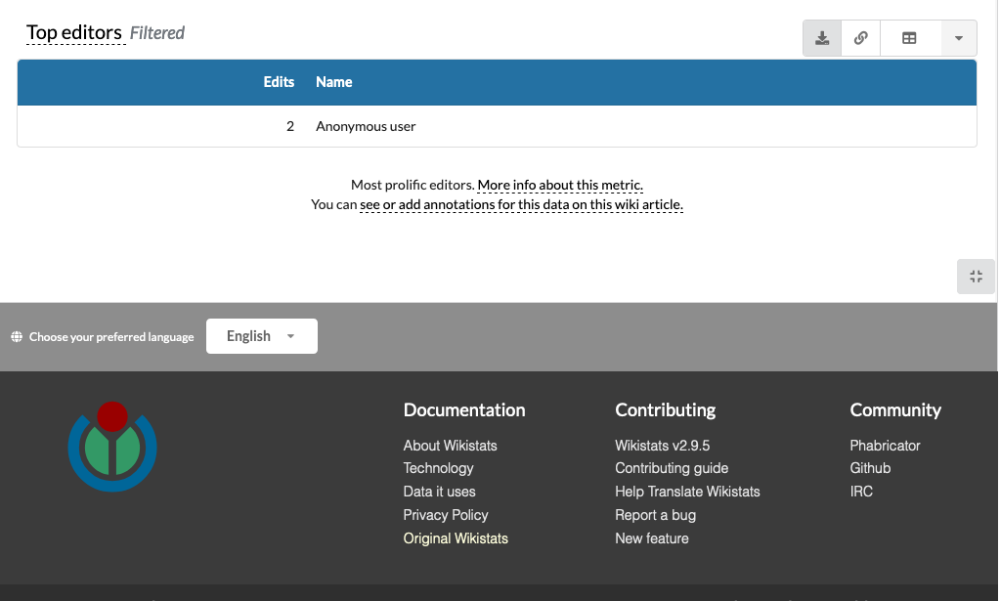

In [46]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~anonymous+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-non-content--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-non-content--editor-type-anonymous--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-non-content--editor-type-anonymous:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.6. Top Editors `--page-type-non-content--editor-type-group-bot`:

## English -- Top Editors --page-type-non-content--editor-type-group-bot:

             user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0         MalnadachBot     1  2022-07-01T00:00:00.000Z       814953  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1           WP 1.0 bot     2  2022-07-01T00:00:00.000Z        74343  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                 ...   ...                       ...          ...                       ...                       ...                       ...
98  InternetArchiveBot    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99           FrescoBot   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


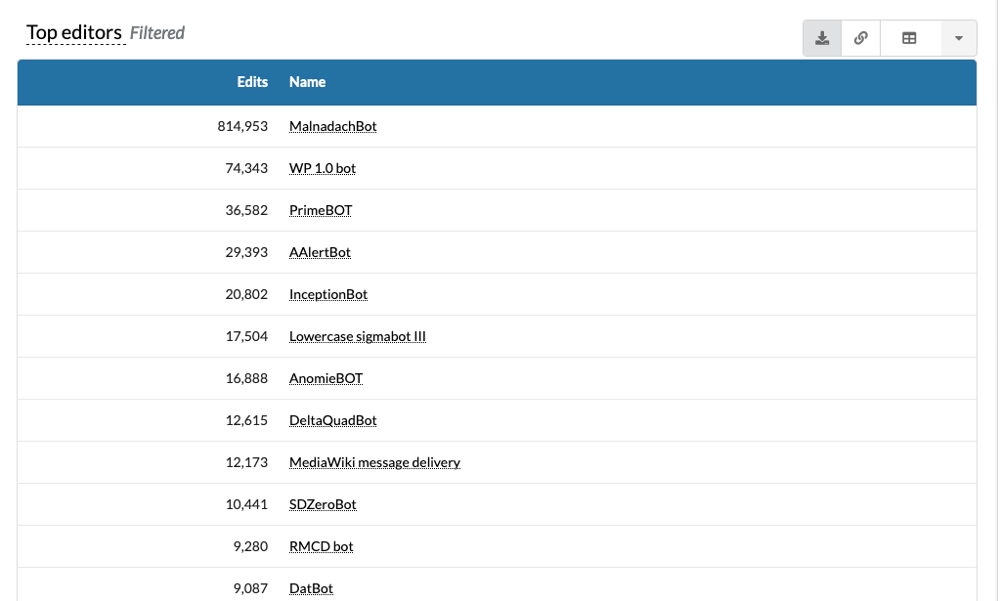

## Arabic -- Top Editors --page-type-non-content--editor-type-group-bot:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          JarBot     1  2022-07-01T00:00:00.000Z        25390  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Mr.Ibrahembot     2  2022-07-01T00:00:00.000Z        19298  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
14        MenoBot    15  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
15          Xqbot    16  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


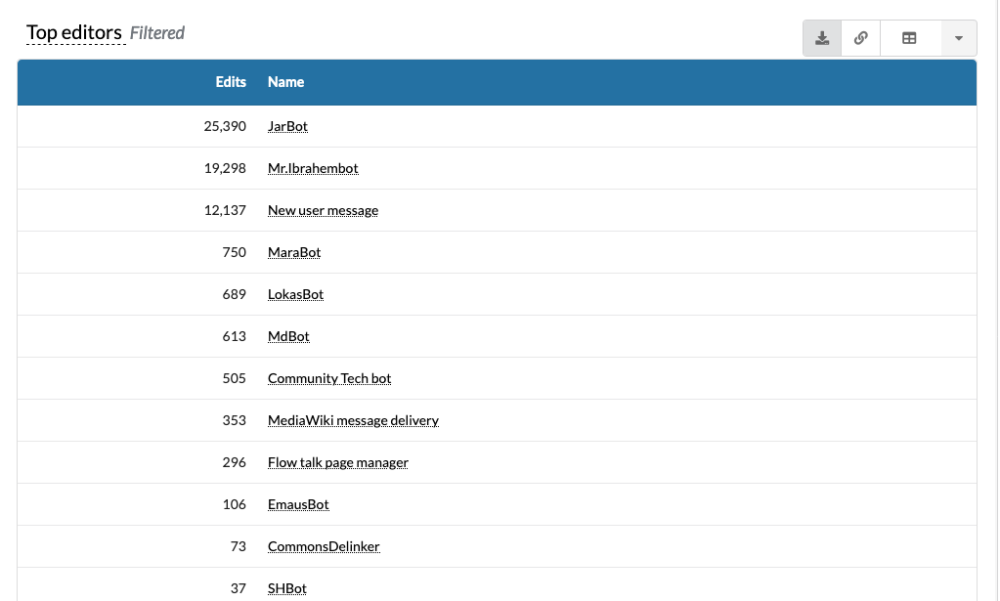

## Egyptian Arabic -- Top Editors --page-type-non-content--editor-type-group-bot:

                    user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                     MenoBot     1  2022-07-01T00:00:00.000Z          123  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                    GhalyBot     2  2022-07-01T00:00:00.000Z           12  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2  MediaWiki message delivery     3  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


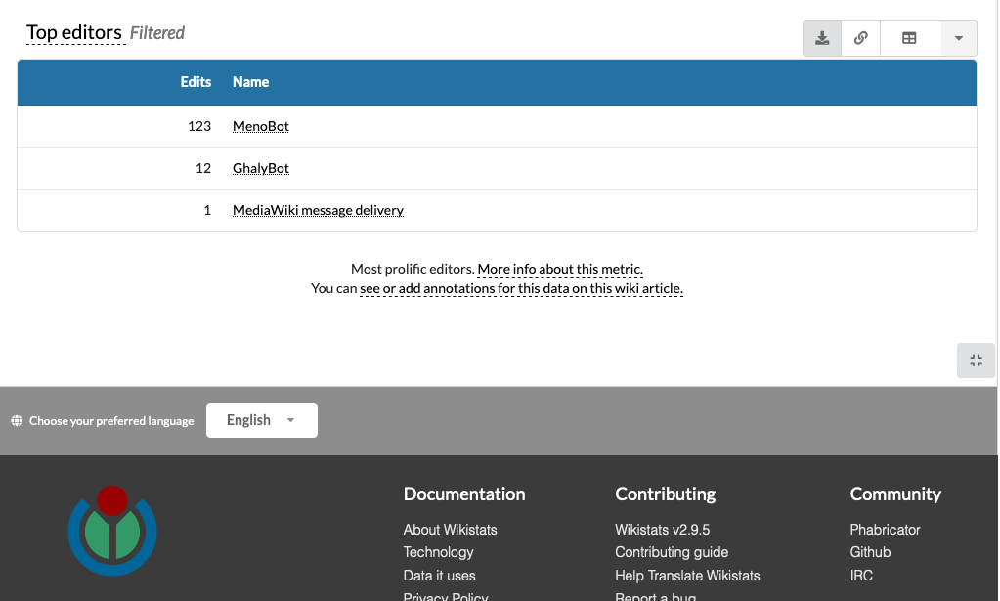

## Moroccan Arabic -- Top Editors --page-type-non-content--editor-type-group-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  DarijaBot     1  2022-07-01T00:00:00.000Z          918  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    MenoBot     2  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


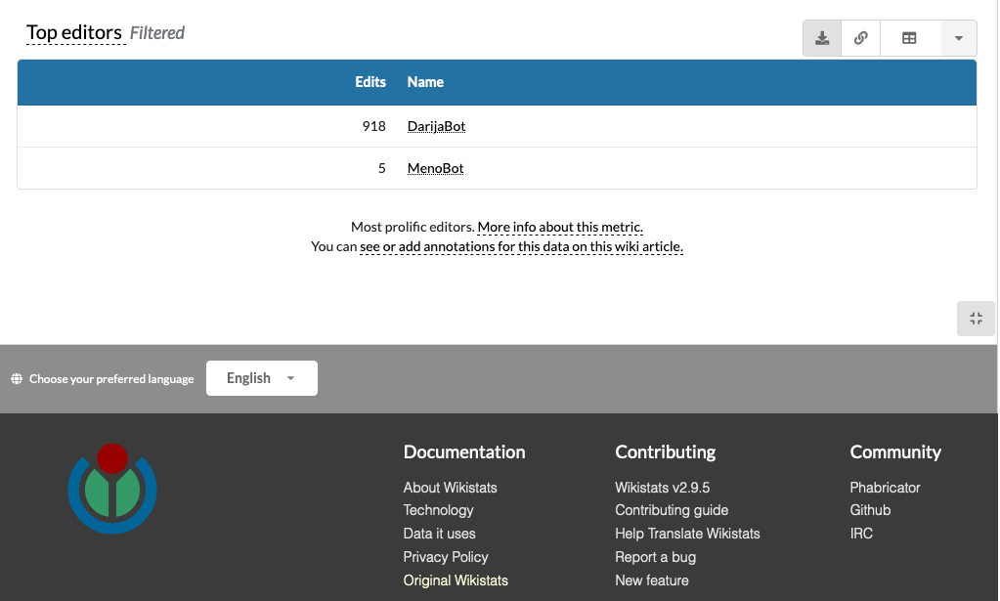

In [47]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~group-bot+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-non-content--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-non-content--editor-type-group-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-non-content--editor-type-group-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.7. Top Editors `--page-type-non-content--editor-type-name-bot`:

## English -- Top Editors --page-type-non-content--editor-type-name-bot:

         user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0        HooptyBot     1  2022-07-01T00:00:00.000Z         6061  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1         XLinkBot     2  2022-07-01T00:00:00.000Z          673  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..             ...   ...                       ...          ...                       ...                       ...                       ...
27      TheLazyBot    28  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
28  WikiArchiveBot    29  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


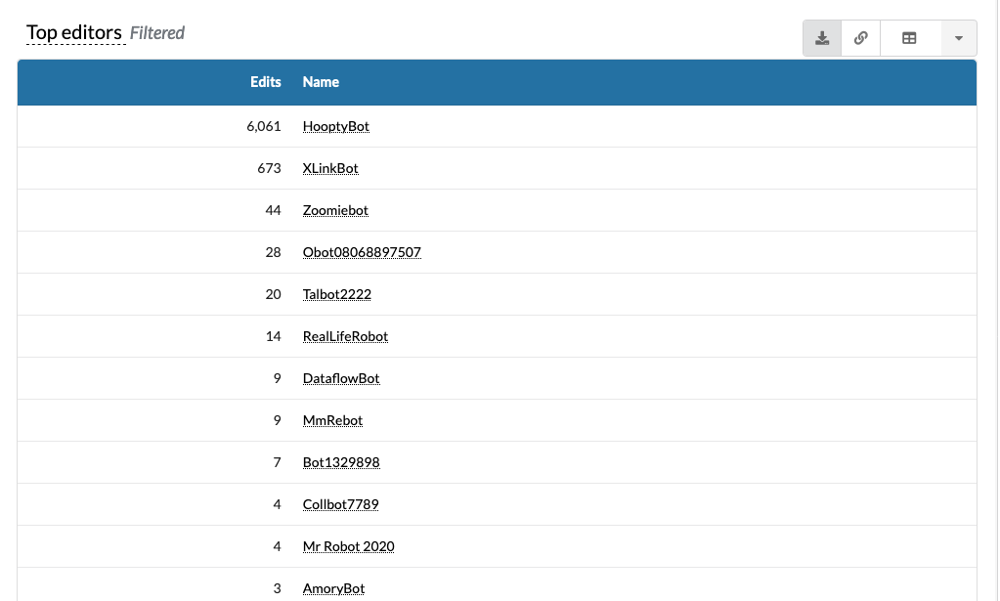

## Arabic -- Top Editors --page-type-non-content--editor-type-name-bot:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  Spbot2020     1  2022-07-01T00:00:00.000Z            6  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1      HqBot     2  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


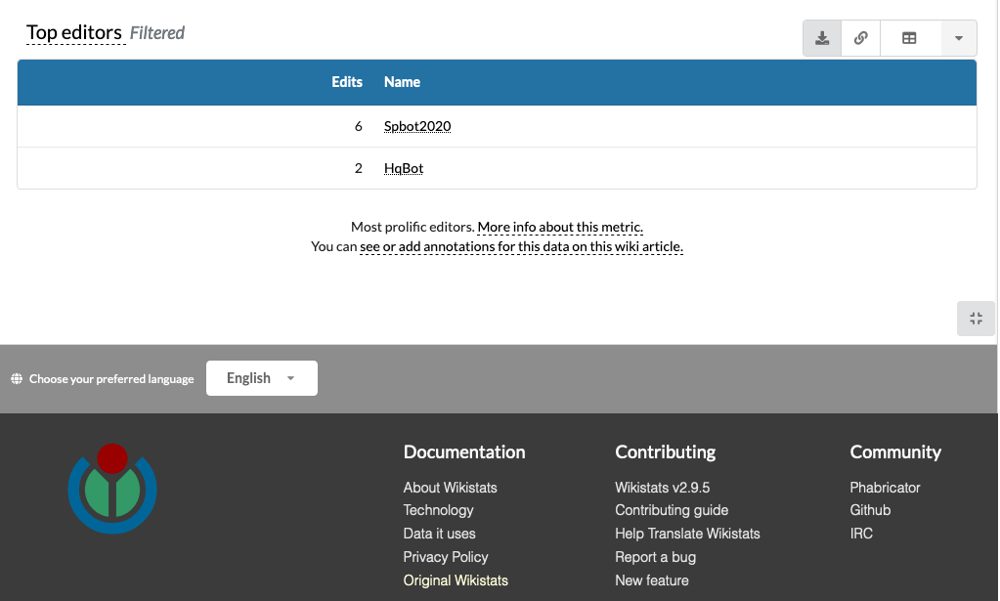

## Egyptian Arabic -- Top Editors --page-type-non-content--editor-type-name-bot:

  user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  EmausBot     1  2022-07-01T00:00:00.000Z           14  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1     Xqbot     2  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2  YiFeiBot     3  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


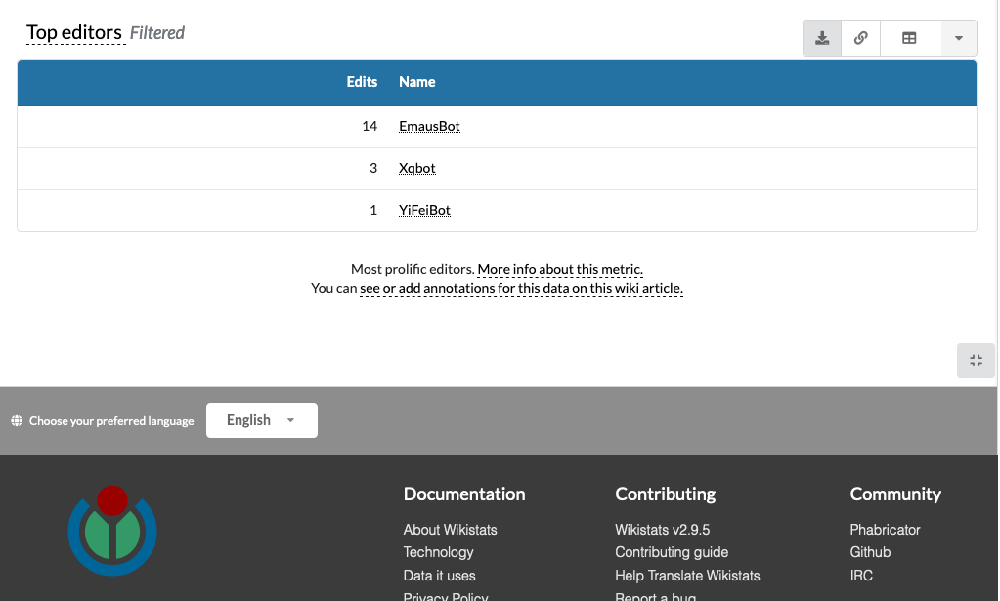

## Moroccan Arabic -- Top Editors --page-type-non-content--editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [48]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~name-bot+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-non-content--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-non-content--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-non-content--editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'user_text':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 4.8. Top Editors `--page-type-non-content--editor-type-user`:

## English -- Top Editors --page-type-non-content--editor-type-user:

   user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Jevansen     1  2022-07-01T00:00:00.000Z        71908  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1        Liz     2  2022-07-01T00:00:00.000Z        11608  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..       ...   ...                       ...          ...                       ...                       ...                       ...
98    Tewdar    99  2022-07-01T00:00:00.000Z         1099  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  RoySmith   100  2022-07-01T00:00:00.000Z         1078  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


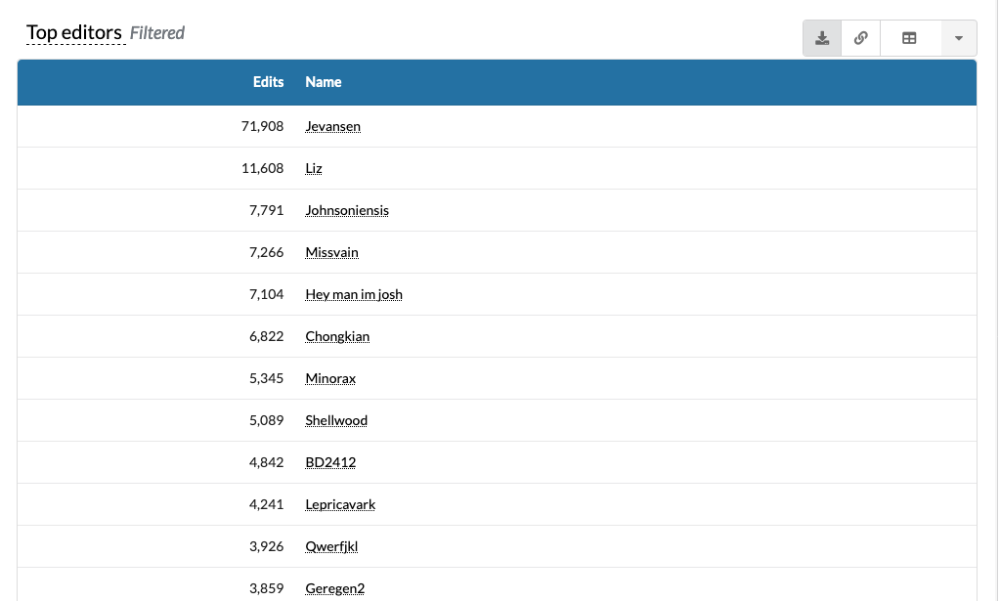

## Arabic -- Top Editors --page-type-non-content--editor-type-user:

               user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                 FShbib     1  2022-07-01T00:00:00.000Z         1330  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   محمد أحمد عبد الفتاح     2  2022-07-01T00:00:00.000Z         1229  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                   ...   ...                       ...          ...                       ...                       ...                       ...
98      Mutasim Elmahadi    99  2022-07-01T00:00:00.000Z           33  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99              Sami Lab   100  2022-07-01T00:00:00.000Z           33  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


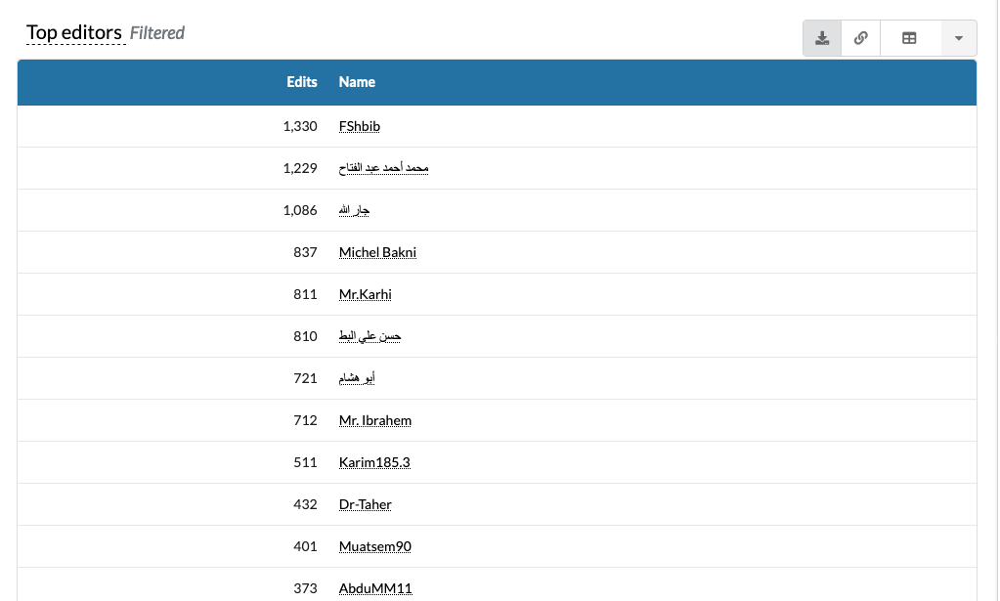

## Egyptian Arabic -- Top Editors --page-type-non-content--editor-type-user:

               user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0            HitomiAkane     1  2022-07-01T00:00:00.000Z        15797  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1            Kiro Bassem     2  2022-07-01T00:00:00.000Z           64  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                   ...   ...                       ...          ...                       ...                       ...                       ...
98        ٍسماح الشعراوي    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Hikmat ullah noorzai   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


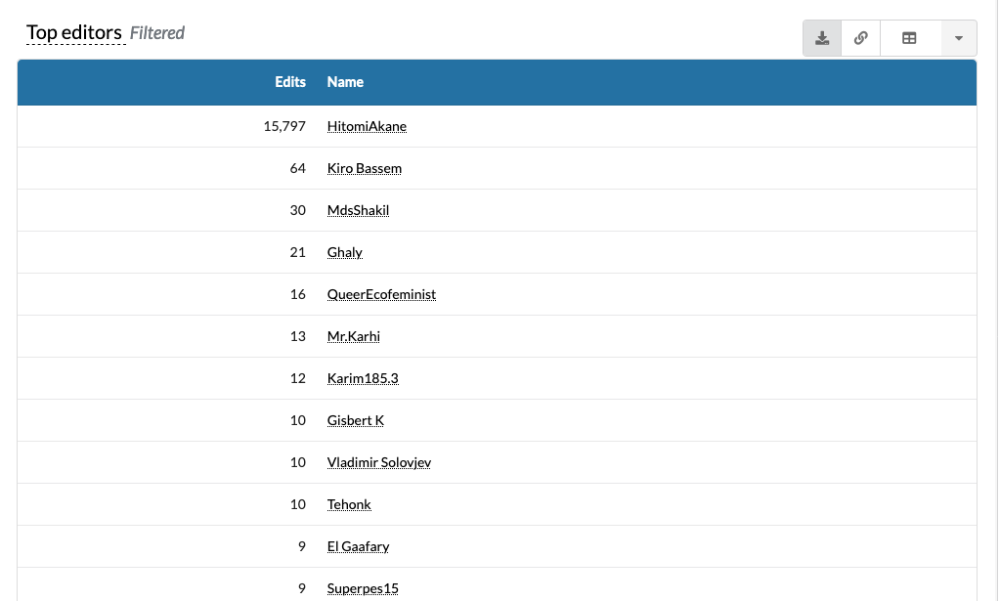

## Moroccan Arabic -- Top Editors --page-type-non-content--editor-type-user:

        user_text  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     Ideophagous     1  2022-07-01T00:00:00.000Z          331  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Anass Sedrati     2  2022-07-01T00:00:00.000Z           20  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
16   Rachidourkia    17  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
17         Ruwaym    18  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


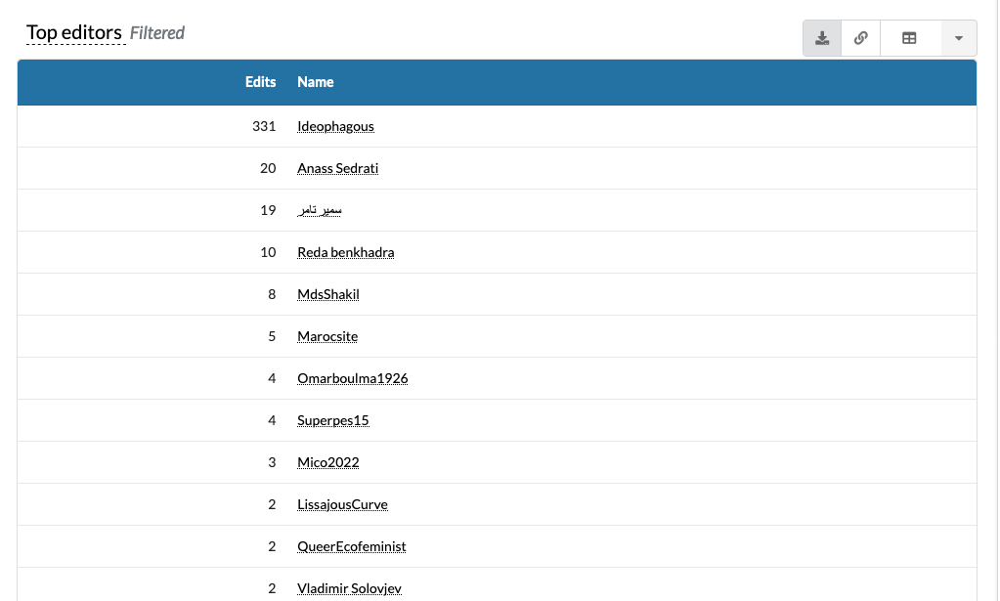

In [49]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-editors/full|table|last-month|(editor_type)~user+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-editors--page-type-non-content--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-editors--page-type-non-content--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Editors --page-type-non-content--editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

### viii. Top Edited Pages:

In [50]:
import os , pandas 
from time import sleep
from selenium import webdriver
from PIL import Image as pilImage
from IPython.display import display
from IPython.display import Image as pyImage

wikis = {'en':'English', 'ar':'Arabic', 'arz':'Egyptian Arabic', 'ary':'Moroccan Arabic'}

options = webdriver.FirefoxOptions()
options.headless = True
options.add_argument('--no-sandbox')

profile = webdriver.FirefoxProfile()
profile.set_preference("browser.download.folderList", 2)
profile.set_preference("browser.download.manager.showWhenStarting", False)
profile.set_preference("browser.download.dir", f"{os.getcwd()}/Wikimedia-Stats-CSVs/")
profile.set_preference("browser.helperApps.neverAsk.saveToDisk", "application/octet-stream")

#### 1. Top Edited Pages `--no-filters`:

## English -- Top Edited Pages --no-filters:

                                              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Project:Administrator_intervention_against_vandalism     1  2022-07-01T00:00:00.000Z         7026  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                 User:AmandaNP/UAA/Time     2  2022-07-01T00:00:00.000Z         4458  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                   ...   ...                       ...          ...                       ...                       ...                       ...
98                 User:Community_Tech_bot/Popular_pages    99  2022-07-01T00:00:00.000Z          596  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99     Project:Biographies_of_living_persons/Noticeboa

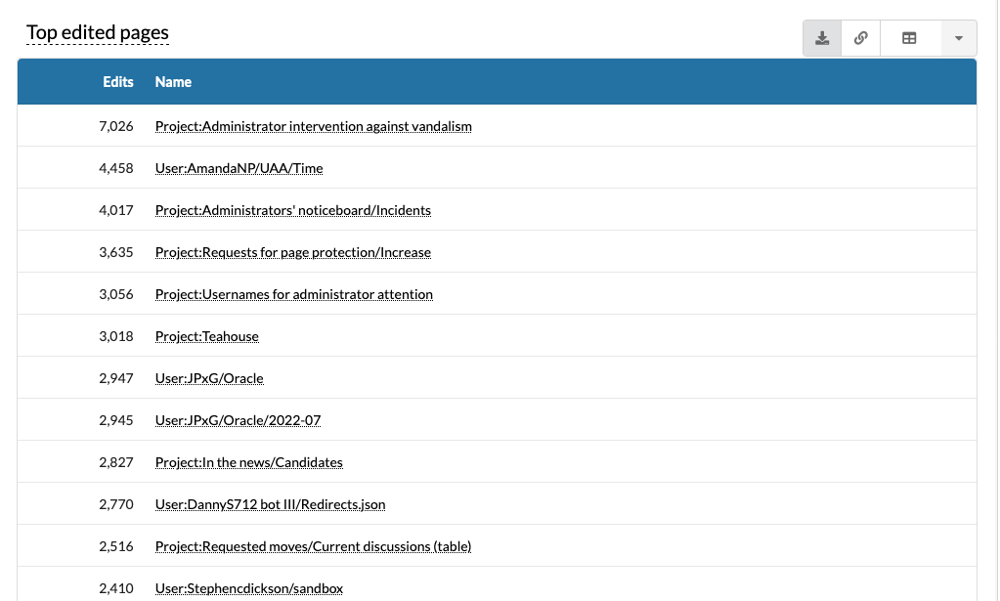

## Arabic -- Top Edited Pages --no-filters:

                                 page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0        Talk:وادي_الكهوف_القديمة_في_الكرمل     1  2022-07-01T00:00:00.000Z          684  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:إخطار_الإداريين/استرجاع/الحالية     2  2022-07-01T00:00:00.000Z          479  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                      ...   ...                       ...          ...                       ...                       ...                       ...
98                               قلعة_أربيل    99  2022-07-01T00:00:00.000Z           66  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                          User talk:شيماء   100  2022-07-01T00:00:00.000Z           65  2022-07-01T00:00:00.000Z  2022

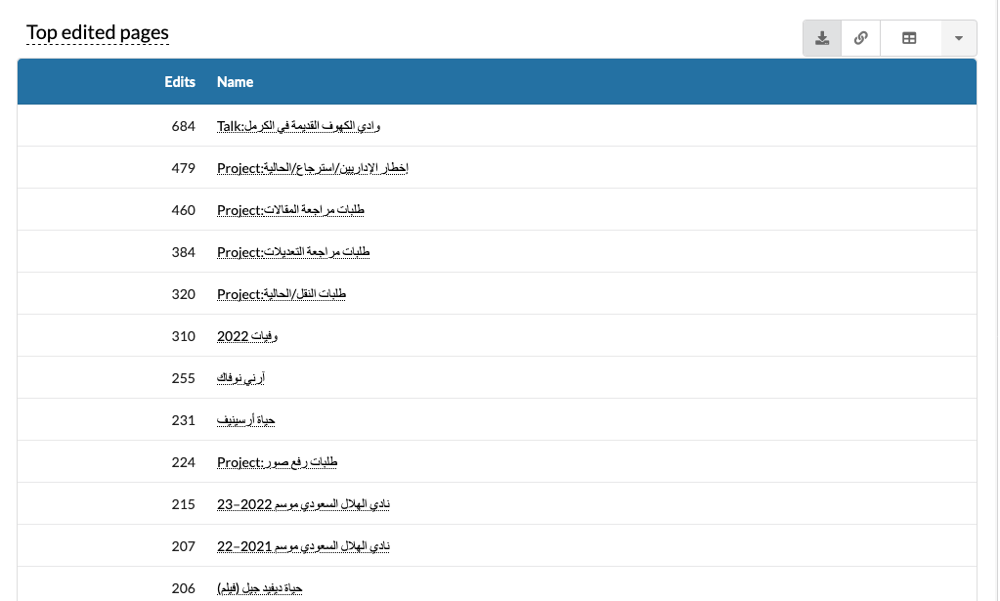

## Egyptian Arabic -- Top Edited Pages --no-filters:

              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0            اعطنى_الناى     1  2022-07-01T00:00:00.000Z           47  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:احداث_دلوقتى     2  2022-07-01T00:00:00.000Z           37  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                   ...   ...                       ...          ...                       ...                       ...                       ...
98                  دينا    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                العسكر   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


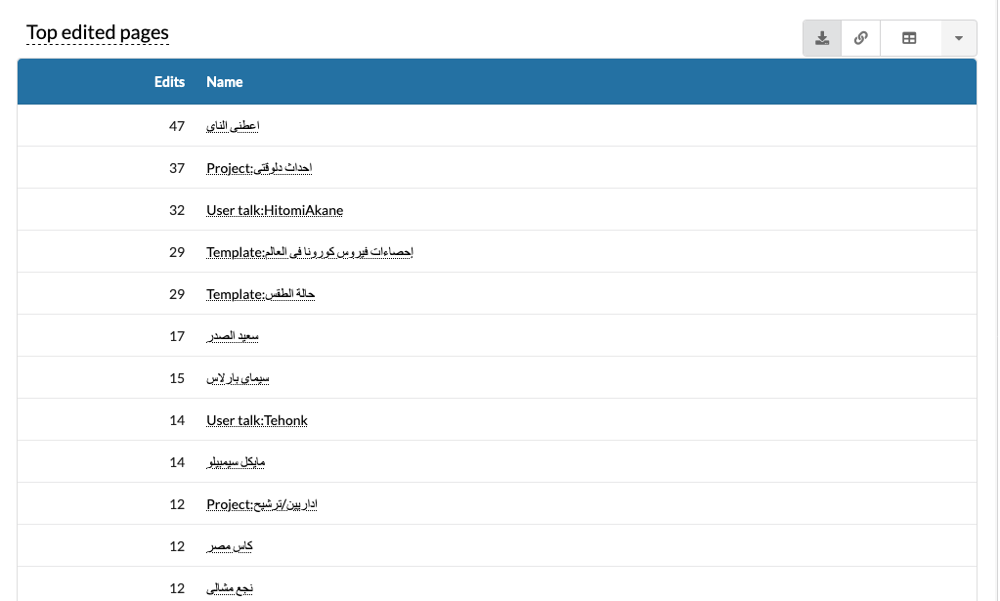

## Moroccan Arabic -- Top Edited Pages --no-filters:

                                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                   كاس_إفريقيا_د_لكورة_د_لعيالات_2022     1  2022-07-01T00:00:00.000Z          127  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Template:كاس_إفريقيا_د_لكورة_د_لعيالات_2022_ݣروپات     2  2022-07-01T00:00:00.000Z           40  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                                                1942    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                                1941  

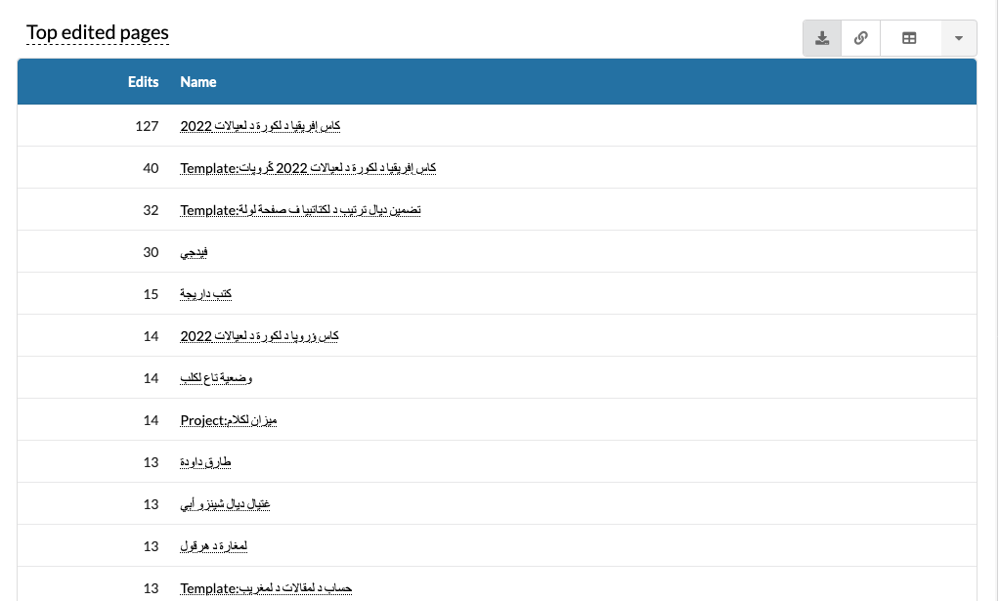

In [51]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver') 
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|~total|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--no-filters--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--no-filters--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
 
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --no-filters:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 2. Top Edited Pages `--page-type`:

##### 2.1 Top Edited Pages `--page-type-content`:

## English -- Top Edited Pages --page-type-content:

                                          page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                        Assassination_of_Shinzo_Abe     1  2022-07-01T00:00:00.000Z         2345  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   2022_Conservative_Party_leadership_election_(UK)     2  2022-07-01T00:00:00.000Z         2152  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                               ...   ...                       ...          ...                       ...                       ...                       ...
98                                2022_FIBA_Asia_Cup    99  2022-07-01T00:00:00.000Z          351  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                      O'Tooles_GAA   100  2022-07

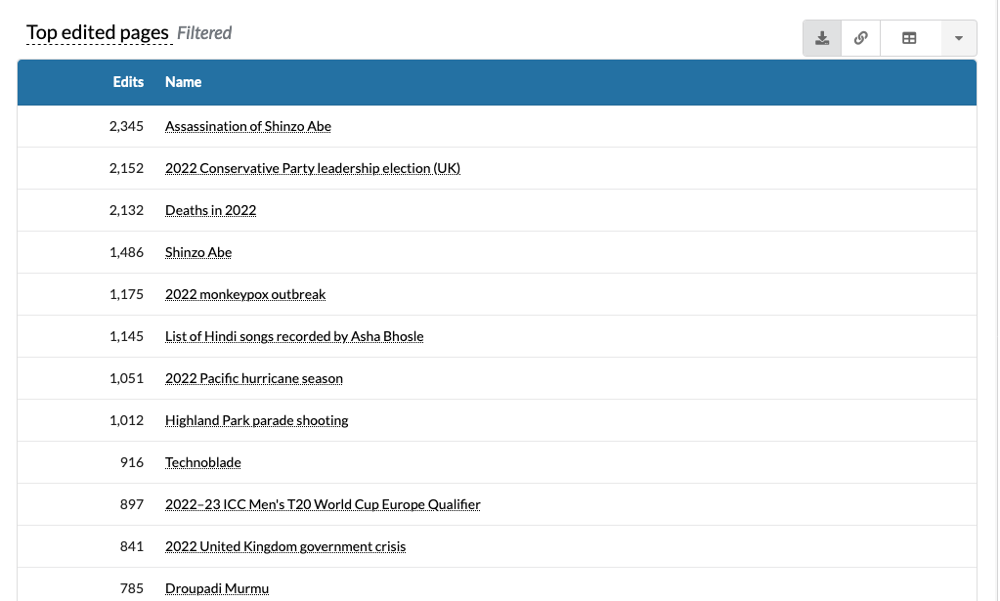

## Arabic -- Top Edited Pages --page-type-content:

                                      page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                                     وفيات_2022     1  2022-07-01T00:00:00.000Z          310  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                     آرني_نوفاك     2  2022-07-01T00:00:00.000Z          255  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                           ...   ...                       ...          ...                       ...                       ...                       ...
98  كرة_القدم_في_ألعاب_البحر_الأبيض_المتوسط_2013    99  2022-07-01T00:00:00.000Z           51  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                نادي_سامبدوريا   100  2022-07-01T00:00:00.000Z        

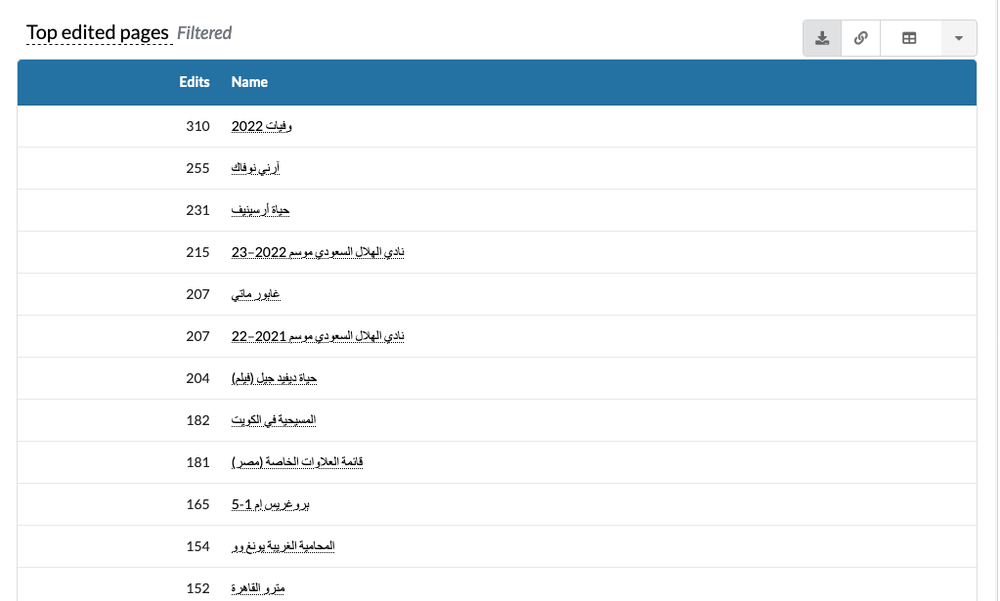

## Egyptian Arabic -- Top Edited Pages --page-type-content:

     page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   اعطنى_الناى     1  2022-07-01T00:00:00.000Z           52  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1    سعيد_الصدر     2  2022-07-01T00:00:00.000Z           23  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..          ...   ...                       ...          ...                       ...                       ...                       ...
98    بروك_هوجن    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99      الزمالك   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


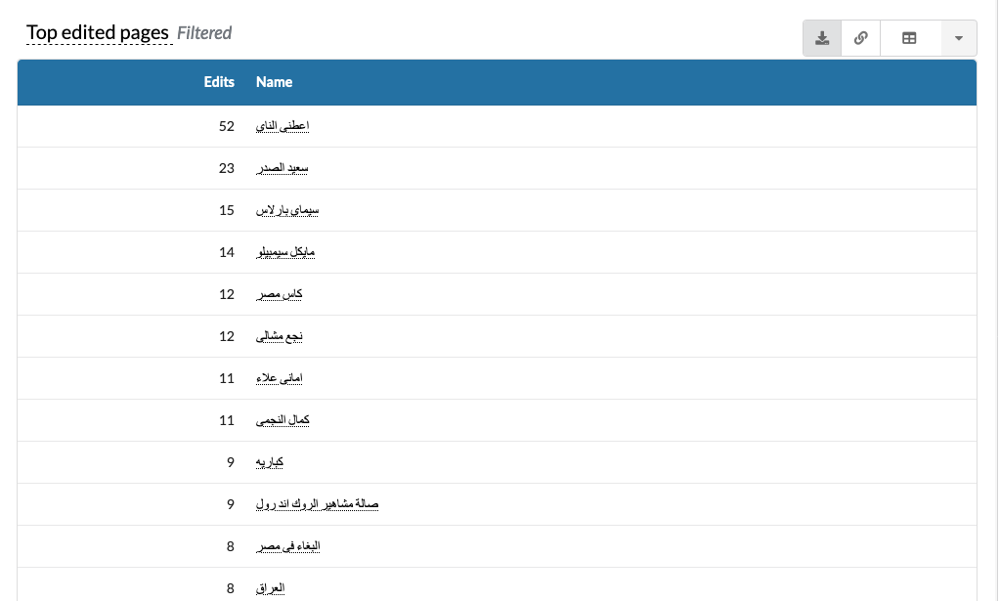

## Moroccan Arabic -- Top Edited Pages --page-type-content:

                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   كاس_إفريقيا_د_لكورة_د_لعيالات_2022     1  2022-07-01T00:00:00.000Z          127  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                فيدجي     2  2022-07-01T00:00:00.000Z           30  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                                1942    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                1941   100  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:0

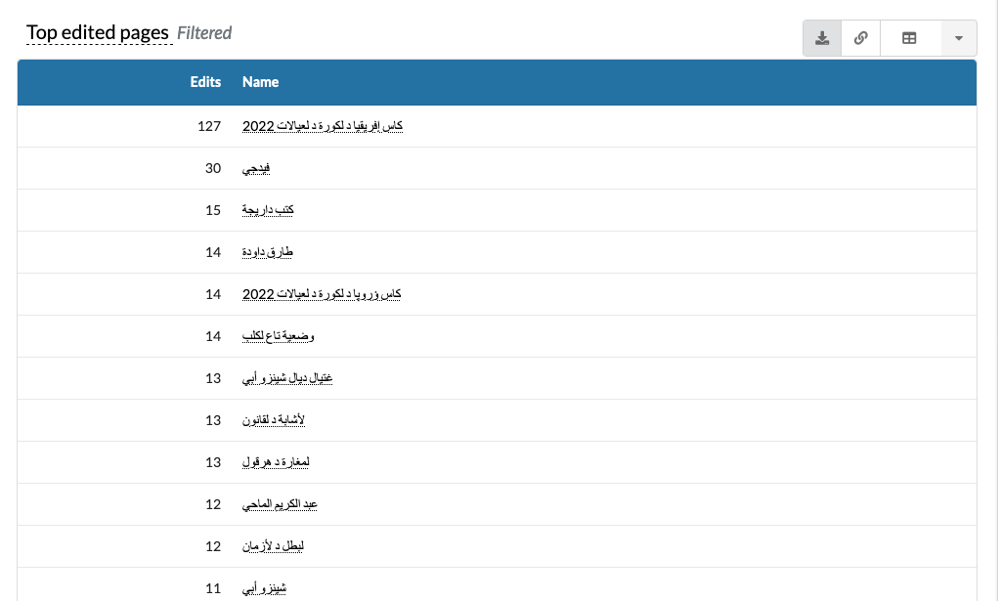

In [52]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-content--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-content--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-content:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

##### 2.2 Top Edited Pages `--page-type-non-content`:

## English -- Top Edited Pages --page-type-non-content:

                                              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Project:Administrator_intervention_against_vandalism     1  2022-07-01T00:00:00.000Z         7026  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                 User:AmandaNP/UAA/Time     2  2022-07-01T00:00:00.000Z         4458  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                   ...   ...                       ...          ...                       ...                       ...                       ...
98                                    User:Rutsq/sandbox    99  2022-07-01T00:00:00.000Z          458  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99              Template:COVID-19_cases_in_

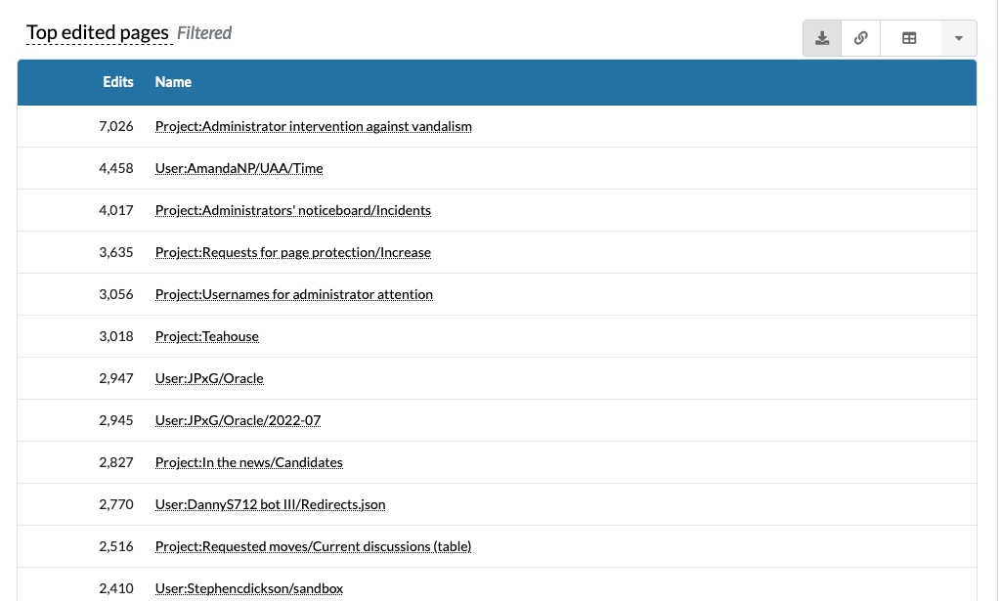

## Arabic -- Top Edited Pages --page-type-non-content:

                                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                   Talk:وادي_الكهوف_القديمة_في_الكرمل     1  2022-07-01T00:00:00.000Z          684  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1              Project:إخطار_الإداريين/استرجاع/الحالية     2  2022-07-01T00:00:00.000Z          479  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                             User talk:محمد_قيس_كاظم    99  2022-07-01T00:00:00.000Z           26  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Project:إحصاءات/المستخدمين_حسب_عدد_إنشاء_التحويلات

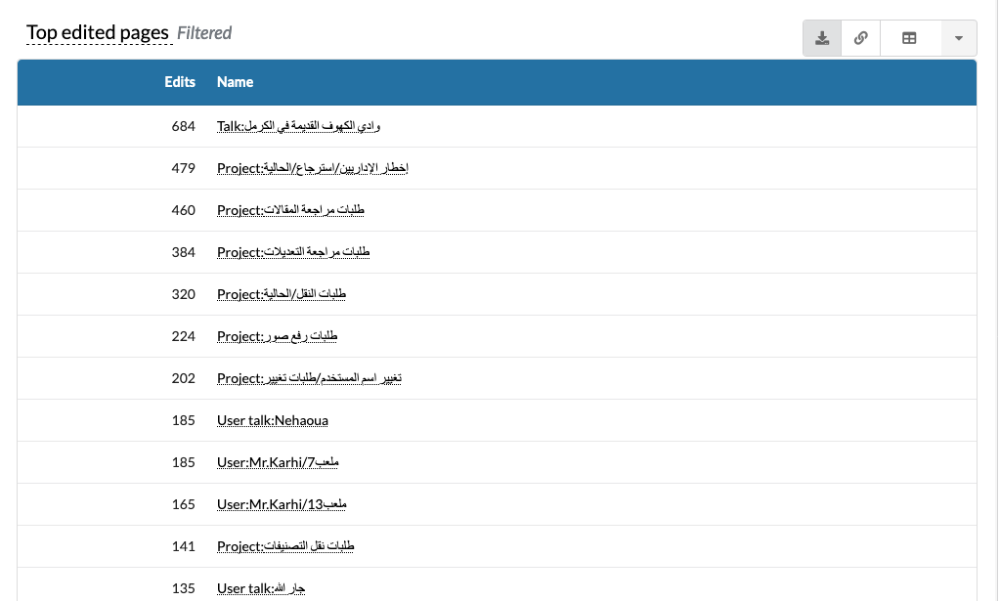

## Egyptian Arabic -- Top Edited Pages --page-type-non-content:

                     page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          Project:احداث_دلوقتى     1  2022-07-01T00:00:00.000Z           37  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1         User talk:HitomiAkane     2  2022-07-01T00:00:00.000Z           33  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                          ...   ...                       ...          ...                       ...                       ...                       ...
98        Category:راسم_من_برنو    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Category:جاسوس_من_ياسلوڤاتس   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


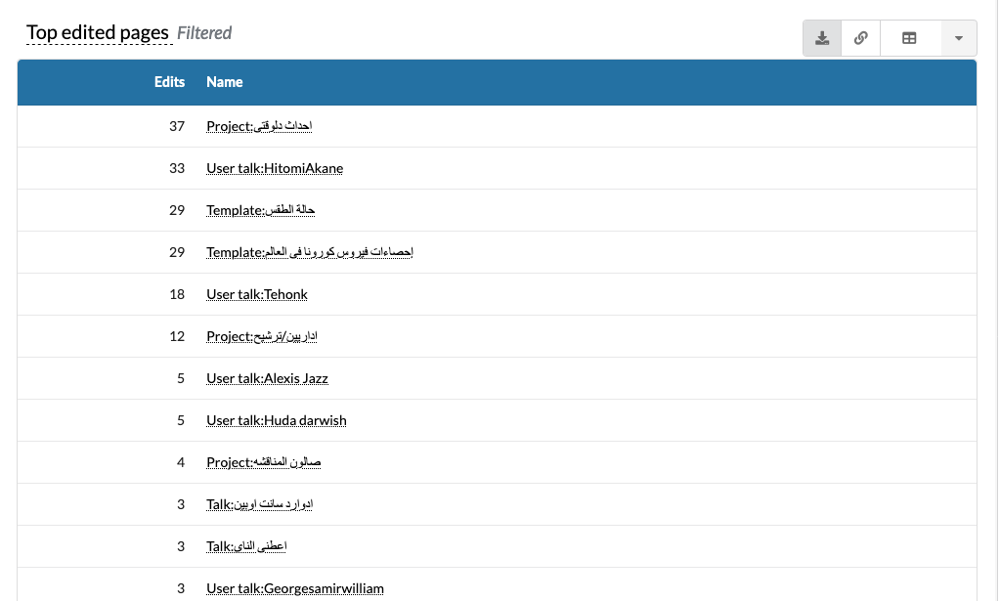

## Moroccan Arabic -- Top Edited Pages --page-type-non-content:

                                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Template:كاس_إفريقيا_د_لكورة_د_لعيالات_2022_ݣروپات     1  2022-07-01T00:00:00.000Z           40  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1     Template:تضمين_ديال_ترتيب_د_لكتاتبيا_ف_صفحة_لولة     2  2022-07-01T00:00:00.000Z           32  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                                      Template:S-end    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                           Template:Country

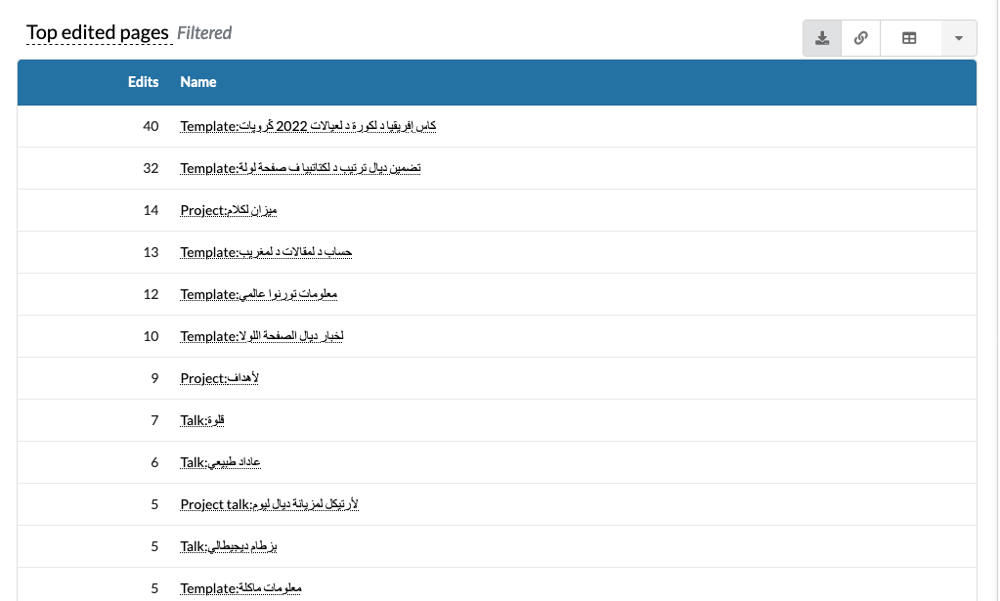

In [53]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-non-content--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-non-content--{wiki}.csv"
    driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
    sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

    image = pilImage.open(imageName)
    x1 , y1 =  452 , 215
    x2 , y2 = 1475 , 830
    cropped = image.crop((x1, y1, x2, y2))
    cropped.save(imageName)
    
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-non-content:\033[0m\n")
    readcsv = pandas.read_csv(csvName)
    print(readcsv.to_string(max_rows=5))
    display(pyImage(filename=imageName))

#### 3. Top Edited Pages `--editor-type`:

##### 3.1 Top Edited Pages `--editor-type-anonymous`:

## English -- Top Edited Pages --editor-type-anonymous:

                                          page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                                    Project:Sandbox     1  2022-07-01T00:00:00.000Z          869  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   2022_Conservative_Party_leadership_election_(UK)     2  2022-07-01T00:00:00.000Z          357  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                               ...   ...                       ...          ...                       ...                       ...                       ...
98                          User:CubanoBoi/sandbox70    99  2022-07-01T00:00:00.000Z          103  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                       Akademi_Fantasia_(season_2)   100  202

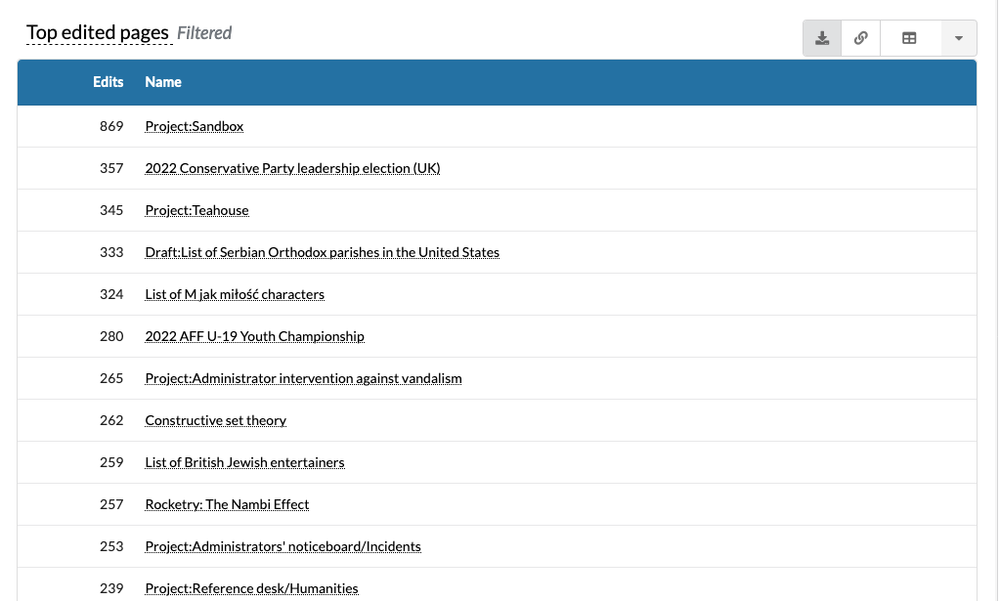

## Arabic -- Top Edited Pages --editor-type-anonymous:

                                 page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                         المصرية_للاتصالات     1  2022-07-01T00:00:00.000Z           31  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                              سندس_(مسلسل)     2  2022-07-01T00:00:00.000Z           24  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                      ...   ...                       ...          ...                       ...                       ...                       ...
98                            القصر_الشمالي    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  القوات_المسلحة_لدول_جامعة_الدول_العربية   100  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00

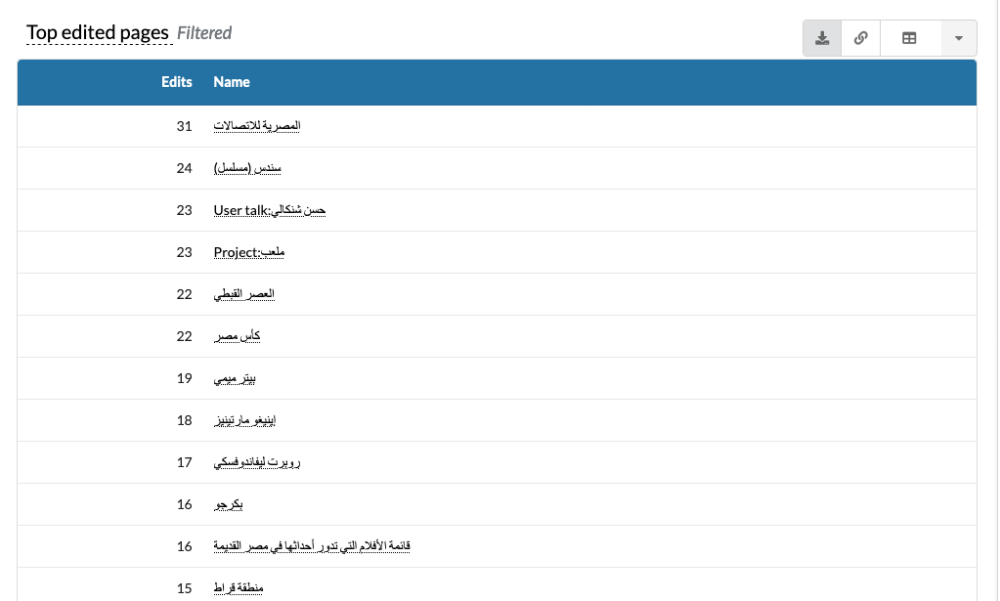

## Egyptian Arabic -- Top Edited Pages --editor-type-anonymous:

                  page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                اعطنى_الناى     1  2022-07-01T00:00:00.000Z           44  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                    كاس_مصر     2  2022-07-01T00:00:00.000Z           13  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                       ...   ...                       ...          ...                       ...                       ...                       ...
98                   الاطلال    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  الالهه_اليونانيه_القديمه   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


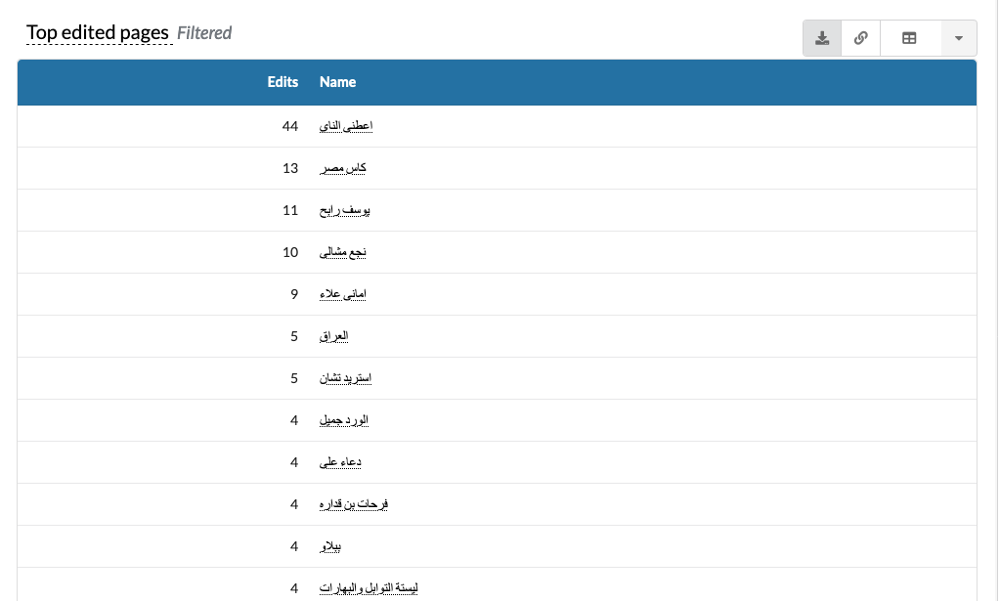

## Moroccan Arabic -- Top Edited Pages --editor-type-anonymous:

         page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           المغريب     1  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   الوداد_البيضاوي     2  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..              ...   ...                       ...          ...                       ...                       ...                       ...
17       مورا_الضهر    18  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
18     مومن_الديوري    19  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


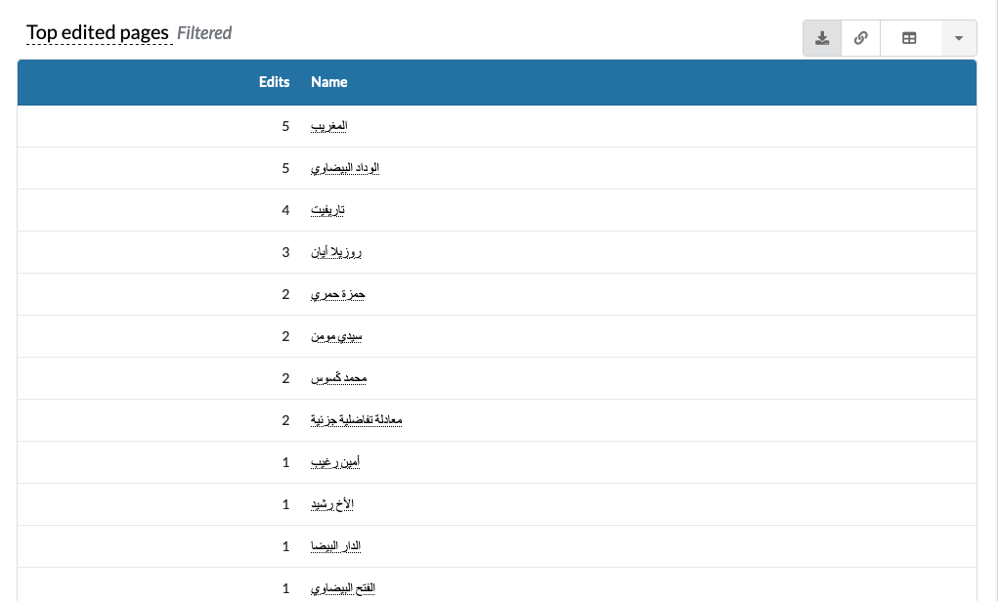

In [54]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~anonymous|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--editor-type-anonymous--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --editor-type-anonymous:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 3.2 Top Edited Pages `--editor-type-group-bot`:

## English -- Top Edited Pages --editor-type-group-bot:

                                              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                                 User:AmandaNP/UAA/Time     1  2022-07-01T00:00:00.000Z         4458  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:Administrator_intervention_against_vandalism     2  2022-07-01T00:00:00.000Z         3124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                   ...   ...                       ...          ...                       ...                       ...                       ...
98                       Talk:Five_Mile_Prairie,_Spokane    99  2022-07-01T00:00:00.000Z          122  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                Talk:Hill

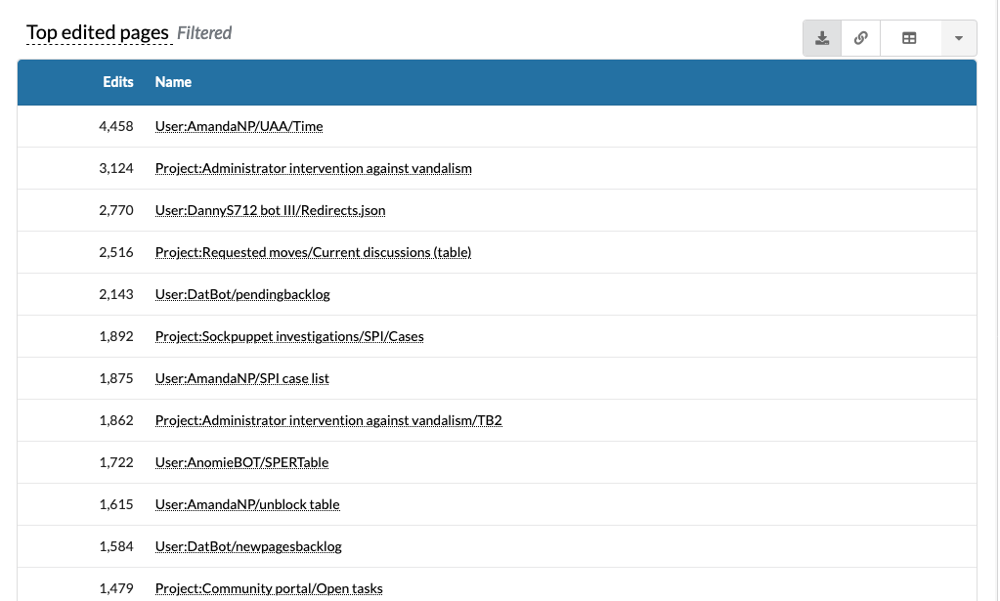

## Arabic -- Top Edited Pages --editor-type-group-bot:

                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Talk:وادي_الكهوف_القديمة_في_الكرمل     1  2022-07-01T00:00:00.000Z          684  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                           آرني_نوفاك     2  2022-07-01T00:00:00.000Z          255  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                  أليكساندر_إيبوليتو    99  2022-07-01T00:00:00.000Z           30  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                           ترتيب_غبي   100  2022-07-01T00:00:00.000Z           30  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000

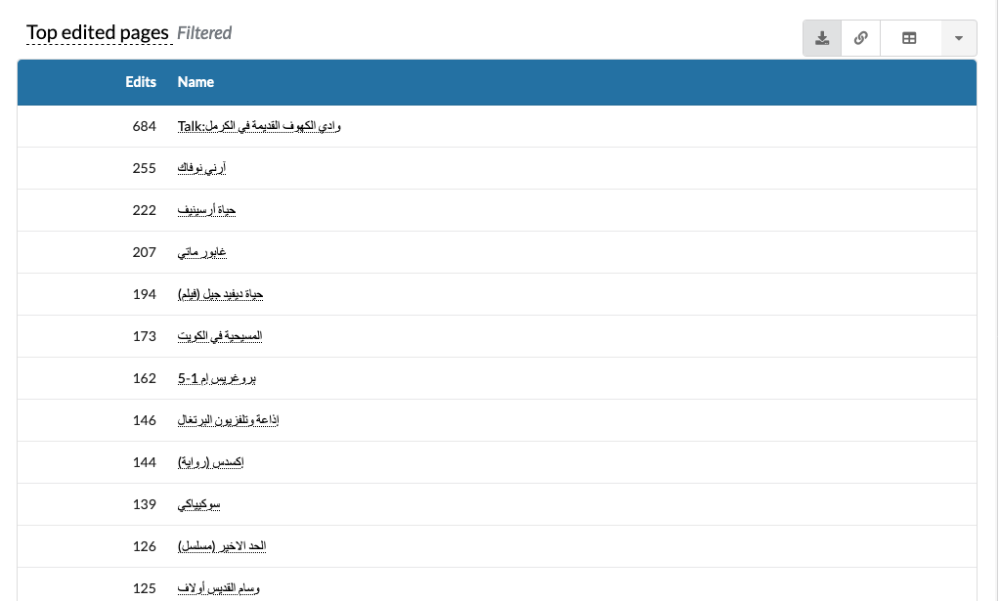

## Egyptian Arabic -- Top Edited Pages --editor-type-group-bot:

                         page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0               بارستو_(كاليفورنيا)     1  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                            بلخريا     2  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                              ...   ...                       ...          ...                       ...                       ...                       ...
98  SDSS_J102827.58+102822.8_(مجره)    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                            DNAI1   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-0

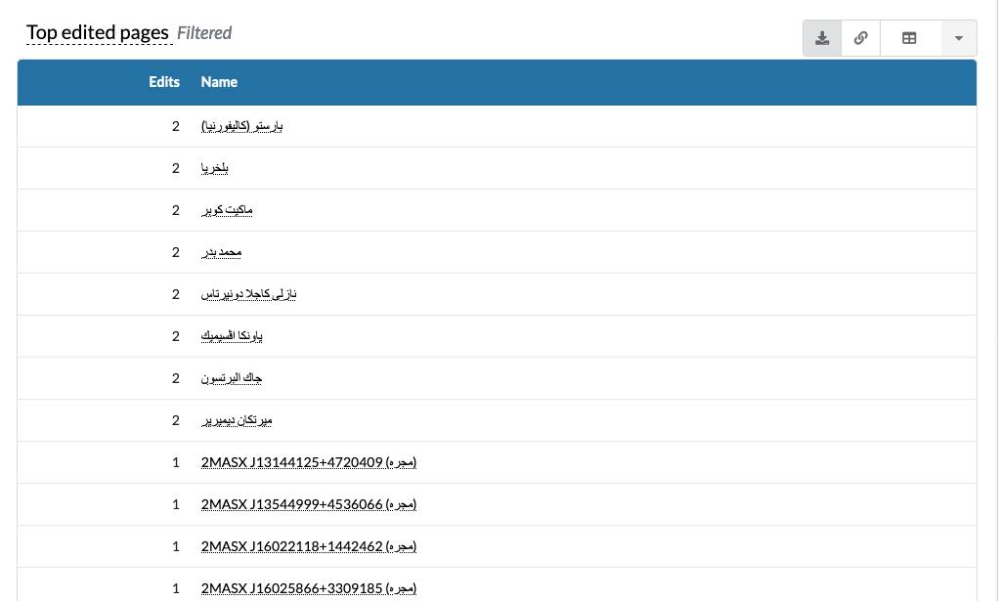

## Moroccan Arabic -- Top Edited Pages --editor-type-group-bot:

                                          page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Template:تضمين_ديال_ترتيب_د_لكتاتبيا_ف_صفحة_لولة     1  2022-07-01T00:00:00.000Z           32  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                   Template:حساب_د_لمقالات_د_لمغريب     2  2022-07-01T00:00:00.000Z           13  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                               ...   ...                       ...          ...                       ...                       ...                       ...
98                                              1942    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                              1941   

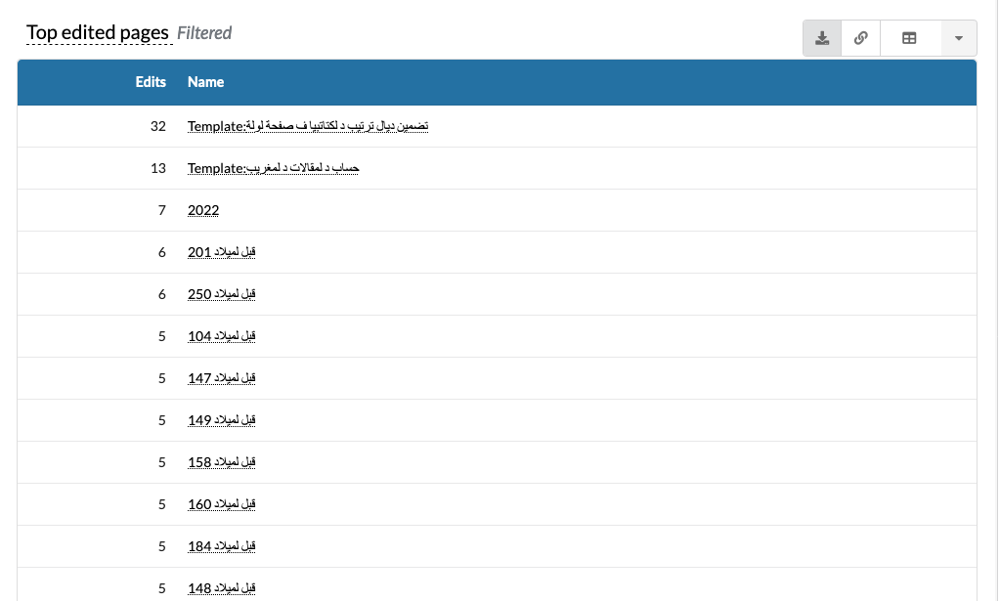

In [55]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~group-bot|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--editor-type-group-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --editor-type-group-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 3.3 Top Edited Pages `--editor-type-name-bot`:

## English -- Top Edited Pages --editor-type-name-bot:

                  page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           User:JPxG/Oracle     1  2022-07-01T00:00:00.000Z         2944  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   User:JPxG/Oracle/2022-07     2  2022-07-01T00:00:00.000Z         2943  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                       ...   ...                       ...          ...                       ...                       ...                       ...
98        User talk:Naruto81    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99      Survivor:_Micronesia   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


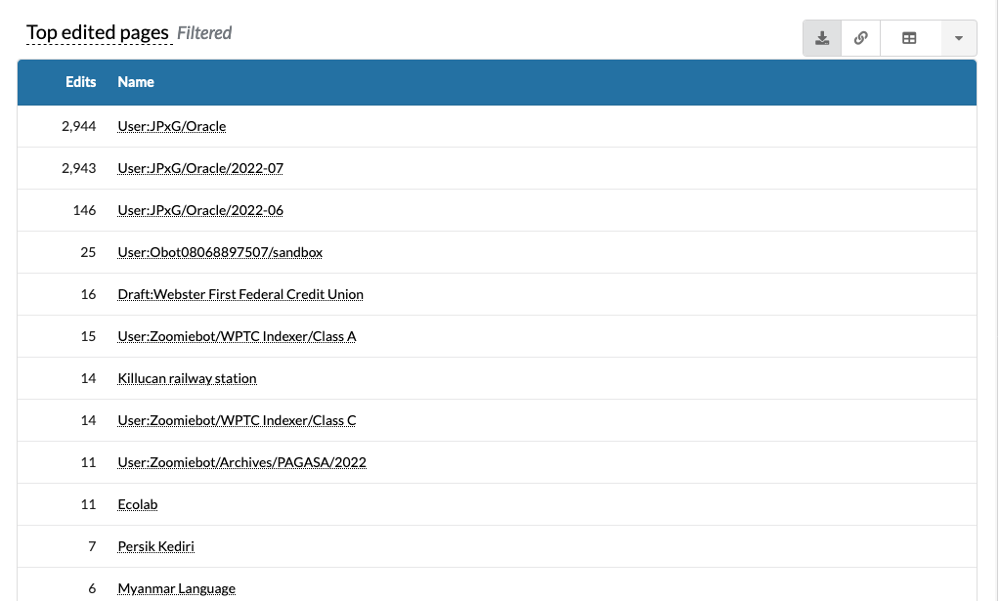

## Arabic -- Top Edited Pages --editor-type-name-bot:

                       page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                    سندس_(مسلسل)     1  2022-07-01T00:00:00.000Z            8  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:طلبات_مراجعة_المقالات     2  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                            ...   ...                       ...          ...                       ...                       ...                       ...
22                   مرعي_الحليان    23  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
23                   نورة_البلوشي    24  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


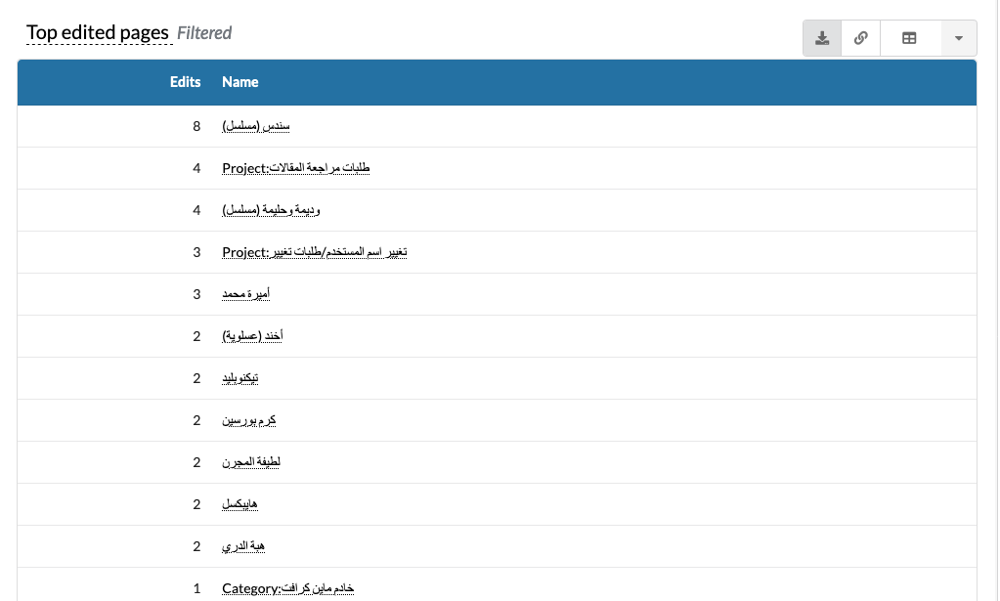

## Egyptian Arabic -- Top Edited Pages --editor-type-name-bot:

                 page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Category:اصحاب_كباريهات     1  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1         Category:كباريهات     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                      ...   ...                       ...          ...                       ...                       ...                       ...
18       جماعة_الدوا_القران    19  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
19        ليبراليه_كلاسيكيه    20  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


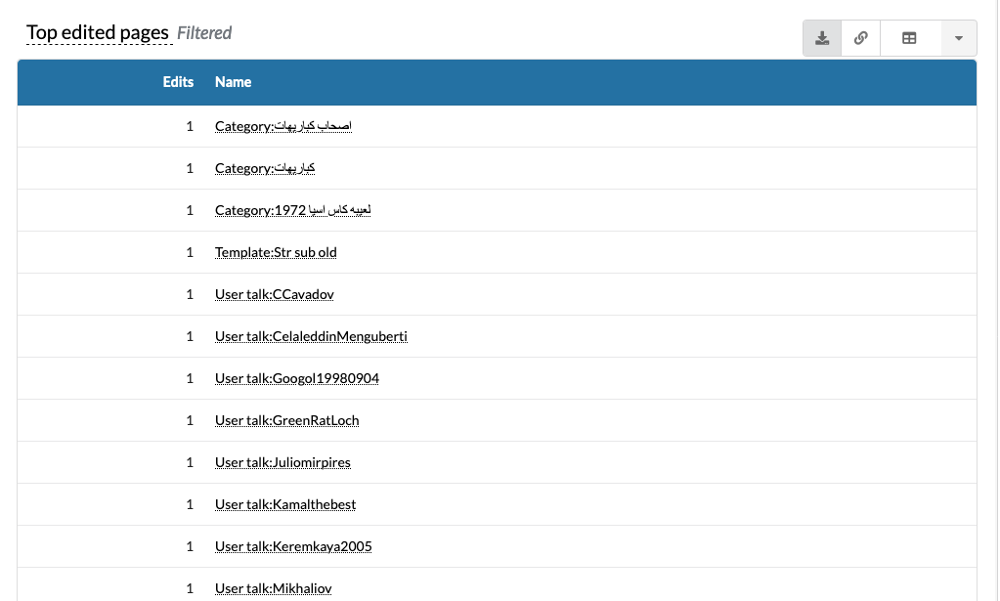

## Moroccan Arabic -- Top Edited Pages --editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [56]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~name-bot|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
        
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'page_title':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 3.4 Top Edited Pages `--editor-type-user`:

## English -- Top Edited Pages --editor-type-user:

                                              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          Project:Administrators'_noticeboard/Incidents     1  2022-07-01T00:00:00.000Z         3685  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:Administrator_intervention_against_vandalism     2  2022-07-01T00:00:00.000Z         3636  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                   ...   ...                       ...          ...                       ...                       ...                       ...
98                Ovens_&_Murray_Football_Netball_League    99  2022-07-01T00:00:00.000Z          447  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                  User:Krisgabwoosh/Biography_

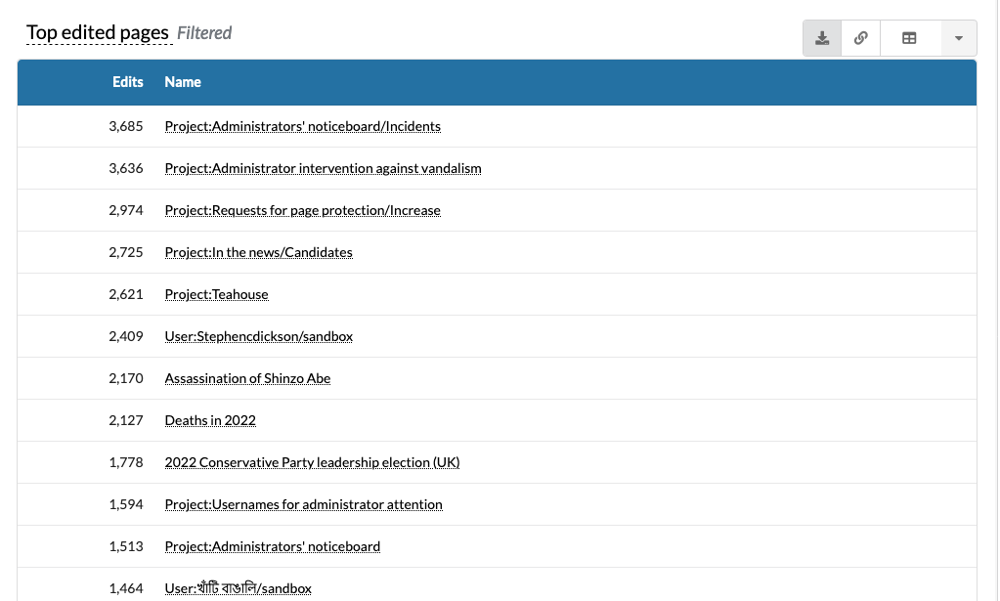

## Arabic -- Top Edited Pages --editor-type-user:

                                 page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Project:إخطار_الإداريين/استرجاع/الحالية     1  2022-07-01T00:00:00.000Z          448  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1             Project:طلبات_مراجعة_المقالات     2  2022-07-01T00:00:00.000Z          430  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                      ...   ...                       ...          ...                       ...                       ...                       ...
98                    Project:إداريون/مشاكل    99  2022-07-01T00:00:00.000Z           35  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                           User talk:فيصل   100  2022-07-01T00:00:00.000Z           35  2022-07-01T00:00:00.000Z

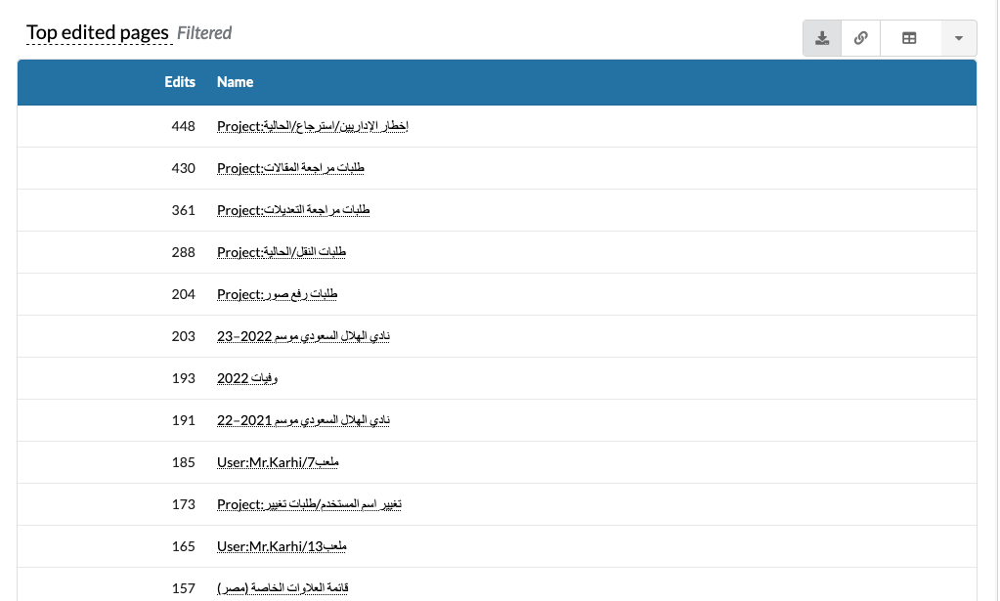

## Egyptian Arabic -- Top Edited Pages --editor-type-user:

               page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0    Project:احداث_دلوقتى     1  2022-07-01T00:00:00.000Z           36  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   User talk:HitomiAkane     2  2022-07-01T00:00:00.000Z           33  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                    ...   ...                       ...          ...                       ...                       ...                       ...
98            ڤيراچ_ادهاڤ    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99           حسن_البارودى   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


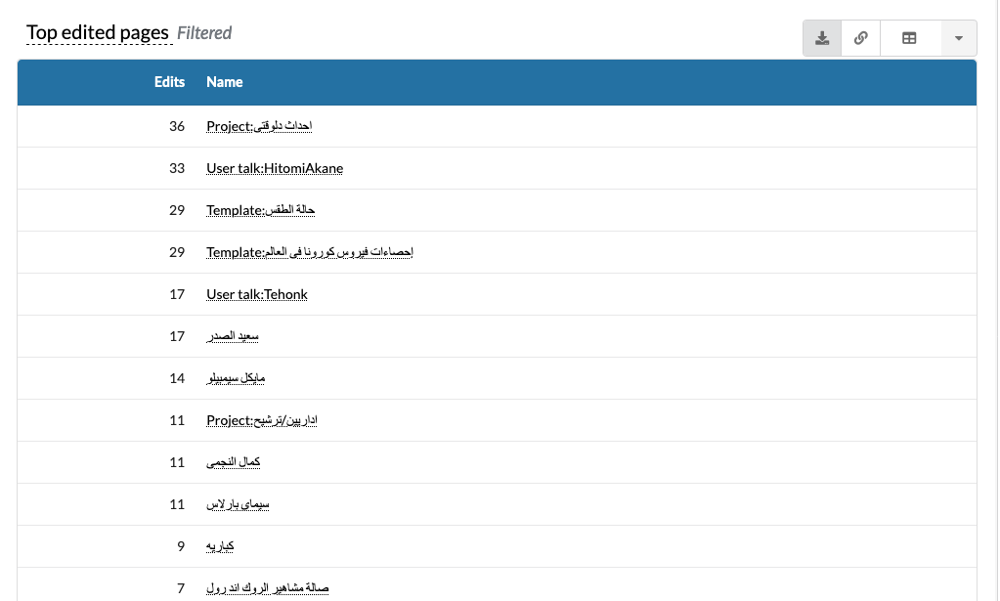

## Moroccan Arabic -- Top Edited Pages --editor-type-user:

                                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                   كاس_إفريقيا_د_لكورة_د_لعيالات_2022     1  2022-07-01T00:00:00.000Z          124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Template:كاس_إفريقيا_د_لكورة_د_لعيالات_2022_ݣروپات     2  2022-07-01T00:00:00.000Z           38  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                                                أملو    99  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                                

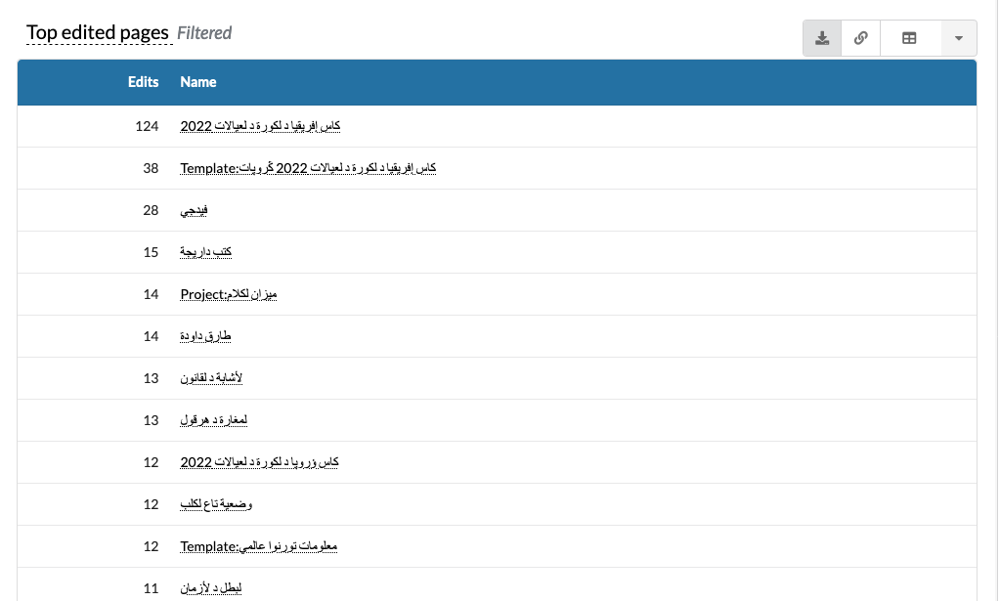

In [57]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~user|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

#### 4. Top Edited Pages `--page-type--editor-type`:

##### 4.1. Top Edited Pages `--page-type-content--editor-type-anonymous`:

## English -- Top Edited Pages --page-type-content--editor-type-anonymous:

                                          page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   2022_Conservative_Party_leadership_election_(UK)     1  2022-07-01T00:00:00.000Z          357  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                    List_of_M_jak_miłość_characters     2  2022-07-01T00:00:00.000Z          324  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                               ...   ...                       ...          ...                       ...                       ...                       ...
98                                      Mattel_Films    99  2022-07-01T00:00:00.000Z           98  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                 NASCAR_Camping_World_Truc

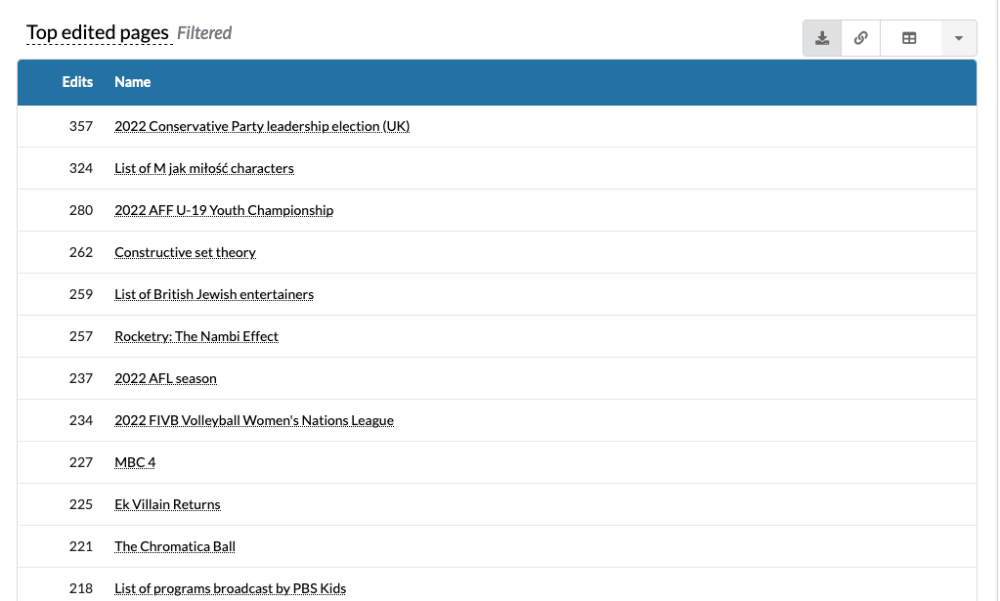

## Arabic -- Top Edited Pages --page-type-content--editor-type-anonymous:

                    page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0            المصرية_للاتصالات     1  2022-07-01T00:00:00.000Z           31  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                 سندس_(مسلسل)     2  2022-07-01T00:00:00.000Z           24  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                         ...   ...                       ...          ...                       ...                       ...                       ...
98  جاءنا_البيان_التالي_(فيلم)    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99              دارين_(القطيف)   100  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


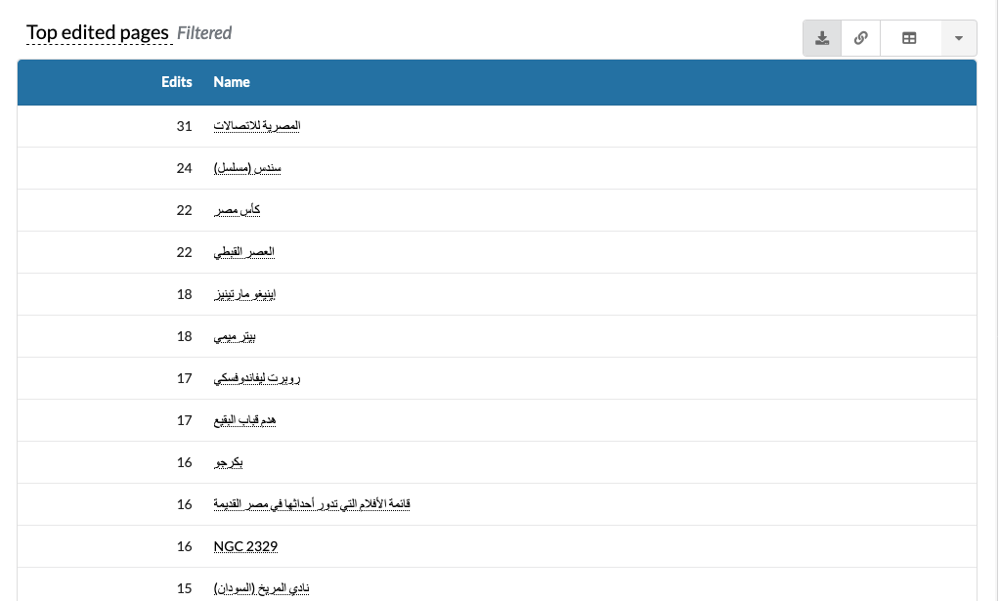

## Egyptian Arabic -- Top Edited Pages --page-type-content--editor-type-anonymous:

       page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0     اعطنى_الناى     1  2022-07-01T00:00:00.000Z           44  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1         كاس_مصر     2  2022-07-01T00:00:00.000Z           13  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..            ...   ...                       ...          ...                       ...                       ...                       ...
98   القديس_مارون    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  الكاهنه_ديهيا   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


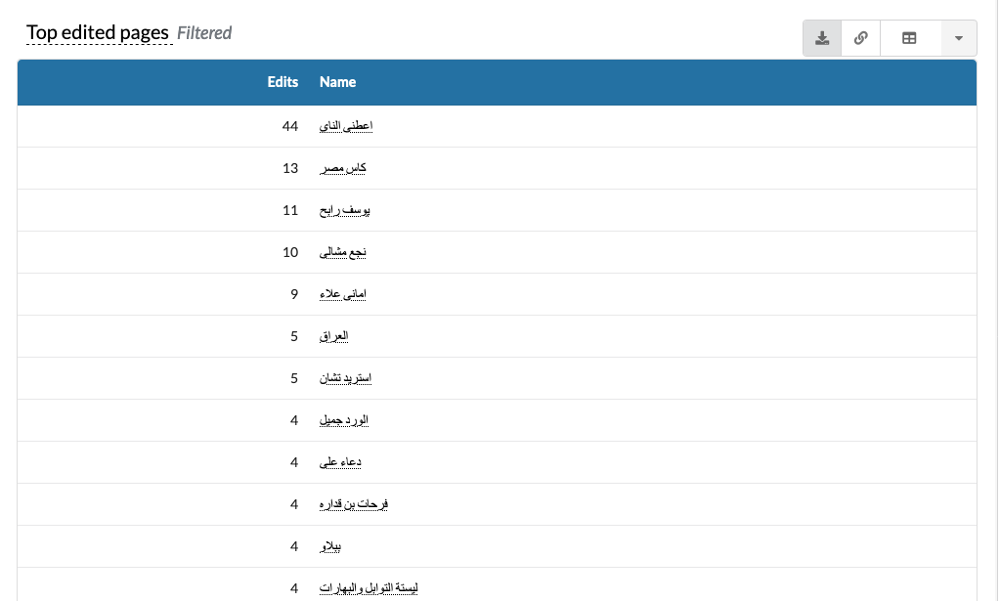

## Moroccan Arabic -- Top Edited Pages --page-type-content--editor-type-anonymous:

         page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           المغريب     1  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   الوداد_البيضاوي     2  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..              ...   ...                       ...          ...                       ...                       ...                       ...
17       مورا_الضهر    18  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
18     مومن_الديوري    19  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


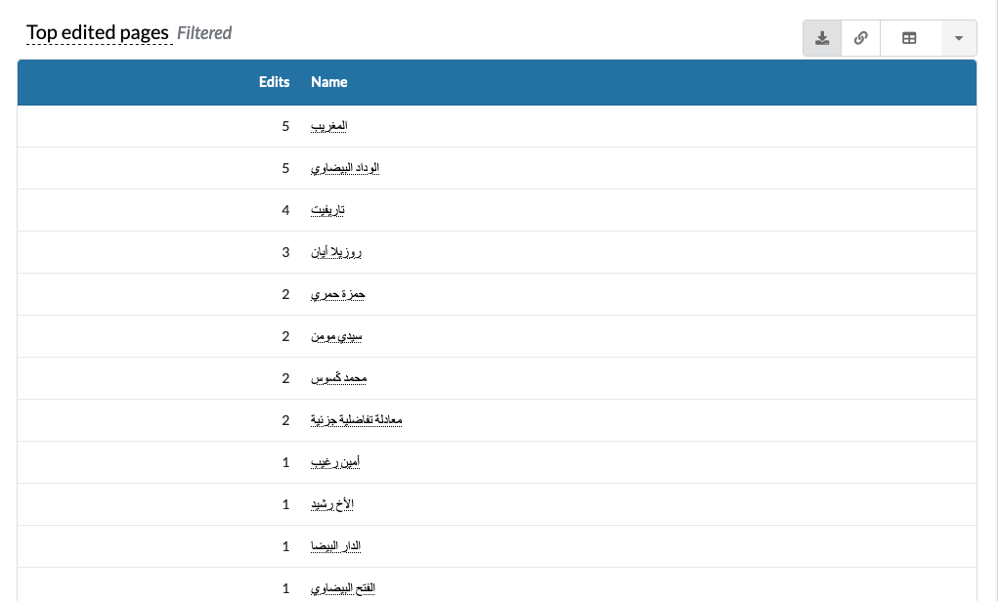

In [58]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~anonymous+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-content--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-content--editor-type-anonymous--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-content--editor-type-anonymous:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.2. Top Edited Pages `--page-type-content--editor-type-group-bot`:

## English -- Top Edited Pages --page-type-content--editor-type-group-bot:

                   page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           Rockwood,_Spokane     1  2022-07-01T00:00:00.000Z          124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1       West_Central,_Spokane     2  2022-07-01T00:00:00.000Z          124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                        ...   ...                       ...          ...                       ...                       ...                       ...
98         Emma_Smith_Gillies    99  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  First_Battle_of_Saltville   100  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


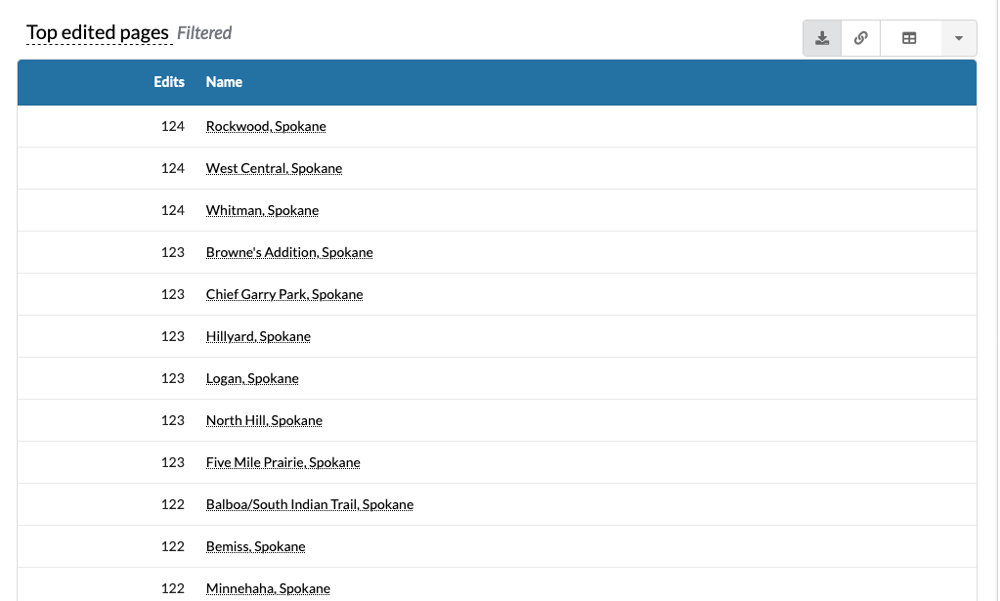

## Arabic -- Top Edited Pages --page-type-content--editor-type-group-bot:

                        page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                       آرني_نوفاك     1  2022-07-01T00:00:00.000Z          255  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                     حياة_أرسينيف     2  2022-07-01T00:00:00.000Z          224  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                             ...   ...                       ...          ...                       ...                       ...                       ...
98                   ثورة_25_يناير    99  2022-07-01T00:00:00.000Z           27  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  بدور_بنت_سلطان_بن_محمد_القاسمي   100  2022-07-01T00:00:00.000Z           26  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  20

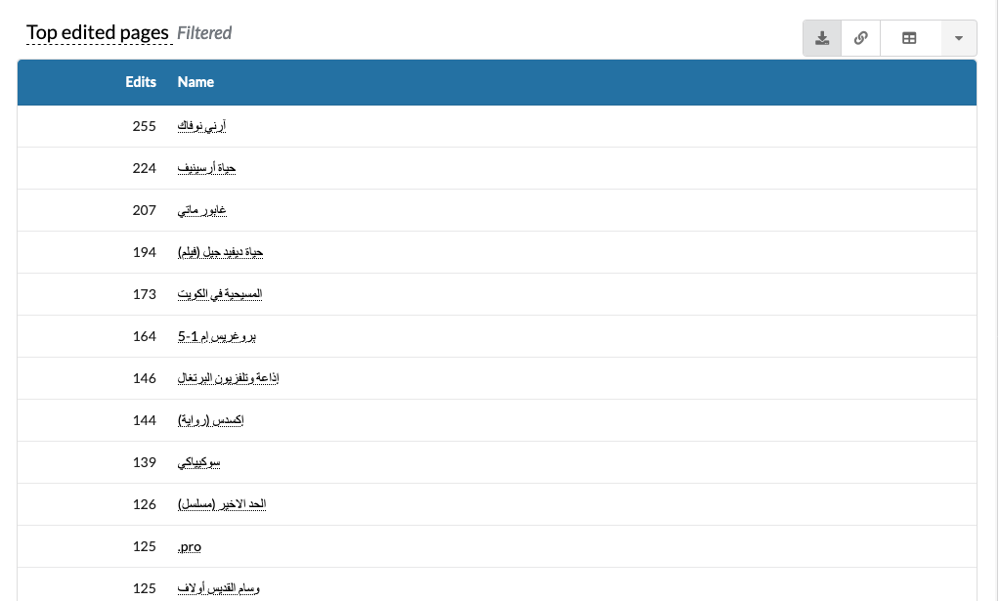

## Egyptian Arabic -- Top Edited Pages --page-type-content--editor-type-group-bot:

                         page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0               بارستو_(كاليفورنيا)     1  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                      جاك_البرتسون     2  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                              ...   ...                       ...          ...                       ...                       ...                       ...
98  SDSS_J170111.05+353540.8_(مجره)    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99              LEDA_1667881_(مجره)   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00

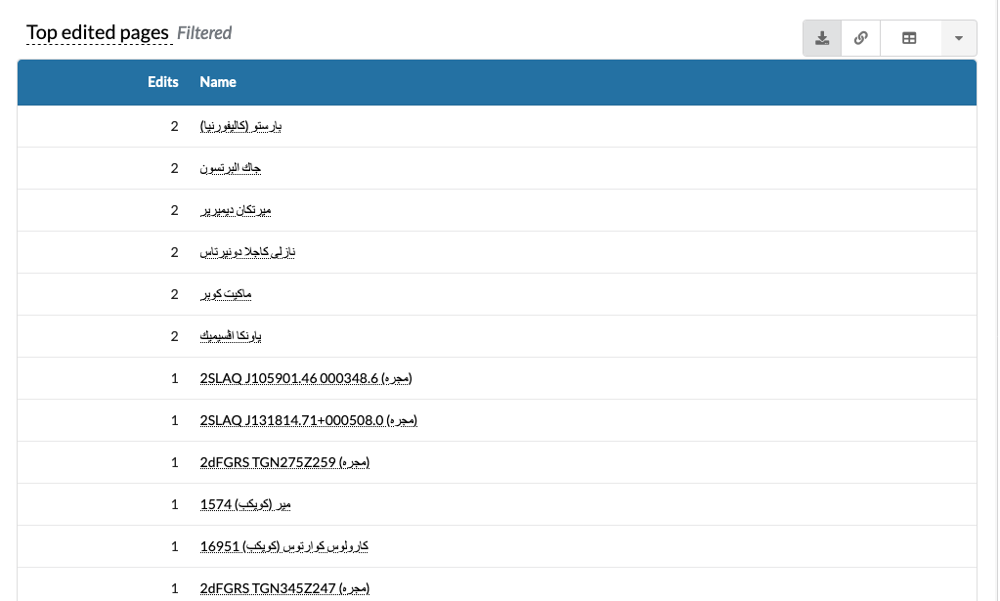

## Moroccan Arabic -- Top Edited Pages --page-type-content--editor-type-group-bot:

        page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0             2022     1  2022-07-01T00:00:00.000Z            7  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   201_قبل_لميلاد     2  2022-07-01T00:00:00.000Z            6  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..             ...   ...                       ...          ...                       ...                       ...                       ...
98            1942    99  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99            1941   100  2022-07-01T00:00:00.000Z            5  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


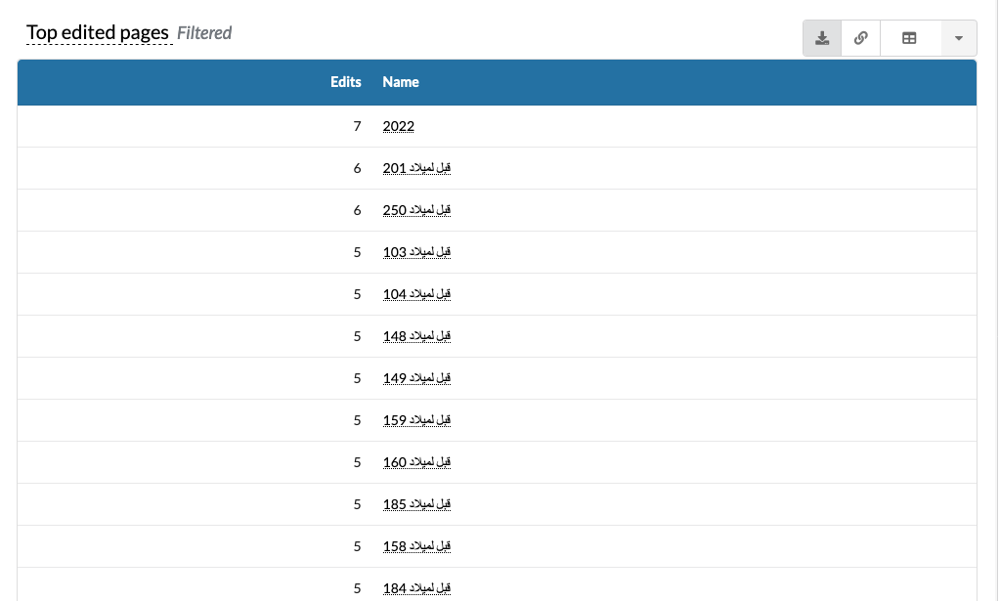

In [59]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~group-bot+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-content--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-content--editor-type-group-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-content--editor-type-group-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.3. Top Edited Pages `--page-type-content--editor-type-name-bot`:

## English -- Top Edited Pages --page-type-content--editor-type-name-bot:

                  page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Killucan_railway_station     1  2022-07-01T00:00:00.000Z           14  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                     Ecolab     2  2022-07-01T00:00:00.000Z           11  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                       ...   ...                       ...          ...                       ...                       ...                       ...
98      Austin,_Pennsylvania    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                  Adultism   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


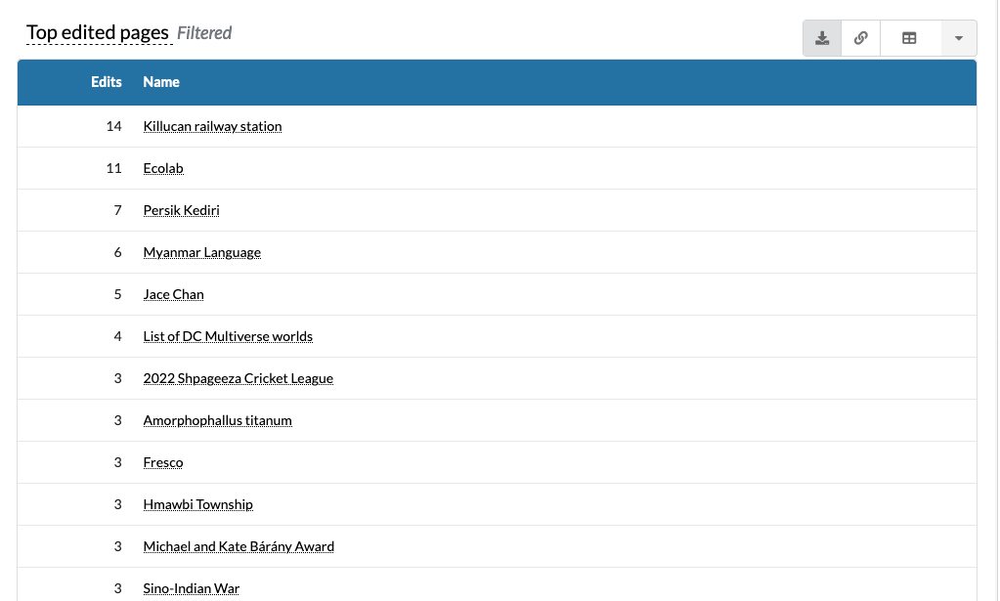

## Arabic -- Top Edited Pages --page-type-content--editor-type-name-bot:

              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           سندس_(مسلسل)     1  2022-07-01T00:00:00.000Z            8  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   وديمة_وحليمة_(مسلسل)     2  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                   ...   ...                       ...          ...                       ...                       ...                       ...
19          مرعي_الحليان    20  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
20          نورة_البلوشي    21  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


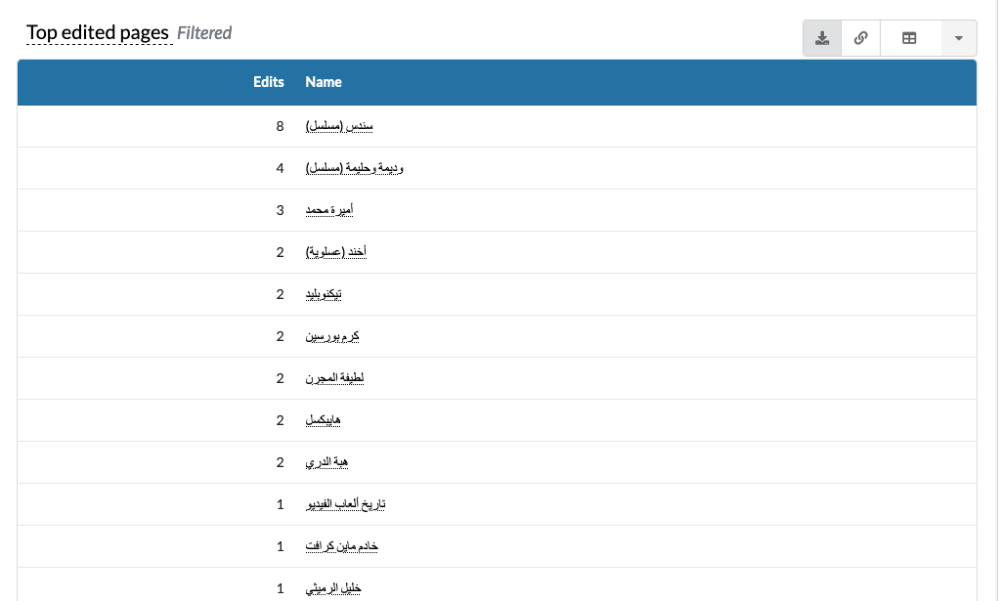

## Egyptian Arabic -- Top Edited Pages --page-type-content--editor-type-name-bot:

           page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  جماعة_الدوا_القران     1  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   ليبراليه_كلاسيكيه     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


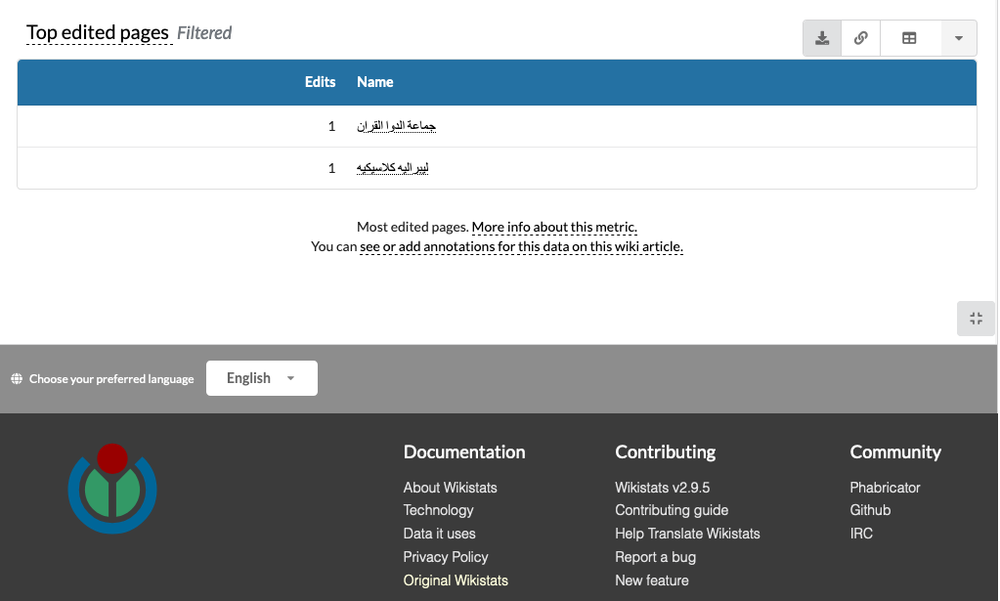

## Moroccan Arabic -- Top Edited Pages --page-type-content--editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [60]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~name-bot+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-content--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-content--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-content--editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
        
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'page_title':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 4.4. Top Edited Pages `--page-type-content--editor-type-user`:

## English -- Top Edited Pages --page-type-content--editor-type-user:

                               page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0             Assassination_of_Shinzo_Abe     1  2022-07-01T00:00:00.000Z         2170  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                          Deaths_in_2022     2  2022-07-01T00:00:00.000Z         2127  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                    ...   ...                       ...          ...                       ...                       ...                       ...
98                          2022_ATP_Tour    99  2022-07-01T00:00:00.000Z          290  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Founding_Fathers_of_the_United_States   100  2022-07-01T00:00:00.000Z          290  2022-07-01T00:00

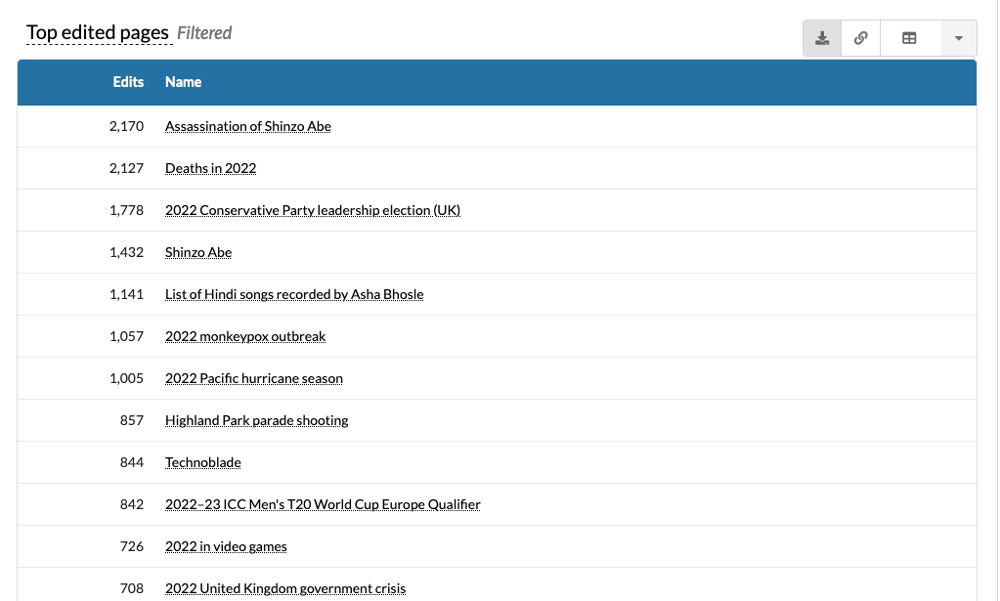

## Arabic -- Top Edited Pages --page-type-content--editor-type-user:

                                       page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                نادي_الهلال_السعودي_موسم_2022–23     1  2022-07-01T00:00:00.000Z          203  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                      وفيات_2022     2  2022-07-01T00:00:00.000Z          193  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                            ...   ...                       ...          ...                       ...                       ...                       ...
98  الاثنين_الأربعاء_الجمعة_الثلاثاء_الخميس_السبت    99  2022-07-01T00:00:00.000Z           22  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                                    بانكيك_سواب   100  2022-07-

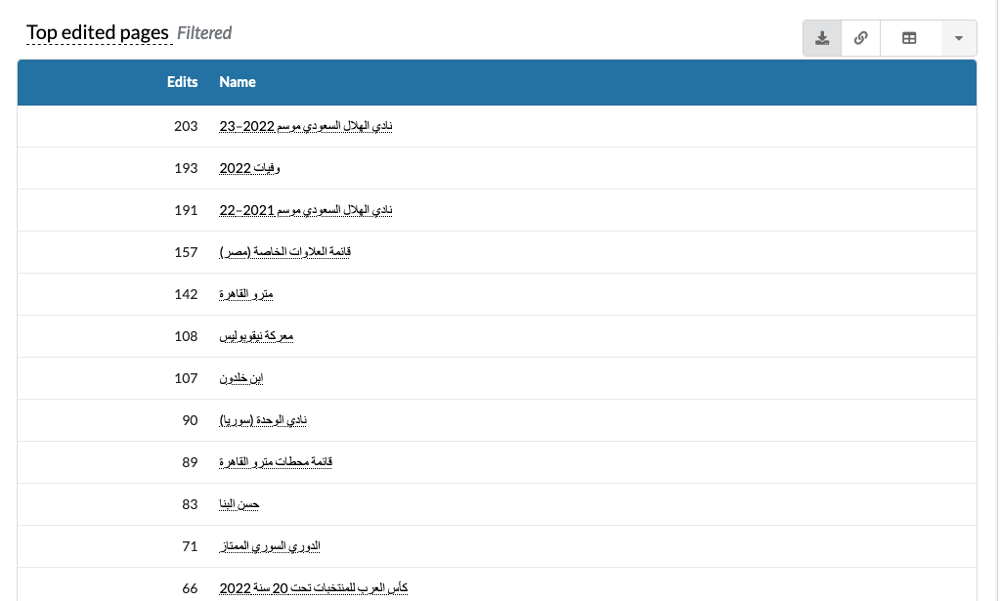

## Egyptian Arabic -- Top Edited Pages --page-type-content--editor-type-user:

           page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          سعيد_الصدر     1  2022-07-01T00:00:00.000Z           24  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1        سيماى_بارلاس     2  2022-07-01T00:00:00.000Z           17  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                ...   ...                       ...          ...                       ...                       ...                       ...
98       سيرا_كوتلوبى    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  انتونيو_الباثيتيه   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


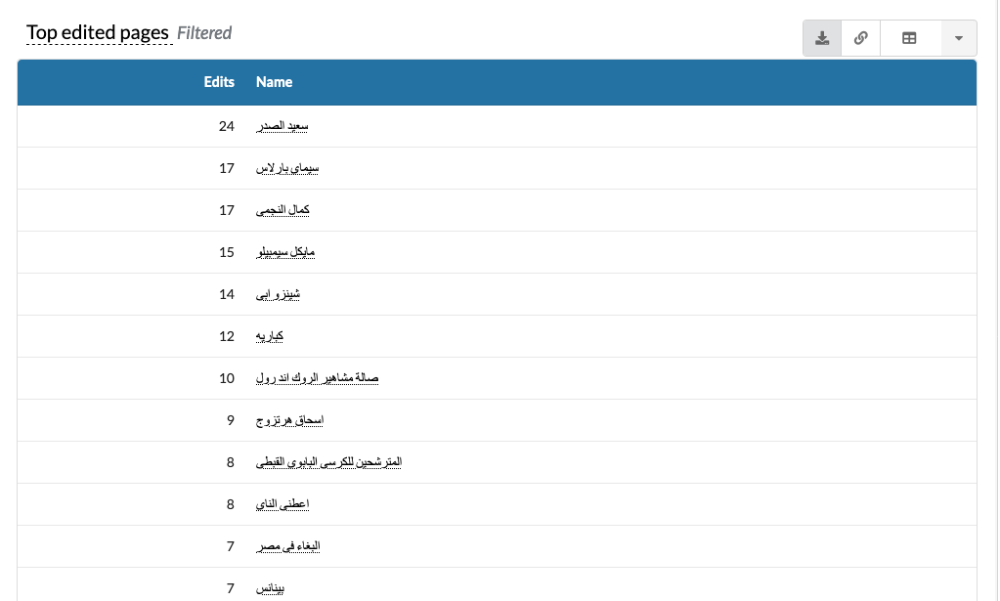

## Moroccan Arabic -- Top Edited Pages --page-type-content--editor-type-user:

                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   كاس_إفريقيا_د_لكورة_د_لعيالات_2022     1  2022-07-01T00:00:00.000Z          124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                فيدجي     2  2022-07-01T00:00:00.000Z           28  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                             إسرافيل    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                               إسلام   100  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  

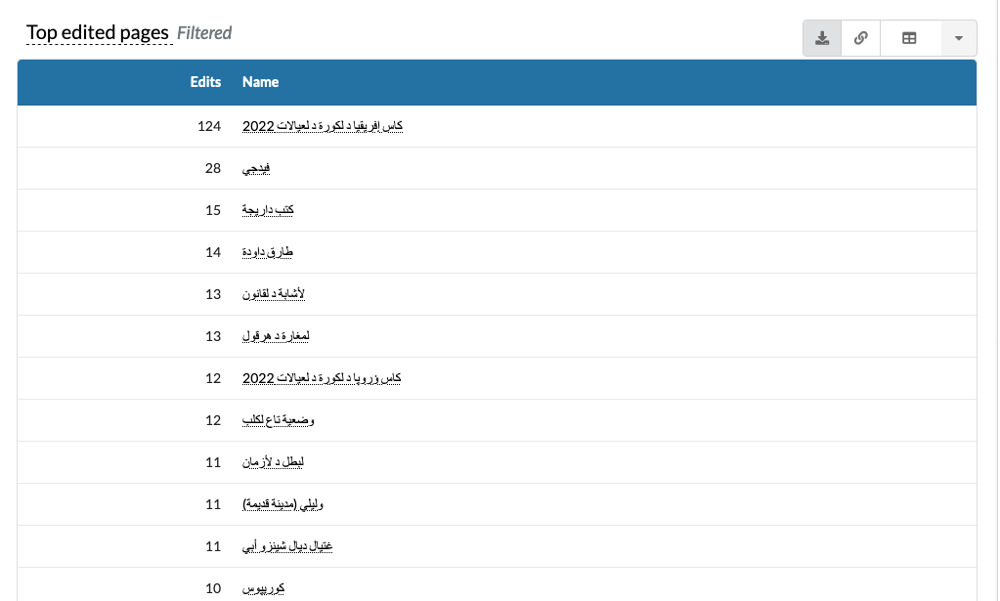

In [61]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~user+(page_type)~content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-content--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-content--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-content--editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.5. Top Edited Pages `--page-type-non-content--editor-type-anonymous`:

## English -- Top Edited Pages --page-type-non-content--editor-type-anonymous:

                   page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0             Project:Sandbox     1  2022-07-01T00:00:00.000Z          869  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1            Project:Teahouse     2  2022-07-01T00:00:00.000Z          345  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                        ...   ...                       ...          ...                       ...                       ...                       ...
98      Draft:Zilch_(company)    99  2022-07-01T00:00:00.000Z           26  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Draft:Zombies_(franchise)   100  2022-07-01T00:00:00.000Z           26  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


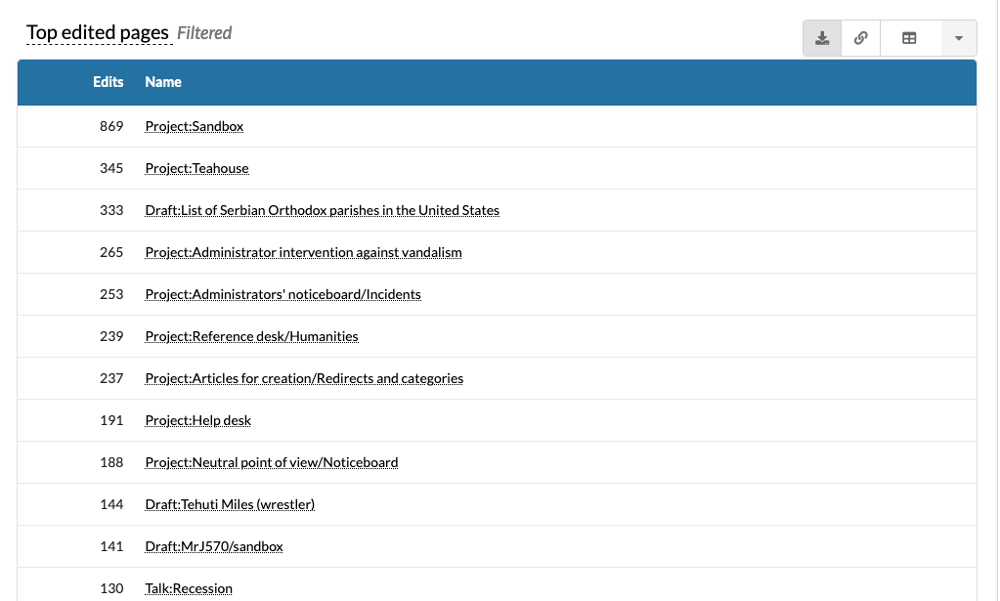

## Arabic -- Top Edited Pages --page-type-non-content--editor-type-anonymous:

                        page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                     Project:ملعب     1  2022-07-01T00:00:00.000Z           23  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1             User talk:حسن_شنكالي     2  2022-07-01T00:00:00.000Z           23  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                             ...   ...                       ...          ...                       ...                       ...                       ...
98  File:ويندوز_فيستا_الأساسية.png    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99              Category:باغز_باني   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z

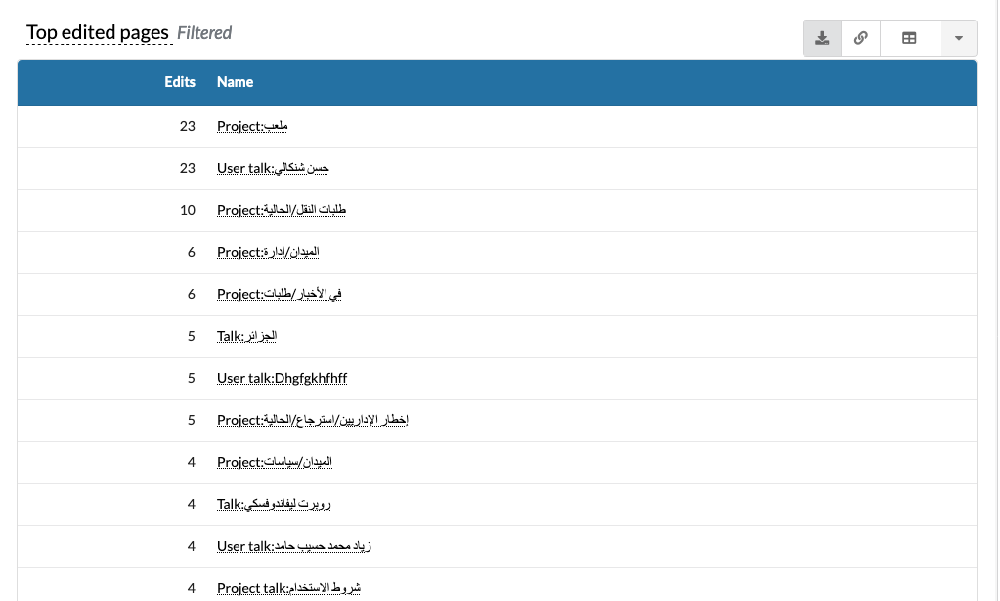

## Egyptian Arabic -- Top Edited Pages --page-type-non-content--editor-type-anonymous:

                        page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                 Talk:اعطنى_الناى     1  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1              Category:سوبر_ماريو     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                             ...   ...                       ...          ...                       ...                       ...                       ...
9   User talk:خالد_محمود_بدوي_دومه    10  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
10               User:10Samuel9999    11  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:0

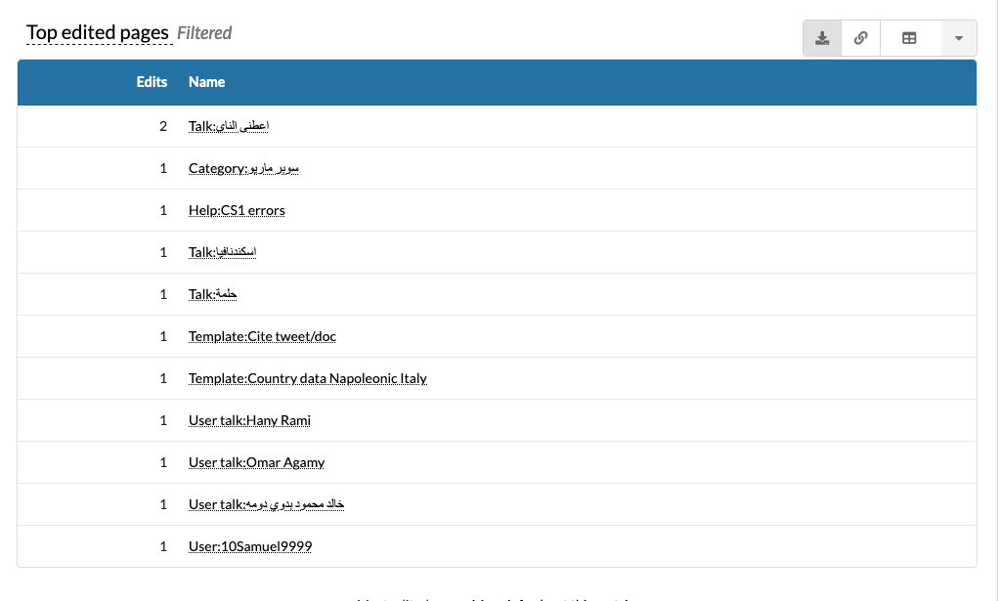

## Moroccan Arabic -- Top Edited Pages --page-type-non-content--editor-type-anonymous:

      page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0  Project:زريعة     1  2022-06-01T00:00:00.000Z            1  2022-06-01T00:00:00.000Z  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z
1   Talk:المغريب     2  2022-06-01T00:00:00.000Z            1  2022-06-01T00:00:00.000Z  2022-06-01T00:00:00.000Z  2022-07-01T00:00:00.000Z


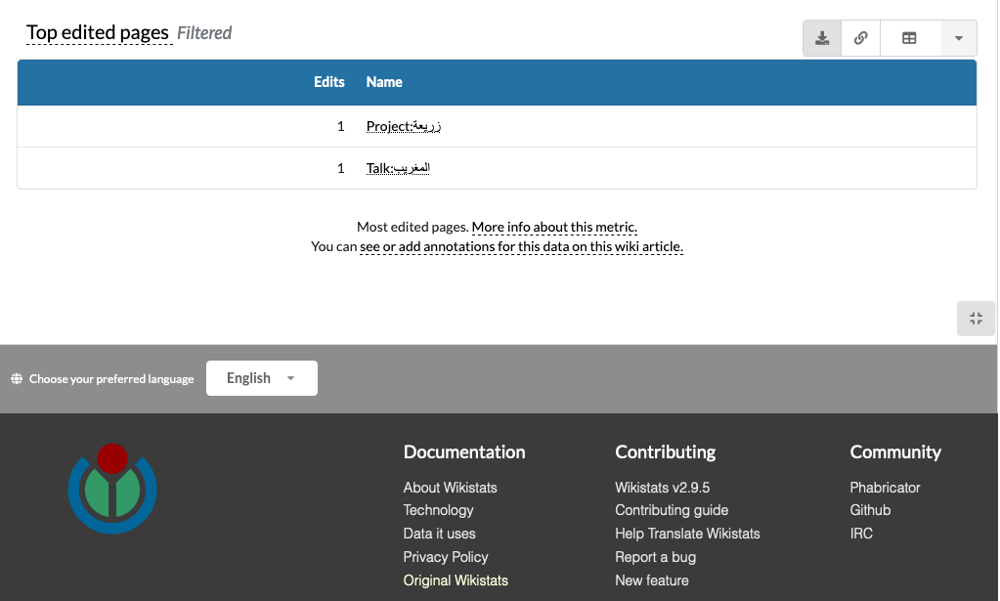

In [62]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~anonymous+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-non-content--editor-type-anonymous--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-non-content--editor-type-anonymous--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-non-content--editor-type-anonymous:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.6. Top Edited Pages `--page-type-non-content--editor-type-group-bot`:

## English -- Top Edited Pages --page-type-non-content--editor-type-group-bot:

                                                    page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                                       User:AmandaNP/UAA/Time     1  2022-07-01T00:00:00.000Z         4458  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1         Project:Administrator_intervention_against_vandalism     2  2022-07-01T00:00:00.000Z         3124  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                         ...   ...                       ...          ...                       ...                       ...                       ...
98  Project:Categories_for_discussion/Old_unclosed_discussions    99  2022-07-01T00:00:00.000Z          114  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:0

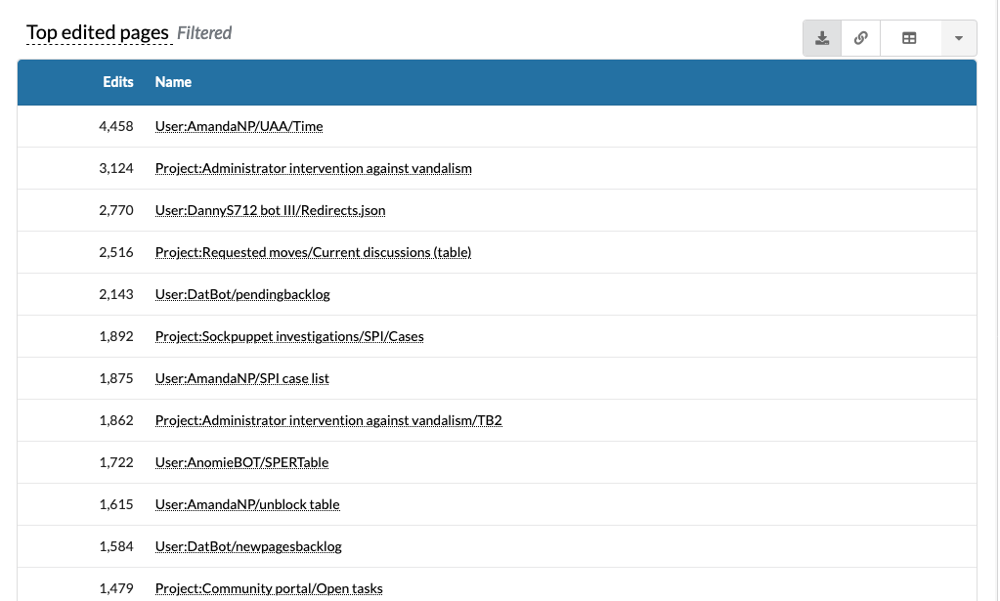

## Arabic -- Top Edited Pages --page-type-non-content--editor-type-group-bot:

                                    page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           Talk:وادي_الكهوف_القديمة_في_الكرمل     1  2022-07-01T00:00:00.000Z          684  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                              Talk:إستر_ليفيت     2  2022-07-01T00:00:00.000Z           66  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                         ...   ...                       ...          ...                       ...                       ...                       ...
98  Project:مشروع_ويكي_الصيانة/بدون_إنترويكي/خ    99  2022-07-01T00:00:00.000Z           11  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Project:مشروع_ويكي_الصيانة/بدون_إنترويكي/ط   100  2022-07-01T00:00:

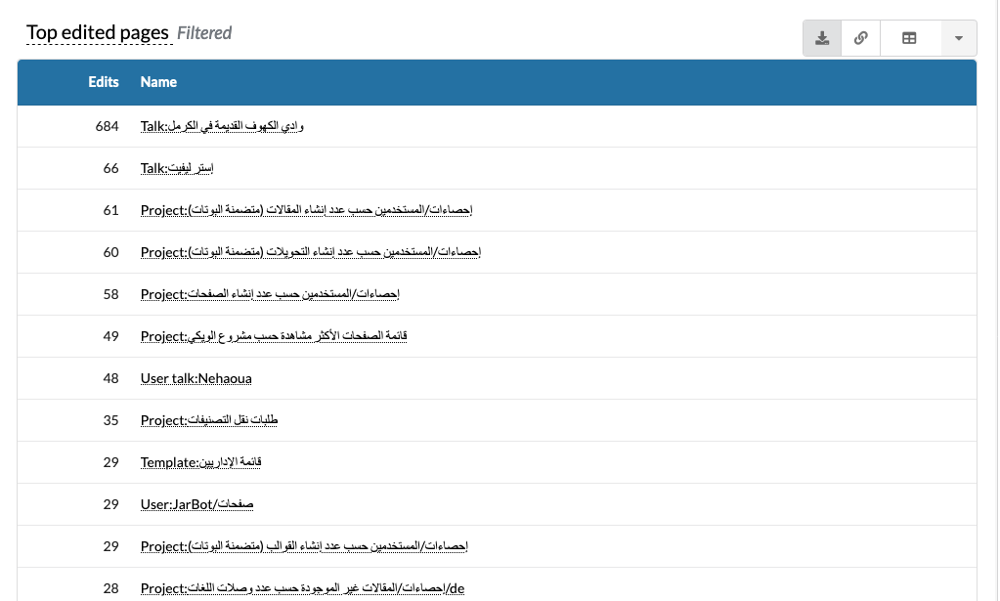

## Egyptian Arabic -- Top Edited Pages --page-type-non-content--editor-type-group-bot:

                                   page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0               User talk:Asmaa_abdelrazek_99     1  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Category:جولة_اتحاد_لعيبة_التنس_المحترفين     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                        ...   ...                       ...          ...                       ...                       ...                       ...
98                User talk:Siochanakwakuvi16    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                          User talk:Liu1214   100  2022-07-01T00:

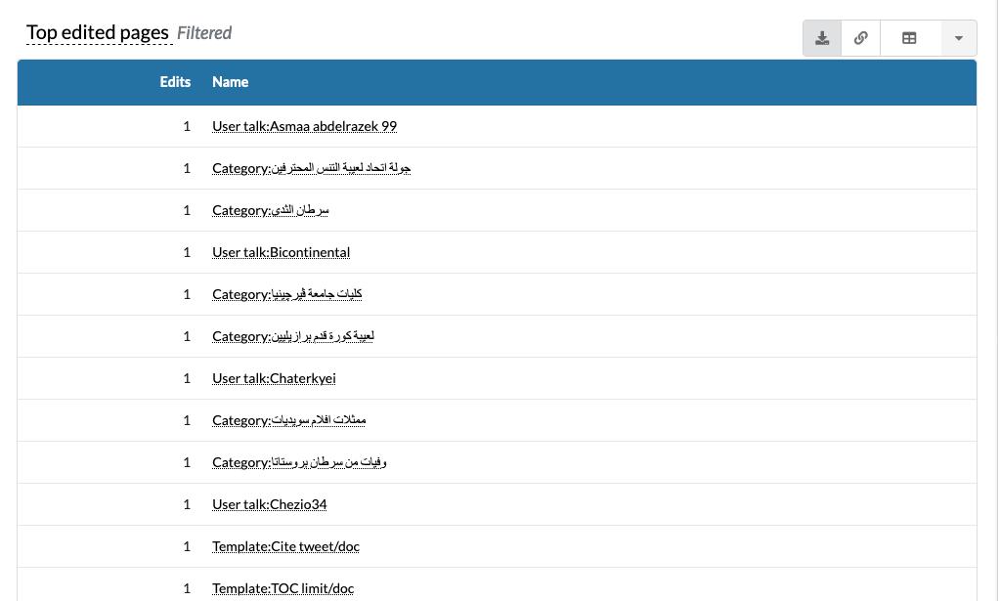

## Moroccan Arabic -- Top Edited Pages --page-type-non-content--editor-type-group-bot:

                                          page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Template:تضمين_ديال_ترتيب_د_لكتاتبيا_ف_صفحة_لولة     1  2022-07-01T00:00:00.000Z           32  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                   Template:حساب_د_لمقالات_د_لمغريب     2  2022-07-01T00:00:00.000Z           13  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                               ...   ...                       ...          ...                       ...                       ...                       ...
98               Template:ناس_توفاو_ف_160_قبل_لميلاد    99  2022-07-01T00:00:00.000Z            2  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99               Template:حوايج_

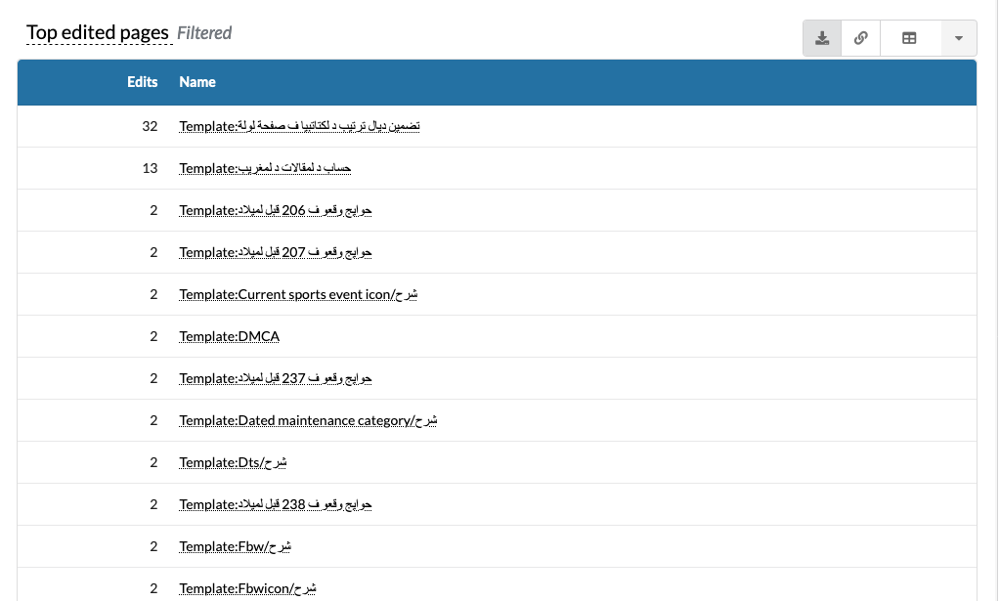

In [63]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~group-bot+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-non-content--editor-type-group-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-non-content--editor-type-group-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-non-content--editor-type-group-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

##### 4.7. Top Edited Pages `--page-type-non-content--editor-type-name-bot`:

## English -- Top Edited Pages --page-type-non-content--editor-type-name-bot:

                                       page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                                User:JPxG/Oracle     1  2022-07-01T00:00:00.000Z         2944  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                        User:JPxG/Oracle/2022-07     2  2022-07-01T00:00:00.000Z         2943  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                            ...   ...                       ...          ...                       ...                       ...                       ...
98                       User talk:106.68.247.212    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99  Draft talk:Webster_First_Federal_Credit_Union   100 

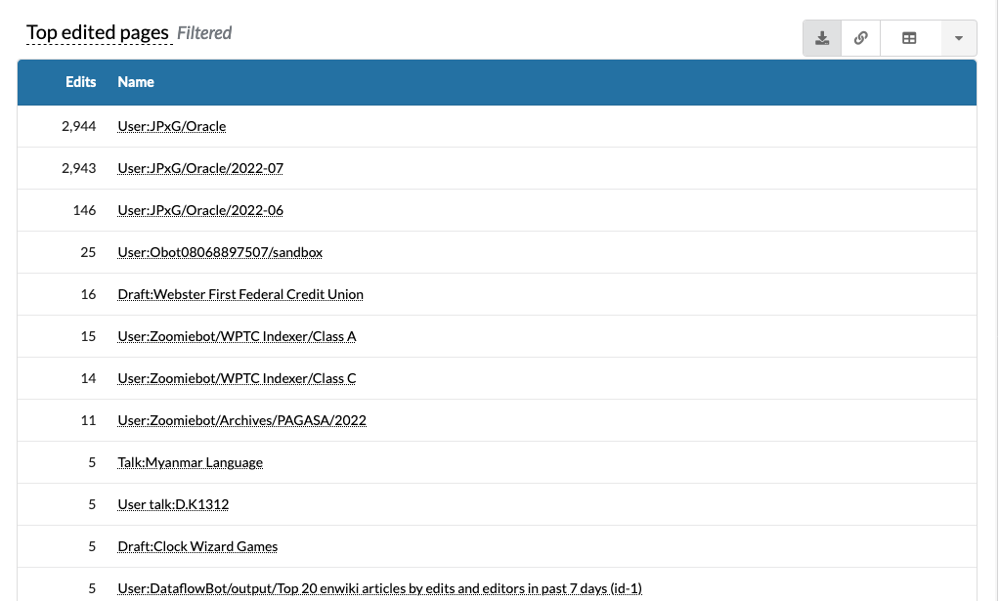

## Arabic -- Top Edited Pages --page-type-non-content--editor-type-name-bot:

                               page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0           Project:طلبات_مراجعة_المقالات     1  2022-07-01T00:00:00.000Z            4  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1  Project:تغيير_اسم_المستخدم/طلبات_تغيير     2  2022-07-01T00:00:00.000Z            3  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
2                Category:خادم_ماين_كرافت     3  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z


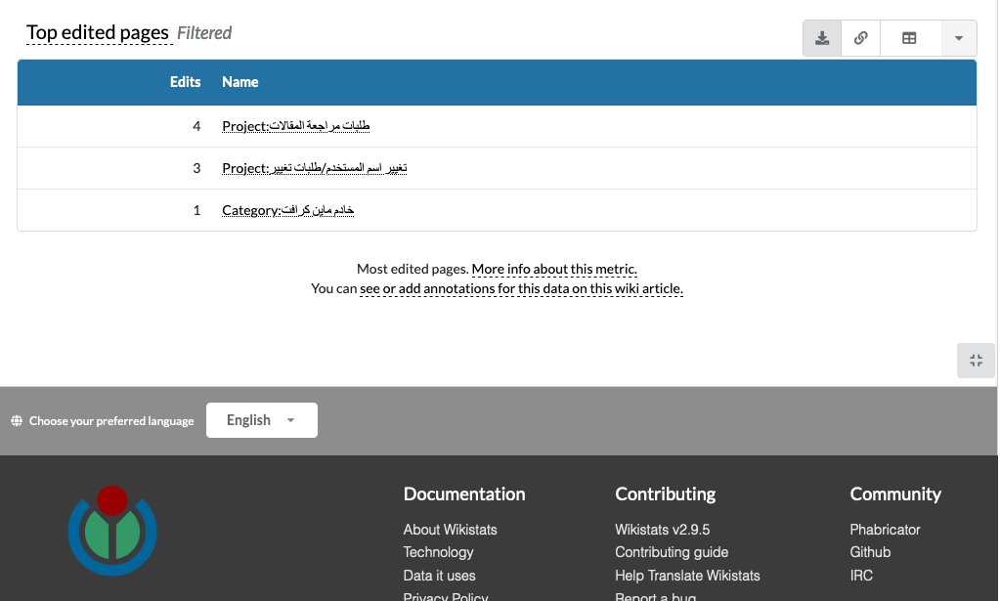

## Egyptian Arabic -- Top Edited Pages --page-type-non-content--editor-type-name-bot:

                        page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          Category:اصحاب_كباريهات     1  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                Category:كباريهات     2  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                             ...   ...                       ...          ...                       ...                       ...                       ...
16              User talk:Ts123321    17  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
17  User talk:UnsereEntarteteKunst    18  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00

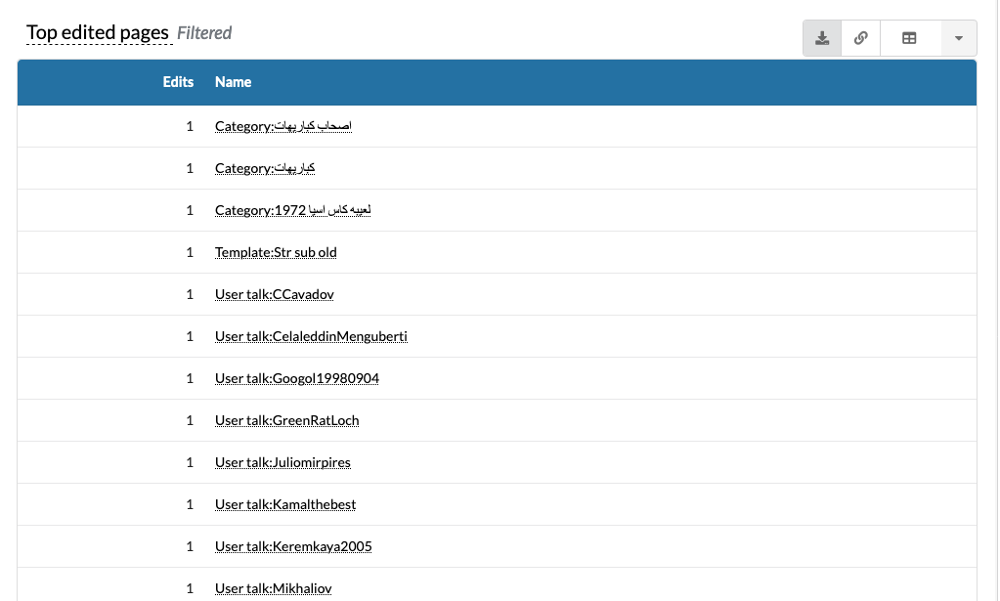

## Moroccan Arabic -- Top Edited Pages --page-type-non-content--editor-type-name-bot:

* There is no data available for this date range on this project.
  + An empty CSV file has been created.


In [64]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~name-bot+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-non-content--editor-type-name-bot--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-non-content--editor-type-name-bot--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-non-content--editor-type-name-bot:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
        
    except:
        print('* There is no data available for this date range on this project.')
        
        print('  + An empty CSV file has been created.')
        data = {'page_title':[''], 'rank':[''], 'timestamp':[''], 'total.total':[''], 'month':[''], 'timeRange.start':[''], 'timeRange.end':['']}
        emptyCSV = pandas.DataFrame(data)
        emptyCSV.to_csv(csvName, index=False)

##### 4.8. Top Edited Pages `--page-type-non-content--editor-type-user`:

## English -- Top Edited Pages --page-type-non-content--editor-type-user:

                                              page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0          Project:Administrators'_noticeboard/Incidents     1  2022-07-01T00:00:00.000Z         3685  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1   Project:Administrator_intervention_against_vandalism     2  2022-07-01T00:00:00.000Z         3636  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                   ...   ...                       ...          ...                       ...                       ...                       ...
98                User:Tewdar/sandbox/Cornish_Bronze_Age    99  2022-07-01T00:00:00.000Z          321  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                       

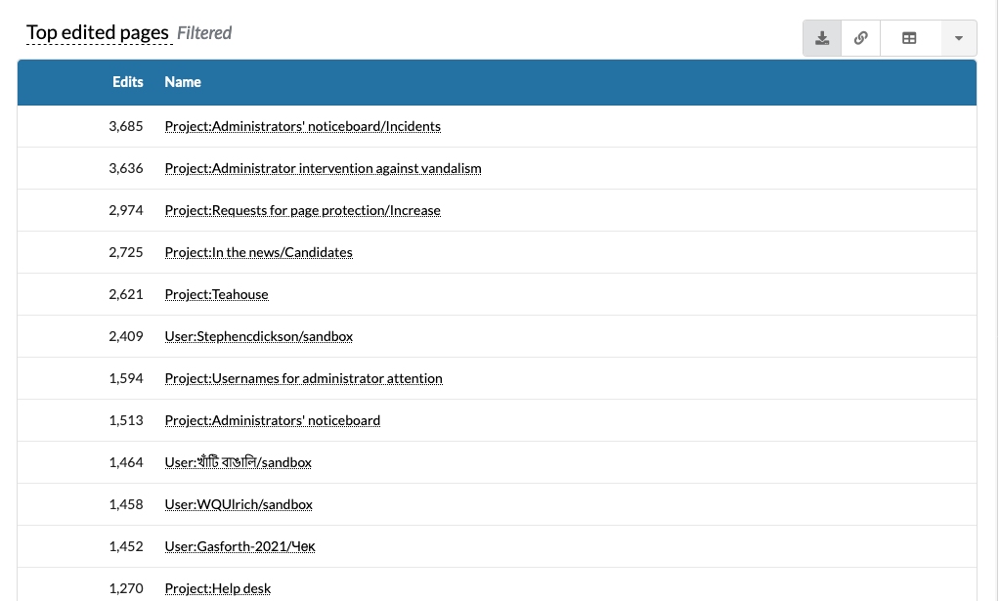

## Arabic -- Top Edited Pages --page-type-non-content--editor-type-user:

                                 page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Project:إخطار_الإداريين/استرجاع/الحالية     1  2022-07-01T00:00:00.000Z          448  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1             Project:طلبات_مراجعة_المقالات     2  2022-07-01T00:00:00.000Z          430  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                      ...   ...                       ...          ...                       ...                       ...                       ...
98                  User talk:Wisam_yazeedo    99  2022-07-01T00:00:00.000Z           19  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                         User:Ayhss/ملعب2   100  2022-07-01T00:00:00.000Z           19  2

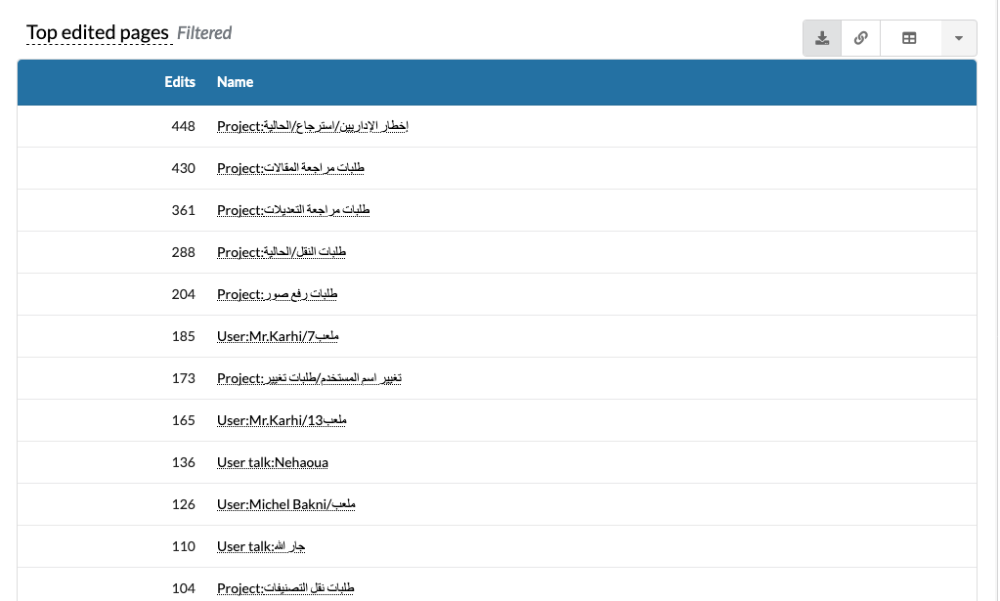

## Egyptian Arabic -- Top Edited Pages --page-type-non-content--editor-type-user:

                           page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0                Project:احداث_دلوقتى     1  2022-07-01T00:00:00.000Z           37  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1               User talk:HitomiAkane     2  2022-07-01T00:00:00.000Z           33  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                ...   ...                       ...          ...                       ...                       ...                       ...
98  Category:راهب_بوذى_من_زو_الشماليه    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99          Category:تربوى_من_هينريخس   100  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  20

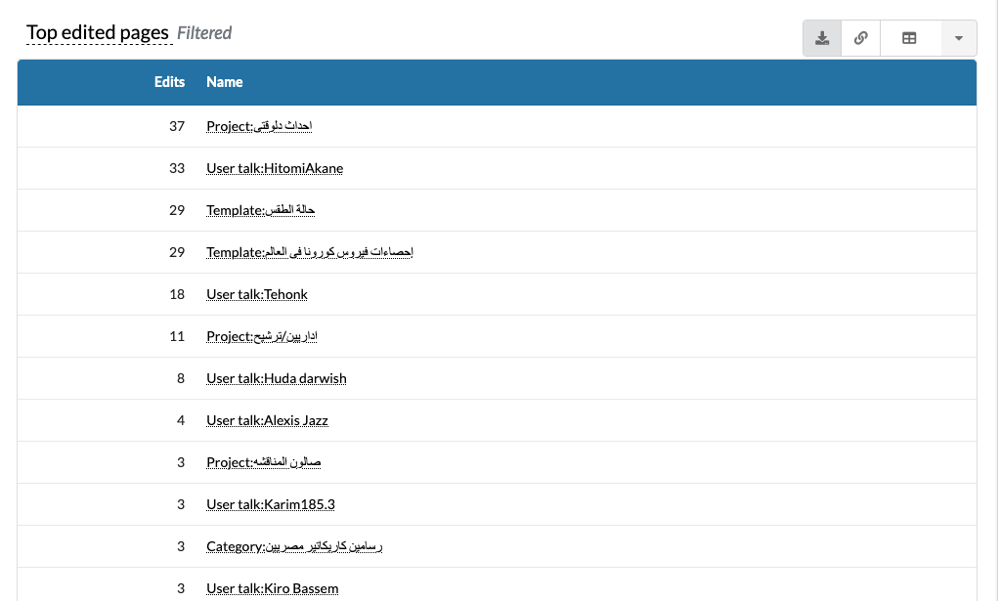

## Moroccan Arabic -- Top Edited Pages --page-type-non-content--editor-type-user:

                                            page_title  rank                 timestamp  total.total                     month           timeRange.start             timeRange.end
0   Template:كاس_إفريقيا_د_لكورة_د_لعيالات_2022_ݣروپات     1  2022-07-01T00:00:00.000Z           38  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
1                                  Project:ميزان_لكلام     2  2022-07-01T00:00:00.000Z           14  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
..                                                 ...   ...                       ...          ...                       ...                       ...                       ...
98                            File:KtbStar_400x400.png    99  2022-07-01T00:00:00.000Z            1  2022-07-01T00:00:00.000Z  2022-07-01T00:00:00.000Z  2022-08-01T00:00:00.000Z
99                         

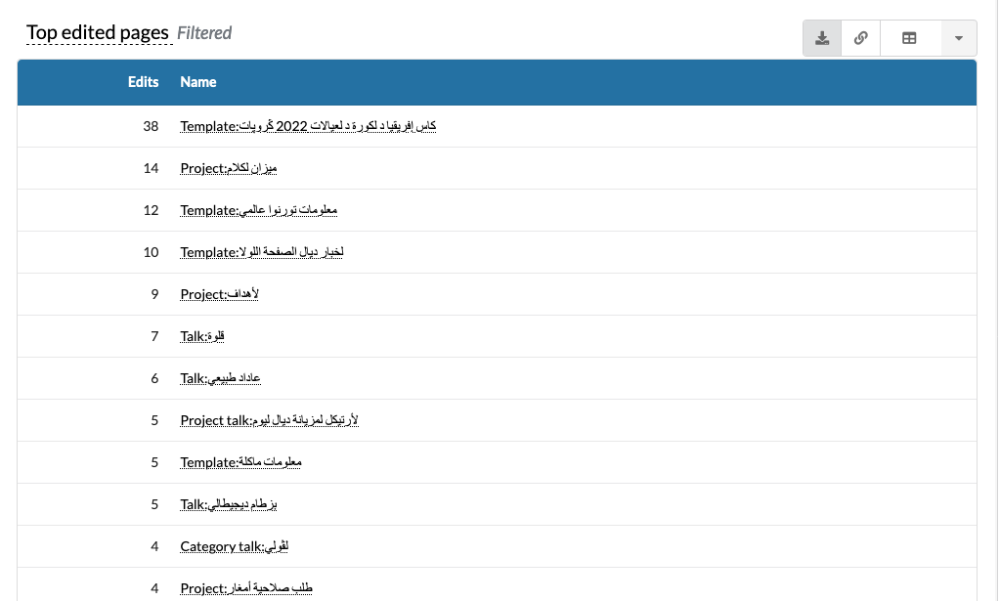

In [65]:
for wiki in wikis:
    driver = webdriver.Firefox(options=options, firefox_profile=profile, executable_path='geckodriver')
    driver.set_window_position(0, 0)
    driver.set_window_size(1920, 1080)
    driver.get(f'https://stats.wikimedia.org/#/{wiki}.wikipedia.org/contributing/top-edited-pages/full|table|last-month|(editor_type)~user+(page_type)~non-content|monthly')
    sleep(3) ; imageName = f"Wikimedia-Stats-PNGs/top-edited-pages--page-type-non-content--editor-type-user--{wiki}.png"
    driver.get_screenshot_as_file(imageName)
        
    csvName = f"Wikimedia-Stats-CSVs/top-edited-pages--page-type-non-content--editor-type-user--{wiki}.csv"
    print(f"\033[1m## {wikis[wiki]} -- Top Edited Pages --page-type-non-content--editor-type-user:\033[0m\n")
    
    try:
        driver.find_element_by_class_name("ui.icon.button.tooltipped.tooltipped-n").click()
        sleep(5) ; os.rename("Wikimedia-Stats-CSVs/undefined.csv", csvName)

        image = pilImage.open(imageName)
        x1 , y1 =  452 , 215
        x2 , y2 = 1475 , 830
        cropped = image.crop((x1, y1, x2, y2))
        cropped.save(imageName)

        readcsv = pandas.read_csv(csvName)
        print(readcsv.to_string(max_rows=5))
        display(pyImage(filename=imageName))
    except:
        print('\t* There is no data available for this date range on this project.')

## * What's Next?!

### # Number of Extracted Files:

In [66]:
! ls Wikimedia-Stats-CSVs/*.csv | echo '* Number of Extracted CSV Files =' `wc -l`
! ls Wikimedia-Stats-PNGs/*.png | echo '* Number of Extracted Images Files =' `wc -l`

* Number of Extracted CSV Files = 216
* Number of Extracted Images Files = 216


### # Total Execution Time:

In [67]:
! rm -rf *.log 
end_time = time.time()
print(f'* Total Execution Time: {(end_time-start_time)/60} Minutes.')

* Total Execution Time: 43.36281708081563 Minutes.


### # Wikipedia-Project-1 | Tasks: 

**1. Performing Meta-data Analysis on the extracted CSV files.**

**2. Extracting valuable insights/features from the extracted CSV files.**

**3. Visualizing the extracted valuable insights/features from the CSV files.**

### # Wikipedia-Project-1 | Ideas: 

**1. Generalizing this Jupyter Notebook code into generic classes and functions.**

**2. Publishing the code as a Python package in the Python Package Index (PyPI).**
- This could be a secondary contribution to the Wikipedia-Project-1 paper.
- It would be nice if the Clarkson Open Source Institute (COSI) supported us.